In [1]:
import torch
import time
from typing import Any, Union, List, Tuple, Dict
from torch.utils.data import DataLoader, TensorDataset
# import matplotlib
# matplotlib.use('TkAgg')
import matplotlib.pyplot as plt
import os
import numpy as np
from rbm import RBM
from utils import visualize_rbm, visualize_data, project_points_to_simplex

from load_dataset import MNIST
from dbn import DBN

In [4]:
mnist = MNIST()
train_x, train_y, test_x, test_y = mnist.load_dataset()
train_y = train_y/10.
print('MAE for all 0 selection:', torch.mean(train_x))
batch_size = 100	
prev_cumu_epochs = 0
epochs = 50
datasize = 10000
data_dimension = train_x.shape[1]
train_x = train_x[:datasize]
train_y = train_y[:datasize]
print("The whole dataset has {} data.".format(datasize),
      "The dimension of each data is {}.".format(data_dimension),
      "Batch size is {}.".format(batch_size))

dataset = TensorDataset(train_x, train_y)
data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

MAE for all 0 selection: tensor(0.1323, dtype=torch.float64)
The whole dataset has 10000 data. The dimension of each data is 784. Batch size is 100.


In [5]:
def train_dbn(dbn_model: DBN, index:int, epochs: int, dataloader: DataLoader, 
              savefig: str = None, middle_mode: str = "bernoulli", 
              sigma: float=0.1, learning_rate:float=0.1, 
              lr_decay_factor:float=0.5, lr_no_decay_length:int=100, 
              lr_decay:bool=False, showplot: bool = True):
    """
    Train DBN
    """
    start_time = time.time()
    if (index == 0):
        vn = dbn_model.input_size
    else:
        vn = dbn_model.layers[index-1]
    hn = dbn_model.layers[index]
    if (dbn_model.gaussian_middle):
        if (index == 0):
            input_mode = dbn_model.mode
        else:
            input_mode = middle_mode
    else:
        input_mode = dbn_model.mode
    target_status = False
    if (index == len(dbn_model.layers)-1):
        target_status = dbn_model.gaussian_top
        if (dbn_model.multinomial_top):
            output_mode = "multinomial"
        else:
            output_mode = "bernoulli"
    else:
        output_mode = "bernoulli"
    rbm_savefig = savefig + "rbm_{}/".format(index)
    rbm = RBM(n_components=hn, learning_rate=learning_rate, 
              lr_decay_factor=lr_decay_factor, 
              lr_no_decay_length=lr_no_decay_length, 
              batch_size=dbn_model.batch_size, n_iter=epochs, verbose=0, 
              savefile=rbm_savefig, add_bias=dbn_model.bias, 
              target_in_model=target_status, hybrid=False, 
              input_dist=input_mode, latent_dist=output_mode, 
              target_dist='gaussian')

    if (input_mode == "gaussian"):
        hidden_loader = dbn_model.generate_input_for_layer(index, dataloader)
    else:
        hidden_loader = dbn_model.generate_input_for_layer(index, dataloader, 
                                                           False)
    if (index == 0):
        visible_bias = dbn_model.visible_bias
    else:
        visible_bias = dbn_model.layer_parameters[index-1]["hb"]
    rbm.fit_dataloader(hidden_loader, vn, 1, 
                       components=dbn_model.layer_parameters[index]["W"], 
                       target_components=dbn_model.layer_parameters[index]["tW"], 
                       visible_bias=visible_bias, 
                       hidden_bias=dbn_model.layer_parameters[index]["hb"], 
                       target_bias=dbn_model.layer_parameters[index]["tb"], 
                       sample_size=dbn_model.multinomial_sample_size, 
                       sigma=sigma, 
                       target_sigma=torch.mean(dbn_model.top_sigma).item(), 
                       hybrid_alpha=dbn_model.disc_alpha, showplot=showplot)
    dbn_model.layer_parameters[index]["W"] = torch.tensor(rbm.components_, 
                                                          dtype=torch.float64, 
                                                          device=dbn_model.device)
    dbn_model.layer_parameters[index]["hb"] = torch.tensor(rbm.intercept_hidden_, 
                                                           dtype=torch.float64, 
                                                           device=dbn_model.device)
    dbn_model.layer_parameters[index]["tW"] = torch.tensor(rbm.target_components_, 
                                                           dtype=torch.float64, 
                                                           device=dbn_model.device)
    dbn_model.layer_parameters[index]["tb"] = torch.tensor(rbm.intercept_target_, 
                                                           dtype=torch.float64, 
                                                           device=dbn_model.device)
    if (index == 0):
        dbn_model.visible_bias = torch.tensor(rbm.intercept_visible_, 
                                              dtype=torch.float64, 
                                              device=dbn_model.device)
    else:
        dbn_model.layer_parameters[index-1]["hb"] = torch.tensor(rbm.intercept_visible_, 
                                                                 dtype=torch.float64, 
                                                                 device=dbn_model.device)
    dbn_model.top_parameters["TW"] = torch.tensor(rbm.target_components_, 
                                                  dtype=torch.float64, 
                                                  device=dbn_model.device)
    dbn_model.top_parameters["Tb"] = torch.tensor(rbm.intercept_target_, 
                                                  dtype=torch.float64, 
                                                  device=dbn_model.device)

    print("Finished Training Layer", index, "to", index+1)
    end_time = time.time()
    print("Time taken for training DBN layer", index, "to", index+1, "is", 
          end_time-start_time, "seconds")
    visualize_rbm(rbm, hidden_loader, index, savefig, showplot)
    return dbn_model

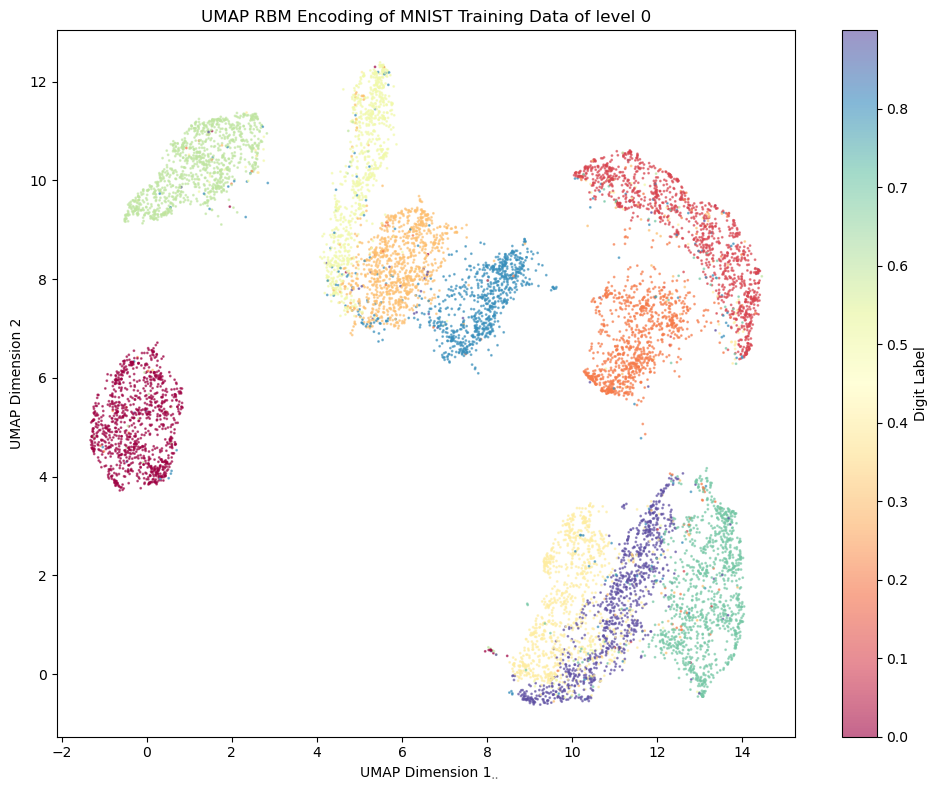

In [6]:
visualize_data(data_loader, 0, "..", True)

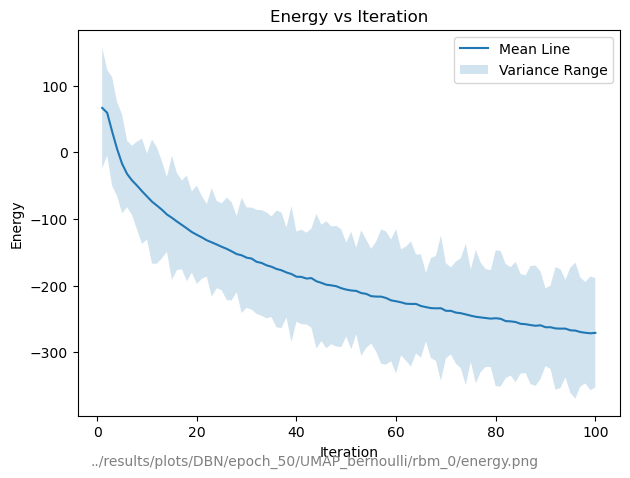

Finished Training Layer 0 to 1
Time taken for training DBN layer 0 to 1 is 435.969523191452 seconds


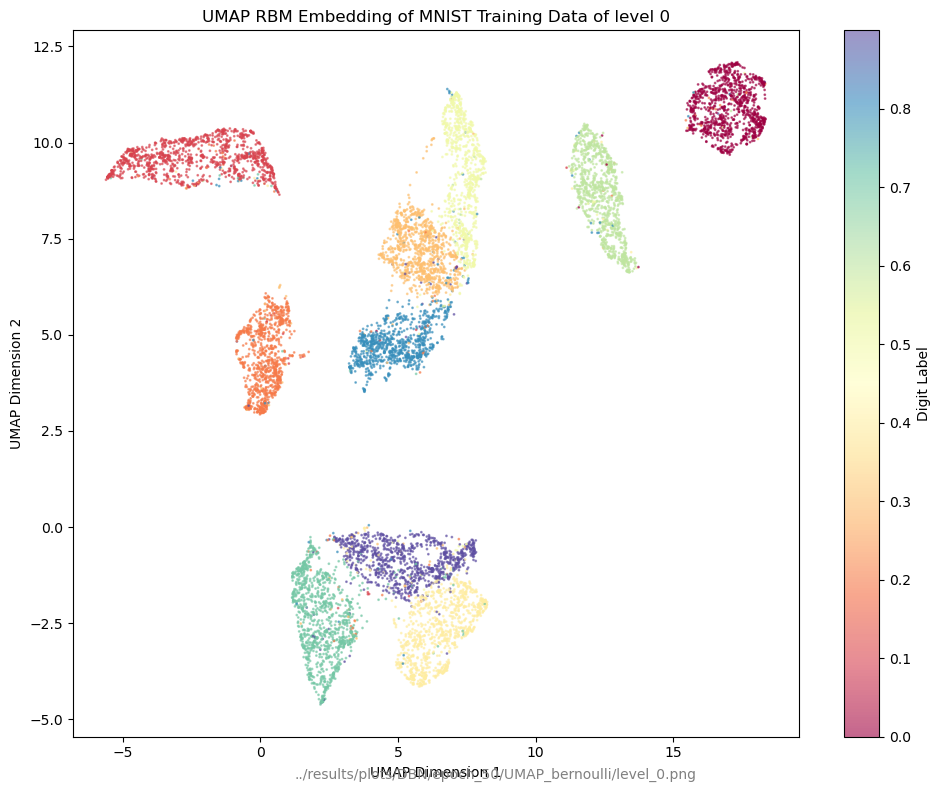

In [7]:
experiment = "bernoulli"
directory = "../results/plots/DBN/epoch_{}/".format(epochs + prev_cumu_epochs)
experi_type = experiment
directory = directory + "UMAP_" + experi_type + "/"
filename = "dbn_debug_" + experi_type + ".pth"
if not os.path.exists(directory):
    os.makedirs(directory)
if (experiment == "bernoulli"):
    dbn_b = DBN(data_dimension, layers=[1000, 500, 300], batch_size=batch_size, 
                epochs = epochs, savefile=filename, mode = "bernoulli", 
                multinomial_top = False, multinomial_sample_size = 10, 
                bias = False, k = 50, gaussian_top = False, 
                top_sigma = 0.1*torch.ones((1,)), sigma = None, disc_alpha = 1., 
                gaussian_middle = False)
    dbn_g = DBN(data_dimension, layers=[1000, 500, 300], batch_size=batch_size, 
                epochs = epochs, savefile=filename, mode = "bernoulli", 
                multinomial_top = False, multinomial_sample_size = 10, 
                bias = False, k = 50, gaussian_top = False, 
                top_sigma = 0.1*torch.ones((1,)), sigma = None, disc_alpha = 1., 
                gaussian_middle = True)
elif (experiment == "bernoulli_label"):
    dbn_b = DBN(data_dimension, layers=[1000, 500, 300], batch_size=batch_size, 
                epochs = epochs, savefile=filename, mode = "bernoulli", 
                multinomial_top = False, multinomial_sample_size = 10, 
                bias = False, k = 50, gaussian_top = True, 
                top_sigma = 0.1*torch.ones((1,)), sigma = None, disc_alpha = 1., 
                gaussian_middle = False)
    dbn_g = DBN(data_dimension, layers=[1000, 500, 300], batch_size=batch_size, 
                epochs = epochs, savefile=filename, mode = "bernoulli", 
                multinomial_top = False, multinomial_sample_size = 10, 
                bias = False, k = 50, gaussian_top = True, 
                top_sigma = 0.1*torch.ones((1,)), sigma = None, disc_alpha = 1., 
                gaussian_middle = True)
elif (experiment == "multinomial"):
    dbn_b = DBN(data_dimension, layers=[1000, 500, 300], batch_size=batch_size, 
                epochs = epochs, savefile=filename, mode = "bernoulli", 
                multinomial_top = True, multinomial_sample_size = 10, 
                bias = False, k = 50, gaussian_top = False, 
                top_sigma = 0.1*torch.ones((1,)), sigma = None, disc_alpha = 1., 
                gaussian_middle = False)
    dbn_g = DBN(data_dimension, layers=[1000, 500, 300], batch_size=batch_size, 
                epochs = epochs, savefile=filename, mode = "bernoulli", 
                multinomial_top = True, multinomial_sample_size = 10, 
                bias = False, k = 50, gaussian_top = False, 
                top_sigma = 0.1*torch.ones((1,)), sigma = None, disc_alpha = 1., 
                gaussian_middle = True)
elif (experiment == "multinomial_label"):
    dbn_b = DBN(data_dimension, layers=[1000, 500, 300], batch_size=batch_size, 
                epochs = epochs, savefile=filename, mode = "bernoulli", 
                multinomial_top = True, multinomial_sample_size = 10, 
                bias = False, k = 50, gaussian_top = True, 
                top_sigma = 0.1*torch.ones((1,)), sigma = None, disc_alpha = 1., 
                gaussian_middle = False)
    dbn_g = DBN(data_dimension, layers=[1000, 500, 300], batch_size=batch_size, 
                epochs = epochs, savefile=filename, mode = "bernoulli", 
                multinomial_top = True, multinomial_sample_size = 10, 
                bias = False, k = 50, gaussian_top = True, 
                top_sigma = 0.1*torch.ones((1,)), sigma = None, disc_alpha = 1., 
                gaussian_middle = True)
else:
    raise ValueError("Invalid Experiment Type")

dbn_g0 = train_dbn(dbn_g, 0, 100, data_loader, directory, "bernoulli", 0.1, 
                   0.0001, 0.5, 100, False)


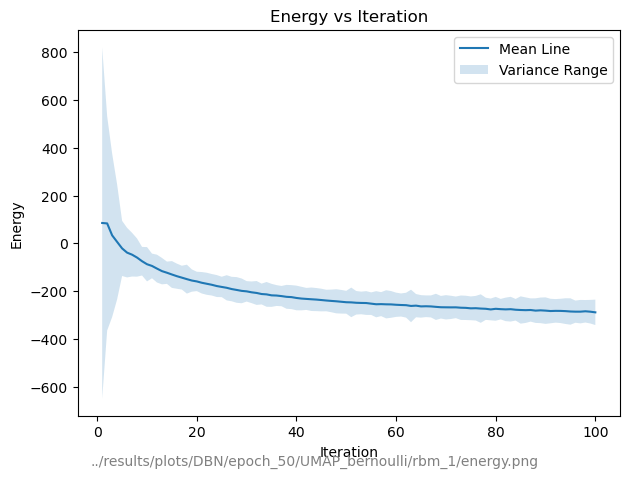

Finished Training Layer 1 to 2
Time taken for training DBN layer 1 to 2 is 264.76425075531006 seconds


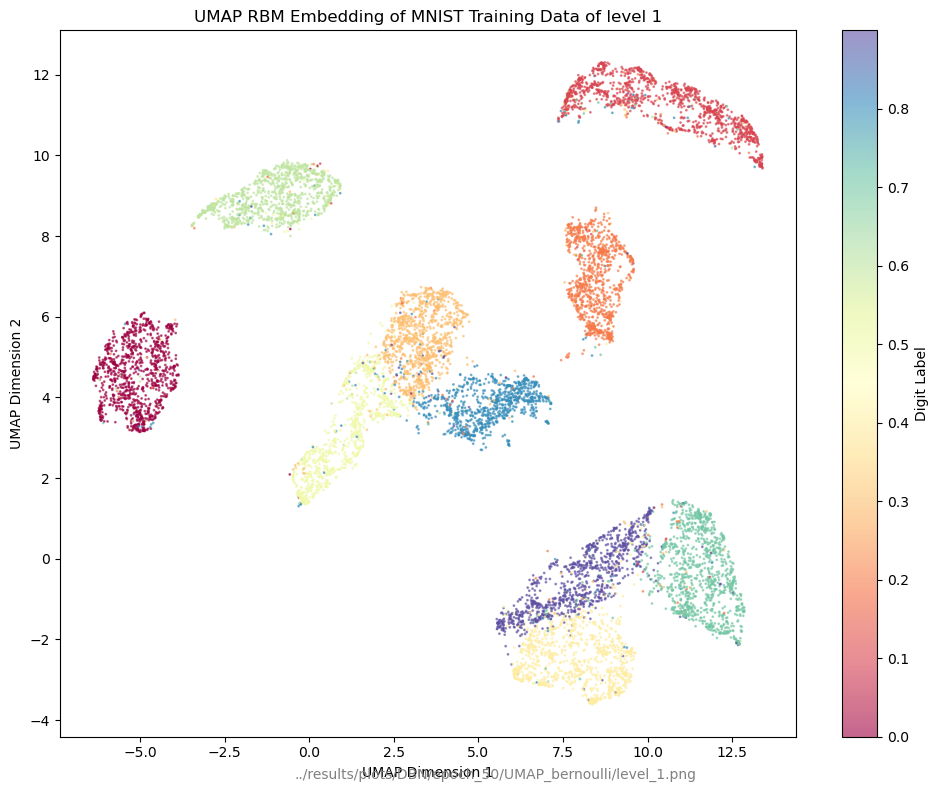

In [8]:
dbn_g1 = train_dbn(dbn_g0, 1, 100, data_loader, directory, "bernoulli", 0.1, 0.0001, 0.5, 100, False)

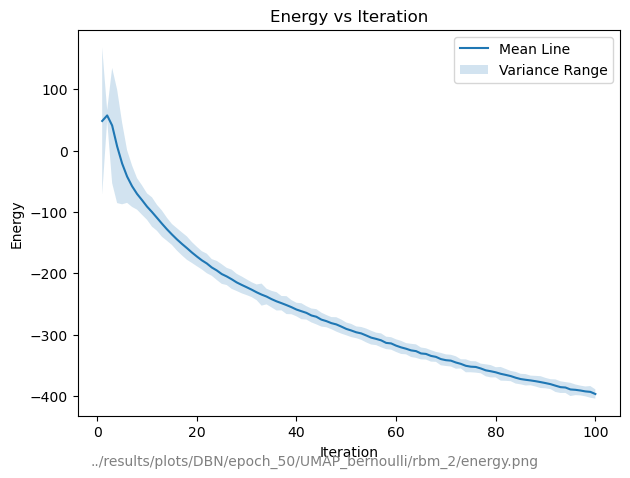

Finished Training Layer 2 to 3
Time taken for training DBN layer 2 to 3 is 129.94127678871155 seconds


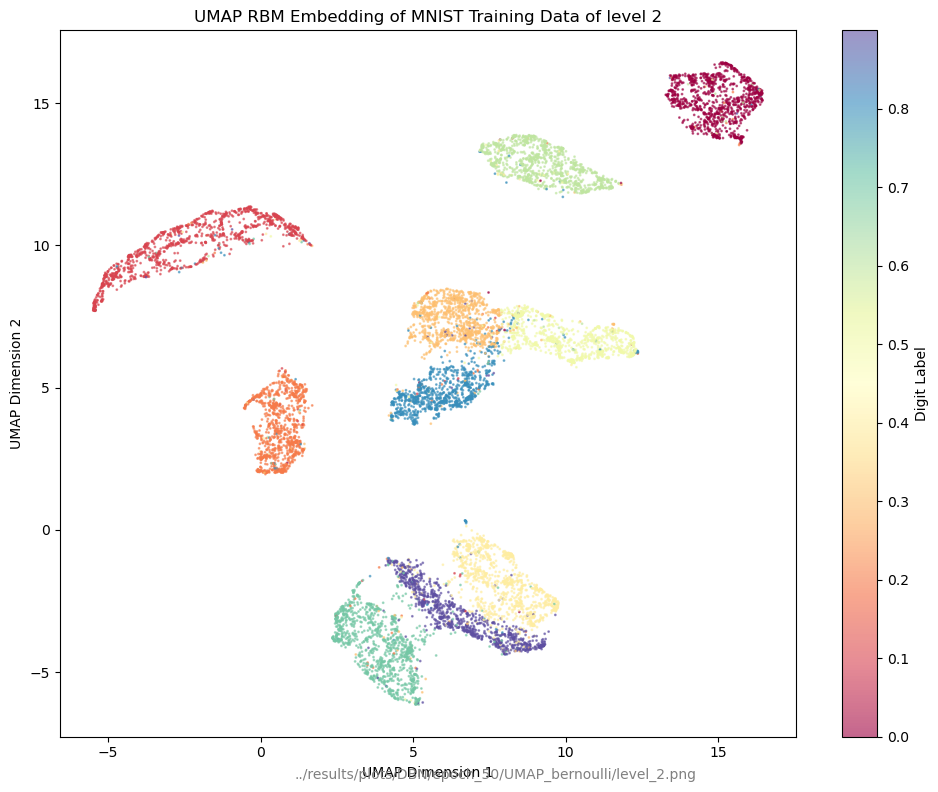

In [9]:
dbn_g2 = train_dbn(dbn_g1, 2, 100, data_loader, directory, "bernoulli", 0.1, 0.0001, 0.5, 100, False)

In [69]:
import importlib
import deepBM  # Make sure to import the module itself
importlib.reload(deepBM)  # Reload the entire module
from deepBM import DBM

In [70]:
epochs = 2000
if (experiment == "bernoulli"):
    dbm = DBM(data_dimension, layers=[1000, 500, 300], batch_size=batch_size, 
              epochs = epochs, savefile=filename, mode = "bernoulli", 
              multinomial_top = False, multinomial_sample_size = 10, 
              bias = False, k = 50, gaussian_top = False, 
              top_sigma = 0.1*torch.ones((1,)), sigma = None, disc_alpha = 1.)
elif (experiment == "bernoulli_label"):
    dbm = DBM(data_dimension, layers=[1000, 500, 300], batch_size=batch_size, 
              epochs = epochs, savefile=filename, mode = "bernoulli", 
              multinomial_top = False, multinomial_sample_size = 10, 
              bias = False, k = 50, gaussian_top = True, 
              top_sigma = 0.1*torch.ones((1,)), sigma = None, disc_alpha = 1.)
elif (experiment == "multinomial"):
    dbm = DBM(data_dimension, layers=[1000, 500, 300], batch_size=batch_size, 
              epochs = epochs, savefile=filename, mode = "bernoulli", 
              multinomial_top = True, multinomial_sample_size = 10, 
              bias = False, k = 50, gaussian_top = False, 
              top_sigma = 0.1*torch.ones((1,)), sigma = None, disc_alpha = 1.)
elif (experiment == "multinomial_label"):
    dbm = DBM(data_dimension, layers=[1000, 500, 300], batch_size=batch_size, 
              epochs = epochs, savefile=filename, mode = "bernoulli", 
              multinomial_top = True, multinomial_sample_size = 10, 
              bias = False, k = 50, gaussian_top = True, 
              top_sigma = 0.1*torch.ones((1,)), sigma = None, disc_alpha = 1.)

Starting...:   0%|                                     | 0/2000 [00:40<?, ?it/s]

Time taken for DBM epoch 0 is 40.88003134727478


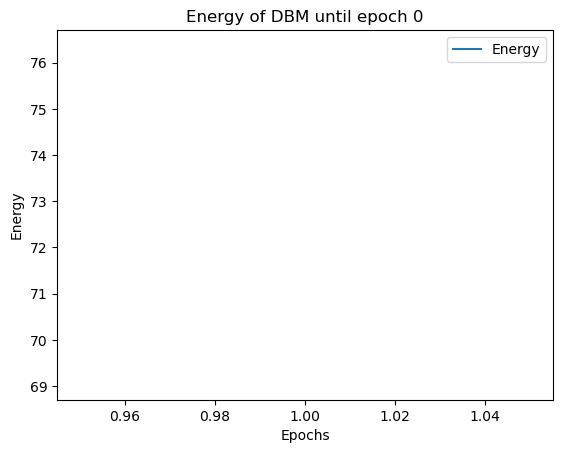

Starting...:   0%|                          | 2/2000 [01:23<23:08:30, 41.70s/it]

Time taken for DBM epoch 1 is 42.208250522613525


Starting...:   0%|                          | 3/2000 [02:06<23:36:23, 42.56s/it]

Time taken for DBM epoch 2 is 43.576353549957275


Starting...:   0%|                          | 4/2000 [02:50<23:49:33, 42.97s/it]

Time taken for DBM epoch 3 is 43.612090826034546


Starting...:   0%|                          | 5/2000 [03:34<24:03:20, 43.41s/it]

Time taken for DBM epoch 4 is 44.18187165260315


Starting...:   0%|                          | 6/2000 [04:19<24:16:45, 43.83s/it]

Time taken for DBM epoch 5 is 44.65882754325867


Starting...:   0%|                          | 7/2000 [05:04<24:27:46, 44.19s/it]

Time taken for DBM epoch 6 is 44.91653299331665


Starting...:   0%|                          | 8/2000 [05:49<24:37:34, 44.51s/it]

Time taken for DBM epoch 7 is 45.18358063697815


Starting...:   0%|                          | 9/2000 [06:34<24:40:36, 44.62s/it]

Time taken for DBM epoch 8 is 44.86942005157471


Starting...:   0%|▏                        | 10/2000 [07:19<24:45:32, 44.79s/it]

Time taken for DBM epoch 9 is 45.17361664772034


Starting...:   0%|▏                        | 10/2000 [08:04<24:45:32, 44.79s/it]

Time taken for DBM epoch 10 is 45.288012742996216


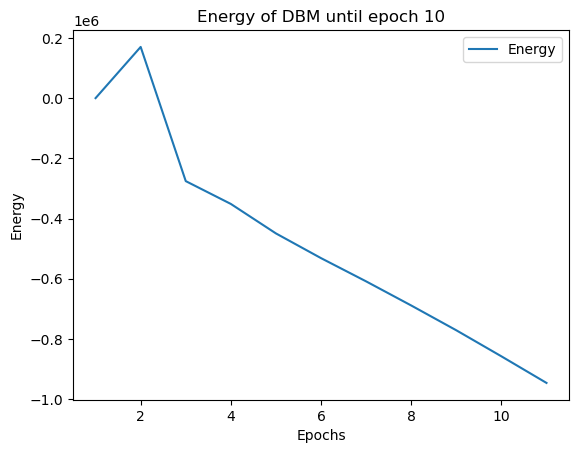

Starting...:   1%|▏                        | 12/2000 [08:49<24:51:59, 45.03s/it]

Time taken for DBM epoch 11 is 45.15172481536865


Starting...:   1%|▏                        | 13/2000 [09:35<24:54:53, 45.14s/it]

Time taken for DBM epoch 12 is 45.39390301704407


Starting...:   1%|▏                        | 14/2000 [10:20<24:59:08, 45.29s/it]

Time taken for DBM epoch 13 is 45.63960003852844


Starting...:   1%|▏                        | 15/2000 [11:06<25:02:37, 45.42s/it]

Time taken for DBM epoch 14 is 45.71603035926819


Starting...:   1%|▏                        | 16/2000 [11:52<25:01:12, 45.40s/it]

Time taken for DBM epoch 15 is 45.35291624069214


Starting...:   1%|▏                        | 17/2000 [12:37<25:04:47, 45.53s/it]

Time taken for DBM epoch 16 is 45.835256576538086


Starting...:   1%|▏                        | 18/2000 [13:23<25:07:31, 45.64s/it]

Time taken for DBM epoch 17 is 45.88190746307373


Starting...:   1%|▏                        | 19/2000 [14:09<25:07:23, 45.66s/it]

Time taken for DBM epoch 18 is 45.69921374320984


Starting...:   1%|▎                        | 20/2000 [14:55<25:06:02, 45.64s/it]

Time taken for DBM epoch 19 is 45.59506440162659


Starting...:   1%|▎                        | 20/2000 [15:40<25:06:02, 45.64s/it]

Time taken for DBM epoch 20 is 45.50820207595825


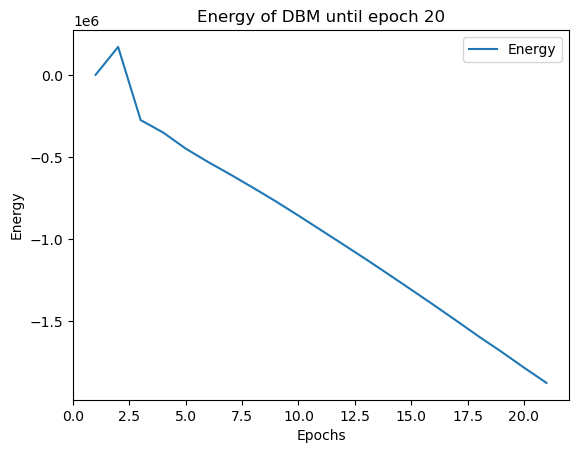

Starting...:   1%|▎                        | 22/2000 [16:26<25:03:35, 45.61s/it]

Time taken for DBM epoch 21 is 45.565953493118286


Starting...:   1%|▎                        | 23/2000 [17:11<25:04:37, 45.66s/it]

Time taken for DBM epoch 22 is 45.79014468193054


Starting...:   1%|▎                        | 24/2000 [17:57<25:06:33, 45.75s/it]

Time taken for DBM epoch 23 is 45.93582773208618


Starting...:   1%|▎                        | 25/2000 [18:43<25:07:42, 45.80s/it]

Time taken for DBM epoch 24 is 45.93876886367798


Starting...:   1%|▎                        | 26/2000 [19:29<25:07:49, 45.83s/it]

Time taken for DBM epoch 25 is 45.89356732368469


Starting...:   1%|▎                        | 27/2000 [20:15<25:09:34, 45.91s/it]

Time taken for DBM epoch 26 is 46.08528518676758


Starting...:   1%|▎                        | 28/2000 [21:02<25:12:48, 46.03s/it]

Time taken for DBM epoch 27 is 46.31174397468567


Starting...:   1%|▎                        | 29/2000 [21:48<25:14:30, 46.10s/it]

Time taken for DBM epoch 28 is 46.27882623672485


Starting...:   2%|▍                        | 30/2000 [22:34<25:16:36, 46.19s/it]

Time taken for DBM epoch 29 is 46.39414644241333


Starting...:   2%|▍                        | 30/2000 [23:21<25:16:36, 46.19s/it]

Time taken for DBM epoch 30 is 46.36069893836975


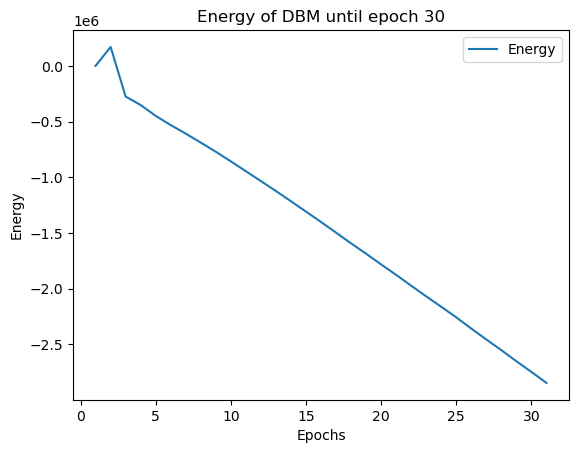

Starting...:   2%|▍                        | 32/2000 [24:07<25:16:34, 46.24s/it]

Time taken for DBM epoch 31 is 46.15581130981445


Starting...:   2%|▍                        | 33/2000 [24:53<25:14:57, 46.21s/it]

Time taken for DBM epoch 32 is 46.1497700214386


Starting...:   2%|▍                        | 34/2000 [25:39<25:13:38, 46.19s/it]

Time taken for DBM epoch 33 is 46.15531396865845


Starting...:   2%|▍                        | 35/2000 [26:25<25:11:54, 46.17s/it]

Time taken for DBM epoch 34 is 46.096614837646484


Starting...:   2%|▍                        | 36/2000 [27:12<25:11:30, 46.18s/it]

Time taken for DBM epoch 35 is 46.201332330703735


Starting...:   2%|▍                        | 37/2000 [27:58<25:10:04, 46.16s/it]

Time taken for DBM epoch 36 is 46.1093852519989


Starting...:   2%|▍                        | 38/2000 [28:44<25:09:06, 46.15s/it]

Time taken for DBM epoch 37 is 46.134756565093994


Starting...:   2%|▍                        | 39/2000 [29:30<25:07:04, 46.11s/it]

Time taken for DBM epoch 38 is 46.02114295959473


Starting...:   2%|▌                        | 40/2000 [30:16<25:06:15, 46.11s/it]

Time taken for DBM epoch 39 is 46.1062707901001


Starting...:   2%|▌                        | 40/2000 [31:02<25:06:15, 46.11s/it]

Time taken for DBM epoch 40 is 46.05832028388977


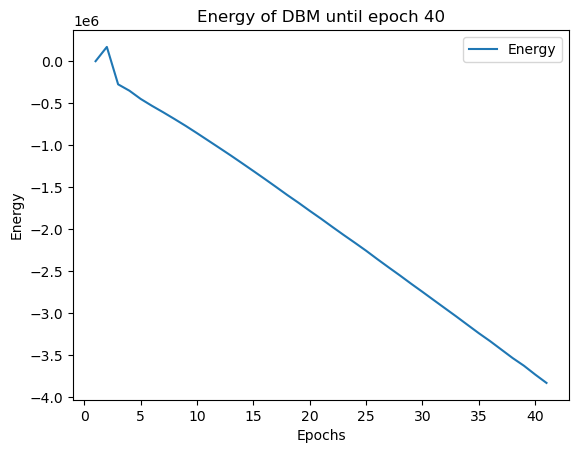

Starting...:   2%|▌                        | 42/2000 [31:48<25:04:55, 46.12s/it]

Time taken for DBM epoch 41 is 46.08629608154297


Starting...:   2%|▌                        | 43/2000 [32:34<25:05:19, 46.15s/it]

Time taken for DBM epoch 42 is 46.234692096710205


Starting...:   2%|▌                        | 44/2000 [33:21<25:07:29, 46.24s/it]

Time taken for DBM epoch 43 is 46.451582193374634


Starting...:   2%|▌                        | 45/2000 [34:07<25:09:56, 46.34s/it]

Time taken for DBM epoch 44 is 46.57094621658325


Starting...:   2%|▌                        | 46/2000 [34:54<25:12:22, 46.44s/it]

Time taken for DBM epoch 45 is 46.667994022369385


Starting...:   2%|▌                        | 47/2000 [35:41<25:13:32, 46.50s/it]

Time taken for DBM epoch 46 is 46.63889956474304


Starting...:   2%|▌                        | 48/2000 [36:27<25:12:31, 46.49s/it]

Time taken for DBM epoch 47 is 46.473122119903564


Starting...:   2%|▌                        | 49/2000 [37:14<25:10:26, 46.45s/it]

Time taken for DBM epoch 48 is 46.356868267059326


Starting...:   2%|▋                        | 50/2000 [38:00<25:08:20, 46.41s/it]

Time taken for DBM epoch 49 is 46.31462907791138


Starting...:   2%|▋                        | 50/2000 [38:46<25:08:20, 46.41s/it]

Time taken for DBM epoch 50 is 46.44372367858887


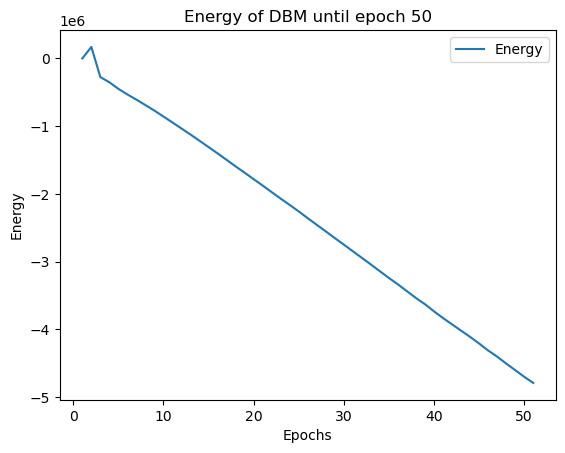

Starting...:   3%|▋                        | 52/2000 [39:33<25:06:13, 46.39s/it]

Time taken for DBM epoch 51 is 46.260881423950195


Starting...:   3%|▋                        | 53/2000 [40:19<25:04:56, 46.38s/it]

Time taken for DBM epoch 52 is 46.33953285217285


Starting...:   3%|▋                        | 54/2000 [41:05<25:03:51, 46.37s/it]

Time taken for DBM epoch 53 is 46.34610438346863


Starting...:   3%|▋                        | 55/2000 [41:52<25:01:44, 46.33s/it]

Time taken for DBM epoch 54 is 46.2291533946991


Starting...:   3%|▋                        | 56/2000 [42:38<25:01:26, 46.34s/it]

Time taken for DBM epoch 55 is 46.37309408187866


Starting...:   3%|▋                        | 57/2000 [43:24<25:02:18, 46.39s/it]

Time taken for DBM epoch 56 is 46.50982475280762


Starting...:   3%|▋                        | 58/2000 [44:11<25:02:57, 46.44s/it]

Time taken for DBM epoch 57 is 46.53667616844177


Starting...:   3%|▋                        | 59/2000 [44:58<25:04:15, 46.50s/it]

Time taken for DBM epoch 58 is 46.649458169937134


Starting...:   3%|▊                        | 60/2000 [45:44<25:04:26, 46.53s/it]

Time taken for DBM epoch 59 is 46.597980976104736


Starting...:   3%|▊                        | 60/2000 [46:31<25:04:26, 46.53s/it]

Time taken for DBM epoch 60 is 46.49663257598877


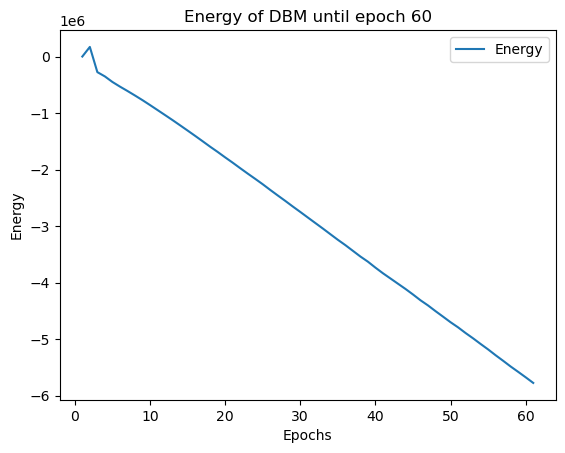

Starting...:   3%|▊                        | 62/2000 [47:17<25:03:16, 46.54s/it]

Time taken for DBM epoch 61 is 46.51727271080017


Starting...:   3%|▊                        | 63/2000 [48:04<25:02:28, 46.54s/it]

Time taken for DBM epoch 62 is 46.537864208221436


Starting...:   3%|▊                        | 64/2000 [48:50<25:01:32, 46.54s/it]

Time taken for DBM epoch 63 is 46.52433705329895


Starting...:   3%|▊                        | 65/2000 [49:37<25:01:32, 46.56s/it]

Time taken for DBM epoch 64 is 46.614245653152466


Starting...:   3%|▊                        | 66/2000 [50:23<24:58:25, 46.49s/it]

Time taken for DBM epoch 65 is 46.31743383407593


Starting...:   3%|▊                        | 67/2000 [51:10<24:54:45, 46.40s/it]

Time taken for DBM epoch 66 is 46.18661665916443


Starting...:   3%|▊                        | 68/2000 [51:56<24:51:52, 46.33s/it]

Time taken for DBM epoch 67 is 46.17863178253174


Starting...:   3%|▊                        | 69/2000 [52:42<24:49:41, 46.29s/it]

Time taken for DBM epoch 68 is 46.1843900680542


Starting...:   4%|▉                        | 70/2000 [53:28<24:47:08, 46.23s/it]

Time taken for DBM epoch 69 is 46.10384225845337


Starting...:   4%|▉                        | 70/2000 [54:14<24:47:08, 46.23s/it]

Time taken for DBM epoch 70 is 46.187195777893066


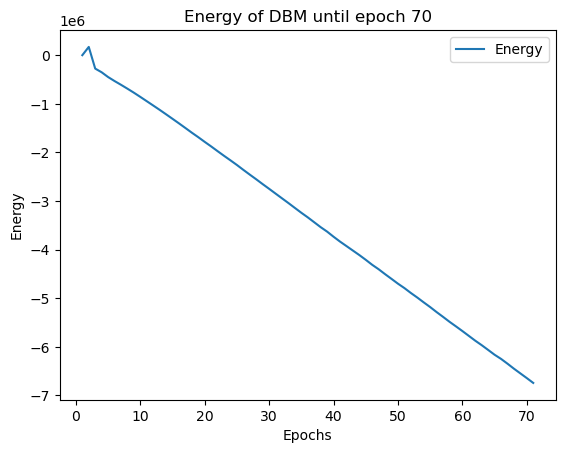

Starting...:   4%|▉                        | 72/2000 [55:00<24:43:56, 46.18s/it]

Time taken for DBM epoch 71 is 46.02004408836365


Starting...:   4%|▉                        | 73/2000 [55:47<24:43:18, 46.19s/it]

Time taken for DBM epoch 72 is 46.19546151161194


Starting...:   4%|▉                        | 74/2000 [56:33<24:41:20, 46.15s/it]

Time taken for DBM epoch 73 is 46.0602490901947


Starting...:   4%|▉                        | 75/2000 [57:19<24:40:37, 46.15s/it]

Time taken for DBM epoch 74 is 46.15306854248047


Starting...:   4%|▉                        | 76/2000 [58:05<24:38:37, 46.11s/it]

Time taken for DBM epoch 75 is 46.020060539245605


Starting...:   4%|▉                        | 77/2000 [58:51<24:39:41, 46.17s/it]

Time taken for DBM epoch 76 is 46.3014919757843


Starting...:   4%|▉                        | 78/2000 [59:38<24:41:35, 46.25s/it]

Time taken for DBM epoch 77 is 46.445122480392456


Starting...:   4%|▉                      | 79/2000 [1:00:24<24:42:53, 46.32s/it]

Time taken for DBM epoch 78 is 46.467164039611816


Starting...:   4%|▉                      | 80/2000 [1:01:10<24:43:15, 46.35s/it]

Time taken for DBM epoch 79 is 46.43356251716614


Starting...:   4%|▉                      | 80/2000 [1:01:57<24:43:15, 46.35s/it]

Time taken for DBM epoch 80 is 46.161956548690796


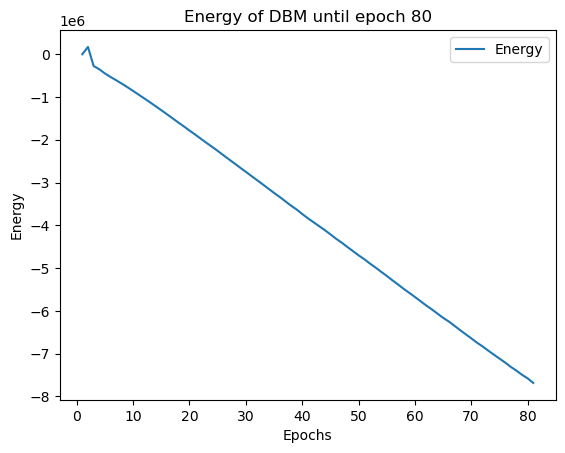

Starting...:   4%|▉                      | 82/2000 [1:02:43<24:40:20, 46.31s/it]

Time taken for DBM epoch 81 is 46.06738805770874


Starting...:   4%|▉                      | 83/2000 [1:03:29<24:36:17, 46.21s/it]

Time taken for DBM epoch 82 is 45.96609950065613


Starting...:   4%|▉                      | 84/2000 [1:04:15<24:33:03, 46.13s/it]

Time taken for DBM epoch 83 is 45.94853377342224


Starting...:   4%|▉                      | 85/2000 [1:05:01<24:30:56, 46.09s/it]

Time taken for DBM epoch 84 is 45.98752474784851


Starting...:   4%|▉                      | 86/2000 [1:05:47<24:28:57, 46.05s/it]

Time taken for DBM epoch 85 is 45.96001124382019


Starting...:   4%|█                      | 87/2000 [1:06:33<24:27:16, 46.02s/it]

Time taken for DBM epoch 86 is 45.95323419570923


Starting...:   4%|█                      | 88/2000 [1:07:19<24:26:32, 46.02s/it]

Time taken for DBM epoch 87 is 46.02205729484558


Starting...:   4%|█                      | 89/2000 [1:08:05<24:24:15, 45.97s/it]

Time taken for DBM epoch 88 is 45.86288094520569


Starting...:   4%|█                      | 90/2000 [1:08:51<24:22:34, 45.94s/it]

Time taken for DBM epoch 89 is 45.87665367126465


Starting...:   4%|█                      | 90/2000 [1:09:36<24:22:34, 45.94s/it]

Time taken for DBM epoch 90 is 45.81912636756897


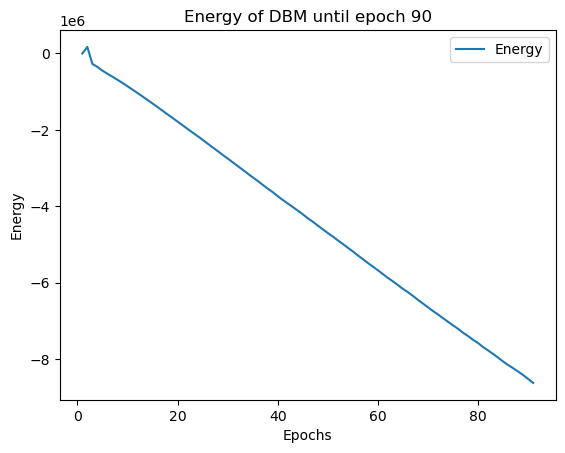

Starting...:   5%|█                      | 92/2000 [1:10:22<24:19:35, 45.90s/it]

Time taken for DBM epoch 91 is 45.8186571598053


Starting...:   5%|█                      | 93/2000 [1:11:08<24:18:53, 45.90s/it]

Time taken for DBM epoch 92 is 45.90619945526123


Starting...:   5%|█                      | 94/2000 [1:11:54<24:17:50, 45.89s/it]

Time taken for DBM epoch 93 is 45.87098789215088


Starting...:   5%|█                      | 95/2000 [1:12:40<24:17:14, 45.90s/it]

Time taken for DBM epoch 94 is 45.908068895339966


Starting...:   5%|█                      | 96/2000 [1:13:26<24:16:03, 45.88s/it]

Time taken for DBM epoch 95 is 45.85280442237854


Starting...:   5%|█                      | 97/2000 [1:14:12<24:14:53, 45.87s/it]

Time taken for DBM epoch 96 is 45.84162735939026


Starting...:   5%|█▏                     | 98/2000 [1:14:58<24:14:05, 45.87s/it]

Time taken for DBM epoch 97 is 45.867149353027344


Starting...:   5%|█▏                     | 99/2000 [1:15:44<24:15:23, 45.94s/it]

Time taken for DBM epoch 98 is 46.087140798568726


Starting...:   5%|█                     | 100/2000 [1:16:30<24:17:48, 46.04s/it]

Time taken for DBM epoch 99 is 46.26941251754761


Starting...:   5%|█                     | 100/2000 [1:17:16<24:17:48, 46.04s/it]

Time taken for DBM epoch 100 is 46.41268992424011


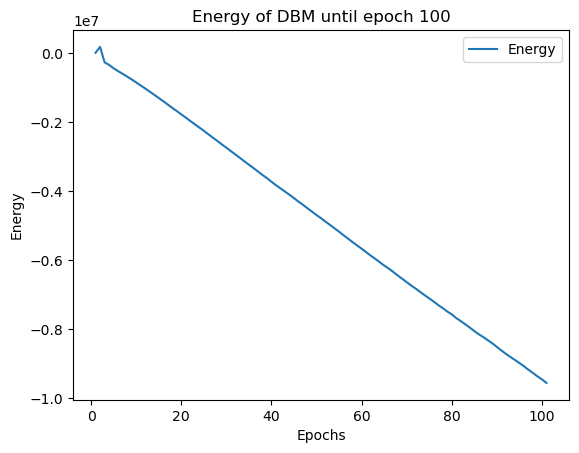

Starting...:   5%|█                     | 102/2000 [1:18:03<24:22:53, 46.25s/it]

Time taken for DBM epoch 101 is 46.39948797225952


Starting...:   5%|█▏                    | 103/2000 [1:18:49<24:24:23, 46.32s/it]

Time taken for DBM epoch 102 is 46.484336614608765


Starting...:   5%|█▏                    | 104/2000 [1:19:36<24:26:27, 46.41s/it]

Time taken for DBM epoch 103 is 46.61556673049927


Starting...:   5%|█▏                    | 105/2000 [1:20:23<24:26:47, 46.44s/it]

Time taken for DBM epoch 104 is 46.52385187149048


Starting...:   5%|█▏                    | 106/2000 [1:21:09<24:26:46, 46.47s/it]

Time taken for DBM epoch 105 is 46.5208785533905


Starting...:   5%|█▏                    | 107/2000 [1:21:56<24:27:18, 46.51s/it]

Time taken for DBM epoch 106 is 46.60350155830383


Starting...:   5%|█▏                    | 108/2000 [1:22:42<24:27:10, 46.53s/it]

Time taken for DBM epoch 107 is 46.57429265975952


Starting...:   5%|█▏                    | 109/2000 [1:23:29<24:28:08, 46.58s/it]

Time taken for DBM epoch 108 is 46.71184539794922


Starting...:   6%|█▏                    | 110/2000 [1:24:16<24:27:30, 46.59s/it]

Time taken for DBM epoch 109 is 46.598592042922974


Starting...:   6%|█▏                    | 110/2000 [1:25:02<24:27:30, 46.59s/it]

Time taken for DBM epoch 110 is 46.6734983921051


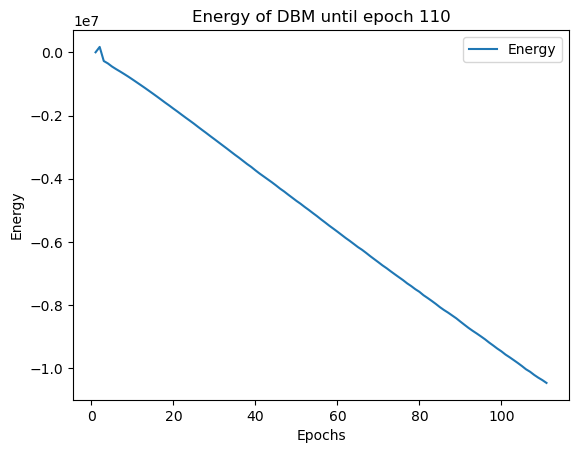

Starting...:   6%|█▏                    | 112/2000 [1:25:49<24:26:44, 46.61s/it]

Time taken for DBM epoch 111 is 46.53924250602722


Starting...:   6%|█▏                    | 113/2000 [1:26:35<24:26:20, 46.62s/it]

Time taken for DBM epoch 112 is 46.65231728553772


Starting...:   6%|█▎                    | 114/2000 [1:27:22<24:25:45, 46.63s/it]

Time taken for DBM epoch 113 is 46.64519500732422


Starting...:   6%|█▎                    | 115/2000 [1:28:09<24:24:53, 46.63s/it]

Time taken for DBM epoch 114 is 46.62120866775513


Starting...:   6%|█▎                    | 116/2000 [1:28:55<24:24:00, 46.62s/it]

Time taken for DBM epoch 115 is 46.615737199783325


Starting...:   6%|█▎                    | 117/2000 [1:29:42<24:23:15, 46.63s/it]

Time taken for DBM epoch 116 is 46.62614393234253


Starting...:   6%|█▎                    | 118/2000 [1:30:29<24:21:42, 46.60s/it]

Time taken for DBM epoch 117 is 46.5422523021698


Starting...:   6%|█▎                    | 119/2000 [1:31:15<24:19:54, 46.57s/it]

Time taken for DBM epoch 118 is 46.492881059646606


Starting...:   6%|█▎                    | 120/2000 [1:32:02<24:18:19, 46.54s/it]

Time taken for DBM epoch 119 is 46.481061935424805


Starting...:   6%|█▎                    | 120/2000 [1:32:48<24:18:19, 46.54s/it]

Time taken for DBM epoch 120 is 46.525938749313354


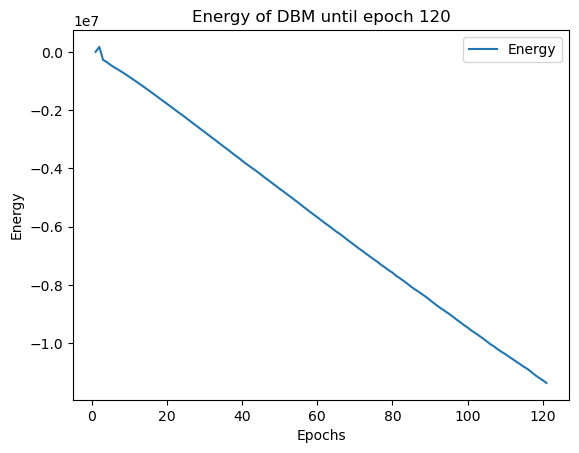

Starting...:   6%|█▎                    | 122/2000 [1:33:35<24:17:01, 46.55s/it]

Time taken for DBM epoch 121 is 46.50552701950073


Starting...:   6%|█▎                    | 123/2000 [1:34:21<24:14:21, 46.49s/it]

Time taken for DBM epoch 122 is 46.34754133224487


Starting...:   6%|█▎                    | 124/2000 [1:35:08<24:13:51, 46.50s/it]

Time taken for DBM epoch 123 is 46.51829791069031


Starting...:   6%|█▍                    | 125/2000 [1:35:54<24:12:47, 46.49s/it]

Time taken for DBM epoch 124 is 46.4682936668396


Starting...:   6%|█▍                    | 126/2000 [1:36:40<24:10:43, 46.45s/it]

Time taken for DBM epoch 125 is 46.35051655769348


Starting...:   6%|█▍                    | 127/2000 [1:37:27<24:09:52, 46.45s/it]

Time taken for DBM epoch 126 is 46.44035458564758


Starting...:   6%|█▍                    | 128/2000 [1:38:13<24:08:01, 46.41s/it]

Time taken for DBM epoch 127 is 46.32901072502136


Starting...:   6%|█▍                    | 129/2000 [1:39:00<24:07:05, 46.41s/it]

Time taken for DBM epoch 128 is 46.39454174041748


Starting...:   6%|█▍                    | 130/2000 [1:39:46<24:05:38, 46.38s/it]

Time taken for DBM epoch 129 is 46.33211970329285


Starting...:   6%|█▍                    | 130/2000 [1:40:32<24:05:38, 46.38s/it]

Time taken for DBM epoch 130 is 46.3203227519989


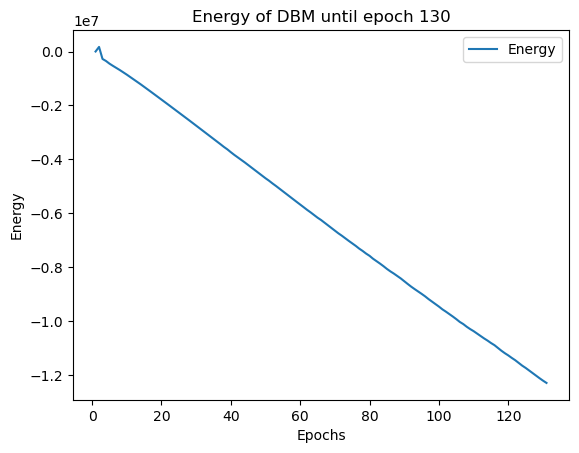

Starting...:   7%|█▍                    | 132/2000 [1:41:19<24:03:13, 46.36s/it]

Time taken for DBM epoch 131 is 46.26223659515381


Starting...:   7%|█▍                    | 133/2000 [1:42:05<24:02:08, 46.35s/it]

Time taken for DBM epoch 132 is 46.32120108604431


Starting...:   7%|█▍                    | 134/2000 [1:42:51<24:00:43, 46.33s/it]

Time taken for DBM epoch 133 is 46.2766900062561


Starting...:   7%|█▍                    | 135/2000 [1:43:37<23:58:46, 46.29s/it]

Time taken for DBM epoch 134 is 46.19880652427673


Starting...:   7%|█▍                    | 136/2000 [1:44:24<23:58:10, 46.29s/it]

Time taken for DBM epoch 135 is 46.305256843566895


Starting...:   7%|█▌                    | 137/2000 [1:45:10<23:57:08, 46.28s/it]

Time taken for DBM epoch 136 is 46.26415657997131


Starting...:   7%|█▌                    | 138/2000 [1:45:56<23:55:26, 46.25s/it]

Time taken for DBM epoch 137 is 46.18557119369507


Starting...:   7%|█▌                    | 139/2000 [1:46:42<23:54:41, 46.26s/it]

Time taken for DBM epoch 138 is 46.25586819648743


Starting...:   7%|█▌                    | 140/2000 [1:47:29<23:53:41, 46.25s/it]

Time taken for DBM epoch 139 is 46.23111081123352


Starting...:   7%|█▌                    | 140/2000 [1:48:15<23:53:41, 46.25s/it]

Time taken for DBM epoch 140 is 46.16837167739868


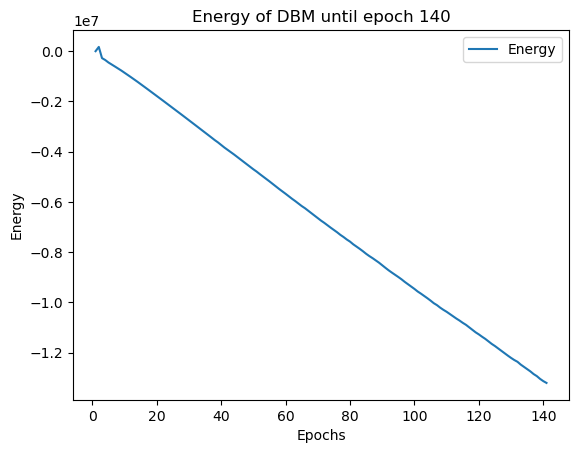

Starting...:   7%|█▌                    | 142/2000 [1:49:01<23:50:33, 46.20s/it]

Time taken for DBM epoch 141 is 46.05645203590393


Starting...:   7%|█▌                    | 143/2000 [1:49:47<23:48:41, 46.16s/it]

Time taken for DBM epoch 142 is 46.07760977745056


Starting...:   7%|█▌                    | 144/2000 [1:50:33<23:47:30, 46.15s/it]

Time taken for DBM epoch 143 is 46.11575984954834


Starting...:   7%|█▌                    | 145/2000 [1:51:19<23:46:50, 46.15s/it]

Time taken for DBM epoch 144 is 46.159244775772095


Starting...:   7%|█▌                    | 146/2000 [1:52:05<23:46:04, 46.15s/it]

Time taken for DBM epoch 145 is 46.15000057220459


Starting...:   7%|█▌                    | 147/2000 [1:52:51<23:44:20, 46.12s/it]

Time taken for DBM epoch 146 is 46.04688835144043


Starting...:   7%|█▋                    | 148/2000 [1:53:38<23:43:00, 46.10s/it]

Time taken for DBM epoch 147 is 46.058767795562744


Starting...:   7%|█▋                    | 149/2000 [1:54:24<23:41:31, 46.08s/it]

Time taken for DBM epoch 148 is 46.024699449539185


Starting...:   8%|█▋                    | 150/2000 [1:55:10<23:40:11, 46.06s/it]

Time taken for DBM epoch 149 is 46.01729893684387


Starting...:   8%|█▋                    | 150/2000 [1:55:56<23:40:11, 46.06s/it]

Time taken for DBM epoch 150 is 45.99884247779846


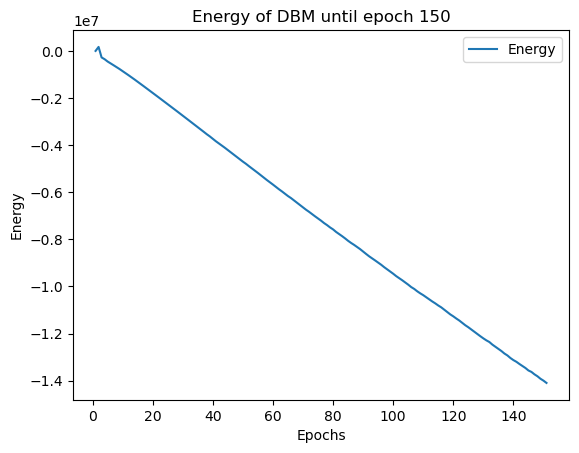

Starting...:   8%|█▋                    | 152/2000 [1:56:42<23:38:40, 46.06s/it]

Time taken for DBM epoch 151 is 46.02544689178467


Starting...:   8%|█▋                    | 153/2000 [1:57:28<23:37:46, 46.06s/it]

Time taken for DBM epoch 152 is 46.04604744911194


Starting...:   8%|█▋                    | 154/2000 [1:58:14<23:36:54, 46.05s/it]

Time taken for DBM epoch 153 is 46.04555797576904


Starting...:   8%|█▋                    | 155/2000 [1:59:00<23:36:44, 46.07s/it]

Time taken for DBM epoch 154 is 46.11769247055054


Starting...:   8%|█▋                    | 156/2000 [1:59:46<23:37:11, 46.11s/it]

Time taken for DBM epoch 155 is 46.20461344718933


Starting...:   8%|█▋                    | 157/2000 [2:00:32<23:36:45, 46.12s/it]

Time taken for DBM epoch 156 is 46.14932680130005


Starting...:   8%|█▋                    | 158/2000 [2:01:18<23:37:04, 46.16s/it]

Time taken for DBM epoch 157 is 46.24080038070679


Starting...:   8%|█▋                    | 159/2000 [2:02:05<23:37:20, 46.19s/it]

Time taken for DBM epoch 158 is 46.27083396911621


Starting...:   8%|█▊                    | 160/2000 [2:02:51<23:37:12, 46.21s/it]

Time taken for DBM epoch 159 is 46.26205039024353


Starting...:   8%|█▊                    | 160/2000 [2:03:37<23:37:12, 46.21s/it]

Time taken for DBM epoch 160 is 46.26766061782837


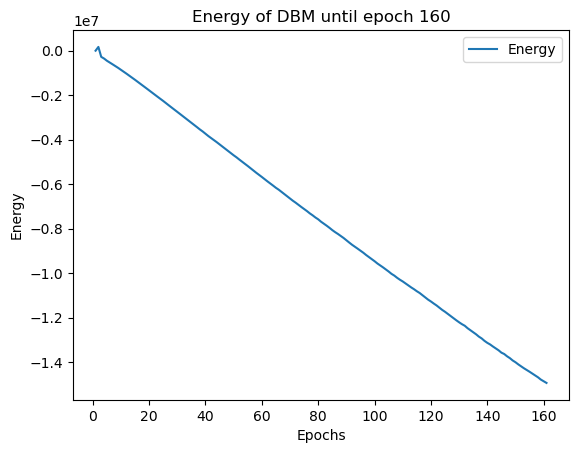

Starting...:   8%|█▊                    | 162/2000 [2:04:24<23:37:04, 46.26s/it]

Time taken for DBM epoch 161 is 46.2464816570282


Starting...:   8%|█▊                    | 163/2000 [2:05:10<23:36:25, 46.26s/it]

Time taken for DBM epoch 162 is 46.27267909049988


Starting...:   8%|█▊                    | 164/2000 [2:05:56<23:35:29, 46.26s/it]

Time taken for DBM epoch 163 is 46.245518922805786


Starting...:   8%|█▊                    | 165/2000 [2:06:42<23:34:49, 46.26s/it]

Time taken for DBM epoch 164 is 46.267574071884155


Starting...:   8%|█▊                    | 166/2000 [2:07:29<23:34:12, 46.27s/it]

Time taken for DBM epoch 165 is 46.27761197090149


Starting...:   8%|█▊                    | 167/2000 [2:08:15<23:33:17, 46.26s/it]

Time taken for DBM epoch 166 is 46.25061249732971


Starting...:   8%|█▊                    | 168/2000 [2:09:01<23:30:57, 46.21s/it]

Time taken for DBM epoch 167 is 46.09046792984009


Starting...:   8%|█▊                    | 169/2000 [2:09:47<23:28:20, 46.15s/it]

Time taken for DBM epoch 168 is 46.0085825920105


Starting...:   8%|█▊                    | 170/2000 [2:10:33<23:25:14, 46.07s/it]

Time taken for DBM epoch 169 is 45.894301414489746


Starting...:   8%|█▊                    | 170/2000 [2:11:19<23:25:14, 46.07s/it]

Time taken for DBM epoch 170 is 45.856504678726196


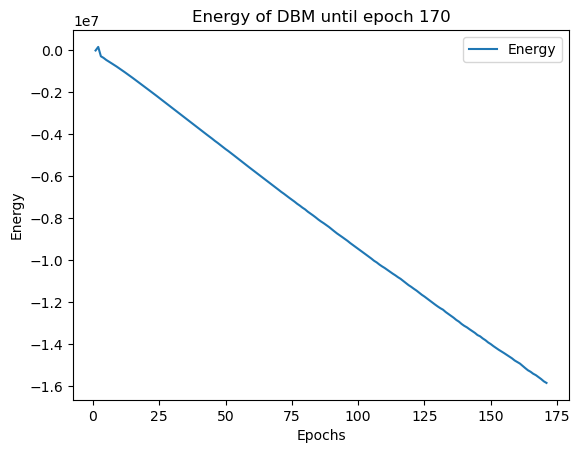

Starting...:   9%|█▉                    | 172/2000 [2:12:05<23:21:21, 46.00s/it]

Time taken for DBM epoch 171 is 45.891268491744995


Starting...:   9%|█▉                    | 173/2000 [2:12:51<23:19:05, 45.95s/it]

Time taken for DBM epoch 172 is 45.83116912841797


Starting...:   9%|█▉                    | 174/2000 [2:13:37<23:17:23, 45.92s/it]

Time taken for DBM epoch 173 is 45.84488391876221


Starting...:   9%|█▉                    | 175/2000 [2:14:22<23:15:10, 45.87s/it]

Time taken for DBM epoch 174 is 45.7558536529541


Starting...:   9%|█▉                    | 176/2000 [2:15:08<23:13:11, 45.83s/it]

Time taken for DBM epoch 175 is 45.73599171638489


Starting...:   9%|█▉                    | 177/2000 [2:15:54<23:11:49, 45.81s/it]

Time taken for DBM epoch 176 is 45.76171946525574


Starting...:   9%|█▉                    | 178/2000 [2:16:40<23:10:43, 45.80s/it]

Time taken for DBM epoch 177 is 45.77106428146362


Starting...:   9%|█▉                    | 179/2000 [2:17:25<23:10:38, 45.82s/it]

Time taken for DBM epoch 178 is 45.87299132347107


Starting...:   9%|█▉                    | 180/2000 [2:18:11<23:11:25, 45.87s/it]

Time taken for DBM epoch 179 is 45.989479780197144


Starting...:   9%|█▉                    | 180/2000 [2:18:57<23:11:25, 45.87s/it]

Time taken for DBM epoch 180 is 46.07371950149536


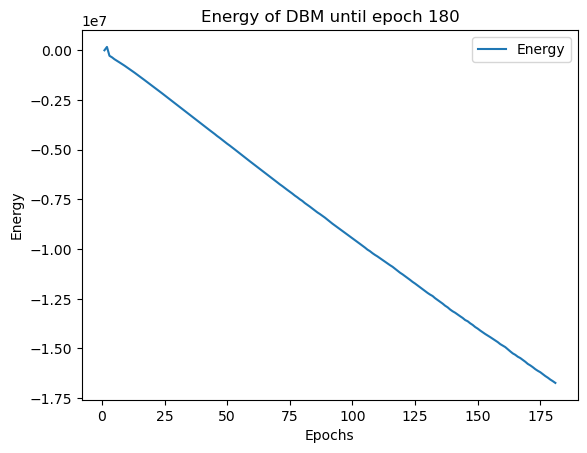

Starting...:   9%|██                    | 182/2000 [2:19:44<23:14:08, 46.01s/it]

Time taken for DBM epoch 181 is 46.11374306678772


Starting...:   9%|██                    | 183/2000 [2:20:30<23:14:06, 46.04s/it]

Time taken for DBM epoch 182 is 46.09190487861633


Starting...:   9%|██                    | 184/2000 [2:21:16<23:12:09, 46.00s/it]

Time taken for DBM epoch 183 is 45.90447235107422


Starting...:   9%|██                    | 185/2000 [2:22:01<23:08:54, 45.91s/it]

Time taken for DBM epoch 184 is 45.72285747528076


Starting...:   9%|██                    | 186/2000 [2:22:47<23:05:42, 45.83s/it]

Time taken for DBM epoch 185 is 45.64545965194702


Starting...:   9%|██                    | 187/2000 [2:23:33<23:02:58, 45.77s/it]

Time taken for DBM epoch 186 is 45.616737604141235


Starting...:   9%|██                    | 188/2000 [2:24:18<23:00:39, 45.72s/it]

Time taken for DBM epoch 187 is 45.596402168273926


Starting...:   9%|██                    | 189/2000 [2:25:04<22:59:28, 45.70s/it]

Time taken for DBM epoch 188 is 45.67085886001587


Starting...:  10%|██                    | 190/2000 [2:25:49<22:56:55, 45.64s/it]

Time taken for DBM epoch 189 is 45.50538730621338


Starting...:  10%|██                    | 190/2000 [2:26:35<22:56:55, 45.64s/it]

Time taken for DBM epoch 190 is 45.629196643829346


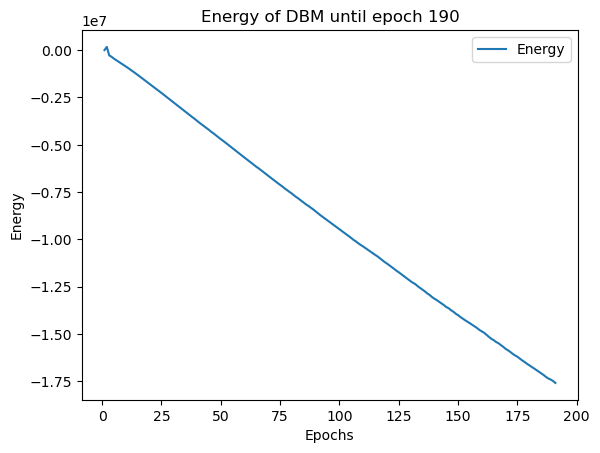

Starting...:  10%|██                    | 192/2000 [2:27:21<22:54:43, 45.62s/it]

Time taken for DBM epoch 191 is 45.506192207336426


Starting...:  10%|██                    | 193/2000 [2:28:06<22:53:24, 45.60s/it]

Time taken for DBM epoch 192 is 45.558602809906006


Starting...:  10%|██▏                   | 194/2000 [2:28:52<22:53:19, 45.63s/it]

Time taken for DBM epoch 193 is 45.67759084701538


Starting...:  10%|██▏                   | 195/2000 [2:29:38<22:53:04, 45.64s/it]

Time taken for DBM epoch 194 is 45.681326150894165


Starting...:  10%|██▏                   | 196/2000 [2:30:23<22:52:44, 45.66s/it]

Time taken for DBM epoch 195 is 45.68883013725281


Starting...:  10%|██▏                   | 197/2000 [2:31:09<22:52:42, 45.68s/it]

Time taken for DBM epoch 196 is 45.737000942230225


Starting...:  10%|██▏                   | 198/2000 [2:31:55<22:52:48, 45.71s/it]

Time taken for DBM epoch 197 is 45.77684926986694


Starting...:  10%|██▏                   | 199/2000 [2:32:41<22:52:28, 45.72s/it]

Time taken for DBM epoch 198 is 45.75623869895935


Starting...:  10%|██▏                   | 200/2000 [2:33:26<22:51:49, 45.73s/it]

Time taken for DBM epoch 199 is 45.735602140426636


Starting...:  10%|██▏                   | 200/2000 [2:34:12<22:51:49, 45.73s/it]

Time taken for DBM epoch 200 is 45.80382442474365


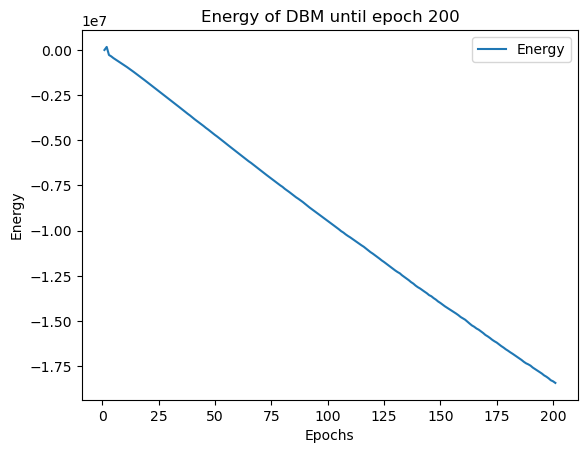

Starting...:  10%|██▏                   | 202/2000 [2:34:58<22:51:59, 45.78s/it]

Time taken for DBM epoch 201 is 45.78772950172424


Starting...:  10%|██▏                   | 203/2000 [2:35:44<22:50:53, 45.77s/it]

Time taken for DBM epoch 202 is 45.74693465232849


Starting...:  10%|██▏                   | 204/2000 [2:36:30<22:51:15, 45.81s/it]

Time taken for DBM epoch 203 is 45.89652132987976


Starting...:  10%|██▎                   | 205/2000 [2:37:16<22:51:13, 45.83s/it]

Time taken for DBM epoch 204 is 45.89146828651428


Starting...:  10%|██▎                   | 206/2000 [2:38:01<22:50:25, 45.83s/it]

Time taken for DBM epoch 205 is 45.83107280731201


Starting...:  10%|██▎                   | 207/2000 [2:38:47<22:50:12, 45.85s/it]

Time taken for DBM epoch 206 is 45.894463539123535


Starting...:  10%|██▎                   | 208/2000 [2:39:33<22:49:44, 45.86s/it]

Time taken for DBM epoch 207 is 45.88451433181763


Starting...:  10%|██▎                   | 209/2000 [2:40:19<22:48:25, 45.84s/it]

Time taken for DBM epoch 208 is 45.799943685531616


Starting...:  10%|██▎                   | 210/2000 [2:41:05<22:47:34, 45.84s/it]

Time taken for DBM epoch 209 is 45.832010984420776


Starting...:  10%|██▎                   | 210/2000 [2:41:51<22:47:34, 45.84s/it]

Time taken for DBM epoch 210 is 45.76875901222229


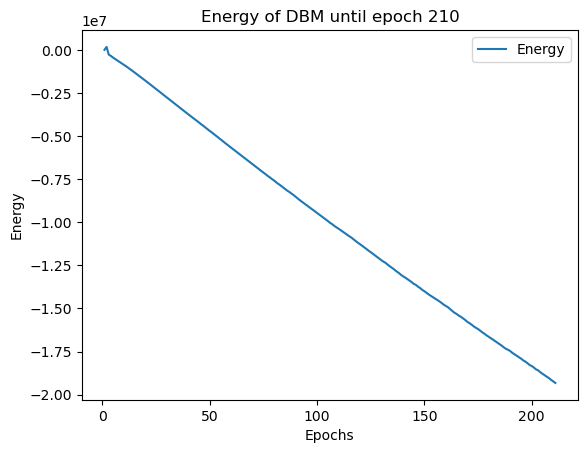

Starting...:  11%|██▎                   | 212/2000 [2:42:36<22:45:20, 45.82s/it]

Time taken for DBM epoch 211 is 45.74178671836853


Starting...:  11%|██▎                   | 213/2000 [2:43:22<22:44:36, 45.82s/it]

Time taken for DBM epoch 212 is 45.820077657699585


Starting...:  11%|██▎                   | 214/2000 [2:44:08<22:43:10, 45.80s/it]

Time taken for DBM epoch 213 is 45.741650342941284


Starting...:  11%|██▎                   | 215/2000 [2:44:54<22:42:10, 45.79s/it]

Time taken for DBM epoch 214 is 45.76946783065796


Starting...:  11%|██▍                   | 216/2000 [2:45:40<22:41:32, 45.79s/it]

Time taken for DBM epoch 215 is 45.800854444503784


Starting...:  11%|██▍                   | 217/2000 [2:46:25<22:40:14, 45.77s/it]

Time taken for DBM epoch 216 is 45.731894731521606


Starting...:  11%|██▍                   | 218/2000 [2:47:11<22:39:44, 45.78s/it]

Time taken for DBM epoch 217 is 45.80223894119263


Starting...:  11%|██▍                   | 219/2000 [2:47:57<22:38:20, 45.76s/it]

Time taken for DBM epoch 218 is 45.71072244644165


Starting...:  11%|██▍                   | 220/2000 [2:48:43<22:37:27, 45.76s/it]

Time taken for DBM epoch 219 is 45.746662616729736


Starting...:  11%|██▍                   | 220/2000 [2:49:28<22:37:27, 45.76s/it]

Time taken for DBM epoch 220 is 45.71788191795349


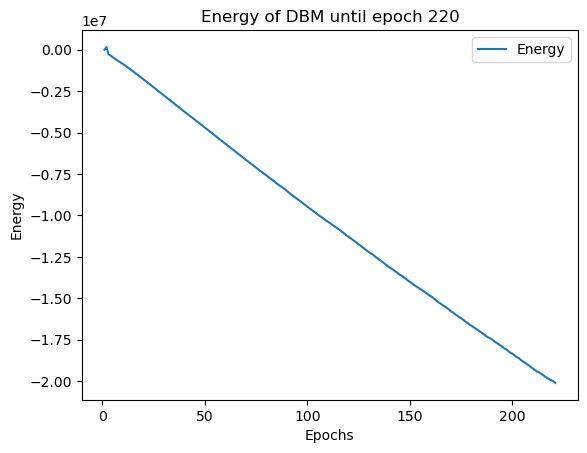

Starting...:  11%|██▍                   | 222/2000 [2:50:14<22:36:22, 45.77s/it]

Time taken for DBM epoch 221 is 45.761247396469116


Starting...:  11%|██▍                   | 223/2000 [2:51:00<22:35:27, 45.77s/it]

Time taken for DBM epoch 222 is 45.753156661987305


Starting...:  11%|██▍                   | 224/2000 [2:51:46<22:34:18, 45.75s/it]

Time taken for DBM epoch 223 is 45.72369050979614


Starting...:  11%|██▍                   | 225/2000 [2:52:31<22:32:22, 45.71s/it]

Time taken for DBM epoch 224 is 45.621678590774536


Starting...:  11%|██▍                   | 226/2000 [2:53:17<22:30:47, 45.69s/it]

Time taken for DBM epoch 225 is 45.6197726726532


Starting...:  11%|██▍                   | 227/2000 [2:54:02<22:29:49, 45.68s/it]

Time taken for DBM epoch 226 is 45.6626079082489


Starting...:  11%|██▌                   | 228/2000 [2:54:48<22:31:10, 45.75s/it]

Time taken for DBM epoch 227 is 45.91737079620361


Starting...:  11%|██▌                   | 229/2000 [2:55:34<22:28:48, 45.70s/it]

Time taken for DBM epoch 228 is 45.56923222541809


Starting...:  12%|██▌                   | 230/2000 [2:56:19<22:26:18, 45.64s/it]

Time taken for DBM epoch 229 is 45.49973464012146


Starting...:  12%|██▌                   | 230/2000 [2:57:05<22:26:18, 45.64s/it]

Time taken for DBM epoch 230 is 45.47814106941223


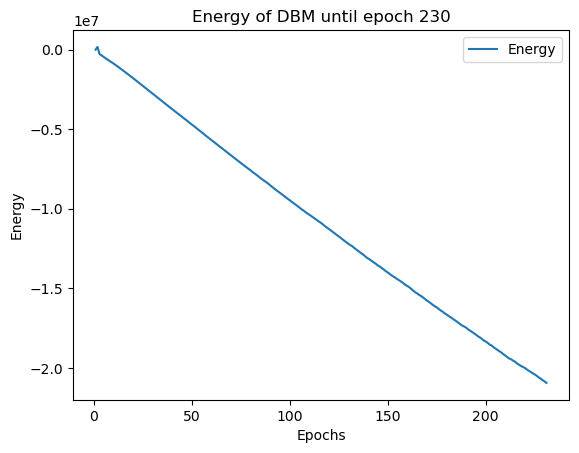

Starting...:  12%|██▌                   | 232/2000 [2:57:50<22:22:19, 45.55s/it]

Time taken for DBM epoch 231 is 45.40467643737793


Starting...:  12%|██▌                   | 233/2000 [2:58:36<22:20:01, 45.50s/it]

Time taken for DBM epoch 232 is 45.37809181213379


Starting...:  12%|██▌                   | 234/2000 [2:59:21<22:19:07, 45.50s/it]

Time taken for DBM epoch 233 is 45.485527753829956


Starting...:  12%|██▌                   | 235/2000 [3:00:07<22:21:38, 45.61s/it]

Time taken for DBM epoch 234 is 45.86716151237488


Starting...:  12%|██▌                   | 236/2000 [3:00:53<22:24:17, 45.72s/it]

Time taken for DBM epoch 235 is 45.99444270133972


Starting...:  12%|██▌                   | 237/2000 [3:01:39<22:23:34, 45.73s/it]

Time taken for DBM epoch 236 is 45.72850060462952


Starting...:  12%|██▌                   | 238/2000 [3:02:25<22:22:11, 45.70s/it]

Time taken for DBM epoch 237 is 45.656193017959595


Starting...:  12%|██▋                   | 239/2000 [3:03:10<22:22:00, 45.72s/it]

Time taken for DBM epoch 238 is 45.76804995536804


Starting...:  12%|██▋                   | 240/2000 [3:03:56<22:21:00, 45.72s/it]

Time taken for DBM epoch 239 is 45.69834089279175


Starting...:  12%|██▋                   | 240/2000 [3:04:42<22:21:00, 45.72s/it]

Time taken for DBM epoch 240 is 45.77520728111267


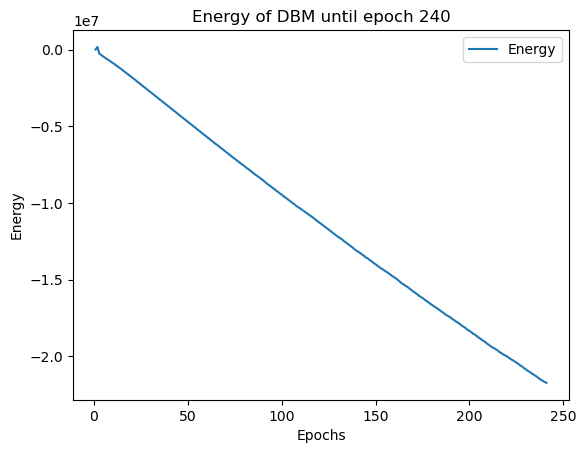

Starting...:  12%|██▋                   | 242/2000 [3:05:28<22:21:27, 45.78s/it]

Time taken for DBM epoch 241 is 45.83067226409912


Starting...:  12%|██▋                   | 243/2000 [3:06:14<22:20:46, 45.79s/it]

Time taken for DBM epoch 242 is 45.791213512420654


Starting...:  12%|██▋                   | 244/2000 [3:06:59<22:21:10, 45.83s/it]

Time taken for DBM epoch 243 is 45.91944861412048


Starting...:  12%|██▋                   | 245/2000 [3:07:45<22:21:03, 45.85s/it]

Time taken for DBM epoch 244 is 45.899858236312866


Starting...:  12%|██▋                   | 246/2000 [3:08:31<22:21:08, 45.88s/it]

Time taken for DBM epoch 245 is 45.942830085754395


Starting...:  12%|██▋                   | 247/2000 [3:09:17<22:20:00, 45.86s/it]

Time taken for DBM epoch 246 is 45.83554935455322


Starting...:  12%|██▋                   | 248/2000 [3:10:03<22:19:06, 45.86s/it]

Time taken for DBM epoch 247 is 45.847891330718994


Starting...:  12%|██▋                   | 249/2000 [3:10:49<22:18:04, 45.85s/it]

Time taken for DBM epoch 248 is 45.82937979698181


Starting...:  12%|██▊                   | 250/2000 [3:11:35<22:18:30, 45.89s/it]

Time taken for DBM epoch 249 is 45.987568378448486


Starting...:  12%|██▊                   | 250/2000 [3:12:21<22:18:30, 45.89s/it]

Time taken for DBM epoch 250 is 45.80520272254944


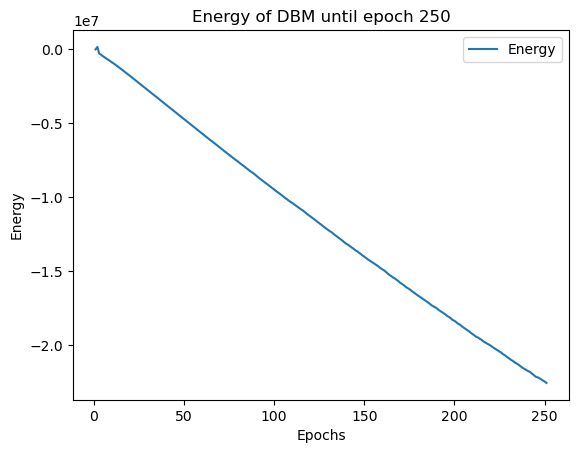

Starting...:  13%|██▊                   | 252/2000 [3:13:07<22:17:15, 45.90s/it]

Time taken for DBM epoch 251 is 45.921165466308594


Starting...:  13%|██▊                   | 253/2000 [3:13:52<22:15:47, 45.88s/it]

Time taken for DBM epoch 252 is 45.820210218429565


Starting...:  13%|██▊                   | 254/2000 [3:14:38<22:14:55, 45.87s/it]

Time taken for DBM epoch 253 is 45.86469125747681


Starting...:  13%|██▊                   | 255/2000 [3:15:24<22:15:05, 45.91s/it]

Time taken for DBM epoch 254 is 45.97939443588257


Starting...:  13%|██▊                   | 256/2000 [3:16:10<22:13:25, 45.87s/it]

Time taken for DBM epoch 255 is 45.803215742111206


Starting...:  13%|██▊                   | 257/2000 [3:16:56<22:12:09, 45.86s/it]

Time taken for DBM epoch 256 is 45.81509304046631


Starting...:  13%|██▊                   | 258/2000 [3:17:42<22:12:01, 45.88s/it]

Time taken for DBM epoch 257 is 45.92976641654968


Starting...:  13%|██▊                   | 259/2000 [3:18:28<22:10:33, 45.85s/it]

Time taken for DBM epoch 258 is 45.79791069030762


Starting...:  13%|██▊                   | 260/2000 [3:19:13<22:08:52, 45.82s/it]

Time taken for DBM epoch 259 is 45.748358964920044


Starting...:  13%|██▊                   | 260/2000 [3:19:59<22:08:52, 45.82s/it]

Time taken for DBM epoch 260 is 45.73594903945923


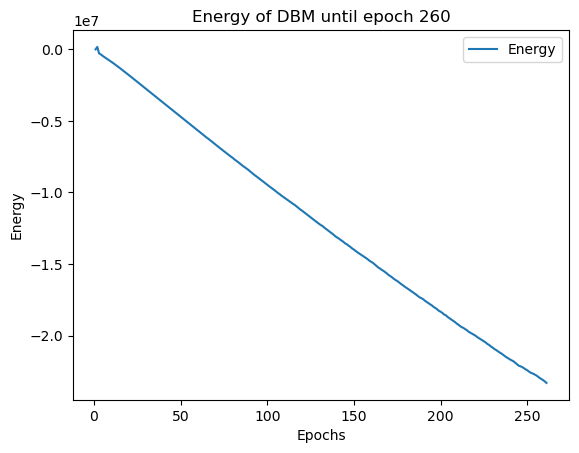

Starting...:  13%|██▉                   | 262/2000 [3:20:45<22:06:46, 45.80s/it]

Time taken for DBM epoch 261 is 45.757888078689575


Starting...:  13%|██▉                   | 263/2000 [3:21:31<22:05:09, 45.77s/it]

Time taken for DBM epoch 262 is 45.70458722114563


Starting...:  13%|██▉                   | 264/2000 [3:22:16<22:03:50, 45.75s/it]

Time taken for DBM epoch 263 is 45.7092969417572


Starting...:  13%|██▉                   | 265/2000 [3:23:02<22:02:54, 45.75s/it]

Time taken for DBM epoch 264 is 45.73477911949158


Starting...:  13%|██▉                   | 266/2000 [3:23:48<22:01:56, 45.74s/it]

Time taken for DBM epoch 265 is 45.72508788108826


Starting...:  13%|██▉                   | 267/2000 [3:24:33<22:00:16, 45.71s/it]

Time taken for DBM epoch 266 is 45.637133836746216


Starting...:  13%|██▉                   | 268/2000 [3:25:19<21:57:50, 45.65s/it]

Time taken for DBM epoch 267 is 45.51683187484741


Starting...:  13%|██▉                   | 269/2000 [3:26:05<21:57:07, 45.65s/it]

Time taken for DBM epoch 268 is 45.65723490715027


Starting...:  14%|██▉                   | 270/2000 [3:26:50<21:57:18, 45.69s/it]

Time taken for DBM epoch 269 is 45.76385855674744


Starting...:  14%|██▉                   | 270/2000 [3:27:36<21:57:18, 45.69s/it]

Time taken for DBM epoch 270 is 45.87979745864868


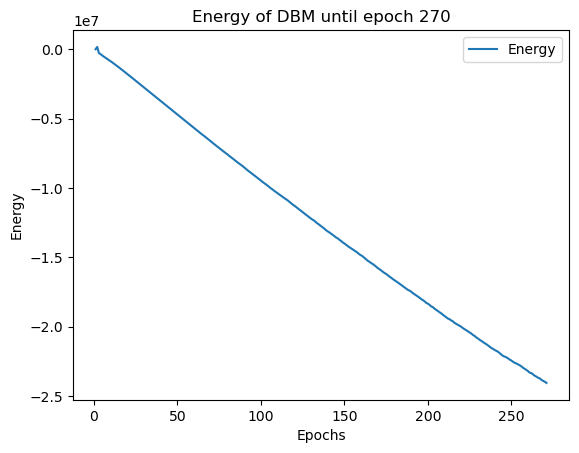

Starting...:  14%|██▉                   | 272/2000 [3:28:22<21:58:56, 45.80s/it]

Time taken for DBM epoch 271 is 45.64497923851013


Starting...:  14%|███                   | 273/2000 [3:29:08<21:55:51, 45.72s/it]

Time taken for DBM epoch 272 is 45.52890205383301


Starting...:  14%|███                   | 274/2000 [3:29:53<21:52:35, 45.63s/it]

Time taken for DBM epoch 273 is 45.4250271320343


Starting...:  14%|███                   | 275/2000 [3:30:39<21:50:39, 45.59s/it]

Time taken for DBM epoch 274 is 45.49170470237732


Starting...:  14%|███                   | 276/2000 [3:31:24<21:48:50, 45.55s/it]

Time taken for DBM epoch 275 is 45.46608209609985


Starting...:  14%|███                   | 277/2000 [3:32:10<21:48:20, 45.56s/it]

Time taken for DBM epoch 276 is 45.580068826675415


Starting...:  14%|███                   | 278/2000 [3:32:55<21:48:26, 45.59s/it]

Time taken for DBM epoch 277 is 45.65949892997742


Starting...:  14%|███                   | 279/2000 [3:33:41<21:47:29, 45.58s/it]

Time taken for DBM epoch 278 is 45.56859087944031


Starting...:  14%|███                   | 280/2000 [3:34:27<21:47:13, 45.60s/it]

Time taken for DBM epoch 279 is 45.639899492263794


Starting...:  14%|███                   | 280/2000 [3:35:12<21:47:13, 45.60s/it]

Time taken for DBM epoch 280 is 45.7202627658844


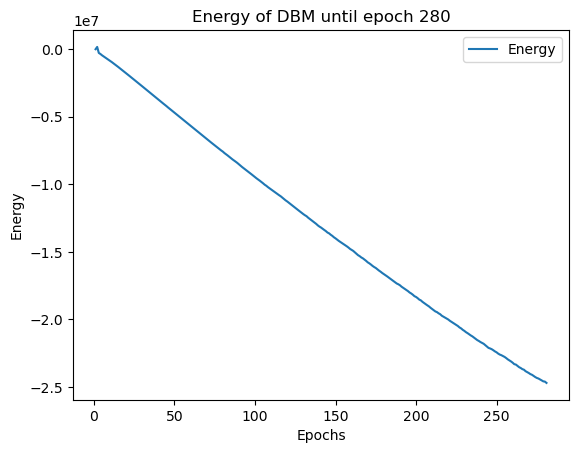

Starting...:  14%|███                   | 282/2000 [3:35:58<21:48:12, 45.69s/it]

Time taken for DBM epoch 281 is 45.73881721496582


Starting...:  14%|███                   | 283/2000 [3:36:44<21:47:23, 45.69s/it]

Time taken for DBM epoch 282 is 45.68190240859985


Starting...:  14%|███                   | 284/2000 [3:37:30<21:47:15, 45.71s/it]

Time taken for DBM epoch 283 is 45.75831651687622


Starting...:  14%|███▏                  | 285/2000 [3:38:16<21:47:28, 45.74s/it]

Time taken for DBM epoch 284 is 45.82228350639343


Starting...:  14%|███▏                  | 286/2000 [3:39:01<21:46:54, 45.75s/it]

Time taken for DBM epoch 285 is 45.76429605484009


Starting...:  14%|███▏                  | 287/2000 [3:39:47<21:46:15, 45.75s/it]

Time taken for DBM epoch 286 is 45.761475801467896


Starting...:  14%|███▏                  | 288/2000 [3:40:33<21:45:14, 45.74s/it]

Time taken for DBM epoch 287 is 45.72362780570984


Starting...:  14%|███▏                  | 289/2000 [3:41:19<21:44:39, 45.75s/it]

Time taken for DBM epoch 288 is 45.76575827598572


Starting...:  14%|███▏                  | 290/2000 [3:42:04<21:43:46, 45.75s/it]

Time taken for DBM epoch 289 is 45.7360999584198


Starting...:  14%|███▏                  | 290/2000 [3:42:50<21:43:46, 45.75s/it]

Time taken for DBM epoch 290 is 45.73151397705078


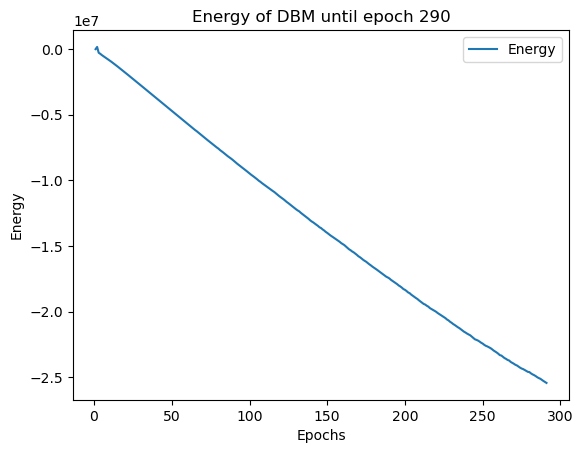

Starting...:  15%|███▏                  | 292/2000 [3:43:36<21:42:47, 45.77s/it]

Time taken for DBM epoch 291 is 45.75493383407593


Starting...:  15%|███▏                  | 293/2000 [3:44:22<21:41:31, 45.75s/it]

Time taken for DBM epoch 292 is 45.70549201965332


Starting...:  15%|███▏                  | 294/2000 [3:45:07<21:40:48, 45.75s/it]

Time taken for DBM epoch 293 is 45.75263333320618


Starting...:  15%|███▏                  | 295/2000 [3:45:53<21:39:34, 45.73s/it]

Time taken for DBM epoch 294 is 45.69365334510803


Starting...:  15%|███▎                  | 296/2000 [3:46:39<21:38:31, 45.72s/it]

Time taken for DBM epoch 295 is 45.69935941696167


Starting...:  15%|███▎                  | 297/2000 [3:47:25<21:38:41, 45.76s/it]

Time taken for DBM epoch 296 is 45.83076453208923


Starting...:  15%|███▎                  | 298/2000 [3:48:11<21:40:21, 45.84s/it]

Time taken for DBM epoch 297 is 46.040414333343506


Starting...:  15%|███▎                  | 299/2000 [3:48:57<21:41:56, 45.92s/it]

Time taken for DBM epoch 298 is 46.11755681037903


Starting...:  15%|███▎                  | 300/2000 [3:49:43<21:42:21, 45.97s/it]

Time taken for DBM epoch 299 is 46.06181836128235


Starting...:  15%|███▎                  | 300/2000 [3:50:29<21:42:21, 45.97s/it]

Time taken for DBM epoch 300 is 46.027257204055786


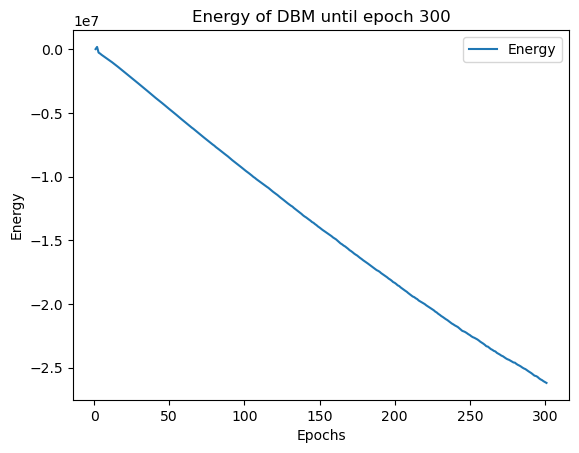

Starting...:  15%|███▎                  | 302/2000 [3:51:15<21:42:34, 46.03s/it]

Time taken for DBM epoch 301 is 46.05441761016846


Starting...:  15%|███▎                  | 303/2000 [3:52:01<21:42:49, 46.06s/it]

Time taken for DBM epoch 302 is 46.14682340621948


Starting...:  15%|███▎                  | 304/2000 [3:52:47<21:42:22, 46.07s/it]

Time taken for DBM epoch 303 is 46.10092353820801


Starting...:  15%|███▎                  | 305/2000 [3:53:33<21:41:29, 46.07s/it]

Time taken for DBM epoch 304 is 46.060089111328125


Starting...:  15%|███▎                  | 306/2000 [3:54:19<21:40:23, 46.06s/it]

Time taken for DBM epoch 305 is 46.03182673454285


Starting...:  15%|███▍                  | 307/2000 [3:55:05<21:39:40, 46.06s/it]

Time taken for DBM epoch 306 is 46.06354212760925


Starting...:  15%|███▍                  | 308/2000 [3:55:51<21:38:31, 46.05s/it]

Time taken for DBM epoch 307 is 46.01483488082886


Starting...:  15%|███▍                  | 309/2000 [3:56:37<21:37:31, 46.04s/it]

Time taken for DBM epoch 308 is 46.01778197288513


Starting...:  16%|███▍                  | 310/2000 [3:57:23<21:35:37, 46.00s/it]

Time taken for DBM epoch 309 is 45.905218839645386


Starting...:  16%|███▍                  | 310/2000 [3:58:09<21:35:37, 46.00s/it]

Time taken for DBM epoch 310 is 45.937769651412964


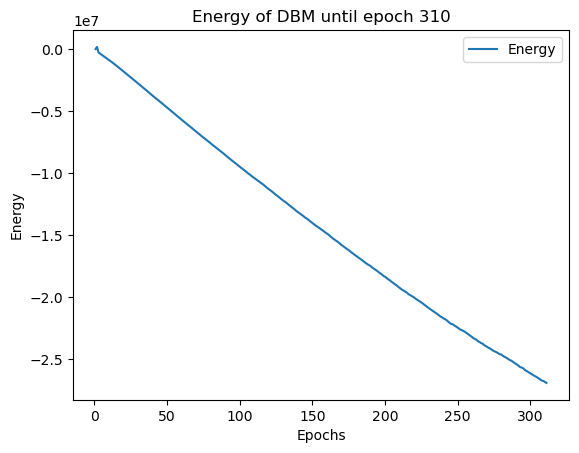

Starting...:  16%|███▍                  | 312/2000 [3:58:55<21:33:35, 45.98s/it]

Time taken for DBM epoch 311 is 45.908100843429565


Starting...:  16%|███▍                  | 313/2000 [3:59:41<21:32:30, 45.97s/it]

Time taken for DBM epoch 312 is 45.94424080848694


Starting...:  16%|███▍                  | 314/2000 [4:00:27<21:31:27, 45.96s/it]

Time taken for DBM epoch 313 is 45.93457245826721


Starting...:  16%|███▍                  | 315/2000 [4:01:13<21:30:26, 45.95s/it]

Time taken for DBM epoch 314 is 45.92895197868347


Starting...:  16%|███▍                  | 316/2000 [4:01:59<21:29:20, 45.94s/it]

Time taken for DBM epoch 315 is 45.91092324256897


Starting...:  16%|███▍                  | 317/2000 [4:02:45<21:28:10, 45.92s/it]

Time taken for DBM epoch 316 is 45.89000844955444


Starting...:  16%|███▍                  | 318/2000 [4:03:31<21:27:20, 45.92s/it]

Time taken for DBM epoch 317 is 45.91518592834473


Starting...:  16%|███▌                  | 319/2000 [4:04:17<21:26:04, 45.90s/it]

Time taken for DBM epoch 318 is 45.8629686832428


Starting...:  16%|███▌                  | 320/2000 [4:05:03<21:25:44, 45.92s/it]

Time taken for DBM epoch 319 is 45.95533108711243


Starting...:  16%|███▌                  | 320/2000 [4:05:48<21:25:44, 45.92s/it]

Time taken for DBM epoch 320 is 45.717875242233276


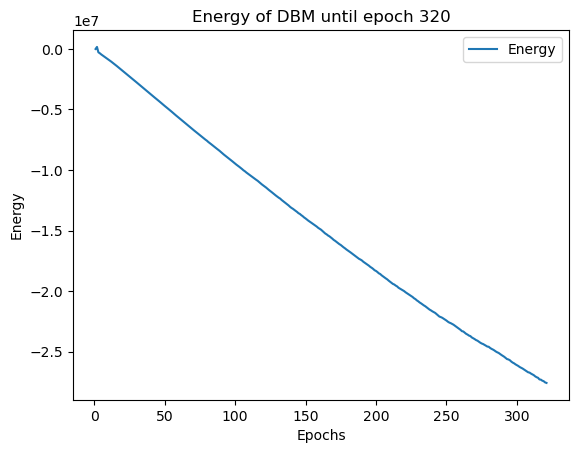

Starting...:  16%|███▌                  | 322/2000 [4:06:34<21:21:01, 45.81s/it]

Time taken for DBM epoch 321 is 45.61323547363281


Starting...:  16%|███▌                  | 323/2000 [4:07:20<21:18:41, 45.75s/it]

Time taken for DBM epoch 322 is 45.617636919021606


Starting...:  16%|███▌                  | 324/2000 [4:08:05<21:16:59, 45.72s/it]

Time taken for DBM epoch 323 is 45.63765072822571


Starting...:  16%|███▌                  | 325/2000 [4:08:51<21:15:39, 45.70s/it]

Time taken for DBM epoch 324 is 45.647194623947144


Starting...:  16%|███▌                  | 326/2000 [4:09:37<21:14:46, 45.69s/it]

Time taken for DBM epoch 325 is 45.67902207374573


Starting...:  16%|███▌                  | 327/2000 [4:10:22<21:13:50, 45.68s/it]

Time taken for DBM epoch 326 is 45.67094564437866


Starting...:  16%|███▌                  | 328/2000 [4:11:08<21:12:58, 45.68s/it]

Time taken for DBM epoch 327 is 45.67087244987488


Starting...:  16%|███▌                  | 329/2000 [4:11:54<21:12:40, 45.70s/it]

Time taken for DBM epoch 328 is 45.735554456710815


Starting...:  16%|███▋                  | 330/2000 [4:12:39<21:12:04, 45.70s/it]

Time taken for DBM epoch 329 is 45.71552109718323


Starting...:  16%|███▋                  | 330/2000 [4:13:25<21:12:04, 45.70s/it]

Time taken for DBM epoch 330 is 45.74440860748291


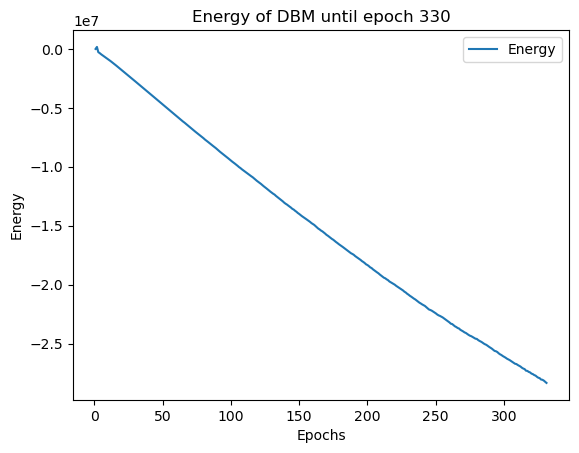

Starting...:  17%|███▋                  | 332/2000 [4:14:11<21:11:22, 45.73s/it]

Time taken for DBM epoch 331 is 45.701762437820435


Starting...:  17%|███▋                  | 333/2000 [4:14:57<21:10:39, 45.73s/it]

Time taken for DBM epoch 332 is 45.7372989654541


Starting...:  17%|███▋                  | 334/2000 [4:15:42<21:09:42, 45.73s/it]

Time taken for DBM epoch 333 is 45.71247720718384


Starting...:  17%|███▋                  | 335/2000 [4:16:28<21:08:37, 45.72s/it]

Time taken for DBM epoch 334 is 45.688037157058716


Starting...:  17%|███▋                  | 336/2000 [4:17:14<21:09:52, 45.79s/it]

Time taken for DBM epoch 335 is 45.95832061767578


Starting...:  17%|███▋                  | 337/2000 [4:18:00<21:11:49, 45.89s/it]

Time taken for DBM epoch 336 is 46.11331868171692


Starting...:  17%|███▋                  | 338/2000 [4:18:46<21:13:23, 45.97s/it]

Time taken for DBM epoch 337 is 46.1678466796875


Starting...:  17%|███▋                  | 339/2000 [4:19:32<21:14:07, 46.03s/it]

Time taken for DBM epoch 338 is 46.15140438079834


Starting...:  17%|███▋                  | 340/2000 [4:20:19<21:14:30, 46.07s/it]

Time taken for DBM epoch 339 is 46.16300630569458


Starting...:  17%|███▋                  | 340/2000 [4:21:05<21:14:30, 46.07s/it]

Time taken for DBM epoch 340 is 46.139676332473755


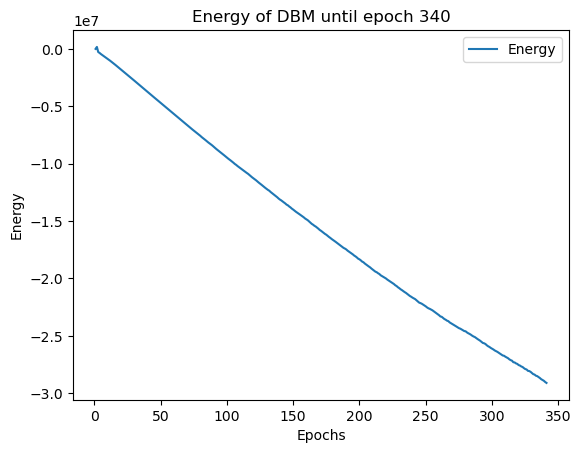

Starting...:  17%|███▊                  | 342/2000 [4:21:51<21:14:37, 46.13s/it]

Time taken for DBM epoch 341 is 46.13573241233826


Starting...:  17%|███▊                  | 343/2000 [4:22:37<21:13:37, 46.12s/it]

Time taken for DBM epoch 342 is 46.09849739074707


Starting...:  17%|███▊                  | 344/2000 [4:23:23<21:12:53, 46.12s/it]

Time taken for DBM epoch 343 is 46.12155628204346


Starting...:  17%|███▊                  | 345/2000 [4:24:09<21:12:40, 46.14s/it]

Time taken for DBM epoch 344 is 46.18606996536255


Starting...:  17%|███▊                  | 346/2000 [4:24:56<21:11:46, 46.13s/it]

Time taken for DBM epoch 345 is 46.1218478679657


Starting...:  17%|███▊                  | 347/2000 [4:25:42<21:10:19, 46.11s/it]

Time taken for DBM epoch 346 is 46.05201077461243


Starting...:  17%|███▊                  | 348/2000 [4:26:27<21:07:39, 46.04s/it]

Time taken for DBM epoch 347 is 45.87930393218994


Starting...:  17%|███▊                  | 349/2000 [4:27:13<21:04:02, 45.94s/it]

Time taken for DBM epoch 348 is 45.69615054130554


Starting...:  18%|███▊                  | 350/2000 [4:27:59<21:00:41, 45.84s/it]

Time taken for DBM epoch 349 is 45.62413477897644


Starting...:  18%|███▊                  | 350/2000 [4:28:44<21:00:41, 45.84s/it]

Time taken for DBM epoch 350 is 45.62162804603577


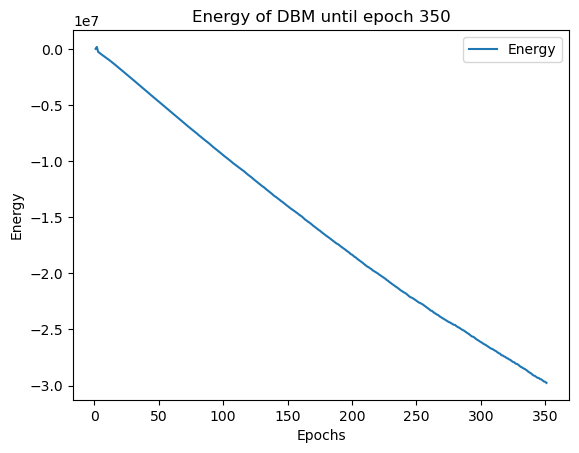

Starting...:  18%|███▊                  | 352/2000 [4:29:30<20:55:24, 45.71s/it]

Time taken for DBM epoch 351 is 45.46837568283081


Starting...:  18%|███▉                  | 353/2000 [4:30:16<20:53:29, 45.66s/it]

Time taken for DBM epoch 352 is 45.56631135940552


Starting...:  18%|███▉                  | 354/2000 [4:31:01<20:51:55, 45.63s/it]

Time taken for DBM epoch 353 is 45.56459641456604


Starting...:  18%|███▉                  | 355/2000 [4:31:47<20:50:19, 45.60s/it]

Time taken for DBM epoch 354 is 45.53313136100769


Starting...:  18%|███▉                  | 356/2000 [4:32:32<20:48:56, 45.58s/it]

Time taken for DBM epoch 355 is 45.52885055541992


Starting...:  18%|███▉                  | 357/2000 [4:33:18<20:47:36, 45.56s/it]

Time taken for DBM epoch 356 is 45.510451316833496


Starting...:  18%|███▉                  | 358/2000 [4:34:03<20:46:11, 45.54s/it]

Time taken for DBM epoch 357 is 45.48172354698181


Starting...:  18%|███▉                  | 359/2000 [4:34:49<20:45:19, 45.53s/it]

Time taken for DBM epoch 358 is 45.522260427474976


Starting...:  18%|███▉                  | 360/2000 [4:35:34<20:44:43, 45.54s/it]

Time taken for DBM epoch 359 is 45.552759408950806


Starting...:  18%|███▉                  | 360/2000 [4:36:20<20:44:43, 45.54s/it]

Time taken for DBM epoch 360 is 45.58562159538269


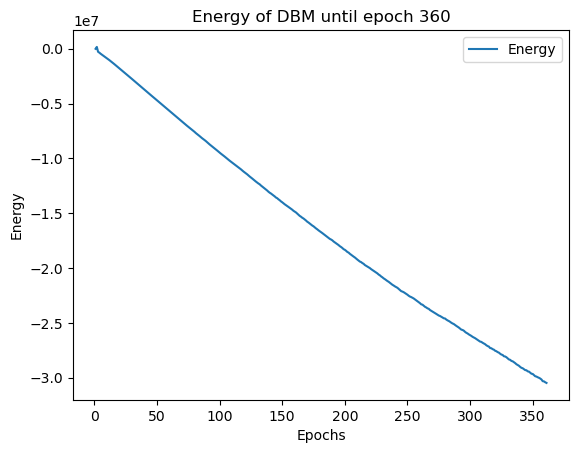

Starting...:  18%|███▉                  | 362/2000 [4:37:06<20:44:42, 45.59s/it]

Time taken for DBM epoch 361 is 45.61293864250183


Starting...:  18%|███▉                  | 363/2000 [4:37:51<20:44:27, 45.61s/it]

Time taken for DBM epoch 362 is 45.65424871444702


Starting...:  18%|████                  | 364/2000 [4:38:37<20:44:24, 45.64s/it]

Time taken for DBM epoch 363 is 45.698360443115234


Starting...:  18%|████                  | 365/2000 [4:39:23<20:44:41, 45.68s/it]

Time taken for DBM epoch 364 is 45.767122745513916


Starting...:  18%|████                  | 366/2000 [4:40:08<20:44:47, 45.71s/it]

Time taken for DBM epoch 365 is 45.78117775917053


Starting...:  18%|████                  | 367/2000 [4:40:54<20:44:17, 45.72s/it]

Time taken for DBM epoch 366 is 45.740763425827026


Starting...:  18%|████                  | 368/2000 [4:41:40<20:44:06, 45.74s/it]

Time taken for DBM epoch 367 is 45.78849697113037


Starting...:  18%|████                  | 369/2000 [4:42:26<20:44:22, 45.78s/it]

Time taken for DBM epoch 368 is 45.8650586605072


Starting...:  18%|████                  | 370/2000 [4:43:12<20:43:56, 45.79s/it]

Time taken for DBM epoch 369 is 45.81656551361084


Starting...:  18%|████                  | 370/2000 [4:43:58<20:43:56, 45.79s/it]

Time taken for DBM epoch 370 is 45.87333607673645


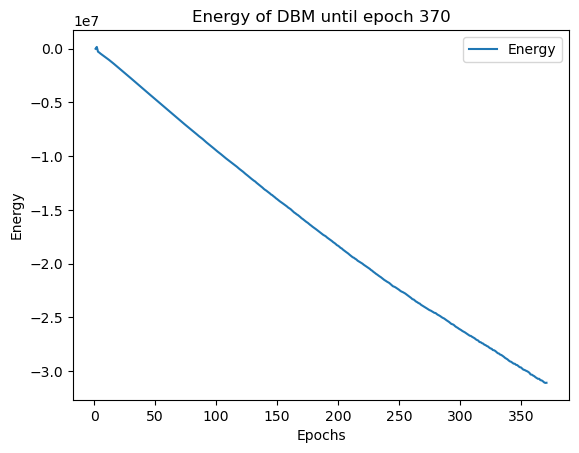

Starting...:  19%|████                  | 372/2000 [4:44:44<20:44:06, 45.85s/it]

Time taken for DBM epoch 371 is 45.8650107383728


Starting...:  19%|████                  | 373/2000 [4:45:29<20:43:37, 45.86s/it]

Time taken for DBM epoch 372 is 45.88663148880005


Starting...:  19%|████                  | 374/2000 [4:46:15<20:42:37, 45.85s/it]

Time taken for DBM epoch 373 is 45.83291697502136


Starting...:  19%|████▏                 | 375/2000 [4:47:01<20:42:39, 45.88s/it]

Time taken for DBM epoch 374 is 45.94949150085449


Starting...:  19%|████▏                 | 376/2000 [4:47:47<20:42:17, 45.90s/it]

Time taken for DBM epoch 375 is 45.9324209690094


Starting...:  19%|████▏                 | 377/2000 [4:48:33<20:41:40, 45.90s/it]

Time taken for DBM epoch 376 is 45.915462017059326


Starting...:  19%|████▏                 | 378/2000 [4:49:19<20:42:21, 45.96s/it]

Time taken for DBM epoch 377 is 46.079657316207886


Starting...:  19%|████▏                 | 379/2000 [4:50:06<20:45:00, 46.08s/it]

Time taken for DBM epoch 378 is 46.37799644470215


Starting...:  19%|████▏                 | 380/2000 [4:50:52<20:46:12, 46.16s/it]

Time taken for DBM epoch 379 is 46.3266761302948


Starting...:  19%|████▏                 | 380/2000 [4:51:38<20:46:12, 46.16s/it]

Time taken for DBM epoch 380 is 46.40051984786987


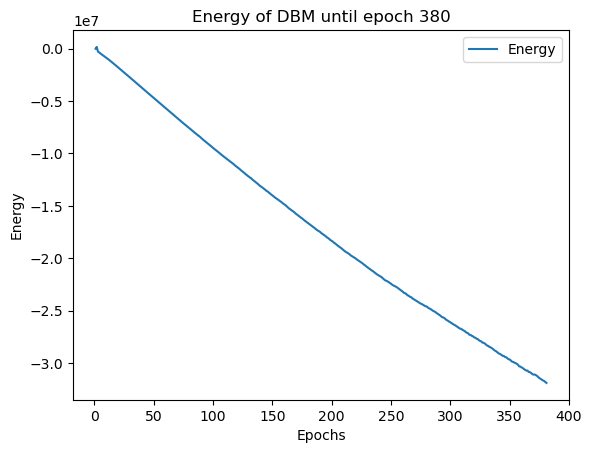

Starting...:  19%|████▏                 | 382/2000 [4:52:25<20:48:16, 46.29s/it]

Time taken for DBM epoch 381 is 46.35089135169983


Starting...:  19%|████▏                 | 383/2000 [4:53:11<20:48:24, 46.32s/it]

Time taken for DBM epoch 382 is 46.40035390853882


Starting...:  19%|████▏                 | 384/2000 [4:53:58<20:48:45, 46.36s/it]

Time taken for DBM epoch 383 is 46.462016582489014


Starting...:  19%|████▏                 | 385/2000 [4:54:44<20:48:56, 46.40s/it]

Time taken for DBM epoch 384 is 46.481703996658325


Starting...:  19%|████▏                 | 386/2000 [4:55:30<20:48:10, 46.40s/it]

Time taken for DBM epoch 385 is 46.401875495910645


Starting...:  19%|████▎                 | 387/2000 [4:56:17<20:48:24, 46.44s/it]

Time taken for DBM epoch 386 is 46.523730516433716


Starting...:  19%|████▎                 | 388/2000 [4:57:03<20:47:29, 46.43s/it]

Time taken for DBM epoch 387 is 46.42112731933594


Starting...:  19%|████▎                 | 389/2000 [4:57:50<20:45:34, 46.39s/it]

Time taken for DBM epoch 388 is 46.2894127368927


Starting...:  20%|████▎                 | 390/2000 [4:58:36<20:41:27, 46.27s/it]

Time taken for DBM epoch 389 is 45.975157499313354


Starting...:  20%|████▎                 | 390/2000 [4:59:22<20:41:27, 46.27s/it]

Time taken for DBM epoch 390 is 45.90184283256531


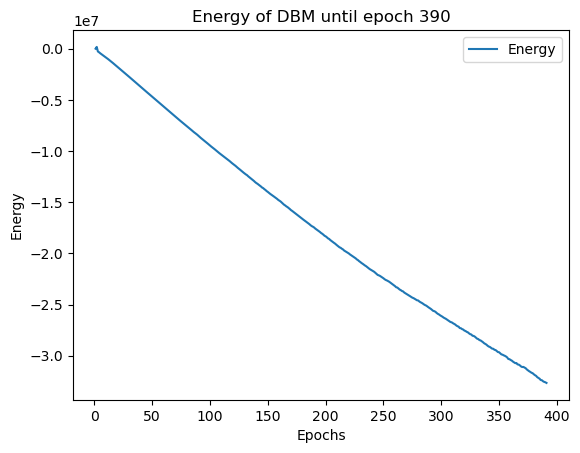

Starting...:  20%|████▎                 | 392/2000 [5:00:07<20:34:46, 46.07s/it]

Time taken for DBM epoch 391 is 45.80282473564148


Starting...:  20%|████▎                 | 393/2000 [5:00:53<20:30:45, 45.95s/it]

Time taken for DBM epoch 392 is 45.66953444480896


Starting...:  20%|████▎                 | 394/2000 [5:01:39<20:28:06, 45.88s/it]

Time taken for DBM epoch 393 is 45.7163462638855


Starting...:  20%|████▎                 | 395/2000 [5:02:25<20:25:54, 45.83s/it]

Time taken for DBM epoch 394 is 45.70299959182739


Starting...:  20%|████▎                 | 396/2000 [5:03:10<20:23:42, 45.77s/it]

Time taken for DBM epoch 395 is 45.64930820465088


Starting...:  20%|████▎                 | 397/2000 [5:03:56<20:21:34, 45.72s/it]

Time taken for DBM epoch 396 is 45.60252070426941


Starting...:  20%|████▍                 | 398/2000 [5:04:42<20:20:45, 45.72s/it]

Time taken for DBM epoch 397 is 45.715373277664185


Starting...:  20%|████▍                 | 399/2000 [5:05:27<20:19:56, 45.72s/it]

Time taken for DBM epoch 398 is 45.71470379829407


Starting...:  20%|████▍                 | 400/2000 [5:06:13<20:19:41, 45.74s/it]

Time taken for DBM epoch 399 is 45.782960653305054


Starting...:  20%|████▍                 | 400/2000 [5:06:59<20:19:41, 45.74s/it]

Time taken for DBM epoch 400 is 45.707432985305786


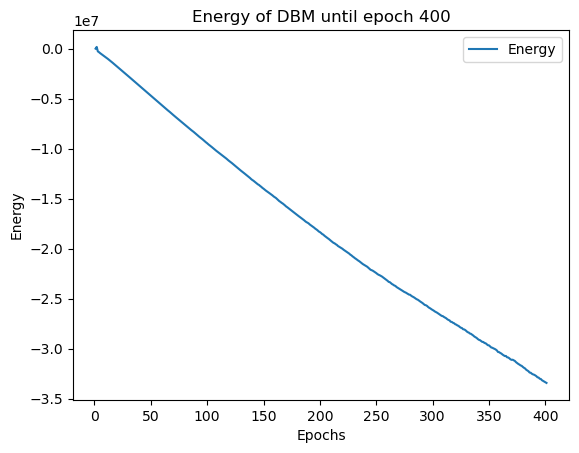

Starting...:  20%|████▍                 | 402/2000 [5:07:45<20:19:27, 45.79s/it]

Time taken for DBM epoch 401 is 45.84102964401245


Starting...:  20%|████▍                 | 403/2000 [5:08:30<20:18:48, 45.79s/it]

Time taken for DBM epoch 402 is 45.799593925476074


Starting...:  20%|████▍                 | 404/2000 [5:09:16<20:18:38, 45.81s/it]

Time taken for DBM epoch 403 is 45.86513829231262


Starting...:  20%|████▍                 | 405/2000 [5:10:02<20:18:05, 45.82s/it]

Time taken for DBM epoch 404 is 45.839900493621826


Starting...:  20%|████▍                 | 406/2000 [5:10:48<20:16:45, 45.80s/it]

Time taken for DBM epoch 405 is 45.749640226364136


Starting...:  20%|████▍                 | 407/2000 [5:11:34<20:16:12, 45.81s/it]

Time taken for DBM epoch 406 is 45.82613801956177


Starting...:  20%|████▍                 | 408/2000 [5:12:20<20:15:23, 45.81s/it]

Time taken for DBM epoch 407 is 45.80072021484375


Starting...:  20%|████▍                 | 409/2000 [5:13:05<20:15:10, 45.83s/it]

Time taken for DBM epoch 408 is 45.87413144111633


Starting...:  20%|████▌                 | 410/2000 [5:13:51<20:13:59, 45.81s/it]

Time taken for DBM epoch 409 is 45.774779319763184


Starting...:  20%|████▌                 | 410/2000 [5:14:37<20:13:59, 45.81s/it]

Time taken for DBM epoch 410 is 45.83693528175354


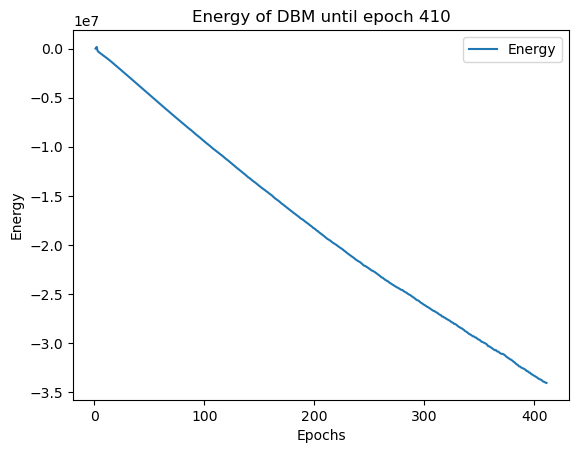

Starting...:  21%|████▌                 | 412/2000 [5:15:23<20:12:44, 45.82s/it]

Time taken for DBM epoch 411 is 45.75750017166138


Starting...:  21%|████▌                 | 413/2000 [5:16:09<20:11:45, 45.81s/it]

Time taken for DBM epoch 412 is 45.79349136352539


Starting...:  21%|████▌                 | 414/2000 [5:16:54<20:10:21, 45.79s/it]

Time taken for DBM epoch 413 is 45.73183250427246


Starting...:  21%|████▌                 | 415/2000 [5:17:40<20:09:17, 45.78s/it]

Time taken for DBM epoch 414 is 45.75021982192993


Starting...:  21%|████▌                 | 416/2000 [5:18:26<20:07:45, 45.75s/it]

Time taken for DBM epoch 415 is 45.67916750907898


Starting...:  21%|████▌                 | 417/2000 [5:19:12<20:06:42, 45.74s/it]

Time taken for DBM epoch 416 is 45.71219563484192


Starting...:  21%|████▌                 | 418/2000 [5:19:57<20:05:40, 45.73s/it]

Time taken for DBM epoch 417 is 45.70261263847351


Starting...:  21%|████▌                 | 419/2000 [5:20:43<20:04:27, 45.71s/it]

Time taken for DBM epoch 418 is 45.66849637031555


Starting...:  21%|████▌                 | 420/2000 [5:21:29<20:03:19, 45.70s/it]

Time taken for DBM epoch 419 is 45.66386795043945


Starting...:  21%|████▌                 | 420/2000 [5:22:14<20:03:19, 45.70s/it]

Time taken for DBM epoch 420 is 45.597267866134644


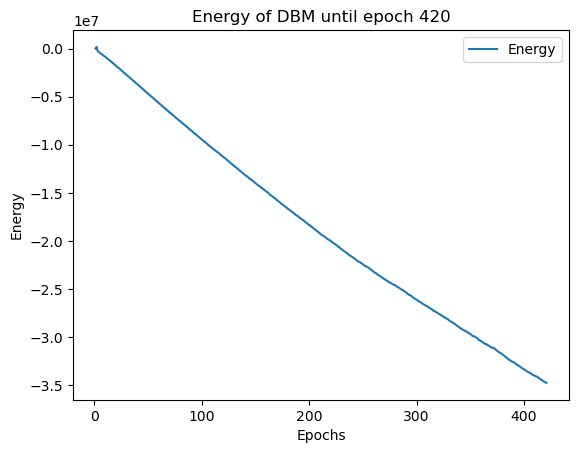

Starting...:  21%|████▋                 | 422/2000 [5:23:00<20:01:50, 45.70s/it]

Time taken for DBM epoch 421 is 45.69624185562134


Starting...:  21%|████▋                 | 423/2000 [5:23:46<20:00:28, 45.67s/it]

Time taken for DBM epoch 422 is 45.61971092224121


Starting...:  21%|████▋                 | 424/2000 [5:24:31<19:58:49, 45.64s/it]

Time taken for DBM epoch 423 is 45.562744140625


Starting...:  21%|████▋                 | 425/2000 [5:25:17<19:57:12, 45.61s/it]

Time taken for DBM epoch 424 is 45.52978205680847


Starting...:  21%|████▋                 | 426/2000 [5:26:02<19:55:39, 45.58s/it]

Time taken for DBM epoch 425 is 45.50776267051697


Starting...:  21%|████▋                 | 427/2000 [5:26:48<19:54:02, 45.54s/it]

Time taken for DBM epoch 426 is 45.46775221824646


Starting...:  21%|████▋                 | 428/2000 [5:27:33<19:52:40, 45.52s/it]

Time taken for DBM epoch 427 is 45.46873354911804


Starting...:  21%|████▋                 | 429/2000 [5:28:19<19:51:38, 45.51s/it]

Time taken for DBM epoch 428 is 45.48559808731079


Starting...:  22%|████▋                 | 430/2000 [5:29:04<19:50:17, 45.49s/it]

Time taken for DBM epoch 429 is 45.43549704551697


Starting...:  22%|████▋                 | 430/2000 [5:29:50<19:50:17, 45.49s/it]

Time taken for DBM epoch 430 is 45.45047950744629


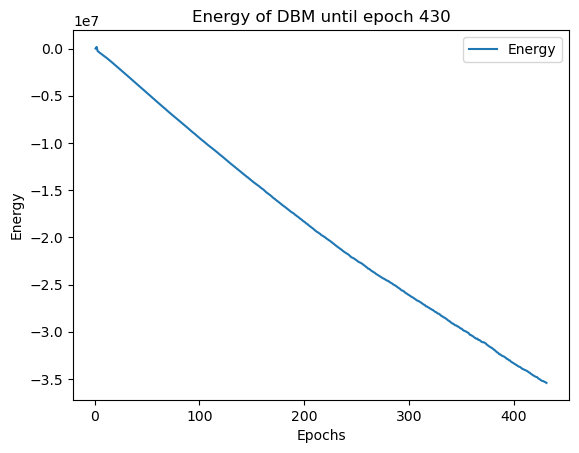

Starting...:  22%|████▊                 | 432/2000 [5:30:35<19:48:09, 45.47s/it]

Time taken for DBM epoch 431 is 45.36621308326721


Starting...:  22%|████▊                 | 433/2000 [5:31:20<19:47:20, 45.46s/it]

Time taken for DBM epoch 432 is 45.45813798904419


Starting...:  22%|████▊                 | 434/2000 [5:32:06<19:46:44, 45.47s/it]

Time taken for DBM epoch 433 is 45.48141074180603


Starting...:  22%|████▊                 | 435/2000 [5:32:51<19:46:16, 45.48s/it]

Time taken for DBM epoch 434 is 45.50696301460266


Starting...:  22%|████▊                 | 436/2000 [5:33:37<19:46:12, 45.51s/it]

Time taken for DBM epoch 435 is 45.56862831115723


Starting...:  22%|████▊                 | 437/2000 [5:34:23<19:45:58, 45.53s/it]

Time taken for DBM epoch 436 is 45.57189989089966


Starting...:  22%|████▊                 | 438/2000 [5:35:08<19:45:49, 45.55s/it]

Time taken for DBM epoch 437 is 45.60422921180725


Starting...:  22%|████▊                 | 439/2000 [5:35:54<19:45:39, 45.57s/it]

Time taken for DBM epoch 438 is 45.62522220611572


Starting...:  22%|████▊                 | 440/2000 [5:36:40<19:46:13, 45.62s/it]

Time taken for DBM epoch 439 is 45.74395990371704


Starting...:  22%|████▊                 | 440/2000 [5:37:25<19:46:13, 45.62s/it]

Time taken for DBM epoch 440 is 45.76035761833191


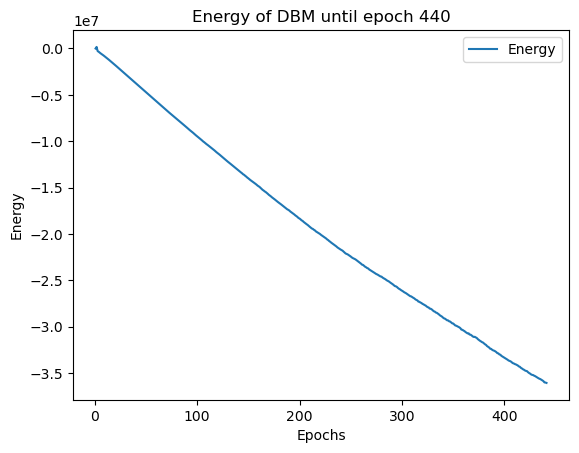

Starting...:  22%|████▊                 | 442/2000 [5:38:11<19:47:05, 45.72s/it]

Time taken for DBM epoch 441 is 45.762134075164795


Starting...:  22%|████▊                 | 443/2000 [5:38:57<19:46:13, 45.71s/it]

Time taken for DBM epoch 442 is 45.70148253440857


Starting...:  22%|████▉                 | 444/2000 [5:39:43<19:45:59, 45.73s/it]

Time taken for DBM epoch 443 is 45.778926372528076


Starting...:  22%|████▉                 | 445/2000 [5:40:28<19:45:42, 45.75s/it]

Time taken for DBM epoch 444 is 45.793107748031616


Starting...:  22%|████▉                 | 446/2000 [5:41:14<19:45:33, 45.77s/it]

Time taken for DBM epoch 445 is 45.82835102081299


Starting...:  22%|████▉                 | 447/2000 [5:42:00<19:45:16, 45.79s/it]

Time taken for DBM epoch 446 is 45.83567929267883


Starting...:  22%|████▉                 | 448/2000 [5:42:46<19:44:29, 45.79s/it]

Time taken for DBM epoch 447 is 45.79071307182312


Starting...:  22%|████▉                 | 449/2000 [5:43:32<19:43:39, 45.79s/it]

Time taken for DBM epoch 448 is 45.78333783149719


Starting...:  22%|████▉                 | 450/2000 [5:44:18<19:43:10, 45.80s/it]

Time taken for DBM epoch 449 is 45.825016021728516


Starting...:  22%|████▉                 | 450/2000 [5:45:03<19:43:10, 45.80s/it]

Time taken for DBM epoch 450 is 45.82166910171509


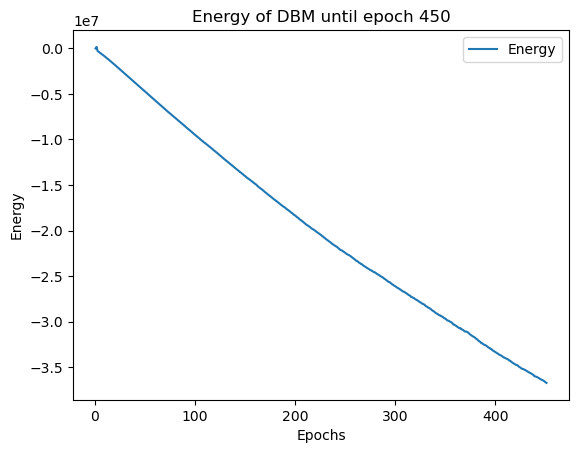

Starting...:  23%|████▉                 | 452/2000 [5:45:49<19:42:12, 45.82s/it]

Time taken for DBM epoch 451 is 45.78571391105652


Starting...:  23%|████▉                 | 453/2000 [5:46:35<19:41:08, 45.81s/it]

Time taken for DBM epoch 452 is 45.78217172622681


Starting...:  23%|████▉                 | 454/2000 [5:47:21<19:40:24, 45.81s/it]

Time taken for DBM epoch 453 is 45.814380168914795


Starting...:  23%|█████                 | 455/2000 [5:48:07<19:39:31, 45.81s/it]

Time taken for DBM epoch 454 is 45.79440236091614


Starting...:  23%|█████                 | 456/2000 [5:48:52<19:38:20, 45.79s/it]

Time taken for DBM epoch 455 is 45.752777338027954


Starting...:  23%|█████                 | 457/2000 [5:49:38<19:37:33, 45.79s/it]

Time taken for DBM epoch 456 is 45.78731966018677


Starting...:  23%|█████                 | 458/2000 [5:50:24<19:35:55, 45.76s/it]

Time taken for DBM epoch 457 is 45.67634105682373


Starting...:  23%|█████                 | 459/2000 [5:51:10<19:34:49, 45.74s/it]

Time taken for DBM epoch 458 is 45.711567878723145


Starting...:  23%|█████                 | 460/2000 [5:51:55<19:33:57, 45.74s/it]

Time taken for DBM epoch 459 is 45.729567527770996


Starting...:  23%|█████                 | 460/2000 [5:52:41<19:33:57, 45.74s/it]

Time taken for DBM epoch 460 is 45.6795015335083


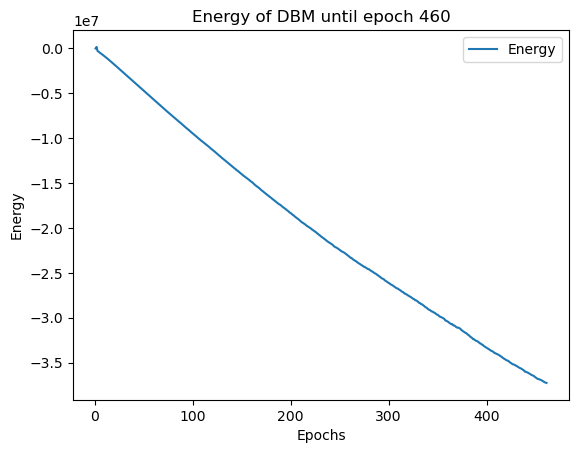

Starting...:  23%|█████                 | 462/2000 [5:53:27<19:32:34, 45.74s/it]

Time taken for DBM epoch 461 is 45.72592210769653


Starting...:  23%|█████                 | 463/2000 [5:54:13<19:31:40, 45.74s/it]

Time taken for DBM epoch 462 is 45.72553491592407


Starting...:  23%|█████                 | 464/2000 [5:54:58<19:30:15, 45.71s/it]

Time taken for DBM epoch 463 is 45.6537401676178


Starting...:  23%|█████                 | 465/2000 [5:55:44<19:29:11, 45.70s/it]

Time taken for DBM epoch 464 is 45.67230033874512


Starting...:  23%|█████▏                | 466/2000 [5:56:29<19:27:41, 45.67s/it]

Time taken for DBM epoch 465 is 45.606027126312256


Starting...:  23%|█████▏                | 467/2000 [5:57:15<19:25:20, 45.61s/it]

Time taken for DBM epoch 466 is 45.46408677101135


Starting...:  23%|█████▏                | 468/2000 [5:58:01<19:24:33, 45.61s/it]

Time taken for DBM epoch 467 is 45.607733964920044


Starting...:  23%|█████▏                | 469/2000 [5:58:46<19:22:38, 45.56s/it]

Time taken for DBM epoch 468 is 45.45733904838562


Starting...:  24%|█████▏                | 470/2000 [5:59:32<19:22:12, 45.58s/it]

Time taken for DBM epoch 469 is 45.606969594955444


Starting...:  24%|█████▏                | 470/2000 [6:00:17<19:22:12, 45.58s/it]

Time taken for DBM epoch 470 is 45.40422344207764


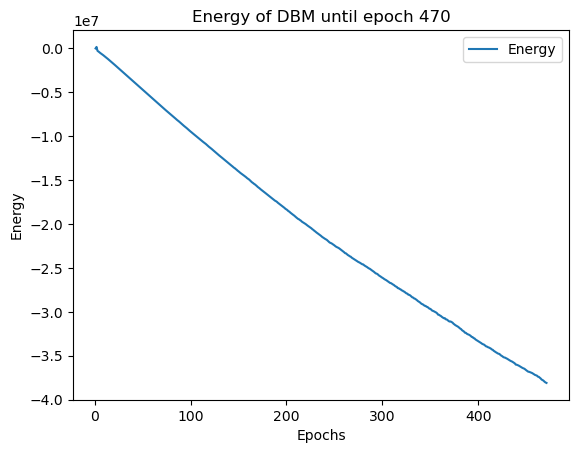

Starting...:  24%|█████▏                | 472/2000 [6:01:03<19:19:47, 45.54s/it]

Time taken for DBM epoch 471 is 45.50490641593933


Starting...:  24%|█████▏                | 473/2000 [6:01:48<19:18:30, 45.52s/it]

Time taken for DBM epoch 472 is 45.47105956077576


Starting...:  24%|█████▏                | 474/2000 [6:02:34<19:17:17, 45.50s/it]

Time taken for DBM epoch 473 is 45.4611120223999


Starting...:  24%|█████▏                | 475/2000 [6:03:19<19:16:18, 45.49s/it]

Time taken for DBM epoch 474 is 45.47314405441284


Starting...:  24%|█████▏                | 476/2000 [6:04:05<19:15:22, 45.49s/it]

Time taken for DBM epoch 475 is 45.47002577781677


Starting...:  24%|█████▏                | 477/2000 [6:04:50<19:14:51, 45.50s/it]

Time taken for DBM epoch 476 is 45.51756691932678


Starting...:  24%|█████▎                | 478/2000 [6:05:36<19:15:26, 45.55s/it]

Time taken for DBM epoch 477 is 45.67388415336609


Starting...:  24%|█████▎                | 479/2000 [6:06:21<19:15:22, 45.58s/it]

Time taken for DBM epoch 478 is 45.63941264152527


Starting...:  24%|█████▎                | 480/2000 [6:07:07<19:15:20, 45.61s/it]

Time taken for DBM epoch 479 is 45.67236876487732


Starting...:  24%|█████▎                | 480/2000 [6:07:53<19:15:20, 45.61s/it]

Time taken for DBM epoch 480 is 45.69036555290222


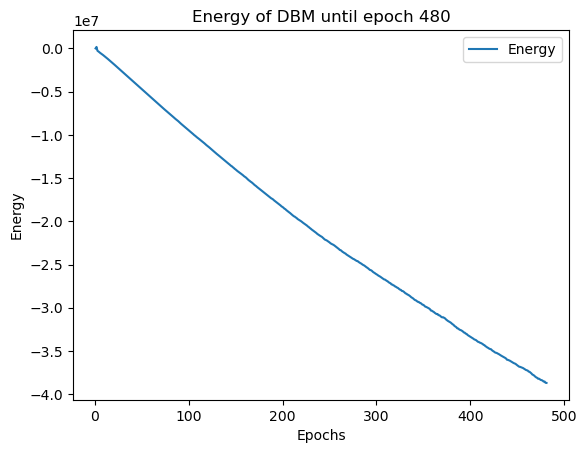

Starting...:  24%|█████▎                | 482/2000 [6:08:38<19:15:21, 45.67s/it]

Time taken for DBM epoch 481 is 45.67666029930115


Starting...:  24%|█████▎                | 483/2000 [6:09:24<19:14:44, 45.67s/it]

Time taken for DBM epoch 482 is 45.686086654663086


Starting...:  24%|█████▎                | 484/2000 [6:10:10<19:14:08, 45.68s/it]

Time taken for DBM epoch 483 is 45.69334626197815


Starting...:  24%|█████▎                | 485/2000 [6:10:56<19:13:27, 45.68s/it]

Time taken for DBM epoch 484 is 45.688029766082764


Starting...:  24%|█████▎                | 486/2000 [6:11:41<19:13:03, 45.70s/it]

Time taken for DBM epoch 485 is 45.72913336753845


Starting...:  24%|█████▎                | 487/2000 [6:12:27<19:12:57, 45.72s/it]

Time taken for DBM epoch 486 is 45.783010721206665


Starting...:  24%|█████▎                | 488/2000 [6:13:13<19:12:15, 45.72s/it]

Time taken for DBM epoch 487 is 45.72888398170471


Starting...:  24%|█████▍                | 489/2000 [6:13:59<19:11:28, 45.72s/it]

Time taken for DBM epoch 488 is 45.722107887268066


Starting...:  24%|█████▍                | 490/2000 [6:14:44<19:10:27, 45.71s/it]

Time taken for DBM epoch 489 is 45.68854093551636


Starting...:  24%|█████▍                | 490/2000 [6:15:30<19:10:27, 45.71s/it]

Time taken for DBM epoch 490 is 45.758190393447876


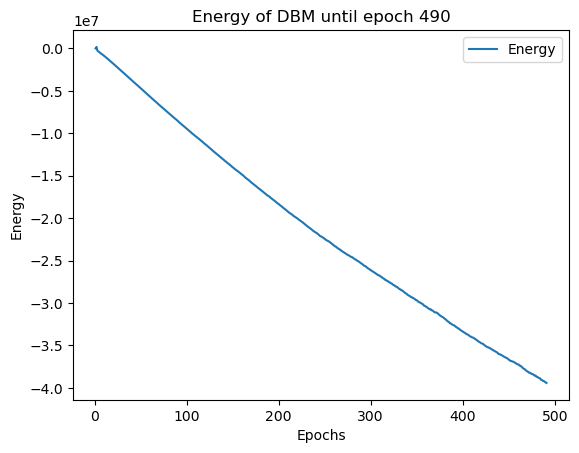

Starting...:  25%|█████▍                | 492/2000 [6:16:16<19:09:39, 45.74s/it]

Time taken for DBM epoch 491 is 45.69888997077942


Starting...:  25%|█████▍                | 493/2000 [6:17:01<19:08:31, 45.73s/it]

Time taken for DBM epoch 492 is 45.69329905509949


Starting...:  25%|█████▍                | 494/2000 [6:17:47<19:07:47, 45.73s/it]

Time taken for DBM epoch 493 is 45.72991394996643


Starting...:  25%|█████▍                | 495/2000 [6:18:33<19:06:50, 45.72s/it]

Time taken for DBM epoch 494 is 45.70374417304993


Starting...:  25%|█████▍                | 496/2000 [6:19:19<19:05:36, 45.70s/it]

Time taken for DBM epoch 495 is 45.65733551979065


Starting...:  25%|█████▍                | 497/2000 [6:20:04<19:04:35, 45.69s/it]

Time taken for DBM epoch 496 is 45.66853904724121


Starting...:  25%|█████▍                | 498/2000 [6:20:50<19:03:27, 45.68s/it]

Time taken for DBM epoch 497 is 45.64198541641235


Starting...:  25%|█████▍                | 499/2000 [6:21:36<19:02:26, 45.67s/it]

Time taken for DBM epoch 498 is 45.642637968063354


Starting...:  25%|█████▌                | 500/2000 [6:22:21<19:01:09, 45.65s/it]

Time taken for DBM epoch 499 is 45.597031593322754


Starting...:  25%|█████▌                | 500/2000 [6:23:07<19:01:09, 45.65s/it]

Time taken for DBM epoch 500 is 45.62347912788391


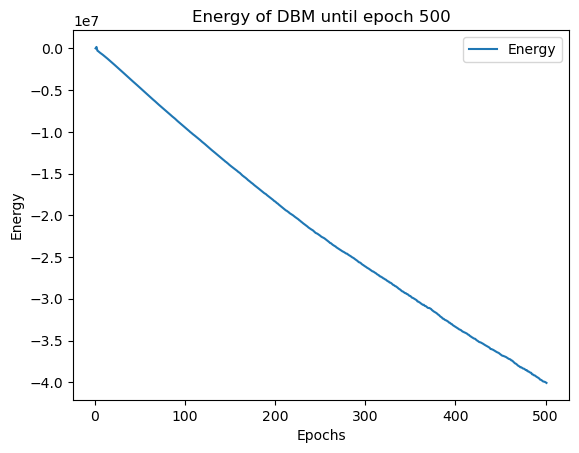

Starting...:  25%|█████▌                | 502/2000 [6:23:53<19:00:04, 45.66s/it]

Time taken for DBM epoch 501 is 45.643954277038574


Starting...:  25%|█████▌                | 503/2000 [6:24:38<18:59:24, 45.67s/it]

Time taken for DBM epoch 502 is 45.67485809326172


Starting...:  25%|█████▌                | 504/2000 [6:25:24<18:58:18, 45.65s/it]

Time taken for DBM epoch 503 is 45.6225643157959


Starting...:  25%|█████▌                | 505/2000 [6:26:09<18:57:09, 45.64s/it]

Time taken for DBM epoch 504 is 45.60125994682312


Starting...:  25%|█████▌                | 506/2000 [6:26:55<18:56:19, 45.64s/it]

Time taken for DBM epoch 505 is 45.62900424003601


Starting...:  25%|█████▌                | 507/2000 [6:27:41<18:55:06, 45.62s/it]

Time taken for DBM epoch 506 is 45.5731725692749


Starting...:  25%|█████▌                | 508/2000 [6:28:26<18:53:56, 45.60s/it]

Time taken for DBM epoch 507 is 45.56345319747925


Starting...:  25%|█████▌                | 509/2000 [6:29:12<18:52:29, 45.57s/it]

Time taken for DBM epoch 508 is 45.50651431083679


Starting...:  26%|█████▌                | 510/2000 [6:29:57<18:50:29, 45.52s/it]

Time taken for DBM epoch 509 is 45.40744471549988


Starting...:  26%|█████▌                | 510/2000 [6:30:43<18:50:29, 45.52s/it]

Time taken for DBM epoch 510 is 45.42319321632385


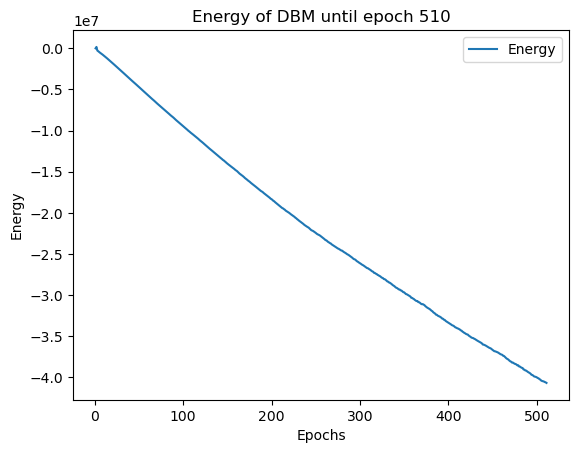

Starting...:  26%|█████▋                | 512/2000 [6:31:28<18:48:30, 45.50s/it]

Time taken for DBM epoch 511 is 45.45545744895935


Starting...:  26%|█████▋                | 513/2000 [6:32:13<18:47:06, 45.48s/it]

Time taken for DBM epoch 512 is 45.41777849197388


Starting...:  26%|█████▋                | 514/2000 [6:32:59<18:45:34, 45.45s/it]

Time taken for DBM epoch 513 is 45.374305725097656


Starting...:  26%|█████▋                | 515/2000 [6:33:44<18:44:33, 45.44s/it]

Time taken for DBM epoch 514 is 45.41007995605469


Starting...:  26%|█████▋                | 516/2000 [6:34:30<18:43:23, 45.42s/it]

Time taken for DBM epoch 515 is 45.38271999359131


Starting...:  26%|█████▋                | 517/2000 [6:35:15<18:42:19, 45.41s/it]

Time taken for DBM epoch 516 is 45.37619924545288


Starting...:  26%|█████▋                | 518/2000 [6:36:01<18:42:06, 45.43s/it]

Time taken for DBM epoch 517 is 45.480857610702515


Starting...:  26%|█████▋                | 519/2000 [6:36:46<18:41:30, 45.44s/it]

Time taken for DBM epoch 518 is 45.450199842453


Starting...:  26%|█████▋                | 520/2000 [6:37:31<18:40:40, 45.43s/it]

Time taken for DBM epoch 519 is 45.42509198188782


Starting...:  26%|█████▋                | 520/2000 [6:38:17<18:40:40, 45.43s/it]

Time taken for DBM epoch 520 is 45.43646025657654


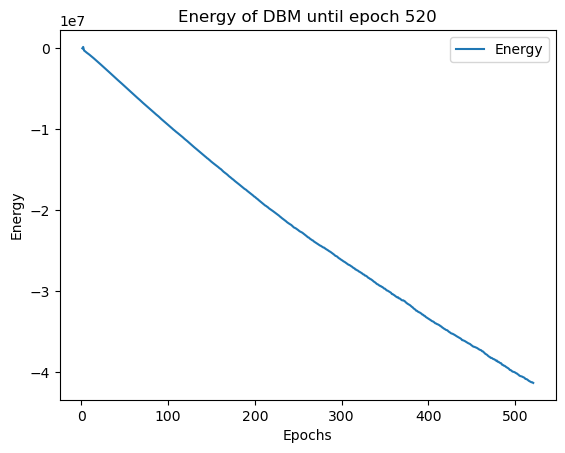

Starting...:  26%|█████▋                | 522/2000 [6:39:02<18:39:36, 45.45s/it]

Time taken for DBM epoch 521 is 45.42322897911072


Starting...:  26%|█████▊                | 523/2000 [6:39:48<18:39:52, 45.49s/it]

Time taken for DBM epoch 522 is 45.59050178527832


Starting...:  26%|█████▊                | 524/2000 [6:40:34<18:40:03, 45.53s/it]

Time taken for DBM epoch 523 is 45.619980812072754


Starting...:  26%|█████▊                | 525/2000 [6:41:19<18:40:34, 45.58s/it]

Time taken for DBM epoch 524 is 45.702418088912964


Starting...:  26%|█████▊                | 526/2000 [6:42:05<18:40:38, 45.62s/it]

Time taken for DBM epoch 525 is 45.69468832015991


Starting...:  26%|█████▊                | 527/2000 [6:42:51<18:40:44, 45.65s/it]

Time taken for DBM epoch 526 is 45.73336696624756


Starting...:  26%|█████▊                | 528/2000 [6:43:37<18:41:13, 45.70s/it]

Time taken for DBM epoch 527 is 45.81857180595398


Starting...:  26%|█████▊                | 529/2000 [6:44:22<18:41:24, 45.74s/it]

Time taken for DBM epoch 528 is 45.83133602142334


Starting...:  26%|█████▊                | 530/2000 [6:45:08<18:42:31, 45.82s/it]

Time taken for DBM epoch 529 is 45.995569705963135


Starting...:  26%|█████▊                | 530/2000 [6:45:54<18:42:31, 45.82s/it]

Time taken for DBM epoch 530 is 45.800086975097656


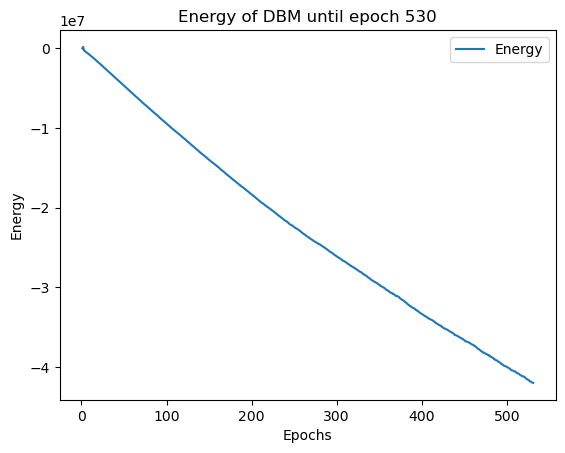

Starting...:  27%|█████▊                | 532/2000 [6:46:40<18:41:34, 45.84s/it]

Time taken for DBM epoch 531 is 45.83894181251526


Starting...:  27%|█████▊                | 533/2000 [6:47:26<18:42:38, 45.92s/it]

Time taken for DBM epoch 532 is 46.09051585197449


Starting...:  27%|█████▊                | 534/2000 [6:48:12<18:43:46, 45.99s/it]

Time taken for DBM epoch 533 is 46.174145221710205


Starting...:  27%|█████▉                | 535/2000 [6:48:59<18:44:34, 46.06s/it]

Time taken for DBM epoch 534 is 46.207735776901245


Starting...:  27%|█████▉                | 536/2000 [6:49:45<18:43:24, 46.04s/it]

Time taken for DBM epoch 535 is 46.00201153755188


Starting...:  27%|█████▉                | 537/2000 [6:50:30<18:41:12, 45.98s/it]

Time taken for DBM epoch 536 is 45.84485220909119


Starting...:  27%|█████▉                | 538/2000 [6:51:16<18:38:29, 45.90s/it]

Time taken for DBM epoch 537 is 45.71579575538635


Starting...:  27%|█████▉                | 539/2000 [6:52:02<18:36:59, 45.87s/it]

Time taken for DBM epoch 538 is 45.80069589614868


Starting...:  27%|█████▉                | 540/2000 [6:52:48<18:35:27, 45.84s/it]

Time taken for DBM epoch 539 is 45.7671582698822


Starting...:  27%|█████▉                | 540/2000 [6:53:33<18:35:27, 45.84s/it]

Time taken for DBM epoch 540 is 45.73115277290344


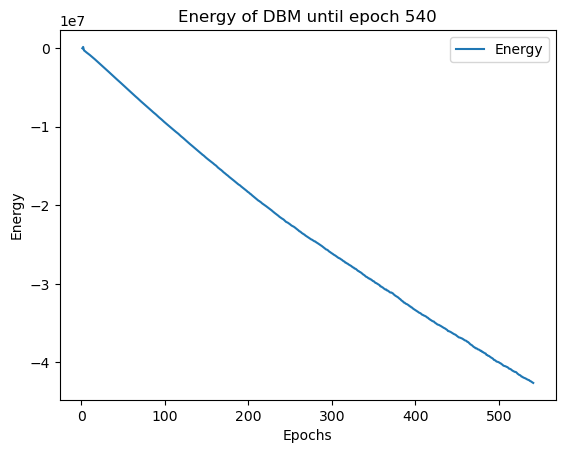

Starting...:  27%|█████▉                | 542/2000 [6:54:19<18:33:05, 45.81s/it]

Time taken for DBM epoch 541 is 45.73576807975769


Starting...:  27%|█████▉                | 543/2000 [6:55:05<18:32:01, 45.79s/it]

Time taken for DBM epoch 542 is 45.762670040130615


Starting...:  27%|█████▉                | 544/2000 [6:55:51<18:30:43, 45.77s/it]

Time taken for DBM epoch 543 is 45.72009611129761


Starting...:  27%|█████▉                | 545/2000 [6:56:36<18:29:36, 45.76s/it]

Time taken for DBM epoch 544 is 45.7215359210968


Starting...:  27%|██████                | 546/2000 [6:57:22<18:28:50, 45.76s/it]

Time taken for DBM epoch 545 is 45.755833864212036


Starting...:  27%|██████                | 547/2000 [6:58:08<18:29:42, 45.82s/it]

Time taken for DBM epoch 546 is 45.98166370391846


Starting...:  27%|██████                | 548/2000 [6:58:55<18:36:02, 46.12s/it]

Time taken for DBM epoch 547 is 46.80181002616882


Starting...:  27%|██████                | 549/2000 [6:59:42<18:41:01, 46.36s/it]

Time taken for DBM epoch 548 is 46.90980243682861


Starting...:  28%|██████                | 550/2000 [7:00:29<18:42:07, 46.43s/it]

Time taken for DBM epoch 549 is 46.61302924156189


Starting...:  28%|██████                | 550/2000 [7:01:15<18:42:07, 46.43s/it]

Time taken for DBM epoch 550 is 46.88755011558533


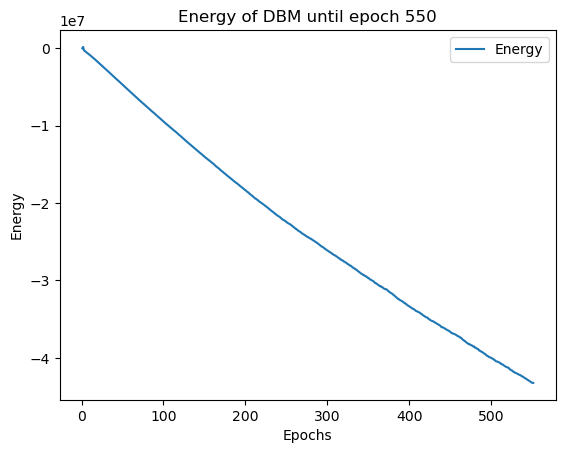

Starting...:  28%|██████                | 552/2000 [7:02:03<18:47:50, 46.73s/it]

Time taken for DBM epoch 551 is 47.05013632774353


Starting...:  28%|██████                | 553/2000 [7:02:49<18:48:29, 46.79s/it]

Time taken for DBM epoch 552 is 46.9299476146698


Starting...:  28%|██████                | 554/2000 [7:03:37<18:53:21, 47.03s/it]

Time taken for DBM epoch 553 is 47.573002338409424


Starting...:  28%|██████                | 555/2000 [7:04:24<18:52:34, 47.03s/it]

Time taken for DBM epoch 554 is 47.0284743309021


Starting...:  28%|██████                | 556/2000 [7:05:11<18:51:53, 47.03s/it]

Time taken for DBM epoch 555 is 47.04102826118469


Starting...:  28%|██████▏               | 557/2000 [7:05:59<18:54:35, 47.18s/it]

Time taken for DBM epoch 556 is 47.51236867904663


Starting...:  28%|██████▏               | 558/2000 [7:06:45<18:47:30, 46.91s/it]

Time taken for DBM epoch 557 is 46.30417323112488


Starting...:  28%|██████▏               | 559/2000 [7:07:31<18:41:50, 46.71s/it]

Time taken for DBM epoch 558 is 46.23454785346985


Starting...:  28%|██████▏               | 560/2000 [7:08:18<18:40:37, 46.69s/it]

Time taken for DBM epoch 559 is 46.64938569068909


Starting...:  28%|██████▏               | 560/2000 [7:09:05<18:40:37, 46.69s/it]

Time taken for DBM epoch 560 is 47.24988603591919


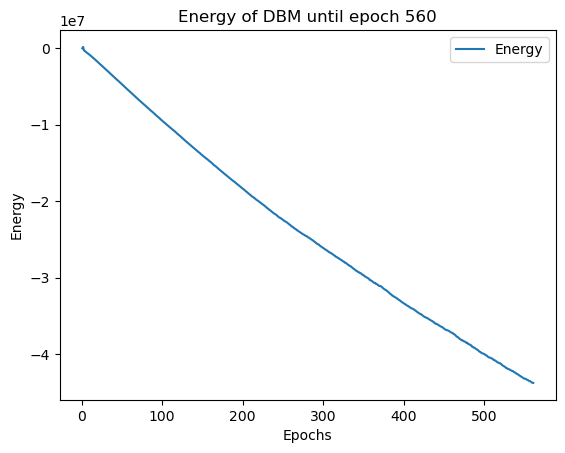

Starting...:  28%|██████▏               | 562/2000 [7:09:52<18:41:50, 46.81s/it]

Time taken for DBM epoch 561 is 46.628032207489014


Starting...:  28%|██████▏               | 563/2000 [7:10:38<18:36:55, 46.64s/it]

Time taken for DBM epoch 562 is 46.23375916481018


Starting...:  28%|██████▏               | 564/2000 [7:11:25<18:36:30, 46.65s/it]

Time taken for DBM epoch 563 is 46.68392062187195


Starting...:  28%|██████▏               | 565/2000 [7:12:11<18:32:37, 46.52s/it]

Time taken for DBM epoch 564 is 46.218772172927856


Starting...:  28%|██████▏               | 566/2000 [7:12:57<18:28:38, 46.39s/it]

Time taken for DBM epoch 565 is 46.071895599365234


Starting...:  28%|██████▏               | 567/2000 [7:13:43<18:25:33, 46.29s/it]

Time taken for DBM epoch 566 is 46.06442427635193


Starting...:  28%|██████▏               | 568/2000 [7:14:29<18:22:49, 46.21s/it]

Time taken for DBM epoch 567 is 46.01591110229492


Starting...:  28%|██████▎               | 569/2000 [7:15:15<18:20:18, 46.13s/it]

Time taken for DBM epoch 568 is 45.96225118637085


Starting...:  28%|██████▎               | 570/2000 [7:16:01<18:18:36, 46.10s/it]

Time taken for DBM epoch 569 is 46.00432276725769


Starting...:  28%|██████▎               | 570/2000 [7:16:47<18:18:36, 46.10s/it]

Time taken for DBM epoch 570 is 46.0272421836853


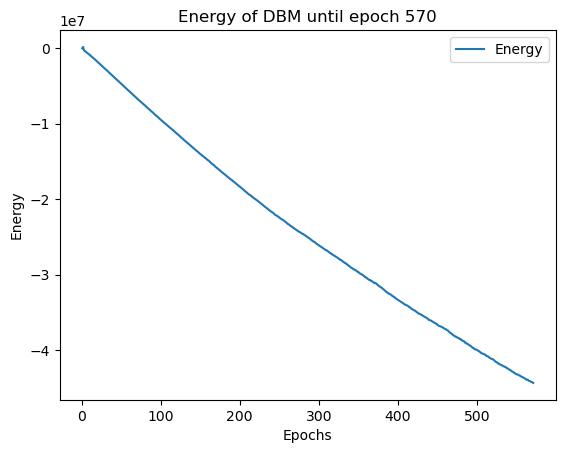

Starting...:  29%|██████▎               | 572/2000 [7:17:33<18:16:06, 46.05s/it]

Time taken for DBM epoch 571 is 45.949055194854736


Starting...:  29%|██████▎               | 573/2000 [7:18:19<18:14:44, 46.03s/it]

Time taken for DBM epoch 572 is 45.97148299217224


Starting...:  29%|██████▎               | 574/2000 [7:19:05<18:13:42, 46.02s/it]

Time taken for DBM epoch 573 is 45.99251365661621


Starting...:  29%|██████▎               | 575/2000 [7:19:51<18:12:55, 46.02s/it]

Time taken for DBM epoch 574 is 46.015647411346436


Starting...:  29%|██████▎               | 576/2000 [7:20:37<18:12:29, 46.03s/it]

Time taken for DBM epoch 575 is 46.06465029716492


Starting...:  29%|██████▎               | 577/2000 [7:21:23<18:12:16, 46.06s/it]

Time taken for DBM epoch 576 is 46.10862755775452


Starting...:  29%|██████▎               | 578/2000 [7:22:09<18:11:53, 46.07s/it]

Time taken for DBM epoch 577 is 46.107866287231445


Starting...:  29%|██████▎               | 579/2000 [7:22:55<18:10:02, 46.03s/it]

Time taken for DBM epoch 578 is 45.91876673698425


Starting...:  29%|██████▍               | 580/2000 [7:23:41<18:07:14, 45.94s/it]

Time taken for DBM epoch 579 is 45.73938536643982


Starting...:  29%|██████▍               | 580/2000 [7:24:27<18:07:14, 45.94s/it]

Time taken for DBM epoch 580 is 45.66073822975159


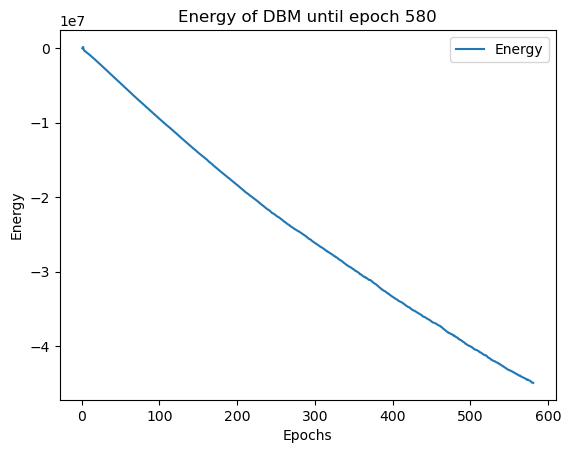

Starting...:  29%|██████▍               | 582/2000 [7:25:12<18:02:32, 45.81s/it]

Time taken for DBM epoch 581 is 45.62482213973999


Starting...:  29%|██████▍               | 583/2000 [7:25:58<18:00:17, 45.74s/it]

Time taken for DBM epoch 582 is 45.594786167144775


Starting...:  29%|██████▍               | 584/2000 [7:26:44<17:58:44, 45.71s/it]

Time taken for DBM epoch 583 is 45.62996006011963


Starting...:  29%|██████▍               | 585/2000 [7:27:29<17:57:03, 45.67s/it]

Time taken for DBM epoch 584 is 45.57974052429199


Starting...:  29%|██████▍               | 586/2000 [7:28:15<17:56:28, 45.68s/it]

Time taken for DBM epoch 585 is 45.695645332336426


Starting...:  29%|██████▍               | 587/2000 [7:29:01<17:56:01, 45.69s/it]

Time taken for DBM epoch 586 is 45.72145748138428


Starting...:  29%|██████▍               | 588/2000 [7:29:46<17:56:22, 45.74s/it]

Time taken for DBM epoch 587 is 45.84666061401367


Starting...:  29%|██████▍               | 589/2000 [7:30:32<17:55:53, 45.75s/it]

Time taken for DBM epoch 588 is 45.77816557884216


Starting...:  30%|██████▍               | 590/2000 [7:31:18<17:55:29, 45.77s/it]

Time taken for DBM epoch 589 is 45.80167746543884


Starting...:  30%|██████▍               | 590/2000 [7:32:04<17:55:29, 45.77s/it]

Time taken for DBM epoch 590 is 45.72190594673157


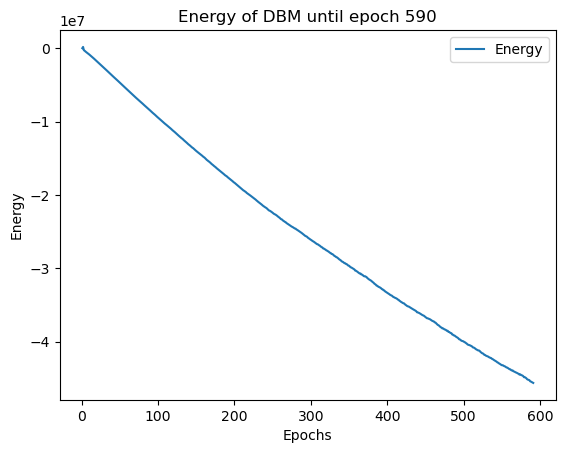

Starting...:  30%|██████▌               | 592/2000 [7:32:50<17:53:38, 45.75s/it]

Time taken for DBM epoch 591 is 45.667293548583984


Starting...:  30%|██████▌               | 593/2000 [7:33:35<17:52:27, 45.73s/it]

Time taken for DBM epoch 592 is 45.691267251968384


Starting...:  30%|██████▌               | 594/2000 [7:34:21<17:51:21, 45.72s/it]

Time taken for DBM epoch 593 is 45.68544840812683


Starting...:  30%|██████▌               | 595/2000 [7:35:07<17:51:56, 45.78s/it]

Time taken for DBM epoch 594 is 45.91003942489624


Starting...:  30%|██████▌               | 596/2000 [7:35:53<17:53:20, 45.87s/it]

Time taken for DBM epoch 595 is 46.08452272415161


Starting...:  30%|██████▌               | 597/2000 [7:36:39<17:54:14, 45.94s/it]

Time taken for DBM epoch 596 is 46.106250524520874


Starting...:  30%|██████▌               | 598/2000 [7:37:25<17:54:46, 46.00s/it]

Time taken for DBM epoch 597 is 46.126497983932495


Starting...:  30%|██████▌               | 599/2000 [7:38:11<17:53:33, 45.98s/it]

Time taken for DBM epoch 598 is 45.92998242378235


Starting...:  30%|██████▌               | 600/2000 [7:38:57<17:50:50, 45.89s/it]

Time taken for DBM epoch 599 is 45.69839882850647


Starting...:  30%|██████▌               | 600/2000 [7:39:43<17:50:50, 45.89s/it]

Time taken for DBM epoch 600 is 45.793156147003174


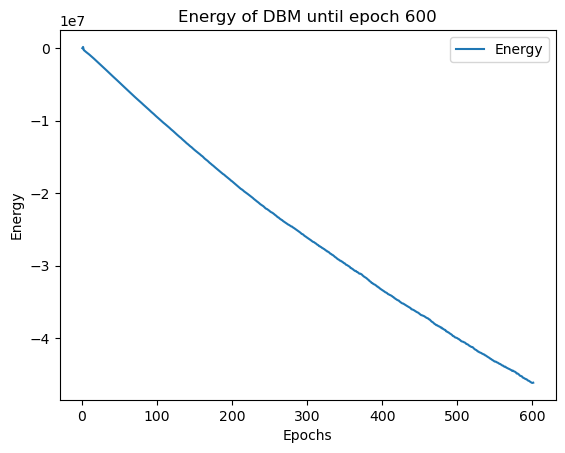

Starting...:  30%|██████▌               | 602/2000 [7:40:28<17:48:42, 45.87s/it]

Time taken for DBM epoch 601 is 45.81533217430115


Starting...:  30%|██████▋               | 603/2000 [7:41:14<17:46:38, 45.81s/it]

Time taken for DBM epoch 602 is 45.680166721343994


Starting...:  30%|██████▋               | 604/2000 [7:42:00<17:44:54, 45.77s/it]

Time taken for DBM epoch 603 is 45.67216944694519


Starting...:  30%|██████▋               | 605/2000 [7:42:45<17:43:05, 45.72s/it]

Time taken for DBM epoch 604 is 45.618788957595825


Starting...:  30%|██████▋               | 606/2000 [7:43:31<17:41:17, 45.68s/it]

Time taken for DBM epoch 605 is 45.57466006278992


Starting...:  30%|██████▋               | 607/2000 [7:44:17<17:39:46, 45.65s/it]

Time taken for DBM epoch 606 is 45.57114315032959


Starting...:  30%|██████▋               | 608/2000 [7:45:02<17:37:56, 45.60s/it]

Time taken for DBM epoch 607 is 45.49193501472473


Starting...:  30%|██████▋               | 609/2000 [7:45:48<17:38:13, 45.65s/it]

Time taken for DBM epoch 608 is 45.75044083595276


Starting...:  30%|██████▋               | 610/2000 [7:46:34<17:44:17, 45.94s/it]

Time taken for DBM epoch 609 is 46.627533197402954


Starting...:  30%|██████▋               | 610/2000 [7:47:21<17:44:17, 45.94s/it]

Time taken for DBM epoch 610 is 46.31080889701843


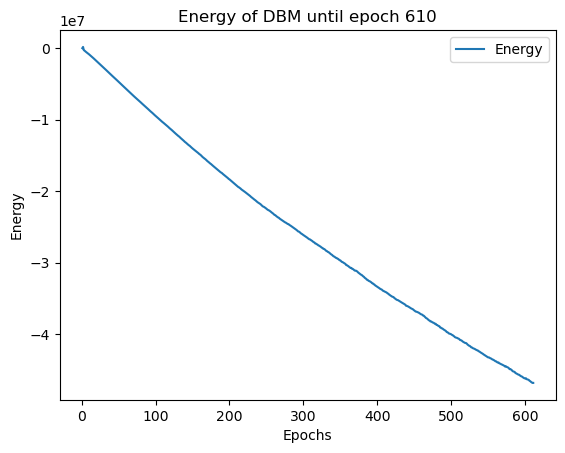

Starting...:  31%|██████▋               | 612/2000 [7:48:07<17:46:20, 46.10s/it]

Time taken for DBM epoch 611 is 46.09655523300171


Starting...:  31%|██████▋               | 613/2000 [7:48:53<17:45:39, 46.10s/it]

Time taken for DBM epoch 612 is 46.10631275177002


Starting...:  31%|██████▊               | 614/2000 [7:49:40<17:50:28, 46.34s/it]

Time taken for DBM epoch 613 is 46.905277967453


Starting...:  31%|██████▊               | 615/2000 [7:50:27<17:52:36, 46.47s/it]

Time taken for DBM epoch 614 is 46.759933948516846


Starting...:  31%|██████▊               | 616/2000 [7:51:13<17:50:34, 46.41s/it]

Time taken for DBM epoch 615 is 46.283406496047974


Starting...:  31%|██████▊               | 617/2000 [7:51:59<17:49:30, 46.40s/it]

Time taken for DBM epoch 616 is 46.36890006065369


Starting...:  31%|██████▊               | 618/2000 [7:52:46<17:49:30, 46.43s/it]

Time taken for DBM epoch 617 is 46.510701179504395


Starting...:  31%|██████▊               | 619/2000 [7:53:33<17:52:36, 46.60s/it]

Time taken for DBM epoch 618 is 46.99346113204956


Starting...:  31%|██████▊               | 620/2000 [7:54:19<17:50:46, 46.56s/it]

Time taken for DBM epoch 619 is 46.448564529418945


Starting...:  31%|██████▊               | 620/2000 [7:55:06<17:50:46, 46.56s/it]

Time taken for DBM epoch 620 is 46.092066049575806


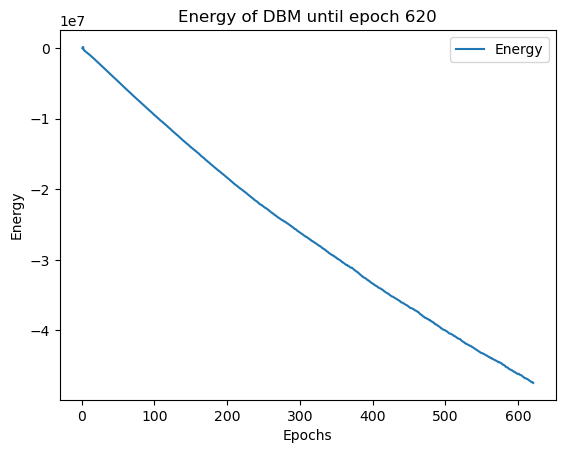

Starting...:  31%|██████▊               | 622/2000 [7:55:51<17:41:51, 46.24s/it]

Time taken for DBM epoch 621 is 45.7497284412384


Starting...:  31%|██████▊               | 623/2000 [7:56:37<17:39:09, 46.15s/it]

Time taken for DBM epoch 622 is 45.95441198348999


Starting...:  31%|██████▊               | 624/2000 [7:57:24<17:40:35, 46.25s/it]

Time taken for DBM epoch 623 is 46.46908950805664


Starting...:  31%|██████▉               | 625/2000 [7:58:10<17:37:05, 46.13s/it]

Time taken for DBM epoch 624 is 45.8486590385437


Starting...:  31%|██████▉               | 626/2000 [7:58:55<17:31:49, 45.93s/it]

Time taken for DBM epoch 625 is 45.47185492515564


Starting...:  31%|██████▉               | 627/2000 [7:59:41<17:29:06, 45.85s/it]

Time taken for DBM epoch 626 is 45.648173093795776


Starting...:  31%|██████▉               | 628/2000 [8:00:27<17:30:41, 45.95s/it]

Time taken for DBM epoch 627 is 46.187908411026


Starting...:  31%|██████▉               | 629/2000 [8:01:12<17:26:11, 45.79s/it]

Time taken for DBM epoch 628 is 45.40355682373047


Starting...:  32%|██████▉               | 630/2000 [8:01:58<17:23:18, 45.69s/it]

Time taken for DBM epoch 629 is 45.47507071495056


Starting...:  32%|██████▉               | 630/2000 [8:02:43<17:23:18, 45.69s/it]

Time taken for DBM epoch 630 is 45.541783809661865


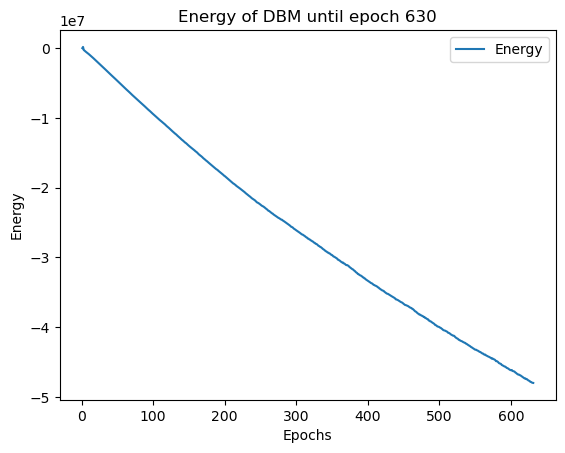

Starting...:  32%|██████▉               | 632/2000 [8:03:29<17:20:41, 45.64s/it]

Time taken for DBM epoch 631 is 45.57179141044617


Starting...:  32%|██████▉               | 633/2000 [8:04:15<17:19:50, 45.64s/it]

Time taken for DBM epoch 632 is 45.62945032119751


Starting...:  32%|██████▉               | 634/2000 [8:05:00<17:19:18, 45.65s/it]

Time taken for DBM epoch 633 is 45.6744909286499


Starting...:  32%|██████▉               | 635/2000 [8:05:46<17:19:08, 45.68s/it]

Time taken for DBM epoch 634 is 45.73774814605713


Starting...:  32%|██████▉               | 636/2000 [8:06:32<17:19:06, 45.71s/it]

Time taken for DBM epoch 635 is 45.78296494483948


Starting...:  32%|███████               | 637/2000 [8:07:18<17:18:39, 45.72s/it]

Time taken for DBM epoch 636 is 45.75391936302185


Starting...:  32%|███████               | 638/2000 [8:08:03<17:18:35, 45.75s/it]

Time taken for DBM epoch 637 is 45.82459044456482


Starting...:  32%|███████               | 639/2000 [8:08:49<17:18:37, 45.79s/it]

Time taken for DBM epoch 638 is 45.868844985961914


Starting...:  32%|███████               | 640/2000 [8:09:35<17:18:06, 45.80s/it]

Time taken for DBM epoch 639 is 45.824342489242554


Starting...:  32%|███████               | 640/2000 [8:10:21<17:18:06, 45.80s/it]

Time taken for DBM epoch 640 is 45.893842697143555


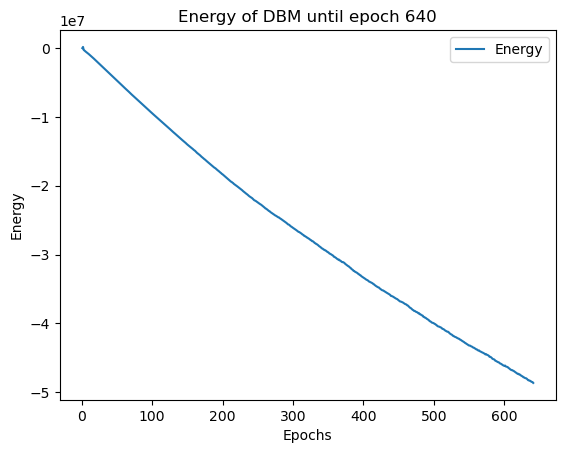

Starting...:  32%|███████               | 642/2000 [8:11:07<17:17:41, 45.85s/it]

Time taken for DBM epoch 641 is 45.83219361305237


Starting...:  32%|███████               | 643/2000 [8:11:53<17:16:43, 45.84s/it]

Time taken for DBM epoch 642 is 45.816975355148315


Starting...:  32%|███████               | 644/2000 [8:12:39<17:15:49, 45.83s/it]

Time taken for DBM epoch 643 is 45.818856954574585


Starting...:  32%|███████               | 645/2000 [8:13:25<17:19:39, 46.04s/it]

Time taken for DBM epoch 644 is 46.511810064315796


Starting...:  32%|███████               | 646/2000 [8:14:12<17:21:52, 46.17s/it]

Time taken for DBM epoch 645 is 46.47481155395508


Starting...:  32%|███████               | 647/2000 [8:14:58<17:20:48, 46.16s/it]

Time taken for DBM epoch 646 is 46.125070571899414


Starting...:  32%|███████▏              | 648/2000 [8:15:44<17:19:51, 46.15s/it]

Time taken for DBM epoch 647 is 46.128037452697754


Starting...:  32%|███████▏              | 649/2000 [8:16:30<17:18:58, 46.14s/it]

Time taken for DBM epoch 648 is 46.131587505340576


Starting...:  32%|███████▏              | 650/2000 [8:17:16<17:19:42, 46.21s/it]

Time taken for DBM epoch 649 is 46.36249375343323


Starting...:  32%|███████▏              | 650/2000 [8:18:04<17:19:42, 46.21s/it]

Time taken for DBM epoch 650 is 47.28538656234741


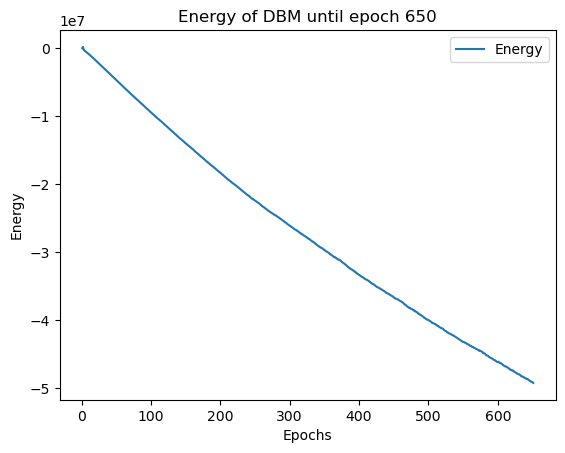

Starting...:  33%|███████▏              | 652/2000 [8:18:50<17:25:33, 46.54s/it]

Time taken for DBM epoch 651 is 46.479126930236816


Starting...:  33%|███████▏              | 653/2000 [8:19:36<17:20:50, 46.36s/it]

Time taken for DBM epoch 652 is 45.951438188552856


Starting...:  33%|███████▏              | 654/2000 [8:20:22<17:16:35, 46.21s/it]

Time taken for DBM epoch 653 is 45.84630584716797


Starting...:  33%|███████▏              | 655/2000 [8:21:08<17:13:18, 46.10s/it]

Time taken for DBM epoch 654 is 45.83285617828369


Starting...:  33%|███████▏              | 656/2000 [8:21:54<17:10:23, 46.00s/it]

Time taken for DBM epoch 655 is 45.776562452316284


Starting...:  33%|███████▏              | 657/2000 [8:22:39<17:07:03, 45.89s/it]

Time taken for DBM epoch 656 is 45.61764049530029


Starting...:  33%|███████▏              | 658/2000 [8:23:26<17:11:01, 46.10s/it]

Time taken for DBM epoch 657 is 46.58771371841431


Starting...:  33%|███████▏              | 659/2000 [8:24:14<17:23:21, 46.68s/it]

Time taken for DBM epoch 658 is 48.051592111587524


Starting...:  33%|███████▎              | 660/2000 [8:25:02<17:31:10, 47.07s/it]

Time taken for DBM epoch 659 is 47.96476864814758


Starting...:  33%|███████▎              | 660/2000 [8:25:50<17:31:10, 47.07s/it]

Time taken for DBM epoch 660 is 47.96241283416748


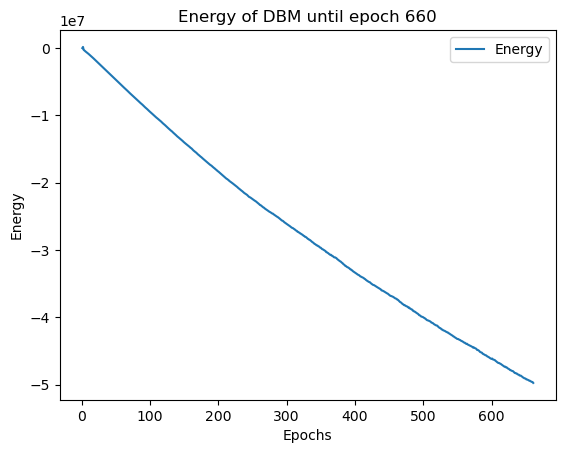

Starting...:  33%|███████▎              | 662/2000 [8:26:38<17:42:27, 47.64s/it]

Time taken for DBM epoch 661 is 48.26488780975342


Starting...:  33%|███████▎              | 663/2000 [8:27:26<17:44:33, 47.77s/it]

Time taken for DBM epoch 662 is 48.07692050933838


Starting...:  33%|███████▎              | 664/2000 [8:28:13<17:35:28, 47.40s/it]

Time taken for DBM epoch 663 is 46.533074378967285


Starting...:  33%|███████▎              | 665/2000 [8:29:00<17:30:25, 47.21s/it]

Time taken for DBM epoch 664 is 46.76274394989014


Starting...:  33%|███████▎              | 666/2000 [8:29:46<17:25:53, 47.04s/it]

Time taken for DBM epoch 665 is 46.64747357368469


Starting...:  33%|███████▎              | 667/2000 [8:30:33<17:20:33, 46.84s/it]

Time taken for DBM epoch 666 is 46.35748219490051


Starting...:  33%|███████▎              | 668/2000 [8:31:19<17:14:59, 46.62s/it]

Time taken for DBM epoch 667 is 46.11826539039612


Starting...:  33%|███████▎              | 669/2000 [8:32:05<17:10:45, 46.47s/it]

Time taken for DBM epoch 668 is 46.10196352005005


Starting...:  34%|███████▎              | 670/2000 [8:32:51<17:07:23, 46.35s/it]

Time taken for DBM epoch 669 is 46.07536792755127


Starting...:  34%|███████▎              | 670/2000 [8:33:37<17:07:23, 46.35s/it]

Time taken for DBM epoch 670 is 46.063459396362305


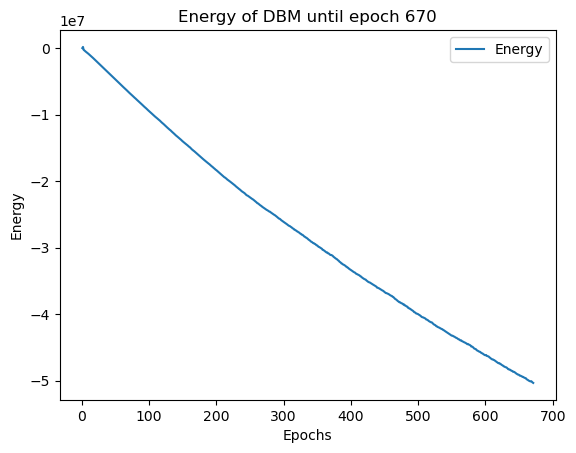

Starting...:  34%|███████▍              | 672/2000 [8:34:23<17:02:49, 46.21s/it]

Time taken for DBM epoch 671 is 46.027953147888184


Starting...:  34%|███████▍              | 673/2000 [8:35:09<17:00:32, 46.14s/it]

Time taken for DBM epoch 672 is 45.98439311981201


Starting...:  34%|███████▍              | 674/2000 [8:35:55<16:58:53, 46.10s/it]

Time taken for DBM epoch 673 is 46.00975728034973


Starting...:  34%|███████▍              | 675/2000 [8:36:41<16:57:04, 46.06s/it]

Time taken for DBM epoch 674 is 45.94515514373779


Starting...:  34%|███████▍              | 676/2000 [8:37:27<16:55:37, 46.03s/it]

Time taken for DBM epoch 675 is 45.95330214500427


Starting...:  34%|███████▍              | 677/2000 [8:38:13<16:54:15, 46.00s/it]

Time taken for DBM epoch 676 is 45.93327808380127


Starting...:  34%|███████▍              | 678/2000 [8:38:59<16:53:04, 45.98s/it]

Time taken for DBM epoch 677 is 45.933679819107056


Starting...:  34%|███████▍              | 679/2000 [8:39:45<16:51:30, 45.94s/it]

Time taken for DBM epoch 678 is 45.85954141616821


Starting...:  34%|███████▍              | 680/2000 [8:40:30<16:48:59, 45.86s/it]

Time taken for DBM epoch 679 is 45.67633891105652


Starting...:  34%|███████▍              | 680/2000 [8:41:16<16:48:59, 45.86s/it]

Time taken for DBM epoch 680 is 45.65980648994446


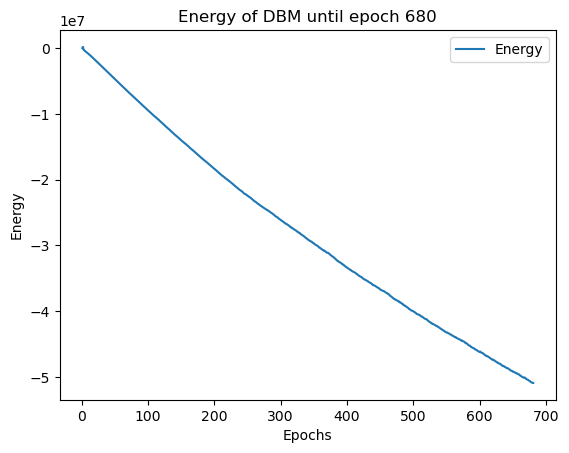

Starting...:  34%|███████▌              | 682/2000 [8:42:02<16:45:42, 45.78s/it]

Time taken for DBM epoch 681 is 45.67290258407593


Starting...:  34%|███████▌              | 683/2000 [8:42:47<16:44:17, 45.75s/it]

Time taken for DBM epoch 682 is 45.68423843383789


Starting...:  34%|███████▌              | 684/2000 [8:43:33<16:43:47, 45.77s/it]

Time taken for DBM epoch 683 is 45.79238510131836


Starting...:  34%|███████▌              | 685/2000 [8:44:19<16:43:45, 45.80s/it]

Time taken for DBM epoch 684 is 45.875370502471924


Starting...:  34%|███████▌              | 686/2000 [8:45:05<16:42:48, 45.79s/it]

Time taken for DBM epoch 685 is 45.77066707611084


Starting...:  34%|███████▌              | 687/2000 [8:45:51<16:42:18, 45.80s/it]

Time taken for DBM epoch 686 is 45.8313045501709


Starting...:  34%|███████▌              | 688/2000 [8:46:37<16:42:09, 45.83s/it]

Time taken for DBM epoch 687 is 45.893879413604736


Starting...:  34%|███████▌              | 689/2000 [8:47:22<16:41:24, 45.83s/it]

Time taken for DBM epoch 688 is 45.831294298172


Starting...:  34%|███████▌              | 690/2000 [8:48:08<16:40:48, 45.84s/it]

Time taken for DBM epoch 689 is 45.857391119003296


Starting...:  34%|███████▌              | 690/2000 [8:48:54<16:40:48, 45.84s/it]

Time taken for DBM epoch 690 is 45.82979869842529


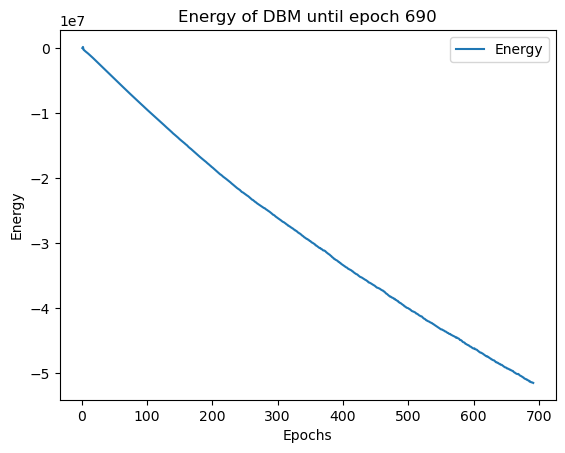

Starting...:  35%|███████▌              | 692/2000 [8:49:40<16:39:36, 45.85s/it]

Time taken for DBM epoch 691 is 45.82580542564392


Starting...:  35%|███████▌              | 693/2000 [8:50:26<16:39:02, 45.86s/it]

Time taken for DBM epoch 692 is 45.88294243812561


Starting...:  35%|███████▋              | 694/2000 [8:51:12<16:38:19, 45.87s/it]

Time taken for DBM epoch 693 is 45.87098717689514


Starting...:  35%|███████▋              | 695/2000 [8:51:58<16:38:35, 45.91s/it]

Time taken for DBM epoch 694 is 46.0209059715271


Starting...:  35%|███████▋              | 696/2000 [8:52:44<16:39:58, 46.01s/it]

Time taken for DBM epoch 695 is 46.24075150489807


Starting...:  35%|███████▋              | 697/2000 [8:53:30<16:40:31, 46.07s/it]

Time taken for DBM epoch 696 is 46.21442198753357


Starting...:  35%|███████▋              | 698/2000 [8:54:16<16:40:38, 46.11s/it]

Time taken for DBM epoch 697 is 46.205708026885986


Starting...:  35%|███████▋              | 699/2000 [8:55:02<16:38:17, 46.04s/it]

Time taken for DBM epoch 698 is 45.86830735206604


Starting...:  35%|███████▋              | 700/2000 [8:55:48<16:36:08, 45.98s/it]

Time taken for DBM epoch 699 is 45.82609176635742


Starting...:  35%|███████▋              | 700/2000 [8:56:34<16:36:08, 45.98s/it]

Time taken for DBM epoch 700 is 45.77815222740173


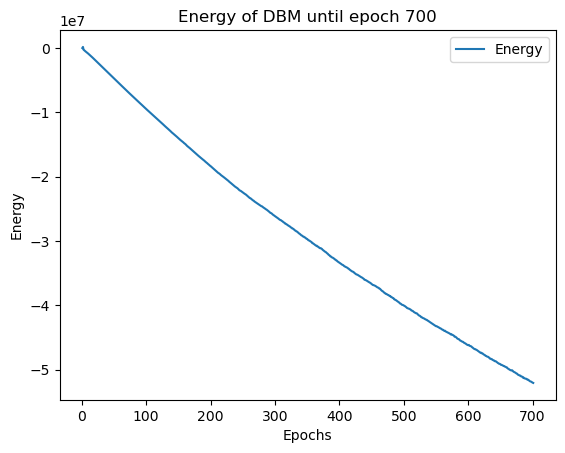

Starting...:  35%|███████▋              | 702/2000 [8:57:20<16:33:24, 45.92s/it]

Time taken for DBM epoch 701 is 45.86280035972595


Starting...:  35%|███████▋              | 703/2000 [8:58:06<16:31:59, 45.89s/it]

Time taken for DBM epoch 702 is 45.819270610809326


Starting...:  35%|███████▋              | 704/2000 [8:58:51<16:29:58, 45.83s/it]

Time taken for DBM epoch 703 is 45.69630694389343


Starting...:  35%|███████▊              | 705/2000 [8:59:37<16:28:28, 45.80s/it]

Time taken for DBM epoch 704 is 45.71846961975098


Starting...:  35%|███████▊              | 706/2000 [9:00:23<16:27:12, 45.77s/it]

Time taken for DBM epoch 705 is 45.71923542022705


Starting...:  35%|███████▊              | 707/2000 [9:01:09<16:26:14, 45.77s/it]

Time taken for DBM epoch 706 is 45.74247336387634


Starting...:  35%|███████▊              | 708/2000 [9:01:54<16:25:13, 45.75s/it]

Time taken for DBM epoch 707 is 45.72632312774658


Starting...:  35%|███████▊              | 709/2000 [9:02:40<16:24:05, 45.74s/it]

Time taken for DBM epoch 708 is 45.69469475746155


Starting...:  36%|███████▊              | 710/2000 [9:03:26<16:26:08, 45.87s/it]

Time taken for DBM epoch 709 is 46.1730740070343


Starting...:  36%|███████▊              | 710/2000 [9:04:12<16:26:08, 45.87s/it]

Time taken for DBM epoch 710 is 46.274619817733765


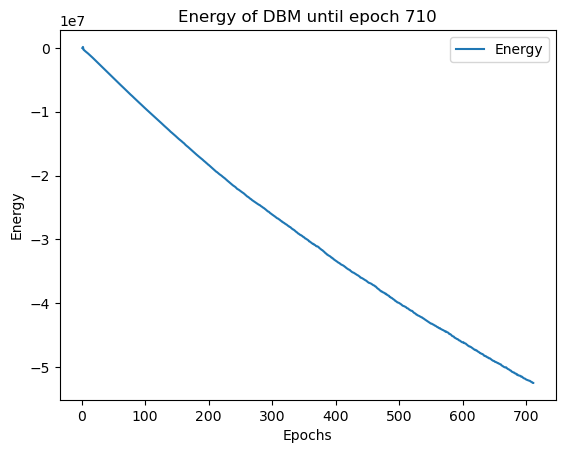

Starting...:  36%|███████▊              | 712/2000 [9:04:59<16:27:56, 46.02s/it]

Time taken for DBM epoch 711 is 46.006978273391724


Starting...:  36%|███████▊              | 713/2000 [9:05:45<16:27:25, 46.03s/it]

Time taken for DBM epoch 712 is 46.05922722816467


Starting...:  36%|███████▊              | 714/2000 [9:06:31<16:26:44, 46.04s/it]

Time taken for DBM epoch 713 is 46.04619359970093


Starting...:  36%|███████▊              | 715/2000 [9:07:17<16:25:42, 46.03s/it]

Time taken for DBM epoch 714 is 45.9969527721405


Starting...:  36%|███████▉              | 716/2000 [9:08:03<16:24:31, 46.01s/it]

Time taken for DBM epoch 715 is 45.95893859863281


Starting...:  36%|███████▉              | 717/2000 [9:08:49<16:23:29, 45.99s/it]

Time taken for DBM epoch 716 is 45.96393847465515


Starting...:  36%|███████▉              | 718/2000 [9:09:34<16:20:21, 45.88s/it]

Time taken for DBM epoch 717 is 45.62481927871704


Starting...:  36%|███████▉              | 719/2000 [9:10:20<16:18:05, 45.81s/it]

Time taken for DBM epoch 718 is 45.64833068847656


Starting...:  36%|███████▉              | 720/2000 [9:11:06<16:17:53, 45.84s/it]

Time taken for DBM epoch 719 is 45.89974641799927


Starting...:  36%|███████▉              | 720/2000 [9:11:52<16:17:53, 45.84s/it]

Time taken for DBM epoch 720 is 45.88694739341736


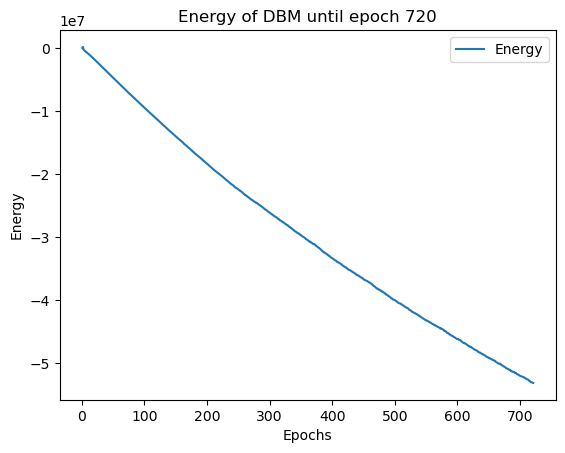

Starting...:  36%|███████▉              | 722/2000 [9:12:38<16:17:00, 45.87s/it]

Time taken for DBM epoch 721 is 45.829957008361816


Starting...:  36%|███████▉              | 723/2000 [9:13:24<16:16:18, 45.87s/it]

Time taken for DBM epoch 722 is 45.877753496170044


Starting...:  36%|███████▉              | 724/2000 [9:14:09<16:15:52, 45.89s/it]

Time taken for DBM epoch 723 is 45.924150228500366


Starting...:  36%|███████▉              | 725/2000 [9:14:55<16:15:34, 45.91s/it]

Time taken for DBM epoch 724 is 45.96023964881897


Starting...:  36%|███████▉              | 726/2000 [9:15:41<16:14:52, 45.91s/it]

Time taken for DBM epoch 725 is 45.91997957229614


Starting...:  36%|███████▉              | 727/2000 [9:16:27<16:14:59, 45.95s/it]

Time taken for DBM epoch 726 is 46.04953455924988


Starting...:  36%|████████              | 728/2000 [9:17:13<16:14:17, 45.96s/it]

Time taken for DBM epoch 727 is 45.963228702545166


Starting...:  36%|████████              | 729/2000 [9:17:59<16:13:45, 45.97s/it]

Time taken for DBM epoch 728 is 45.9946665763855


Starting...:  36%|████████              | 730/2000 [9:18:45<16:13:45, 46.00s/it]

Time taken for DBM epoch 729 is 46.086451292037964


Starting...:  36%|████████              | 730/2000 [9:19:32<16:13:45, 46.00s/it]

Time taken for DBM epoch 730 is 46.15473294258118


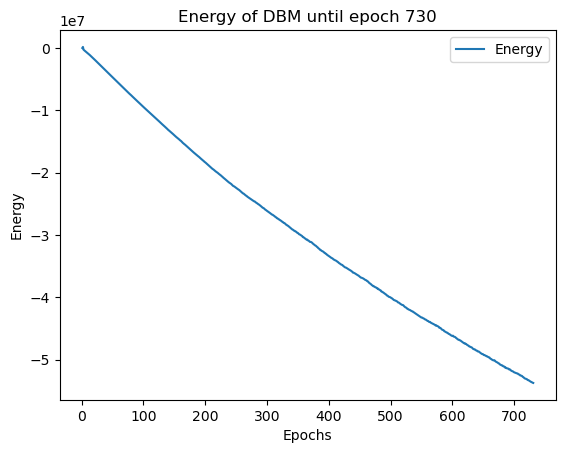

Starting...:  37%|████████              | 732/2000 [9:20:18<16:14:29, 46.11s/it]

Time taken for DBM epoch 731 is 46.18280911445618


Starting...:  37%|████████              | 733/2000 [9:21:04<16:14:15, 46.14s/it]

Time taken for DBM epoch 732 is 46.195671796798706


Starting...:  37%|████████              | 734/2000 [9:21:50<16:12:39, 46.10s/it]

Time taken for DBM epoch 733 is 46.00407099723816


Starting...:  37%|████████              | 735/2000 [9:22:36<16:09:20, 45.98s/it]

Time taken for DBM epoch 734 is 45.694300413131714


Starting...:  37%|████████              | 736/2000 [9:23:21<16:06:30, 45.88s/it]

Time taken for DBM epoch 735 is 45.65026116371155


Starting...:  37%|████████              | 737/2000 [9:24:07<16:04:16, 45.81s/it]

Time taken for DBM epoch 736 is 45.64368534088135


Starting...:  37%|████████              | 738/2000 [9:24:53<16:02:28, 45.76s/it]

Time taken for DBM epoch 737 is 45.644723892211914


Starting...:  37%|████████▏             | 739/2000 [9:25:39<16:02:26, 45.79s/it]

Time taken for DBM epoch 738 is 45.8737211227417


Starting...:  37%|████████▏             | 740/2000 [9:26:25<16:03:43, 45.89s/it]

Time taken for DBM epoch 739 is 46.12019729614258


Starting...:  37%|████████▏             | 740/2000 [9:27:11<16:03:43, 45.89s/it]

Time taken for DBM epoch 740 is 46.16248154640198


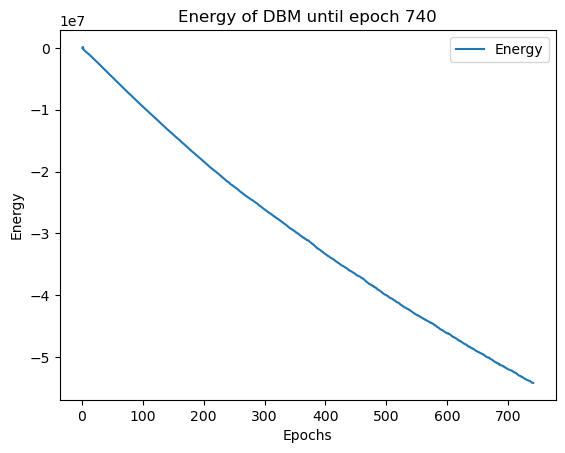

Starting...:  37%|████████▏             | 742/2000 [9:27:57<16:05:40, 46.06s/it]

Time taken for DBM epoch 741 is 46.17857265472412


Starting...:  37%|████████▏             | 743/2000 [9:28:43<16:06:12, 46.12s/it]

Time taken for DBM epoch 742 is 46.2639741897583


Starting...:  37%|████████▏             | 744/2000 [9:29:30<16:06:02, 46.15s/it]

Time taken for DBM epoch 743 is 46.21636915206909


Starting...:  37%|████████▏             | 745/2000 [9:30:16<16:05:35, 46.16s/it]

Time taken for DBM epoch 744 is 46.19874095916748


Starting...:  37%|████████▏             | 746/2000 [9:31:02<16:04:57, 46.17s/it]

Time taken for DBM epoch 745 is 46.18400835990906


Starting...:  37%|████████▏             | 747/2000 [9:31:48<16:04:15, 46.17s/it]

Time taken for DBM epoch 746 is 46.18226170539856


Starting...:  37%|████████▏             | 748/2000 [9:32:34<16:03:35, 46.18s/it]

Time taken for DBM epoch 747 is 46.18860983848572


Starting...:  37%|████████▏             | 749/2000 [9:33:21<16:02:32, 46.17s/it]

Time taken for DBM epoch 748 is 46.1344940662384


Starting...:  38%|████████▎             | 750/2000 [9:34:07<16:01:54, 46.17s/it]

Time taken for DBM epoch 749 is 46.18512797355652


Starting...:  38%|████████▎             | 750/2000 [9:34:53<16:01:54, 46.17s/it]

Time taken for DBM epoch 750 is 46.176411628723145


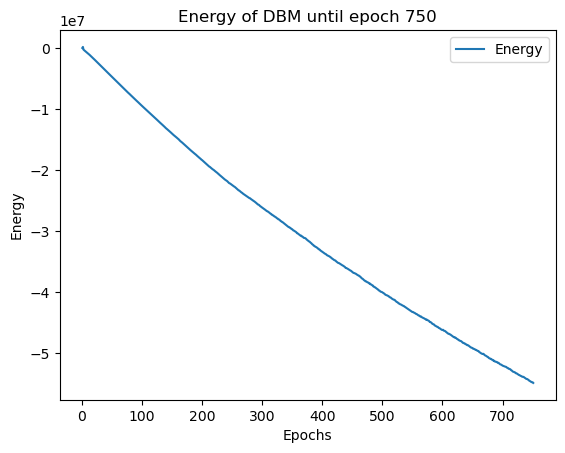

Starting...:  38%|████████▎             | 752/2000 [9:35:39<16:00:52, 46.20s/it]

Time taken for DBM epoch 751 is 46.17184281349182


Starting...:  38%|████████▎             | 753/2000 [9:36:25<16:00:06, 46.20s/it]

Time taken for DBM epoch 752 is 46.197163581848145


Starting...:  38%|████████▎             | 754/2000 [9:37:11<15:58:46, 46.17s/it]

Time taken for DBM epoch 753 is 46.10331082344055


Starting...:  38%|████████▎             | 755/2000 [9:37:58<15:57:42, 46.15s/it]

Time taken for DBM epoch 754 is 46.12149739265442


Starting...:  38%|████████▎             | 756/2000 [9:38:44<15:57:10, 46.17s/it]

Time taken for DBM epoch 755 is 46.19124984741211


Starting...:  38%|████████▎             | 757/2000 [9:39:30<15:56:23, 46.17s/it]

Time taken for DBM epoch 756 is 46.164894819259644


Starting...:  38%|████████▎             | 758/2000 [9:40:16<15:55:39, 46.17s/it]

Time taken for DBM epoch 757 is 46.169331073760986


Starting...:  38%|████████▎             | 759/2000 [9:41:02<15:54:21, 46.14s/it]

Time taken for DBM epoch 758 is 46.081031799316406


Starting...:  38%|████████▎             | 760/2000 [9:41:48<15:53:50, 46.15s/it]

Time taken for DBM epoch 759 is 46.18195819854736


Starting...:  38%|████████▎             | 760/2000 [9:42:35<15:53:50, 46.15s/it]

Time taken for DBM epoch 760 is 46.53720307350159


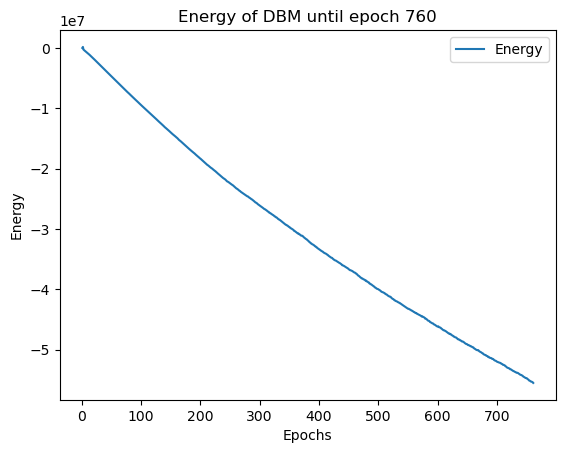

Starting...:  38%|████████▍             | 762/2000 [9:43:21<15:54:28, 46.26s/it]

Time taken for DBM epoch 761 is 46.17103338241577


Starting...:  38%|████████▍             | 763/2000 [9:44:08<16:00:08, 46.57s/it]

Time taken for DBM epoch 762 is 47.29924654960632


Starting...:  38%|████████▍             | 764/2000 [9:44:56<16:04:23, 46.81s/it]

Time taken for DBM epoch 763 is 47.38273906707764


Starting...:  38%|████████▍             | 765/2000 [9:45:42<16:01:28, 46.71s/it]

Time taken for DBM epoch 764 is 46.46838021278381


Starting...:  38%|████████▍             | 766/2000 [9:46:28<15:56:15, 46.50s/it]

Time taken for DBM epoch 765 is 45.99237370491028


Starting...:  38%|████████▍             | 767/2000 [9:47:14<15:49:36, 46.21s/it]

Time taken for DBM epoch 766 is 45.542438983917236


Starting...:  38%|████████▍             | 768/2000 [9:48:00<15:47:28, 46.14s/it]

Time taken for DBM epoch 767 is 45.987635135650635


Starting...:  38%|████████▍             | 769/2000 [9:48:46<15:43:57, 46.01s/it]

Time taken for DBM epoch 768 is 45.69552397727966


Starting...:  38%|████████▍             | 770/2000 [9:49:31<15:41:06, 45.91s/it]

Time taken for DBM epoch 769 is 45.66971230506897


Starting...:  38%|████████▍             | 770/2000 [9:50:18<15:41:06, 45.91s/it]

Time taken for DBM epoch 770 is 46.81591272354126


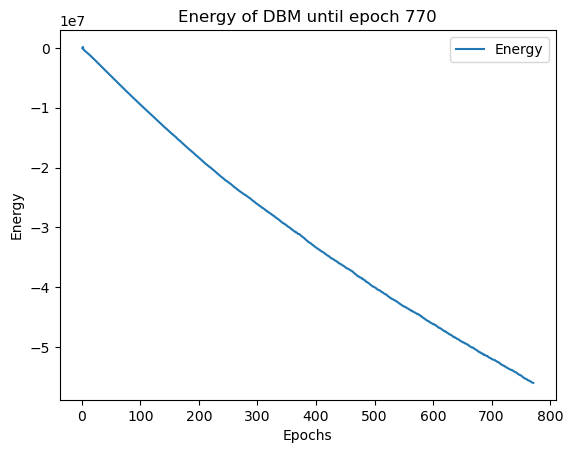

Starting...:  39%|████████▍             | 772/2000 [9:51:05<15:51:23, 46.49s/it]

Time taken for DBM epoch 771 is 47.11273121833801


Starting...:  39%|████████▌             | 773/2000 [9:51:53<15:55:14, 46.71s/it]

Time taken for DBM epoch 772 is 47.23736238479614


Starting...:  39%|████████▌             | 774/2000 [9:52:39<15:55:17, 46.75s/it]

Time taken for DBM epoch 773 is 46.84710097312927


Starting...:  39%|████████▌             | 775/2000 [9:53:25<15:47:48, 46.42s/it]

Time taken for DBM epoch 774 is 45.65521216392517


Starting...:  39%|████████▌             | 776/2000 [9:54:11<15:44:17, 46.29s/it]

Time taken for DBM epoch 775 is 45.975422859191895


Starting...:  39%|████████▌             | 777/2000 [9:54:57<15:42:10, 46.22s/it]

Time taken for DBM epoch 776 is 46.06919527053833


Starting...:  39%|████████▌             | 778/2000 [9:55:43<15:40:47, 46.19s/it]

Time taken for DBM epoch 777 is 46.12123465538025


Starting...:  39%|████████▌             | 779/2000 [9:56:29<15:39:32, 46.17s/it]

Time taken for DBM epoch 778 is 46.114919900894165


Starting...:  39%|████████▌             | 780/2000 [9:57:15<15:38:19, 46.15s/it]

Time taken for DBM epoch 779 is 46.095863580703735


Starting...:  39%|████████▌             | 780/2000 [9:58:01<15:38:19, 46.15s/it]

Time taken for DBM epoch 780 is 46.066288232803345


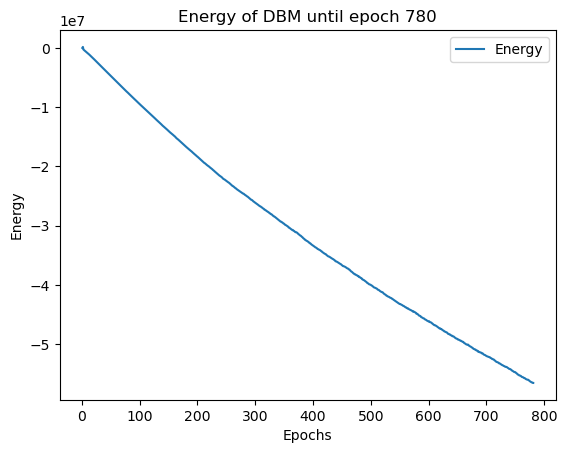

Starting...:  39%|████████▌             | 782/2000 [9:58:48<15:36:37, 46.14s/it]

Time taken for DBM epoch 781 is 46.096928358078


Starting...:  39%|████████▌             | 783/2000 [9:59:34<15:35:23, 46.12s/it]

Time taken for DBM epoch 782 is 46.063745737075806


Starting...:  39%|████████▏            | 784/2000 [10:00:20<15:34:31, 46.11s/it]

Time taken for DBM epoch 783 is 46.09980583190918


Starting...:  39%|████████▏            | 785/2000 [10:01:06<15:33:45, 46.11s/it]

Time taken for DBM epoch 784 is 46.111451625823975


Starting...:  39%|████████▎            | 786/2000 [10:01:52<15:33:00, 46.11s/it]

Time taken for DBM epoch 785 is 46.11418676376343


Starting...:  39%|████████▎            | 787/2000 [10:02:38<15:32:01, 46.10s/it]

Time taken for DBM epoch 786 is 46.07579517364502


Starting...:  39%|████████▎            | 788/2000 [10:03:24<15:30:19, 46.06s/it]

Time taken for DBM epoch 787 is 45.946898221969604


Starting...:  39%|████████▎            | 789/2000 [10:04:10<15:27:21, 45.95s/it]

Time taken for DBM epoch 788 is 45.69418931007385


Starting...:  40%|████████▎            | 790/2000 [10:04:55<15:25:01, 45.87s/it]

Time taken for DBM epoch 789 is 45.68530201911926


Starting...:  40%|████████▎            | 790/2000 [10:05:41<15:25:01, 45.87s/it]

Time taken for DBM epoch 790 is 45.66559910774231


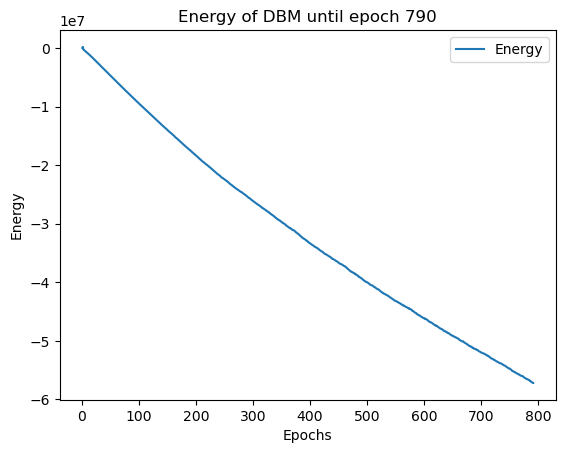

Starting...:  40%|████████▎            | 792/2000 [10:06:27<15:21:36, 45.78s/it]

Time taken for DBM epoch 791 is 45.62962079048157


Starting...:  40%|████████▎            | 793/2000 [10:07:13<15:20:04, 45.74s/it]

Time taken for DBM epoch 792 is 45.648698568344116


Starting...:  40%|████████▎            | 794/2000 [10:07:58<15:18:55, 45.72s/it]

Time taken for DBM epoch 793 is 45.671812534332275


Starting...:  40%|████████▎            | 795/2000 [10:08:44<15:17:46, 45.70s/it]

Time taken for DBM epoch 794 is 45.65382504463196


Starting...:  40%|████████▎            | 796/2000 [10:09:29<15:16:38, 45.68s/it]

Time taken for DBM epoch 795 is 45.63627576828003


Starting...:  40%|████████▎            | 797/2000 [10:10:15<15:15:30, 45.66s/it]

Time taken for DBM epoch 796 is 45.61549949645996


Starting...:  40%|████████▍            | 798/2000 [10:11:01<15:14:31, 45.65s/it]

Time taken for DBM epoch 797 is 45.62313437461853


Starting...:  40%|████████▍            | 799/2000 [10:11:46<15:13:31, 45.64s/it]

Time taken for DBM epoch 798 is 45.61022424697876


Starting...:  40%|████████▍            | 800/2000 [10:12:32<15:12:40, 45.63s/it]

Time taken for DBM epoch 799 is 45.62277793884277


Starting...:  40%|████████▍            | 800/2000 [10:13:18<15:12:40, 45.63s/it]

Time taken for DBM epoch 800 is 45.63064217567444


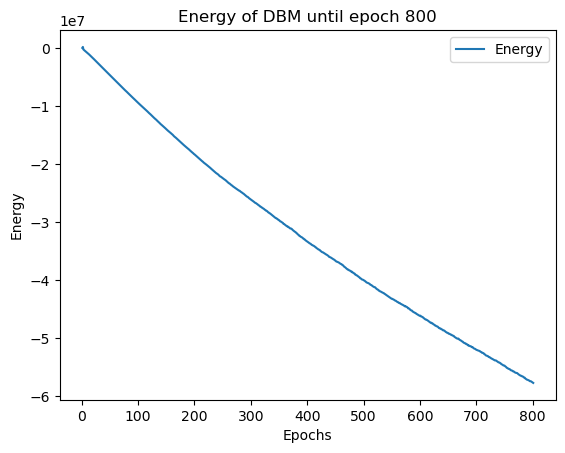

Starting...:  40%|████████▍            | 802/2000 [10:14:03<15:11:04, 45.63s/it]

Time taken for DBM epoch 801 is 45.55408525466919


Starting...:  40%|████████▍            | 803/2000 [10:14:49<15:10:38, 45.65s/it]

Time taken for DBM epoch 802 is 45.68488597869873


Starting...:  40%|████████▍            | 804/2000 [10:15:34<15:09:08, 45.61s/it]

Time taken for DBM epoch 803 is 45.52090835571289


Starting...:  40%|████████▍            | 805/2000 [10:16:20<15:08:15, 45.60s/it]

Time taken for DBM epoch 804 is 45.587745904922485


Starting...:  40%|████████▍            | 806/2000 [10:17:06<15:07:39, 45.61s/it]

Time taken for DBM epoch 805 is 45.63081884384155


Starting...:  40%|████████▍            | 807/2000 [10:17:51<15:06:40, 45.60s/it]

Time taken for DBM epoch 806 is 45.57293462753296


Starting...:  40%|████████▍            | 808/2000 [10:18:37<15:05:41, 45.59s/it]

Time taken for DBM epoch 807 is 45.562342166900635


Starting...:  40%|████████▍            | 809/2000 [10:19:22<15:04:54, 45.59s/it]

Time taken for DBM epoch 808 is 45.58229374885559


Starting...:  40%|████████▌            | 810/2000 [10:20:08<15:04:06, 45.59s/it]

Time taken for DBM epoch 809 is 45.58057379722595


Starting...:  40%|████████▌            | 810/2000 [10:20:54<15:04:06, 45.59s/it]

Time taken for DBM epoch 810 is 45.58076596260071


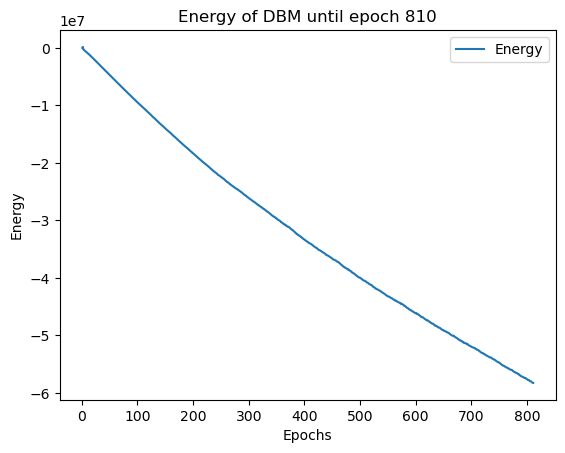

Starting...:  41%|████████▌            | 812/2000 [10:21:39<15:03:00, 45.61s/it]

Time taken for DBM epoch 811 is 45.59073209762573


Starting...:  41%|████████▌            | 813/2000 [10:22:25<15:02:30, 45.62s/it]

Time taken for DBM epoch 812 is 45.65036940574646


Starting...:  41%|████████▌            | 814/2000 [10:23:10<15:01:31, 45.61s/it]

Time taken for DBM epoch 813 is 45.5811505317688


Starting...:  41%|████████▌            | 815/2000 [10:23:57<15:03:30, 45.75s/it]

Time taken for DBM epoch 814 is 46.0707106590271


Starting...:  41%|████████▌            | 816/2000 [10:24:43<15:04:57, 45.86s/it]

Time taken for DBM epoch 815 is 46.12095785140991


Starting...:  41%|████████▌            | 817/2000 [10:25:29<15:06:11, 45.96s/it]

Time taken for DBM epoch 816 is 46.1968309879303


Starting...:  41%|████████▌            | 818/2000 [10:26:15<15:07:38, 46.07s/it]

Time taken for DBM epoch 817 is 46.33542585372925


Starting...:  41%|████████▌            | 819/2000 [10:27:01<15:06:02, 46.03s/it]

Time taken for DBM epoch 818 is 45.93170762062073


Starting...:  41%|████████▌            | 820/2000 [10:27:47<15:04:41, 46.00s/it]

Time taken for DBM epoch 819 is 45.930864334106445


Starting...:  41%|████████▌            | 820/2000 [10:28:33<15:04:41, 46.00s/it]

Time taken for DBM epoch 820 is 46.33576154708862


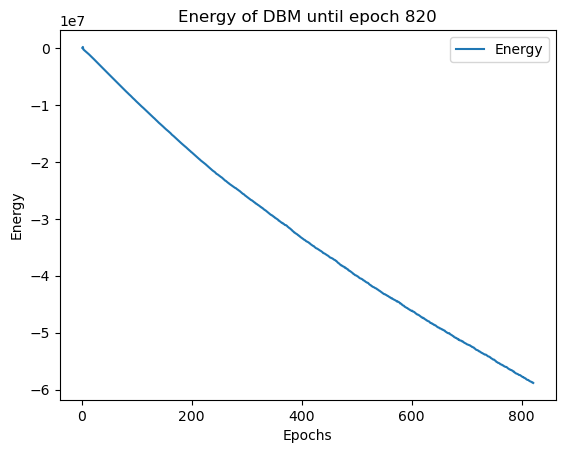

Starting...:  41%|████████▋            | 822/2000 [10:29:19<15:04:18, 46.06s/it]

Time taken for DBM epoch 821 is 45.89028334617615


Starting...:  41%|████████▋            | 823/2000 [10:30:05<15:02:30, 46.01s/it]

Time taken for DBM epoch 822 is 45.88275218009949


Starting...:  41%|████████▋            | 824/2000 [10:30:52<15:05:23, 46.19s/it]

Time taken for DBM epoch 823 is 46.62858605384827


Starting...:  41%|████████▋            | 825/2000 [10:31:39<15:10:00, 46.47s/it]

Time taken for DBM epoch 824 is 47.11030435562134


Starting...:  41%|████████▋            | 826/2000 [10:32:25<15:04:56, 46.25s/it]

Time taken for DBM epoch 825 is 45.73662805557251


Starting...:  41%|████████▋            | 827/2000 [10:33:11<15:01:59, 46.14s/it]

Time taken for DBM epoch 826 is 45.876309394836426


Starting...:  41%|████████▋            | 828/2000 [10:33:56<14:58:28, 46.00s/it]

Time taken for DBM epoch 827 is 45.66899561882019


Starting...:  41%|████████▋            | 829/2000 [10:34:42<14:57:03, 45.96s/it]

Time taken for DBM epoch 828 is 45.88531279563904


Starting...:  42%|████████▋            | 830/2000 [10:35:28<14:56:16, 45.96s/it]

Time taken for DBM epoch 829 is 45.96068978309631


Starting...:  42%|████████▋            | 830/2000 [10:36:14<14:56:16, 45.96s/it]

Time taken for DBM epoch 830 is 45.9395968914032


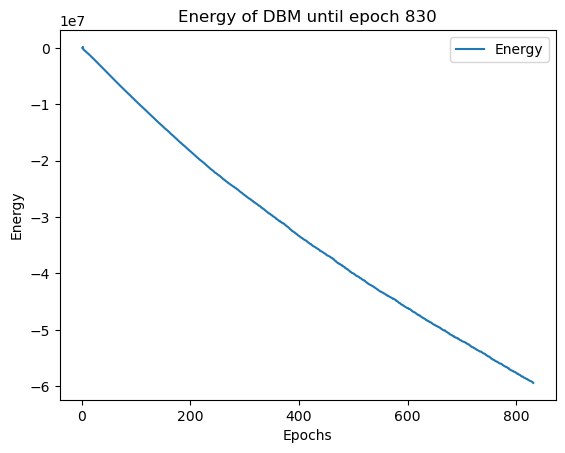

Starting...:  42%|████████▋            | 832/2000 [10:37:01<14:58:35, 46.16s/it]

Time taken for DBM epoch 831 is 46.55638647079468


Starting...:  42%|████████▋            | 833/2000 [10:37:48<15:01:27, 46.35s/it]

Time taken for DBM epoch 832 is 46.7840793132782


Starting...:  42%|████████▊            | 834/2000 [10:38:34<15:00:17, 46.33s/it]

Time taken for DBM epoch 833 is 46.27813959121704


Starting...:  42%|████████▊            | 835/2000 [10:39:20<14:57:39, 46.23s/it]

Time taken for DBM epoch 834 is 46.00647783279419


Starting...:  42%|████████▊            | 836/2000 [10:40:05<14:52:49, 46.02s/it]

Time taken for DBM epoch 835 is 45.53365206718445


Starting...:  42%|████████▊            | 837/2000 [10:40:51<14:48:59, 45.86s/it]

Time taken for DBM epoch 836 is 45.495389223098755


Starting...:  42%|████████▊            | 838/2000 [10:41:36<14:46:36, 45.78s/it]

Time taken for DBM epoch 837 is 45.58452916145325


Starting...:  42%|████████▊            | 839/2000 [10:42:22<14:45:11, 45.75s/it]

Time taken for DBM epoch 838 is 45.666372537612915


Starting...:  42%|████████▊            | 840/2000 [10:43:08<14:44:46, 45.76s/it]

Time taken for DBM epoch 839 is 45.805338859558105


Starting...:  42%|████████▊            | 840/2000 [10:43:54<14:44:46, 45.76s/it]

Time taken for DBM epoch 840 is 45.79394817352295


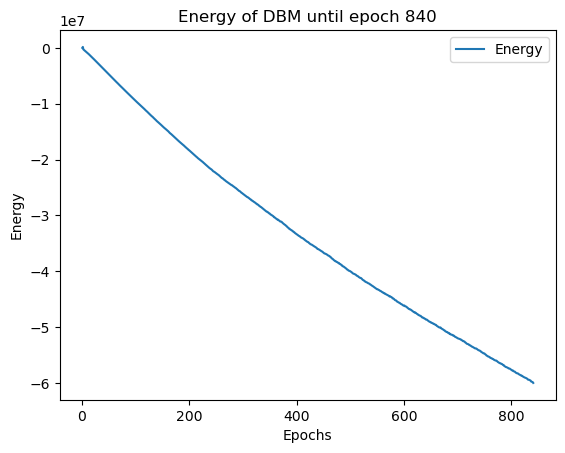

Starting...:  42%|████████▊            | 842/2000 [10:44:40<14:44:23, 45.82s/it]

Time taken for DBM epoch 841 is 45.8670928478241


Starting...:  42%|████████▊            | 843/2000 [10:45:26<14:44:05, 45.85s/it]

Time taken for DBM epoch 842 is 45.902466773986816


Starting...:  42%|████████▊            | 844/2000 [10:46:11<14:43:35, 45.86s/it]

Time taken for DBM epoch 843 is 45.89342474937439


Starting...:  42%|████████▊            | 845/2000 [10:46:58<14:46:15, 46.04s/it]

Time taken for DBM epoch 844 is 46.45336413383484


Starting...:  42%|████████▉            | 846/2000 [10:47:43<14:42:19, 45.88s/it]

Time taken for DBM epoch 845 is 45.492287397384644


Starting...:  42%|████████▉            | 847/2000 [10:48:29<14:38:09, 45.70s/it]

Time taken for DBM epoch 846 is 45.283071756362915


Starting...:  42%|████████▉            | 848/2000 [10:49:15<14:38:42, 45.77s/it]

Time taken for DBM epoch 847 is 45.92383360862732


Starting...:  42%|████████▉            | 849/2000 [10:50:01<14:39:05, 45.83s/it]

Time taken for DBM epoch 848 is 45.96597695350647


Starting...:  42%|████████▉            | 850/2000 [10:50:47<14:39:33, 45.89s/it]

Time taken for DBM epoch 849 is 46.038193464279175


Starting...:  42%|████████▉            | 850/2000 [10:51:33<14:39:33, 45.89s/it]

Time taken for DBM epoch 850 is 46.06733536720276


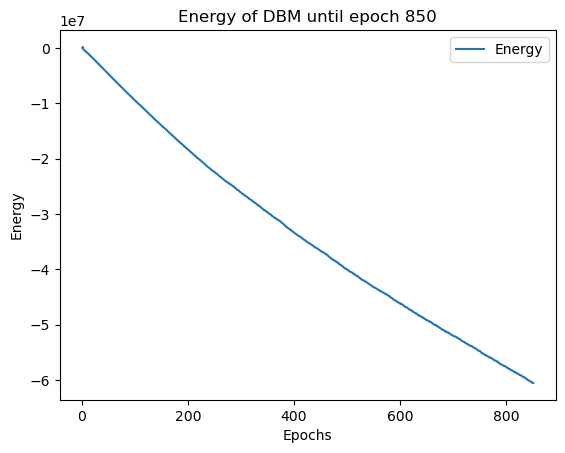

Starting...:  43%|████████▉            | 852/2000 [10:52:19<14:41:27, 46.07s/it]

Time taken for DBM epoch 851 is 46.29365277290344


Starting...:  43%|████████▉            | 853/2000 [10:53:06<14:44:58, 46.29s/it]

Time taken for DBM epoch 852 is 46.81426405906677


Starting...:  43%|████████▉            | 854/2000 [10:53:52<14:44:08, 46.29s/it]

Time taken for DBM epoch 853 is 46.281394481658936


Starting...:  43%|████████▉            | 855/2000 [10:54:38<14:40:04, 46.12s/it]

Time taken for DBM epoch 854 is 45.71556258201599


Starting...:  43%|████████▉            | 856/2000 [10:55:24<14:36:46, 45.98s/it]

Time taken for DBM epoch 855 is 45.67351937294006


Starting...:  43%|████████▉            | 857/2000 [10:56:10<14:36:00, 45.98s/it]

Time taken for DBM epoch 856 is 45.984593629837036


Starting...:  43%|█████████            | 858/2000 [10:56:56<14:36:33, 46.05s/it]

Time taken for DBM epoch 857 is 46.2154426574707


Starting...:  43%|█████████            | 859/2000 [10:57:42<14:34:28, 45.98s/it]

Time taken for DBM epoch 858 is 45.82162642478943


Starting...:  43%|█████████            | 860/2000 [10:58:27<14:32:43, 45.93s/it]

Time taken for DBM epoch 859 is 45.812060594558716


Starting...:  43%|█████████            | 860/2000 [10:59:13<14:32:43, 45.93s/it]

Time taken for DBM epoch 860 is 46.06243085861206


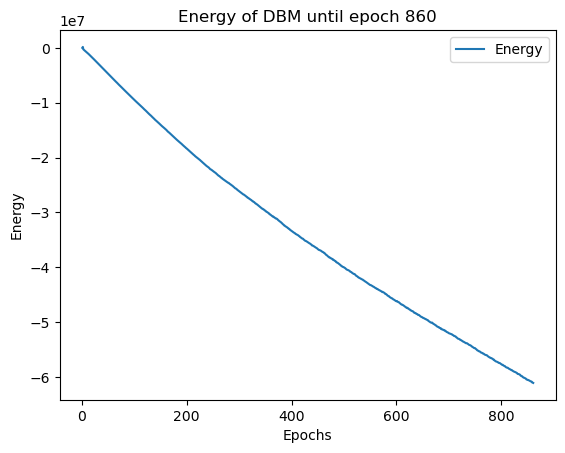

Starting...:  43%|█████████            | 862/2000 [11:00:00<14:32:38, 46.01s/it]

Time taken for DBM epoch 861 is 46.03344202041626


Starting...:  43%|█████████            | 863/2000 [11:00:46<14:32:38, 46.05s/it]

Time taken for DBM epoch 862 is 46.14351034164429


Starting...:  43%|█████████            | 864/2000 [11:01:32<14:32:15, 46.07s/it]

Time taken for DBM epoch 863 is 46.11824154853821


Starting...:  43%|█████████            | 865/2000 [11:02:18<14:30:23, 46.01s/it]

Time taken for DBM epoch 864 is 45.87605690956116


Starting...:  43%|█████████            | 866/2000 [11:03:03<14:27:58, 45.92s/it]

Time taken for DBM epoch 865 is 45.718069553375244


Starting...:  43%|█████████            | 867/2000 [11:03:50<14:29:47, 46.06s/it]

Time taken for DBM epoch 866 is 46.38236737251282


Starting...:  43%|█████████            | 868/2000 [11:04:36<14:28:14, 46.02s/it]

Time taken for DBM epoch 867 is 45.92290949821472


Starting...:  43%|█████████            | 869/2000 [11:05:22<14:26:36, 45.97s/it]

Time taken for DBM epoch 868 is 45.86451530456543


Starting...:  44%|█████████▏           | 870/2000 [11:06:08<14:26:29, 46.01s/it]

Time taken for DBM epoch 869 is 46.08885073661804


Starting...:  44%|█████████▏           | 870/2000 [11:06:54<14:26:29, 46.01s/it]

Time taken for DBM epoch 870 is 46.08261823654175


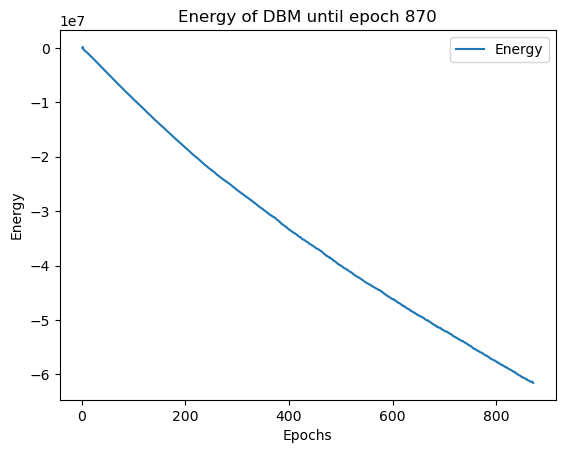

Starting...:  44%|█████████▏           | 872/2000 [11:07:40<14:27:14, 46.13s/it]

Time taken for DBM epoch 871 is 46.28097319602966


Starting...:  44%|█████████▏           | 873/2000 [11:08:26<14:24:51, 46.04s/it]

Time taken for DBM epoch 872 is 45.84294104576111


Starting...:  44%|█████████▏           | 874/2000 [11:09:12<14:20:50, 45.87s/it]

Time taken for DBM epoch 873 is 45.464778661727905


Starting...:  44%|█████████▏           | 875/2000 [11:09:57<14:18:06, 45.77s/it]

Time taken for DBM epoch 874 is 45.52214026451111


Starting...:  44%|█████████▏           | 876/2000 [11:10:43<14:16:24, 45.72s/it]

Time taken for DBM epoch 875 is 45.59911370277405


Starting...:  44%|█████████▏           | 877/2000 [11:11:29<14:19:19, 45.91s/it]

Time taken for DBM epoch 876 is 46.36885690689087


Starting...:  44%|█████████▏           | 878/2000 [11:12:15<14:20:58, 46.04s/it]

Time taken for DBM epoch 877 is 46.34311032295227


Starting...:  44%|█████████▏           | 879/2000 [11:13:02<14:21:09, 46.09s/it]

Time taken for DBM epoch 878 is 46.2107093334198


Starting...:  44%|█████████▏           | 880/2000 [11:13:48<14:21:30, 46.15s/it]

Time taken for DBM epoch 879 is 46.29173684120178


Starting...:  44%|█████████▏           | 880/2000 [11:14:34<14:21:30, 46.15s/it]

Time taken for DBM epoch 880 is 46.25455045700073


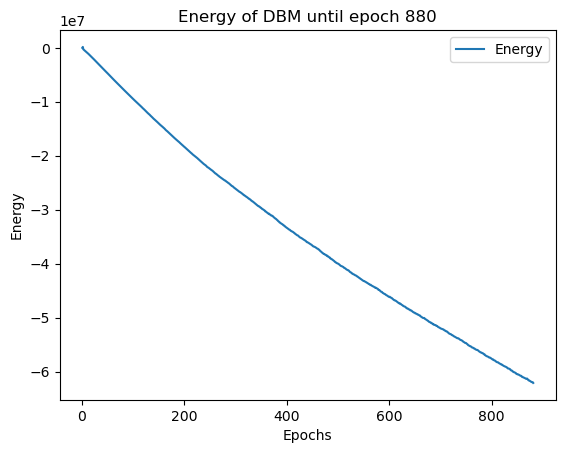

Starting...:  44%|█████████▎           | 882/2000 [11:15:20<14:21:24, 46.23s/it]

Time taken for DBM epoch 881 is 46.26170229911804


Starting...:  44%|█████████▎           | 883/2000 [11:16:07<14:20:13, 46.21s/it]

Time taken for DBM epoch 882 is 46.154695987701416


Starting...:  44%|█████████▎           | 884/2000 [11:16:53<14:18:39, 46.16s/it]

Time taken for DBM epoch 883 is 46.063995361328125


Starting...:  44%|█████████▎           | 885/2000 [11:17:39<14:17:39, 46.15s/it]

Time taken for DBM epoch 884 is 46.123570919036865


Starting...:  44%|█████████▎           | 886/2000 [11:18:25<14:15:18, 46.07s/it]

Time taken for DBM epoch 885 is 45.866103649139404


Starting...:  44%|█████████▎           | 887/2000 [11:19:11<14:13:35, 46.02s/it]

Time taken for DBM epoch 886 is 45.8962185382843


Starting...:  44%|█████████▎           | 888/2000 [11:19:57<14:13:13, 46.04s/it]

Time taken for DBM epoch 887 is 46.088295459747314


Starting...:  44%|█████████▎           | 889/2000 [11:20:43<14:12:59, 46.07s/it]

Time taken for DBM epoch 888 is 46.131932973861694


Starting...:  44%|█████████▎           | 890/2000 [11:21:29<14:13:04, 46.11s/it]

Time taken for DBM epoch 889 is 46.219016551971436


Starting...:  44%|█████████▎           | 890/2000 [11:22:15<14:13:04, 46.11s/it]

Time taken for DBM epoch 890 is 46.13863492012024


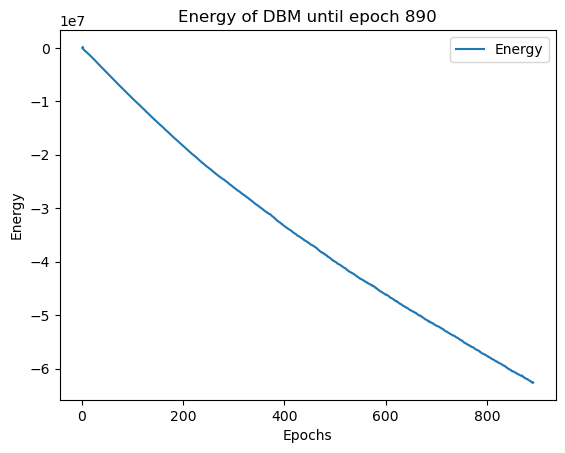

Starting...:  45%|█████████▎           | 892/2000 [11:23:01<14:12:43, 46.18s/it]

Time taken for DBM epoch 891 is 46.2436580657959


Starting...:  45%|█████████▍           | 893/2000 [11:23:48<14:11:24, 46.15s/it]

Time taken for DBM epoch 892 is 46.077587604522705


Starting...:  45%|█████████▍           | 894/2000 [11:24:33<14:08:41, 46.04s/it]

Time taken for DBM epoch 893 is 45.79427146911621


Starting...:  45%|█████████▍           | 895/2000 [11:25:20<14:10:26, 46.18s/it]

Time taken for DBM epoch 894 is 46.49773192405701


Starting...:  45%|█████████▍           | 896/2000 [11:26:07<14:16:11, 46.53s/it]

Time taken for DBM epoch 895 is 47.35810327529907


Starting...:  45%|█████████▍           | 897/2000 [11:26:54<14:16:08, 46.57s/it]

Time taken for DBM epoch 896 is 46.66142201423645


Starting...:  45%|█████████▍           | 898/2000 [11:27:40<14:12:09, 46.40s/it]

Time taken for DBM epoch 897 is 45.98844766616821


Starting...:  45%|█████████▍           | 899/2000 [11:28:26<14:08:05, 46.22s/it]

Time taken for DBM epoch 898 is 45.800415992736816


Starting...:  45%|█████████▍           | 900/2000 [11:29:12<14:06:16, 46.16s/it]

Time taken for DBM epoch 899 is 46.025226354599


Starting...:  45%|█████████▍           | 900/2000 [11:29:58<14:06:16, 46.16s/it]

Time taken for DBM epoch 900 is 46.04846405982971


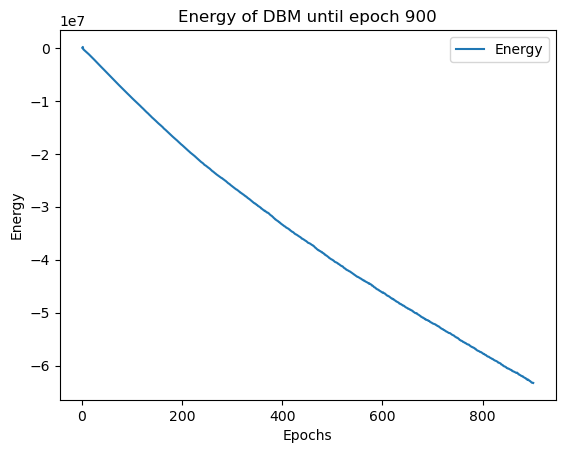

Starting...:  45%|█████████▍           | 902/2000 [11:30:44<14:04:01, 46.12s/it]

Time taken for DBM epoch 901 is 46.04583239555359


Starting...:  45%|█████████▍           | 903/2000 [11:31:30<14:03:08, 46.12s/it]

Time taken for DBM epoch 902 is 46.099977254867554


Starting...:  45%|█████████▍           | 904/2000 [11:32:16<14:02:06, 46.10s/it]

Time taken for DBM epoch 903 is 46.065407276153564


Starting...:  45%|█████████▌           | 905/2000 [11:33:02<14:01:00, 46.08s/it]

Time taken for DBM epoch 904 is 46.03984475135803


Starting...:  45%|█████████▌           | 906/2000 [11:33:48<14:00:52, 46.12s/it]

Time taken for DBM epoch 905 is 46.19998025894165


Starting...:  45%|█████████▌           | 907/2000 [11:34:35<14:02:35, 46.25s/it]

Time taken for DBM epoch 906 is 46.57200074195862


Starting...:  45%|█████████▌           | 908/2000 [11:35:21<14:01:05, 46.21s/it]

Time taken for DBM epoch 907 is 46.118005990982056


Starting...:  45%|█████████▌           | 909/2000 [11:36:08<14:02:25, 46.33s/it]

Time taken for DBM epoch 908 is 46.59978103637695


Starting...:  46%|█████████▌           | 910/2000 [11:36:55<14:05:30, 46.54s/it]

Time taken for DBM epoch 909 is 47.03796195983887


Starting...:  46%|█████████▌           | 910/2000 [11:37:40<14:05:30, 46.54s/it]

Time taken for DBM epoch 910 is 45.603821992874146


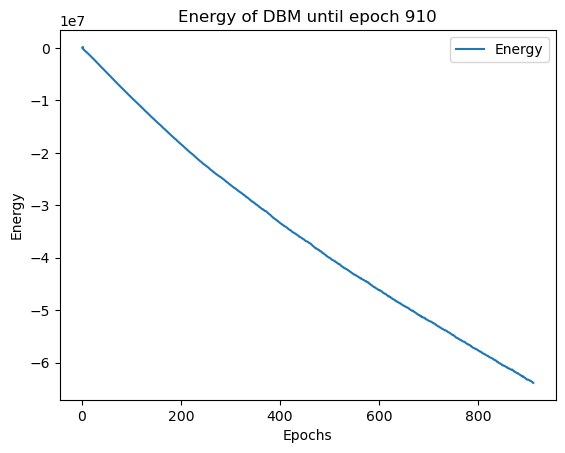

Starting...:  46%|█████████▌           | 912/2000 [11:38:26<13:53:19, 45.96s/it]

Time taken for DBM epoch 911 is 45.1700713634491


Starting...:  46%|█████████▌           | 913/2000 [11:39:11<13:48:34, 45.74s/it]

Time taken for DBM epoch 912 is 45.22091293334961


Starting...:  46%|█████████▌           | 914/2000 [11:39:56<13:45:55, 45.63s/it]

Time taken for DBM epoch 913 is 45.38860368728638


Starting...:  46%|█████████▌           | 915/2000 [11:40:41<13:42:18, 45.47s/it]

Time taken for DBM epoch 914 is 45.10443353652954


Starting...:  46%|█████████▌           | 916/2000 [11:41:26<13:39:37, 45.37s/it]

Time taken for DBM epoch 915 is 45.11613583564758


Starting...:  46%|█████████▋           | 917/2000 [11:42:11<13:37:38, 45.30s/it]

Time taken for DBM epoch 916 is 45.140666484832764


Starting...:  46%|█████████▋           | 918/2000 [11:42:57<13:35:33, 45.23s/it]

Time taken for DBM epoch 917 is 45.052305698394775


Starting...:  46%|█████████▋           | 919/2000 [11:43:42<13:34:15, 45.20s/it]

Time taken for DBM epoch 918 is 45.12508821487427


Starting...:  46%|█████████▋           | 920/2000 [11:44:27<13:33:15, 45.18s/it]

Time taken for DBM epoch 919 is 45.14862608909607


Starting...:  46%|█████████▋           | 920/2000 [11:45:12<13:33:15, 45.18s/it]

Time taken for DBM epoch 920 is 45.09449601173401


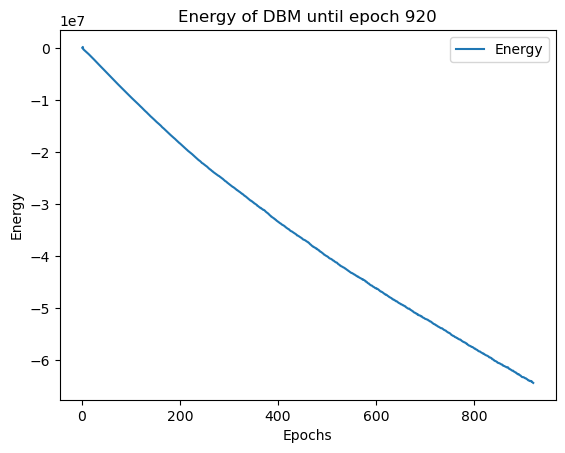

Starting...:  46%|█████████▋           | 922/2000 [11:45:57<13:32:03, 45.20s/it]

Time taken for DBM epoch 921 is 45.22464632987976


Starting...:  46%|█████████▋           | 923/2000 [11:46:43<13:33:16, 45.31s/it]

Time taken for DBM epoch 922 is 45.562785625457764


Starting...:  46%|█████████▋           | 924/2000 [11:47:28<13:32:37, 45.31s/it]

Time taken for DBM epoch 923 is 45.328203439712524


Starting...:  46%|█████████▋           | 925/2000 [11:48:13<13:31:39, 45.30s/it]

Time taken for DBM epoch 924 is 45.27286195755005


Starting...:  46%|█████████▋           | 926/2000 [11:48:59<13:30:55, 45.30s/it]

Time taken for DBM epoch 925 is 45.30551075935364


Starting...:  46%|█████████▋           | 927/2000 [11:49:44<13:30:21, 45.31s/it]

Time taken for DBM epoch 926 is 45.33713722229004


Starting...:  46%|█████████▋           | 928/2000 [11:50:29<13:29:05, 45.29s/it]

Time taken for DBM epoch 927 is 45.21870183944702


Starting...:  46%|█████████▊           | 929/2000 [11:51:14<13:28:05, 45.27s/it]

Time taken for DBM epoch 928 is 45.23864150047302


Starting...:  46%|█████████▊           | 930/2000 [11:52:00<13:27:09, 45.26s/it]

Time taken for DBM epoch 929 is 45.23612141609192


Starting...:  46%|█████████▊           | 930/2000 [11:52:45<13:27:09, 45.26s/it]

Time taken for DBM epoch 930 is 45.290822982788086


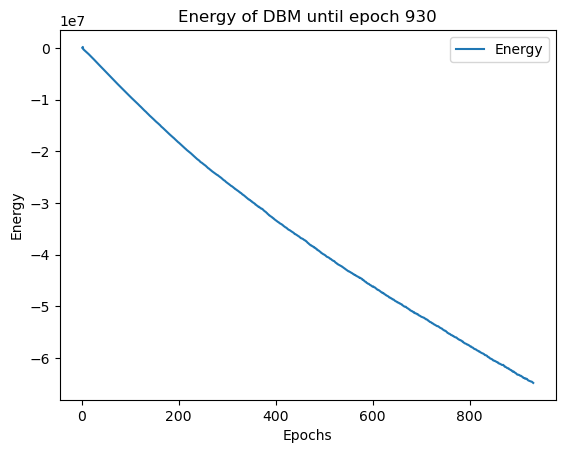

Starting...:  47%|█████████▊           | 932/2000 [11:53:30<13:25:34, 45.26s/it]

Time taken for DBM epoch 931 is 45.153624296188354


Starting...:  47%|█████████▊           | 933/2000 [11:54:16<13:25:26, 45.29s/it]

Time taken for DBM epoch 932 is 45.37283539772034


Starting...:  47%|█████████▊           | 934/2000 [11:55:01<13:25:57, 45.36s/it]

Time taken for DBM epoch 933 is 45.5296585559845


Starting...:  47%|█████████▊           | 935/2000 [11:55:47<13:27:16, 45.48s/it]

Time taken for DBM epoch 934 is 45.75110673904419


Starting...:  47%|█████████▊           | 936/2000 [11:56:33<13:27:29, 45.54s/it]

Time taken for DBM epoch 935 is 45.665265798568726


Starting...:  47%|█████████▊           | 937/2000 [11:57:18<13:27:30, 45.58s/it]

Time taken for DBM epoch 936 is 45.6803822517395


Starting...:  47%|█████████▊           | 938/2000 [11:58:04<13:25:49, 45.53s/it]

Time taken for DBM epoch 937 is 45.40542507171631


Starting...:  47%|█████████▊           | 939/2000 [11:58:49<13:23:25, 45.43s/it]

Time taken for DBM epoch 938 is 45.215996503829956


Starting...:  47%|█████████▊           | 940/2000 [11:59:34<13:22:01, 45.40s/it]

Time taken for DBM epoch 939 is 45.31086850166321


Starting...:  47%|█████████▊           | 940/2000 [12:00:20<13:22:01, 45.40s/it]

Time taken for DBM epoch 940 is 45.52148509025574


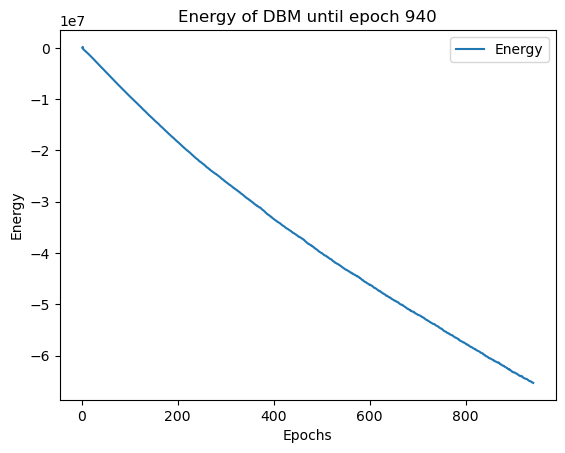

Starting...:  47%|█████████▉           | 942/2000 [12:01:05<13:22:05, 45.49s/it]

Time taken for DBM epoch 941 is 45.5385856628418


Starting...:  47%|█████████▉           | 943/2000 [12:01:51<13:20:55, 45.46s/it]

Time taken for DBM epoch 942 is 45.41031098365784


Starting...:  47%|█████████▉           | 944/2000 [12:02:36<13:19:50, 45.45s/it]

Time taken for DBM epoch 943 is 45.40001201629639


Starting...:  47%|█████████▉           | 945/2000 [12:03:22<13:19:28, 45.47s/it]

Time taken for DBM epoch 944 is 45.52102613449097


Starting...:  47%|█████████▉           | 946/2000 [12:04:07<13:19:57, 45.54s/it]

Time taken for DBM epoch 945 is 45.70037293434143


Starting...:  47%|█████████▉           | 947/2000 [12:04:53<13:20:44, 45.63s/it]

Time taken for DBM epoch 946 is 45.83192229270935


Starting...:  47%|█████████▉           | 948/2000 [12:05:39<13:21:01, 45.69s/it]

Time taken for DBM epoch 947 is 45.823078870773315


Starting...:  47%|█████████▉           | 949/2000 [12:06:25<13:20:56, 45.72s/it]

Time taken for DBM epoch 948 is 45.816094160079956


Starting...:  48%|█████████▉           | 950/2000 [12:07:11<13:20:52, 45.76s/it]

Time taken for DBM epoch 949 is 45.8572793006897


Starting...:  48%|█████████▉           | 950/2000 [12:07:57<13:20:52, 45.76s/it]

Time taken for DBM epoch 950 is 45.7881965637207


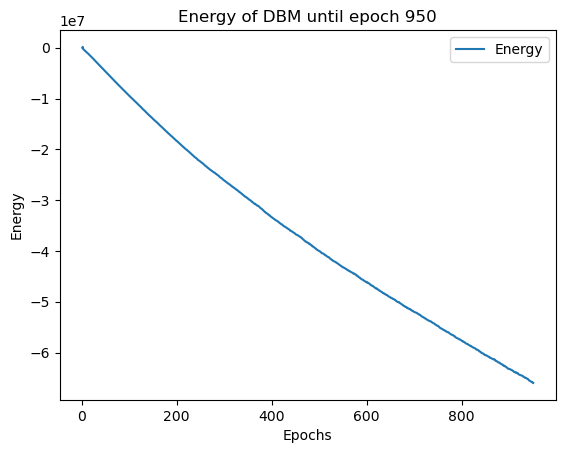

Starting...:  48%|█████████▉           | 952/2000 [12:08:42<13:20:17, 45.82s/it]

Time taken for DBM epoch 951 is 45.85432457923889


Starting...:  48%|██████████           | 953/2000 [12:09:28<13:18:37, 45.77s/it]

Time taken for DBM epoch 952 is 45.646239280700684


Starting...:  48%|██████████           | 954/2000 [12:10:14<13:18:11, 45.79s/it]

Time taken for DBM epoch 953 is 45.829296350479126


Starting...:  48%|██████████           | 955/2000 [12:11:00<13:17:40, 45.80s/it]

Time taken for DBM epoch 954 is 45.83170676231384


Starting...:  48%|██████████           | 956/2000 [12:11:45<13:16:24, 45.77s/it]

Time taken for DBM epoch 955 is 45.70078802108765


Starting...:  48%|██████████           | 957/2000 [12:12:31<13:14:40, 45.71s/it]

Time taken for DBM epoch 956 is 45.58504033088684


Starting...:  48%|██████████           | 958/2000 [12:13:17<13:13:11, 45.67s/it]

Time taken for DBM epoch 957 is 45.57447147369385


Starting...:  48%|██████████           | 959/2000 [12:14:02<13:11:59, 45.65s/it]

Time taken for DBM epoch 958 is 45.588690757751465


Starting...:  48%|██████████           | 960/2000 [12:14:48<13:10:54, 45.63s/it]

Time taken for DBM epoch 959 is 45.58745002746582


Starting...:  48%|██████████           | 960/2000 [12:15:33<13:10:54, 45.63s/it]

Time taken for DBM epoch 960 is 45.58178472518921


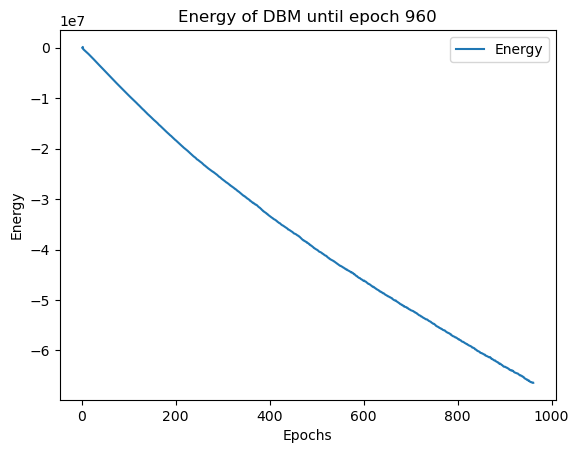

Starting...:  48%|██████████           | 962/2000 [12:16:19<13:09:04, 45.61s/it]

Time taken for DBM epoch 961 is 45.52655816078186


Starting...:  48%|██████████           | 963/2000 [12:17:05<13:08:02, 45.60s/it]

Time taken for DBM epoch 962 is 45.558708906173706


Starting...:  48%|██████████           | 964/2000 [12:17:50<13:07:12, 45.59s/it]

Time taken for DBM epoch 963 is 45.58077073097229


Starting...:  48%|██████████▏          | 965/2000 [12:18:36<13:07:00, 45.62s/it]

Time taken for DBM epoch 964 is 45.69841694831848


Starting...:  48%|██████████▏          | 966/2000 [12:19:21<13:06:02, 45.61s/it]

Time taken for DBM epoch 965 is 45.584457874298096


Starting...:  48%|██████████▏          | 967/2000 [12:20:07<13:05:42, 45.64s/it]

Time taken for DBM epoch 966 is 45.692864418029785


Starting...:  48%|██████████▏          | 968/2000 [12:20:53<13:04:54, 45.63s/it]

Time taken for DBM epoch 967 is 45.62950825691223


Starting...:  48%|██████████▏          | 969/2000 [12:21:39<13:05:08, 45.69s/it]

Time taken for DBM epoch 968 is 45.82569622993469


Starting...:  48%|██████████▏          | 970/2000 [12:22:24<13:03:40, 45.65s/it]

Time taken for DBM epoch 969 is 45.55581021308899


Starting...:  48%|██████████▏          | 970/2000 [12:23:10<13:03:40, 45.65s/it]

Time taken for DBM epoch 970 is 45.378485679626465


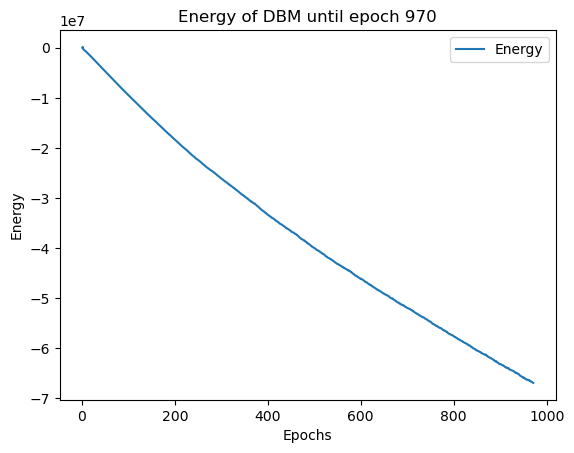

Starting...:  49%|██████████▏          | 972/2000 [12:23:55<12:59:13, 45.48s/it]

Time taken for DBM epoch 971 is 45.19342374801636


Starting...:  49%|██████████▏          | 973/2000 [12:24:40<12:56:38, 45.37s/it]

Time taken for DBM epoch 972 is 45.12458848953247


Starting...:  49%|██████████▏          | 974/2000 [12:25:25<12:54:51, 45.31s/it]

Time taken for DBM epoch 973 is 45.17246699333191


Starting...:  49%|██████████▏          | 975/2000 [12:26:10<12:53:10, 45.26s/it]

Time taken for DBM epoch 974 is 45.13227915763855


Starting...:  49%|██████████▏          | 976/2000 [12:26:55<12:50:36, 45.15s/it]

Time taken for DBM epoch 975 is 44.90420889854431


Starting...:  49%|██████████▎          | 977/2000 [12:27:40<12:48:41, 45.08s/it]

Time taken for DBM epoch 976 is 44.92413663864136


Starting...:  49%|██████████▎          | 978/2000 [12:28:25<12:47:09, 45.04s/it]

Time taken for DBM epoch 977 is 44.93061685562134


Starting...:  49%|██████████▎          | 979/2000 [12:29:10<12:45:51, 45.01s/it]

Time taken for DBM epoch 978 is 44.93069052696228


Starting...:  49%|██████████▎          | 980/2000 [12:29:55<12:44:48, 44.99s/it]

Time taken for DBM epoch 979 is 44.94771718978882


Starting...:  49%|██████████▎          | 980/2000 [12:30:40<12:44:48, 44.99s/it]

Time taken for DBM epoch 980 is 45.02904152870178


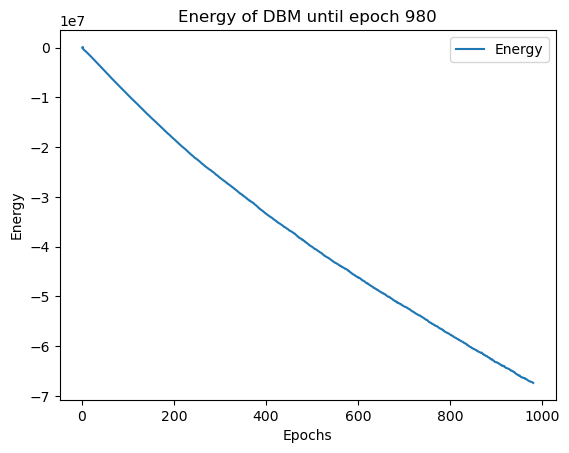

Starting...:  49%|██████████▎          | 982/2000 [12:31:25<12:43:44, 45.01s/it]

Time taken for DBM epoch 981 is 44.97732424736023


Starting...:  49%|██████████▎          | 983/2000 [12:32:10<12:42:39, 44.99s/it]

Time taken for DBM epoch 982 is 44.94985365867615


Starting...:  49%|██████████▎          | 984/2000 [12:32:55<12:42:54, 45.05s/it]

Time taken for DBM epoch 983 is 45.188469648361206


Starting...:  49%|██████████▎          | 985/2000 [12:33:41<12:44:08, 45.17s/it]

Time taken for DBM epoch 984 is 45.4453501701355


Starting...:  49%|██████████▎          | 986/2000 [12:34:26<12:44:47, 45.25s/it]

Time taken for DBM epoch 985 is 45.446383237838745


Starting...:  49%|██████████▎          | 987/2000 [12:35:12<12:45:20, 45.33s/it]

Time taken for DBM epoch 986 is 45.51104140281677


Starting...:  49%|██████████▎          | 988/2000 [12:35:57<12:45:32, 45.39s/it]

Time taken for DBM epoch 987 is 45.52043318748474


Starting...:  49%|██████████▍          | 989/2000 [12:36:43<12:45:27, 45.43s/it]

Time taken for DBM epoch 988 is 45.52055096626282


Starting...:  50%|██████████▍          | 990/2000 [12:37:28<12:45:16, 45.46s/it]

Time taken for DBM epoch 989 is 45.5415472984314


Starting...:  50%|██████████▍          | 990/2000 [12:38:14<12:45:16, 45.46s/it]

Time taken for DBM epoch 990 is 45.54232144355774


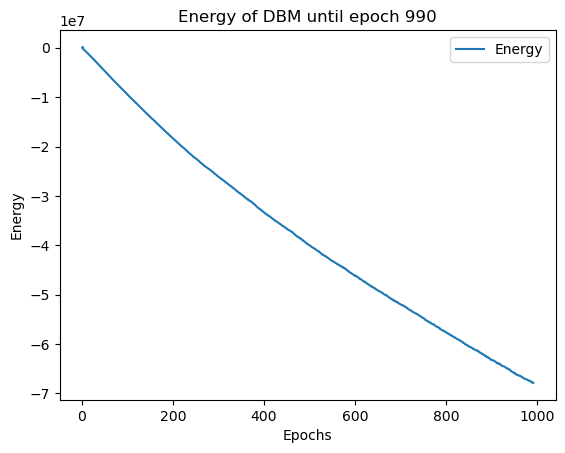

Starting...:  50%|██████████▍          | 992/2000 [12:38:59<12:44:56, 45.53s/it]

Time taken for DBM epoch 991 is 45.56437563896179


Starting...:  50%|██████████▍          | 993/2000 [12:39:45<12:44:10, 45.53s/it]

Time taken for DBM epoch 992 is 45.530757427215576


Starting...:  50%|██████████▍          | 994/2000 [12:40:30<12:43:22, 45.53s/it]

Time taken for DBM epoch 993 is 45.5237979888916


Starting...:  50%|██████████▍          | 995/2000 [12:41:16<12:42:46, 45.54s/it]

Time taken for DBM epoch 994 is 45.55962538719177


Starting...:  50%|██████████▍          | 996/2000 [12:42:02<12:42:45, 45.58s/it]

Time taken for DBM epoch 995 is 45.68573975563049


Starting...:  50%|██████████▍          | 997/2000 [12:42:47<12:42:37, 45.62s/it]

Time taken for DBM epoch 996 is 45.70833086967468


Starting...:  50%|██████████▍          | 998/2000 [12:43:33<12:42:34, 45.66s/it]

Time taken for DBM epoch 997 is 45.76148271560669


Starting...:  50%|██████████▍          | 999/2000 [12:44:19<12:42:24, 45.70s/it]

Time taken for DBM epoch 998 is 45.78038549423218


Starting...:  50%|██████████          | 1000/2000 [12:45:05<12:41:27, 45.69s/it]

Time taken for DBM epoch 999 is 45.66185116767883


Starting...:  50%|██████████          | 1000/2000 [12:45:50<12:41:27, 45.69s/it]

Time taken for DBM epoch 1000 is 45.62851071357727


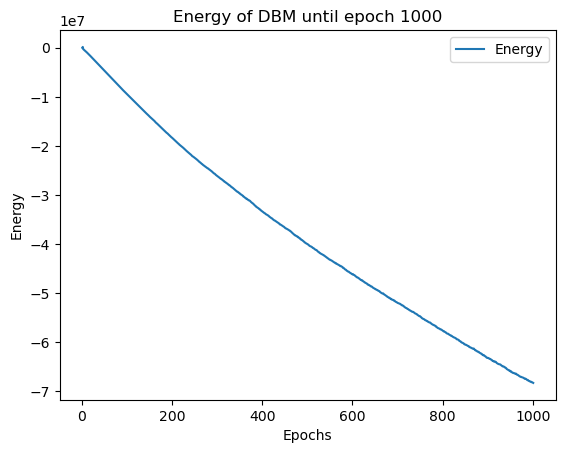

Starting...:  50%|██████████          | 1002/2000 [12:46:36<12:40:06, 45.70s/it]

Time taken for DBM epoch 1001 is 45.68153476715088


Starting...:  50%|██████████          | 1003/2000 [12:47:22<12:38:42, 45.66s/it]

Time taken for DBM epoch 1002 is 45.57118105888367


Starting...:  50%|██████████          | 1004/2000 [12:48:07<12:37:36, 45.64s/it]

Time taken for DBM epoch 1003 is 45.590898513793945


Starting...:  50%|██████████          | 1005/2000 [12:48:53<12:36:30, 45.62s/it]

Time taken for DBM epoch 1004 is 45.568599700927734


Starting...:  50%|██████████          | 1006/2000 [12:49:38<12:35:41, 45.61s/it]

Time taken for DBM epoch 1005 is 45.60619068145752


Starting...:  50%|██████████          | 1007/2000 [12:50:24<12:34:45, 45.60s/it]

Time taken for DBM epoch 1006 is 45.57965135574341


Starting...:  50%|██████████          | 1008/2000 [12:51:10<12:34:28, 45.63s/it]

Time taken for DBM epoch 1007 is 45.70114493370056


Starting...:  50%|██████████          | 1009/2000 [12:51:55<12:33:12, 45.60s/it]

Time taken for DBM epoch 1008 is 45.528998136520386


Starting...:  50%|██████████          | 1010/2000 [12:52:41<12:33:10, 45.65s/it]

Time taken for DBM epoch 1009 is 45.748737812042236


Starting...:  50%|██████████          | 1010/2000 [12:53:27<12:33:10, 45.65s/it]

Time taken for DBM epoch 1010 is 45.58568549156189


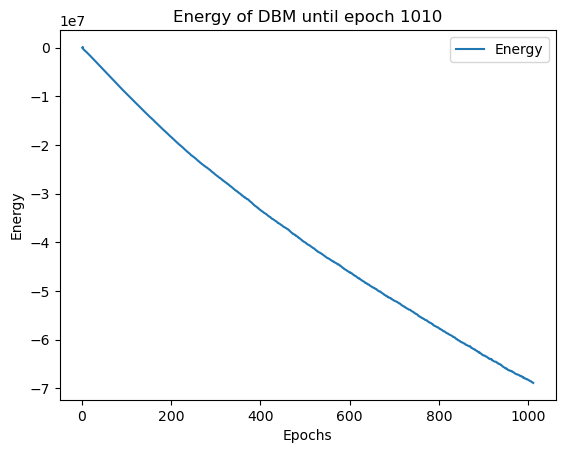

Starting...:  51%|██████████          | 1012/2000 [12:54:12<12:31:40, 45.65s/it]

Time taken for DBM epoch 1011 is 45.61688041687012


Starting...:  51%|██████████▏         | 1013/2000 [12:54:58<12:30:34, 45.63s/it]

Time taken for DBM epoch 1012 is 45.57903718948364


Starting...:  51%|██████████▏         | 1014/2000 [12:55:43<12:29:44, 45.62s/it]

Time taken for DBM epoch 1013 is 45.612104415893555


Starting...:  51%|██████████▏         | 1015/2000 [12:56:29<12:29:11, 45.64s/it]

Time taken for DBM epoch 1014 is 45.667596101760864


Starting...:  51%|██████████▏         | 1016/2000 [12:57:15<12:28:15, 45.63s/it]

Time taken for DBM epoch 1015 is 45.59789991378784


Starting...:  51%|██████████▏         | 1017/2000 [12:58:00<12:27:20, 45.62s/it]

Time taken for DBM epoch 1016 is 45.59546232223511


Starting...:  51%|██████████▏         | 1018/2000 [12:58:46<12:26:14, 45.60s/it]

Time taken for DBM epoch 1017 is 45.54464912414551


Starting...:  51%|██████████▏         | 1019/2000 [12:59:31<12:25:46, 45.61s/it]

Time taken for DBM epoch 1018 is 45.65383839607239


Starting...:  51%|██████████▏         | 1020/2000 [13:00:17<12:25:21, 45.63s/it]

Time taken for DBM epoch 1019 is 45.68188524246216


Starting...:  51%|██████████▏         | 1020/2000 [13:01:03<12:25:21, 45.63s/it]

Time taken for DBM epoch 1020 is 45.83083200454712


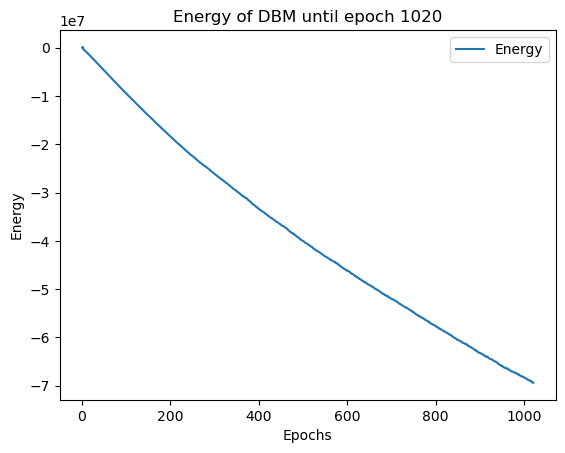

Starting...:  51%|██████████▏         | 1022/2000 [13:01:49<12:25:11, 45.72s/it]

Time taken for DBM epoch 1021 is 45.69477343559265


Starting...:  51%|██████████▏         | 1023/2000 [13:02:35<12:24:41, 45.73s/it]

Time taken for DBM epoch 1022 is 45.77200412750244


Starting...:  51%|██████████▏         | 1024/2000 [13:03:20<12:23:52, 45.73s/it]

Time taken for DBM epoch 1023 is 45.719743967056274


Starting...:  51%|██████████▎         | 1025/2000 [13:04:06<12:23:24, 45.75s/it]

Time taken for DBM epoch 1024 is 45.78979992866516


Starting...:  51%|██████████▎         | 1026/2000 [13:04:52<12:22:51, 45.76s/it]

Time taken for DBM epoch 1025 is 45.793633460998535


Starting...:  51%|██████████▎         | 1027/2000 [13:05:37<12:21:21, 45.72s/it]

Time taken for DBM epoch 1026 is 45.60909628868103


Starting...:  51%|██████████▎         | 1028/2000 [13:06:23<12:20:39, 45.72s/it]

Time taken for DBM epoch 1027 is 45.72676658630371


Starting...:  51%|██████████▎         | 1029/2000 [13:07:09<12:20:05, 45.73s/it]

Time taken for DBM epoch 1028 is 45.75991654396057


Starting...:  52%|██████████▎         | 1030/2000 [13:07:55<12:19:44, 45.76s/it]

Time taken for DBM epoch 1029 is 45.81725716590881


Starting...:  52%|██████████▎         | 1030/2000 [13:08:41<12:19:44, 45.76s/it]

Time taken for DBM epoch 1030 is 45.76561450958252


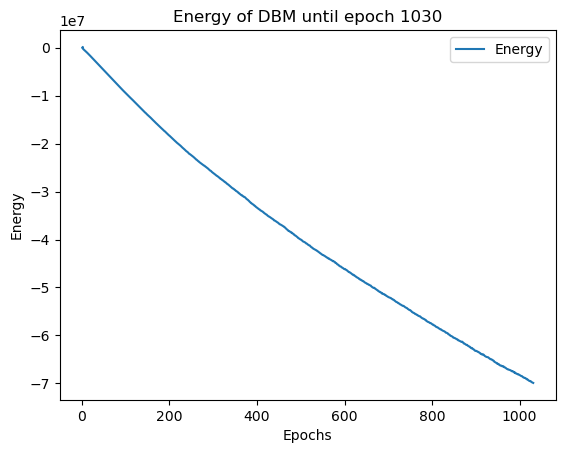

Starting...:  52%|██████████▎         | 1032/2000 [13:09:26<12:18:01, 45.75s/it]

Time taken for DBM epoch 1031 is 45.63474440574646


Starting...:  52%|██████████▎         | 1033/2000 [13:10:12<12:15:05, 45.61s/it]

Time taken for DBM epoch 1032 is 45.29521441459656


Starting...:  52%|██████████▎         | 1034/2000 [13:10:57<12:13:44, 45.57s/it]

Time taken for DBM epoch 1033 is 45.48612976074219


Starting...:  52%|██████████▎         | 1035/2000 [13:11:43<12:13:32, 45.61s/it]

Time taken for DBM epoch 1034 is 45.69028878211975


Starting...:  52%|██████████▎         | 1036/2000 [13:12:29<12:13:32, 45.66s/it]

Time taken for DBM epoch 1035 is 45.7652702331543


Starting...:  52%|██████████▎         | 1037/2000 [13:13:14<12:12:33, 45.64s/it]

Time taken for DBM epoch 1036 is 45.60974979400635


Starting...:  52%|██████████▍         | 1038/2000 [13:14:00<12:11:44, 45.64s/it]

Time taken for DBM epoch 1037 is 45.63170099258423


Starting...:  52%|██████████▍         | 1039/2000 [13:14:46<12:11:25, 45.67s/it]

Time taken for DBM epoch 1038 is 45.73143696784973


Starting...:  52%|██████████▍         | 1040/2000 [13:15:31<12:10:04, 45.63s/it]

Time taken for DBM epoch 1039 is 45.542572021484375


Starting...:  52%|██████████▍         | 1040/2000 [13:16:17<12:10:04, 45.63s/it]

Time taken for DBM epoch 1040 is 45.60124087333679


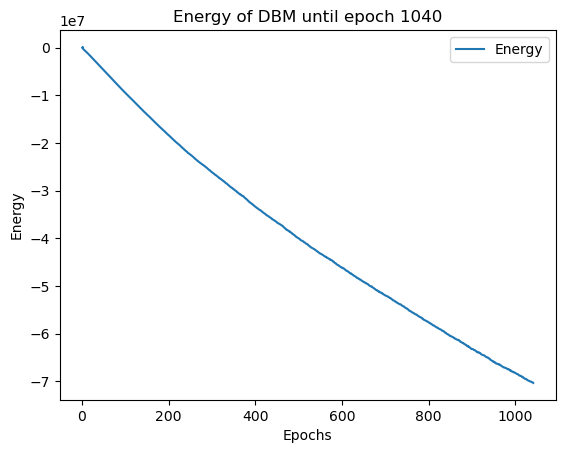

Starting...:  52%|██████████▍         | 1042/2000 [13:17:02<12:08:32, 45.63s/it]

Time taken for DBM epoch 1041 is 45.570149421691895


Starting...:  52%|██████████▍         | 1043/2000 [13:17:48<12:08:02, 45.65s/it]

Time taken for DBM epoch 1042 is 45.68237781524658


Starting...:  52%|██████████▍         | 1044/2000 [13:18:34<12:06:52, 45.62s/it]

Time taken for DBM epoch 1043 is 45.55876970291138


Starting...:  52%|██████████▍         | 1045/2000 [13:19:19<12:06:00, 45.61s/it]

Time taken for DBM epoch 1044 is 45.59624242782593


Starting...:  52%|██████████▍         | 1046/2000 [13:20:05<12:04:58, 45.60s/it]

Time taken for DBM epoch 1045 is 45.55557823181152


Starting...:  52%|██████████▍         | 1047/2000 [13:20:50<12:04:46, 45.63s/it]

Time taken for DBM epoch 1046 is 45.71282362937927


Starting...:  52%|██████████▍         | 1048/2000 [13:21:36<12:04:39, 45.67s/it]

Time taken for DBM epoch 1047 is 45.76688003540039


Starting...:  52%|██████████▍         | 1049/2000 [13:22:22<12:03:36, 45.65s/it]

Time taken for DBM epoch 1048 is 45.610573053359985


Starting...:  52%|██████████▌         | 1050/2000 [13:23:07<12:02:52, 45.66s/it]

Time taken for DBM epoch 1049 is 45.6577353477478


Starting...:  52%|██████████▌         | 1050/2000 [13:23:53<12:02:52, 45.66s/it]

Time taken for DBM epoch 1050 is 45.61921977996826


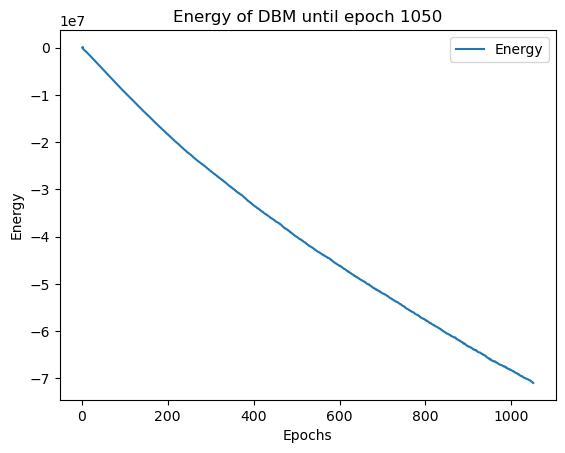

Starting...:  53%|██████████▌         | 1052/2000 [13:24:39<12:01:57, 45.69s/it]

Time taken for DBM epoch 1051 is 45.74516320228577


Starting...:  53%|██████████▌         | 1053/2000 [13:25:25<12:00:57, 45.68s/it]

Time taken for DBM epoch 1052 is 45.6417281627655


Starting...:  53%|██████████▌         | 1054/2000 [13:26:10<12:01:06, 45.74s/it]

Time taken for DBM epoch 1053 is 45.87123727798462


Starting...:  53%|██████████▌         | 1055/2000 [13:26:56<11:59:56, 45.71s/it]

Time taken for DBM epoch 1054 is 45.65010976791382


Starting...:  53%|██████████▌         | 1056/2000 [13:27:42<11:58:38, 45.68s/it]

Time taken for DBM epoch 1055 is 45.59651827812195


Starting...:  53%|██████████▌         | 1057/2000 [13:28:27<11:57:31, 45.65s/it]

Time taken for DBM epoch 1056 is 45.600226163864136


Starting...:  53%|██████████▌         | 1058/2000 [13:29:13<11:55:19, 45.56s/it]

Time taken for DBM epoch 1057 is 45.347750186920166


Starting...:  53%|██████████▌         | 1059/2000 [13:29:58<11:54:12, 45.54s/it]

Time taken for DBM epoch 1058 is 45.4842426776886


Starting...:  53%|██████████▌         | 1060/2000 [13:30:44<11:53:21, 45.53s/it]

Time taken for DBM epoch 1059 is 45.52019762992859


Starting...:  53%|██████████▌         | 1060/2000 [13:31:29<11:53:21, 45.53s/it]

Time taken for DBM epoch 1060 is 45.57738375663757


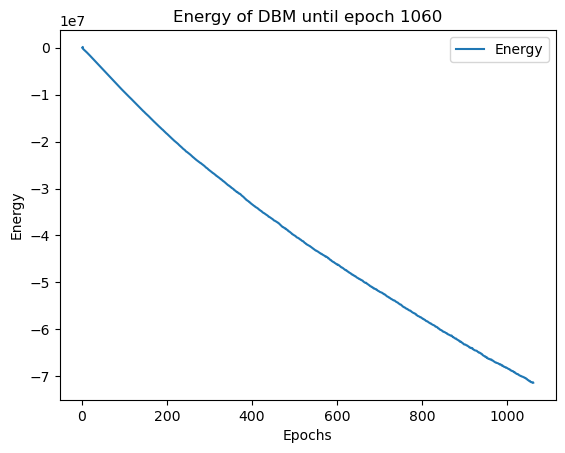

Starting...:  53%|██████████▌         | 1062/2000 [13:32:15<11:52:30, 45.58s/it]

Time taken for DBM epoch 1061 is 45.56574487686157


Starting...:  53%|██████████▋         | 1063/2000 [13:33:01<11:51:45, 45.58s/it]

Time taken for DBM epoch 1062 is 45.579471826553345


Starting...:  53%|██████████▋         | 1064/2000 [13:33:46<11:50:58, 45.58s/it]

Time taken for DBM epoch 1063 is 45.57090425491333


Starting...:  53%|██████████▋         | 1065/2000 [13:34:32<11:50:02, 45.56s/it]

Time taken for DBM epoch 1064 is 45.53615593910217


Starting...:  53%|██████████▋         | 1066/2000 [13:35:17<11:48:57, 45.54s/it]

Time taken for DBM epoch 1065 is 45.49680948257446


Starting...:  53%|██████████▋         | 1067/2000 [13:36:03<11:48:33, 45.57s/it]

Time taken for DBM epoch 1066 is 45.61715793609619


Starting...:  53%|██████████▋         | 1068/2000 [13:36:48<11:47:42, 45.56s/it]

Time taken for DBM epoch 1067 is 45.547592878341675


Starting...:  53%|██████████▋         | 1069/2000 [13:37:34<11:46:51, 45.56s/it]

Time taken for DBM epoch 1068 is 45.54204177856445


Starting...:  54%|██████████▋         | 1070/2000 [13:38:19<11:45:55, 45.54s/it]

Time taken for DBM epoch 1069 is 45.5156192779541


Starting...:  54%|██████████▋         | 1070/2000 [13:39:05<11:45:55, 45.54s/it]

Time taken for DBM epoch 1070 is 45.496227979660034


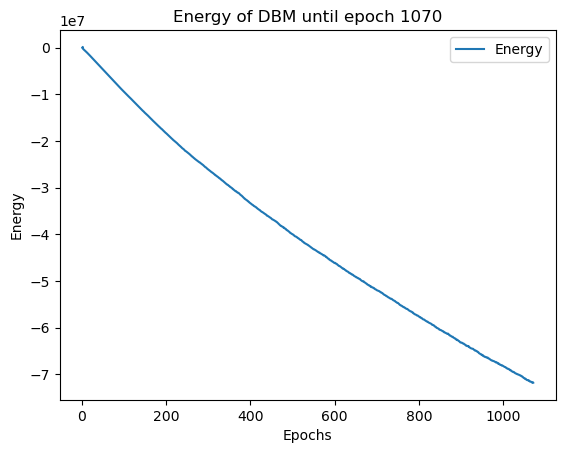

Starting...:  54%|██████████▋         | 1072/2000 [13:39:51<11:44:46, 45.57s/it]

Time taken for DBM epoch 1071 is 45.58121633529663


Starting...:  54%|██████████▋         | 1073/2000 [13:40:36<11:44:23, 45.59s/it]

Time taken for DBM epoch 1072 is 45.646082639694214


Starting...:  54%|██████████▋         | 1074/2000 [13:41:22<11:44:03, 45.62s/it]

Time taken for DBM epoch 1073 is 45.684990882873535


Starting...:  54%|██████████▊         | 1075/2000 [13:42:08<11:43:42, 45.65s/it]

Time taken for DBM epoch 1074 is 45.70836544036865


Starting...:  54%|██████████▊         | 1076/2000 [13:42:53<11:42:58, 45.65s/it]

Time taken for DBM epoch 1075 is 45.64957618713379


Starting...:  54%|██████████▊         | 1077/2000 [13:43:39<11:42:33, 45.67s/it]

Time taken for DBM epoch 1076 is 45.7237548828125


Starting...:  54%|██████████▊         | 1078/2000 [13:44:25<11:41:19, 45.64s/it]

Time taken for DBM epoch 1077 is 45.56673288345337


Starting...:  54%|██████████▊         | 1079/2000 [13:45:10<11:40:44, 45.65s/it]

Time taken for DBM epoch 1078 is 45.676714181900024


Starting...:  54%|██████████▊         | 1080/2000 [13:45:56<11:39:33, 45.62s/it]

Time taken for DBM epoch 1079 is 45.557719230651855


Starting...:  54%|██████████▊         | 1080/2000 [13:46:41<11:39:33, 45.62s/it]

Time taken for DBM epoch 1080 is 45.71133494377136


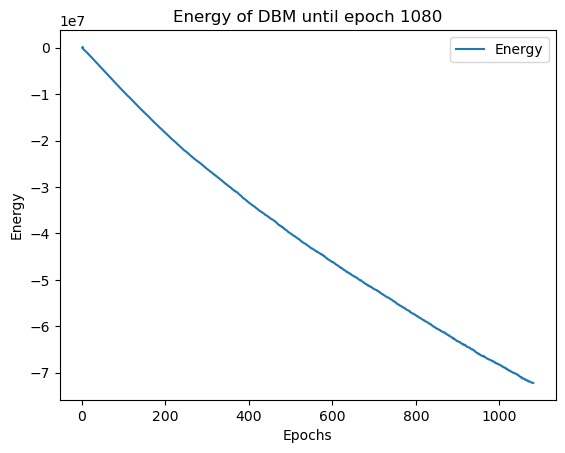

Starting...:  54%|██████████▊         | 1082/2000 [13:47:27<11:38:37, 45.66s/it]

Time taken for DBM epoch 1081 is 45.61169695854187


Starting...:  54%|██████████▊         | 1083/2000 [13:48:13<11:37:38, 45.65s/it]

Time taken for DBM epoch 1082 is 45.61395525932312


Starting...:  54%|██████████▊         | 1084/2000 [13:48:58<11:36:32, 45.62s/it]

Time taken for DBM epoch 1083 is 45.570414781570435


Starting...:  54%|██████████▊         | 1085/2000 [13:49:44<11:35:34, 45.61s/it]

Time taken for DBM epoch 1084 is 45.580339431762695


Starting...:  54%|██████████▊         | 1086/2000 [13:50:29<11:34:29, 45.59s/it]

Time taken for DBM epoch 1085 is 45.540504455566406


Starting...:  54%|██████████▊         | 1087/2000 [13:51:15<11:34:10, 45.62s/it]

Time taken for DBM epoch 1086 is 45.68837833404541


Starting...:  54%|██████████▉         | 1088/2000 [13:52:01<11:33:12, 45.61s/it]

Time taken for DBM epoch 1087 is 45.570740938186646


Starting...:  54%|██████████▉         | 1089/2000 [13:52:46<11:31:56, 45.57s/it]

Time taken for DBM epoch 1088 is 45.49587631225586


Starting...:  55%|██████████▉         | 1090/2000 [13:53:32<11:30:56, 45.56s/it]

Time taken for DBM epoch 1089 is 45.52017545700073


Starting...:  55%|██████████▉         | 1090/2000 [13:54:17<11:30:56, 45.56s/it]

Time taken for DBM epoch 1090 is 45.478094816207886


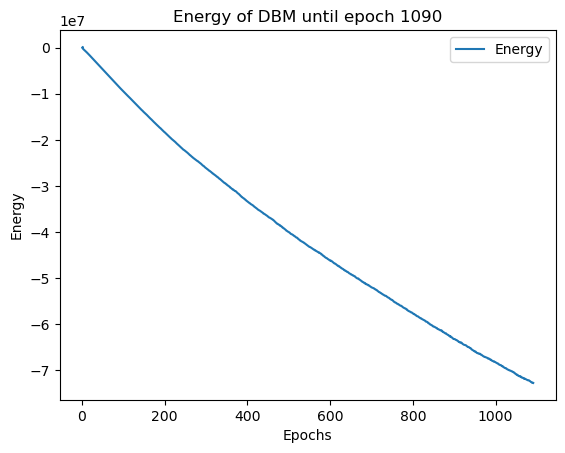

Starting...:  55%|██████████▉         | 1092/2000 [13:55:03<11:28:18, 45.48s/it]

Time taken for DBM epoch 1091 is 45.268492460250854


Starting...:  55%|██████████▉         | 1093/2000 [13:55:48<11:26:07, 45.39s/it]

Time taken for DBM epoch 1092 is 45.16952848434448


Starting...:  55%|██████████▉         | 1094/2000 [13:56:33<11:25:19, 45.39s/it]

Time taken for DBM epoch 1093 is 45.37824630737305


Starting...:  55%|██████████▉         | 1095/2000 [13:57:19<11:25:17, 45.43s/it]

Time taken for DBM epoch 1094 is 45.54429650306702


Starting...:  55%|██████████▉         | 1096/2000 [13:58:04<11:25:04, 45.47s/it]

Time taken for DBM epoch 1095 is 45.55281043052673


Starting...:  55%|██████████▉         | 1097/2000 [13:58:50<11:24:45, 45.50s/it]

Time taken for DBM epoch 1096 is 45.566038608551025


Starting...:  55%|██████████▉         | 1098/2000 [13:59:35<11:24:30, 45.53s/it]

Time taken for DBM epoch 1097 is 45.613178968429565


Starting...:  55%|██████████▉         | 1099/2000 [14:00:21<11:24:18, 45.57s/it]

Time taken for DBM epoch 1098 is 45.65519833564758


Starting...:  55%|███████████         | 1100/2000 [14:01:07<11:23:31, 45.57s/it]

Time taken for DBM epoch 1099 is 45.56463170051575


Starting...:  55%|███████████         | 1100/2000 [14:01:52<11:23:31, 45.57s/it]

Time taken for DBM epoch 1100 is 45.56554102897644


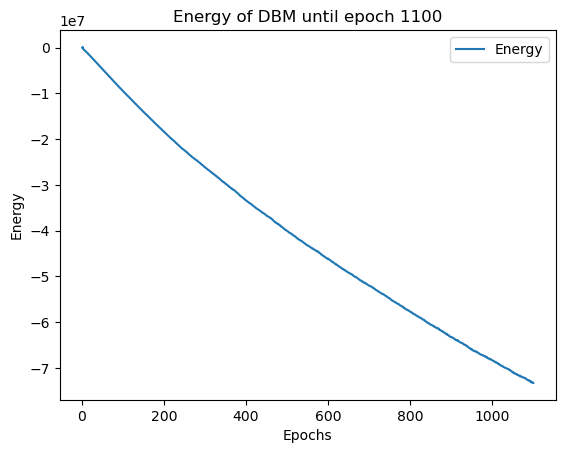

Starting...:  55%|███████████         | 1102/2000 [14:02:38<11:22:32, 45.60s/it]

Time taken for DBM epoch 1101 is 45.61211109161377


Starting...:  55%|███████████         | 1103/2000 [14:03:24<11:21:32, 45.59s/it]

Time taken for DBM epoch 1102 is 45.54984474182129


Starting...:  55%|███████████         | 1104/2000 [14:04:09<11:20:41, 45.58s/it]

Time taken for DBM epoch 1103 is 45.56717777252197


Starting...:  55%|███████████         | 1105/2000 [14:04:55<11:19:45, 45.57s/it]

Time taken for DBM epoch 1104 is 45.54321885108948


Starting...:  55%|███████████         | 1106/2000 [14:05:40<11:18:40, 45.55s/it]

Time taken for DBM epoch 1105 is 45.497122049331665


Starting...:  55%|███████████         | 1107/2000 [14:06:26<11:17:46, 45.54s/it]

Time taken for DBM epoch 1106 is 45.51613926887512


Starting...:  55%|███████████         | 1108/2000 [14:07:11<11:17:06, 45.55s/it]

Time taken for DBM epoch 1107 is 45.559279680252075


Starting...:  55%|███████████         | 1109/2000 [14:07:57<11:16:17, 45.54s/it]

Time taken for DBM epoch 1108 is 45.530956506729126


Starting...:  56%|███████████         | 1110/2000 [14:08:42<11:15:28, 45.54s/it]

Time taken for DBM epoch 1109 is 45.529040575027466


Starting...:  56%|███████████         | 1110/2000 [14:09:28<11:15:28, 45.54s/it]

Time taken for DBM epoch 1110 is 45.55876016616821


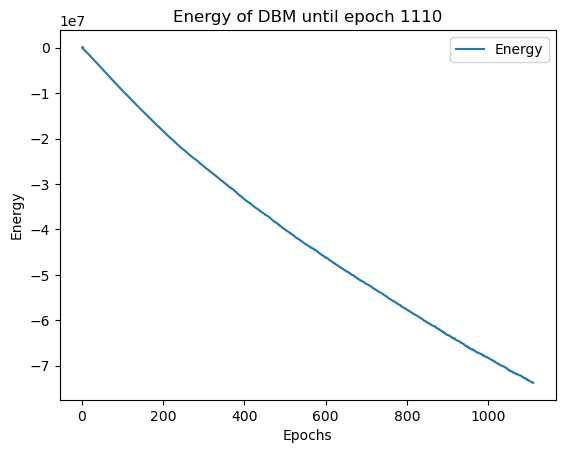

Starting...:  56%|███████████         | 1112/2000 [14:10:13<11:14:21, 45.56s/it]

Time taken for DBM epoch 1111 is 45.51982235908508


Starting...:  56%|███████████▏        | 1113/2000 [14:10:59<11:13:24, 45.55s/it]

Time taken for DBM epoch 1112 is 45.520811557769775


Starting...:  56%|███████████▏        | 1114/2000 [14:11:45<11:12:33, 45.55s/it]

Time taken for DBM epoch 1113 is 45.53011155128479


Starting...:  56%|███████████▏        | 1115/2000 [14:12:30<11:11:37, 45.53s/it]

Time taken for DBM epoch 1114 is 45.508437395095825


Starting...:  56%|███████████▏        | 1116/2000 [14:13:16<11:10:47, 45.53s/it]

Time taken for DBM epoch 1115 is 45.5167453289032


Starting...:  56%|███████████▏        | 1117/2000 [14:14:01<11:09:03, 45.46s/it]

Time taken for DBM epoch 1116 is 45.3068470954895


Starting...:  56%|███████████▏        | 1118/2000 [14:14:46<11:08:18, 45.46s/it]

Time taken for DBM epoch 1117 is 45.46257758140564


Starting...:  56%|███████████▏        | 1119/2000 [14:15:32<11:07:32, 45.46s/it]

Time taken for DBM epoch 1118 is 45.45950675010681


Starting...:  56%|███████████▏        | 1120/2000 [14:16:17<11:06:56, 45.47s/it]

Time taken for DBM epoch 1119 is 45.49915337562561


Starting...:  56%|███████████▏        | 1120/2000 [14:17:03<11:06:56, 45.47s/it]

Time taken for DBM epoch 1120 is 45.56315517425537


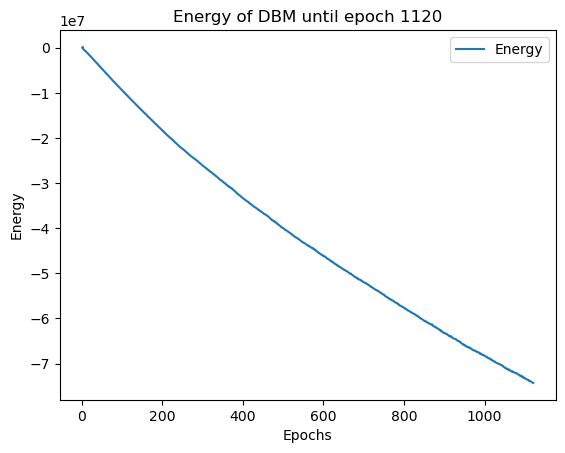

Starting...:  56%|███████████▏        | 1122/2000 [14:17:48<11:06:15, 45.53s/it]

Time taken for DBM epoch 1121 is 45.52440547943115


Starting...:  56%|███████████▏        | 1123/2000 [14:18:34<11:05:40, 45.54s/it]

Time taken for DBM epoch 1122 is 45.56762456893921


Starting...:  56%|███████████▏        | 1124/2000 [14:19:20<11:04:59, 45.55s/it]

Time taken for DBM epoch 1123 is 45.5587363243103


Starting...:  56%|███████████▎        | 1125/2000 [14:20:05<11:04:02, 45.53s/it]

Time taken for DBM epoch 1124 is 45.50515413284302


Starting...:  56%|███████████▎        | 1126/2000 [14:20:51<11:03:17, 45.53s/it]

Time taken for DBM epoch 1125 is 45.5345823764801


Starting...:  56%|███████████▎        | 1127/2000 [14:21:36<11:02:37, 45.54s/it]

Time taken for DBM epoch 1126 is 45.5542848110199


Starting...:  56%|███████████▎        | 1128/2000 [14:22:22<11:01:55, 45.54s/it]

Time taken for DBM epoch 1127 is 45.55400252342224


Starting...:  56%|███████████▎        | 1129/2000 [14:23:07<11:00:56, 45.53s/it]

Time taken for DBM epoch 1128 is 45.49227476119995


Starting...:  56%|███████████▎        | 1130/2000 [14:23:53<11:00:02, 45.52s/it]

Time taken for DBM epoch 1129 is 45.49926018714905


Starting...:  56%|███████████▎        | 1130/2000 [14:24:38<11:00:02, 45.52s/it]

Time taken for DBM epoch 1130 is 45.53882312774658


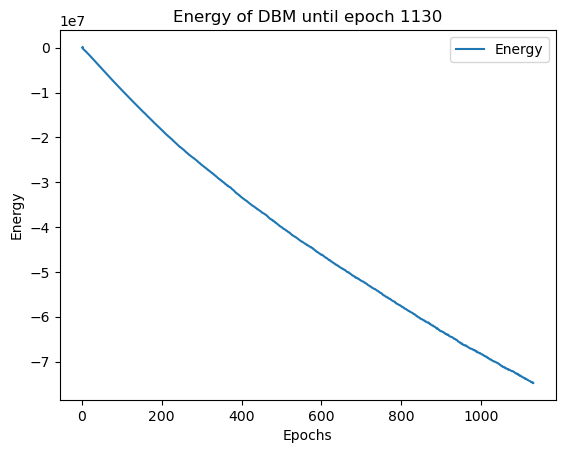

Starting...:  57%|███████████▎        | 1132/2000 [14:25:24<10:58:37, 45.53s/it]

Time taken for DBM epoch 1131 is 45.452012062072754


Starting...:  57%|███████████▎        | 1133/2000 [14:26:09<10:57:50, 45.53s/it]

Time taken for DBM epoch 1132 is 45.5210497379303


Starting...:  57%|███████████▎        | 1134/2000 [14:26:55<10:56:31, 45.49s/it]

Time taken for DBM epoch 1133 is 45.39482259750366


Starting...:  57%|███████████▎        | 1135/2000 [14:27:40<10:54:58, 45.43s/it]

Time taken for DBM epoch 1134 is 45.30165338516235


Starting...:  57%|███████████▎        | 1136/2000 [14:28:25<10:53:52, 45.41s/it]

Time taken for DBM epoch 1135 is 45.35175919532776


Starting...:  57%|███████████▎        | 1137/2000 [14:29:11<10:52:47, 45.38s/it]

Time taken for DBM epoch 1136 is 45.33166527748108


Starting...:  57%|███████████▍        | 1138/2000 [14:29:56<10:51:49, 45.37s/it]

Time taken for DBM epoch 1137 is 45.33642339706421


Starting...:  57%|███████████▍        | 1139/2000 [14:30:42<10:51:18, 45.39s/it]

Time taken for DBM epoch 1138 is 45.4259819984436


Starting...:  57%|███████████▍        | 1140/2000 [14:31:27<10:50:35, 45.39s/it]

Time taken for DBM epoch 1139 is 45.39481592178345


Starting...:  57%|███████████▍        | 1140/2000 [14:32:12<10:50:35, 45.39s/it]

Time taken for DBM epoch 1140 is 45.37627148628235


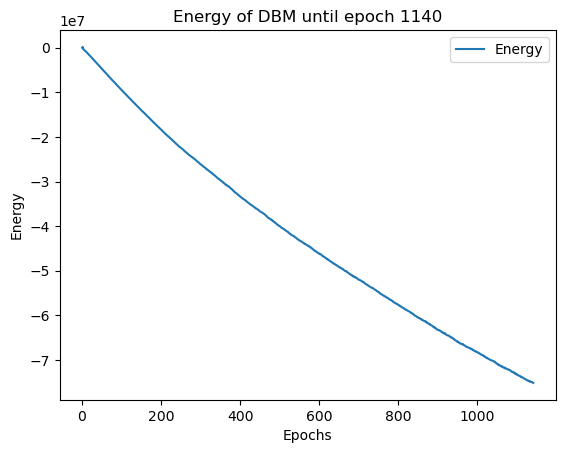

Starting...:  57%|███████████▍        | 1142/2000 [14:32:58<10:49:42, 45.43s/it]

Time taken for DBM epoch 1141 is 45.47164344787598


Starting...:  57%|███████████▍        | 1143/2000 [14:33:43<10:49:15, 45.46s/it]

Time taken for DBM epoch 1142 is 45.50267457962036


Starting...:  57%|███████████▍        | 1144/2000 [14:34:29<10:48:50, 45.48s/it]

Time taken for DBM epoch 1143 is 45.53516507148743


Starting...:  57%|███████████▍        | 1145/2000 [14:35:14<10:47:41, 45.45s/it]

Time taken for DBM epoch 1144 is 45.38714671134949


Starting...:  57%|███████████▍        | 1146/2000 [14:35:59<10:45:36, 45.36s/it]

Time taken for DBM epoch 1145 is 45.142308473587036


Starting...:  57%|███████████▍        | 1147/2000 [14:36:44<10:43:14, 45.25s/it]

Time taken for DBM epoch 1146 is 44.97910284996033


Starting...:  57%|███████████▍        | 1148/2000 [14:37:30<10:42:31, 45.25s/it]

Time taken for DBM epoch 1147 is 45.25536513328552


Starting...:  57%|███████████▍        | 1149/2000 [14:38:15<10:42:16, 45.28s/it]

Time taken for DBM epoch 1148 is 45.36680006980896


Starting...:  57%|███████████▌        | 1150/2000 [14:39:00<10:42:12, 45.33s/it]

Time taken for DBM epoch 1149 is 45.4462354183197


Starting...:  57%|███████████▌        | 1150/2000 [14:39:46<10:42:12, 45.33s/it]

Time taken for DBM epoch 1150 is 45.43091869354248


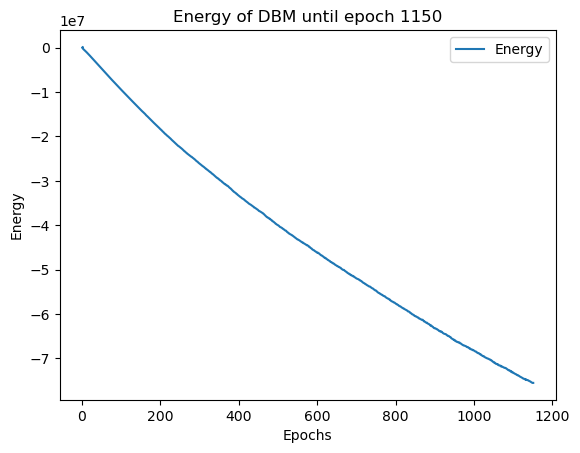

Starting...:  58%|███████████▌        | 1152/2000 [14:40:31<10:41:51, 45.41s/it]

Time taken for DBM epoch 1151 is 45.467686891555786


Starting...:  58%|███████████▌        | 1153/2000 [14:41:17<10:41:09, 45.42s/it]

Time taken for DBM epoch 1152 is 45.4284610748291


Starting...:  58%|███████████▌        | 1154/2000 [14:42:02<10:40:25, 45.42s/it]

Time taken for DBM epoch 1153 is 45.424436807632446


Starting...:  58%|███████████▌        | 1155/2000 [14:42:48<10:39:48, 45.43s/it]

Time taken for DBM epoch 1154 is 45.45057916641235


Starting...:  58%|███████████▌        | 1156/2000 [14:43:33<10:38:48, 45.41s/it]

Time taken for DBM epoch 1155 is 45.37332105636597


Starting...:  58%|███████████▌        | 1157/2000 [14:44:19<10:38:09, 45.42s/it]

Time taken for DBM epoch 1156 is 45.43693542480469


Starting...:  58%|███████████▌        | 1158/2000 [14:45:04<10:36:58, 45.39s/it]

Time taken for DBM epoch 1157 is 45.31856870651245


Starting...:  58%|███████████▌        | 1159/2000 [14:45:49<10:36:08, 45.38s/it]

Time taken for DBM epoch 1158 is 45.372530460357666


Starting...:  58%|███████████▌        | 1160/2000 [14:46:35<10:35:12, 45.37s/it]

Time taken for DBM epoch 1159 is 45.33992123603821


Starting...:  58%|███████████▌        | 1160/2000 [14:47:20<10:35:12, 45.37s/it]

Time taken for DBM epoch 1160 is 45.344428300857544


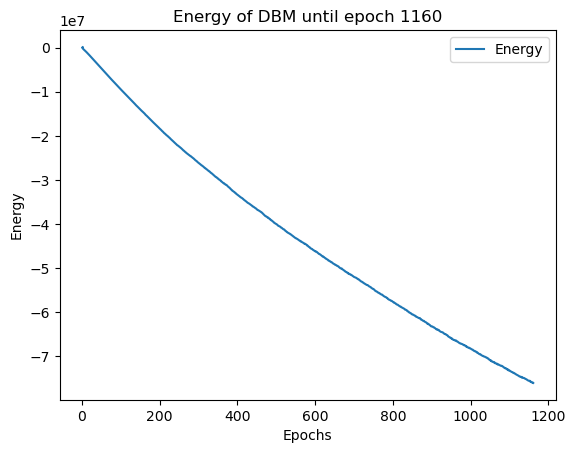

Starting...:  58%|███████████▌        | 1162/2000 [14:48:05<10:33:54, 45.39s/it]

Time taken for DBM epoch 1161 is 45.36281418800354


Starting...:  58%|███████████▋        | 1163/2000 [14:48:51<10:33:19, 45.40s/it]

Time taken for DBM epoch 1162 is 45.428624868392944


Starting...:  58%|███████████▋        | 1164/2000 [14:49:36<10:32:44, 45.41s/it]

Time taken for DBM epoch 1163 is 45.44199275970459


Starting...:  58%|███████████▋        | 1165/2000 [14:50:22<10:31:56, 45.41s/it]

Time taken for DBM epoch 1164 is 45.39938735961914


Starting...:  58%|███████████▋        | 1166/2000 [14:51:07<10:31:20, 45.42s/it]

Time taken for DBM epoch 1165 is 45.446325063705444


Starting...:  58%|███████████▋        | 1167/2000 [14:51:52<10:29:45, 45.36s/it]

Time taken for DBM epoch 1166 is 45.221314430236816


Starting...:  58%|███████████▋        | 1168/2000 [14:52:38<10:28:58, 45.36s/it]

Time taken for DBM epoch 1167 is 45.35510873794556


Starting...:  58%|███████████▋        | 1169/2000 [14:53:23<10:28:29, 45.38s/it]

Time taken for DBM epoch 1168 is 45.424389123916626


Starting...:  58%|███████████▋        | 1170/2000 [14:54:09<10:28:19, 45.42s/it]

Time taken for DBM epoch 1169 is 45.52056431770325


Starting...:  58%|███████████▋        | 1170/2000 [14:54:54<10:28:19, 45.42s/it]

Time taken for DBM epoch 1170 is 45.48962736129761


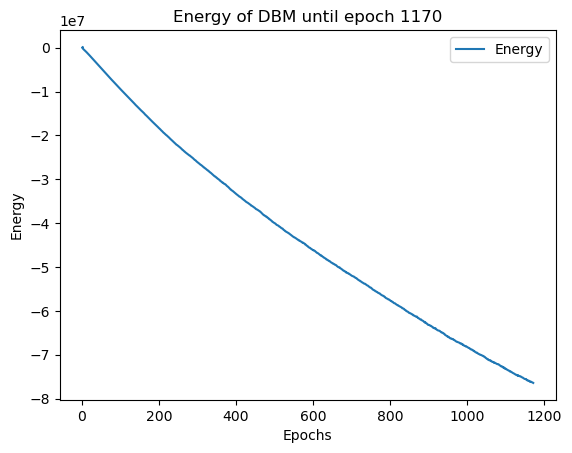

Starting...:  59%|███████████▋        | 1172/2000 [14:55:40<10:27:32, 45.47s/it]

Time taken for DBM epoch 1171 is 45.451904296875


Starting...:  59%|███████████▋        | 1173/2000 [14:56:25<10:26:45, 45.47s/it]

Time taken for DBM epoch 1172 is 45.465452671051025


Starting...:  59%|███████████▋        | 1174/2000 [14:57:11<10:26:04, 45.48s/it]

Time taken for DBM epoch 1173 is 45.49090790748596


Starting...:  59%|███████████▊        | 1175/2000 [14:57:56<10:25:20, 45.48s/it]

Time taken for DBM epoch 1174 is 45.48293709754944


Starting...:  59%|███████████▊        | 1176/2000 [14:58:42<10:24:46, 45.49s/it]

Time taken for DBM epoch 1175 is 45.52383995056152


Starting...:  59%|███████████▊        | 1177/2000 [14:59:27<10:23:42, 45.47s/it]

Time taken for DBM epoch 1176 is 45.420801877975464


Starting...:  59%|███████████▊        | 1178/2000 [15:00:13<10:22:57, 45.47s/it]

Time taken for DBM epoch 1177 is 45.47239875793457


Starting...:  59%|███████████▊        | 1179/2000 [15:00:58<10:22:12, 45.47s/it]

Time taken for DBM epoch 1178 is 45.47011113166809


Starting...:  59%|███████████▊        | 1180/2000 [15:01:44<10:21:15, 45.46s/it]

Time taken for DBM epoch 1179 is 45.42539691925049


Starting...:  59%|███████████▊        | 1180/2000 [15:02:29<10:21:15, 45.46s/it]

Time taken for DBM epoch 1180 is 45.34341382980347


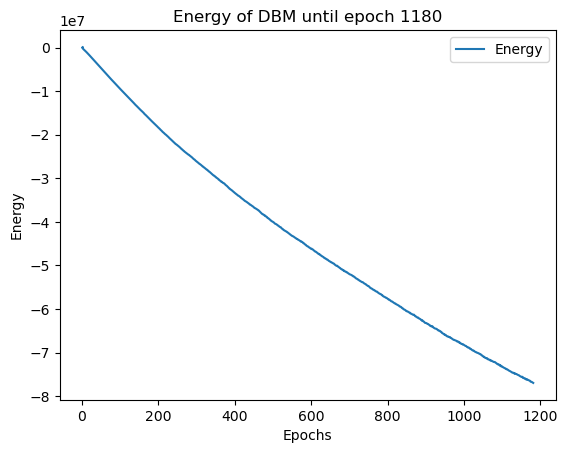

Starting...:  59%|███████████▊        | 1182/2000 [15:03:14<10:19:39, 45.45s/it]

Time taken for DBM epoch 1181 is 45.4471914768219


Starting...:  59%|███████████▊        | 1183/2000 [15:04:00<10:19:16, 45.48s/it]

Time taken for DBM epoch 1182 is 45.54205536842346


Starting...:  59%|███████████▊        | 1184/2000 [15:04:45<10:18:18, 45.46s/it]

Time taken for DBM epoch 1183 is 45.428722620010376


Starting...:  59%|███████████▊        | 1185/2000 [15:05:31<10:17:22, 45.45s/it]

Time taken for DBM epoch 1184 is 45.42220425605774


Starting...:  59%|███████████▊        | 1186/2000 [15:06:16<10:16:20, 45.43s/it]

Time taken for DBM epoch 1185 is 45.381136417388916


Starting...:  59%|███████████▊        | 1187/2000 [15:07:02<10:15:04, 45.39s/it]

Time taken for DBM epoch 1186 is 45.303112268447876


Starting...:  59%|███████████▉        | 1188/2000 [15:07:47<10:13:56, 45.36s/it]

Time taken for DBM epoch 1187 is 45.29921793937683


Starting...:  59%|███████████▉        | 1189/2000 [15:08:32<10:13:14, 45.37s/it]

Time taken for DBM epoch 1188 is 45.38114023208618


Starting...:  60%|███████████▉        | 1190/2000 [15:09:17<10:12:07, 45.34s/it]

Time taken for DBM epoch 1189 is 45.2788827419281


Starting...:  60%|███████████▉        | 1190/2000 [15:10:03<10:12:07, 45.34s/it]

Time taken for DBM epoch 1190 is 45.8169310092926


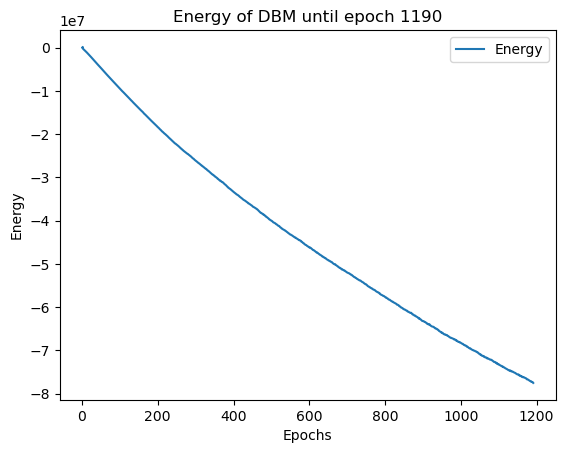

Starting...:  60%|███████████▉        | 1192/2000 [15:10:49<10:11:42, 45.42s/it]

Time taken for DBM epoch 1191 is 45.174320220947266


Starting...:  60%|███████████▉        | 1193/2000 [15:11:34<10:09:48, 45.34s/it]

Time taken for DBM epoch 1192 is 45.13993811607361


Starting...:  60%|███████████▉        | 1194/2000 [15:12:19<10:10:20, 45.43s/it]

Time taken for DBM epoch 1193 is 45.65789532661438


Starting...:  60%|███████████▉        | 1195/2000 [15:13:05<10:09:01, 45.39s/it]

Time taken for DBM epoch 1194 is 45.29603934288025


Starting...:  60%|███████████▉        | 1196/2000 [15:13:50<10:09:31, 45.49s/it]

Time taken for DBM epoch 1195 is 45.706148862838745


Starting...:  60%|███████████▉        | 1197/2000 [15:14:37<10:12:07, 45.74s/it]

Time taken for DBM epoch 1196 is 46.320003509521484


Starting...:  60%|███████████▉        | 1198/2000 [15:15:22<10:10:40, 45.69s/it]

Time taken for DBM epoch 1197 is 45.566423654556274


Starting...:  60%|███████████▉        | 1199/2000 [15:16:09<10:13:06, 45.93s/it]

Time taken for DBM epoch 1198 is 46.484001874923706


Starting...:  60%|████████████        | 1200/2000 [15:16:54<10:11:11, 45.84s/it]

Time taken for DBM epoch 1199 is 45.63810062408447


Starting...:  60%|████████████        | 1200/2000 [15:17:41<10:11:11, 45.84s/it]

Time taken for DBM epoch 1200 is 46.972139835357666


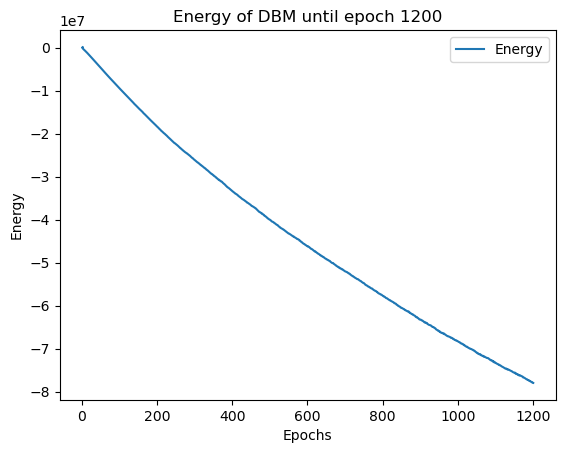

Starting...:  60%|████████████        | 1202/2000 [15:18:28<10:17:29, 46.43s/it]

Time taken for DBM epoch 1201 is 46.82715177536011


Starting...:  60%|████████████        | 1203/2000 [15:19:16<10:21:05, 46.76s/it]

Time taken for DBM epoch 1202 is 47.52612257003784


Starting...:  60%|████████████        | 1204/2000 [15:20:03<10:22:21, 46.91s/it]

Time taken for DBM epoch 1203 is 47.271831035614014


Starting...:  60%|████████████        | 1205/2000 [15:20:50<10:19:06, 46.73s/it]

Time taken for DBM epoch 1204 is 46.28890514373779


Starting...:  60%|████████████        | 1206/2000 [15:21:36<10:15:16, 46.49s/it]

Time taken for DBM epoch 1205 is 45.9553599357605


Starting...:  60%|████████████        | 1207/2000 [15:22:21<10:12:14, 46.32s/it]

Time taken for DBM epoch 1206 is 45.921716928482056


Starting...:  60%|████████████        | 1208/2000 [15:23:07<10:07:06, 45.99s/it]

Time taken for DBM epoch 1207 is 45.22124719619751


Starting...:  60%|████████████        | 1209/2000 [15:23:52<10:03:22, 45.77s/it]

Time taken for DBM epoch 1208 is 45.244056224823


Starting...:  60%|████████████        | 1210/2000 [15:24:37<10:00:10, 45.58s/it]

Time taken for DBM epoch 1209 is 45.15024733543396


Starting...:  60%|████████████        | 1210/2000 [15:25:22<10:00:10, 45.58s/it]

Time taken for DBM epoch 1210 is 45.280980348587036


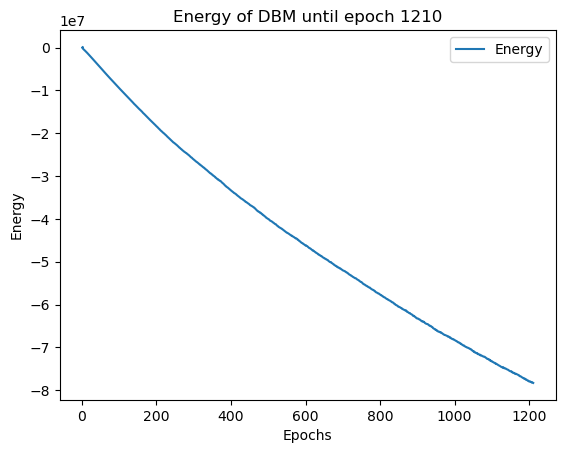

Starting...:  61%|████████████▋        | 1212/2000 [15:26:08<9:57:26, 45.49s/it]

Time taken for DBM epoch 1211 is 45.40013885498047


Starting...:  61%|████████████▋        | 1213/2000 [15:26:53<9:56:40, 45.49s/it]

Time taken for DBM epoch 1212 is 45.48735046386719


Starting...:  61%|████████████▋        | 1214/2000 [15:27:39<9:55:54, 45.49s/it]

Time taken for DBM epoch 1213 is 45.48535180091858


Starting...:  61%|████████████▊        | 1215/2000 [15:28:24<9:55:06, 45.49s/it]

Time taken for DBM epoch 1214 is 45.477514028549194


Starting...:  61%|████████████▊        | 1216/2000 [15:29:10<9:54:18, 45.48s/it]

Time taken for DBM epoch 1215 is 45.47604012489319


Starting...:  61%|████████████▊        | 1217/2000 [15:29:55<9:53:33, 45.48s/it]

Time taken for DBM epoch 1216 is 45.4825553894043


Starting...:  61%|████████████▊        | 1218/2000 [15:30:41<9:52:29, 45.46s/it]

Time taken for DBM epoch 1217 is 45.40557360649109


Starting...:  61%|████████████▊        | 1219/2000 [15:31:26<9:51:24, 45.43s/it]

Time taken for DBM epoch 1218 is 45.375651836395264


Starting...:  61%|████████████▊        | 1220/2000 [15:32:11<9:50:24, 45.42s/it]

Time taken for DBM epoch 1219 is 45.372108697891235


Starting...:  61%|████████████▊        | 1220/2000 [15:32:57<9:50:24, 45.42s/it]

Time taken for DBM epoch 1220 is 45.22874188423157


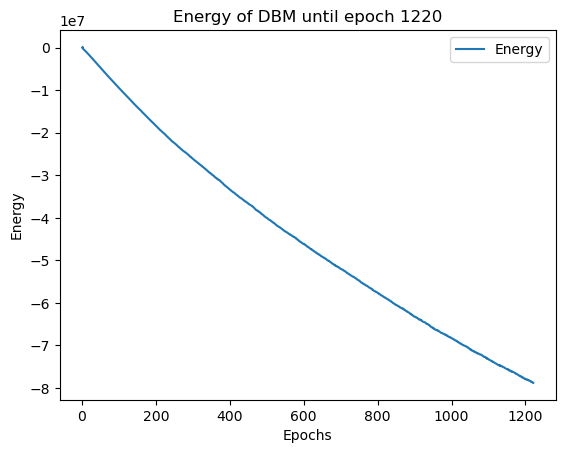

Starting...:  61%|████████████▊        | 1222/2000 [15:33:42<9:47:42, 45.32s/it]

Time taken for DBM epoch 1221 is 45.152907371520996


Starting...:  61%|████████████▊        | 1223/2000 [15:34:27<9:46:57, 45.33s/it]

Time taken for DBM epoch 1222 is 45.32640862464905


Starting...:  61%|████████████▊        | 1224/2000 [15:35:13<9:46:38, 45.36s/it]

Time taken for DBM epoch 1223 is 45.43502926826477


Starting...:  61%|████████████▊        | 1225/2000 [15:35:58<9:46:15, 45.39s/it]

Time taken for DBM epoch 1224 is 45.4571008682251


Starting...:  61%|████████████▊        | 1226/2000 [15:36:44<9:46:08, 45.44s/it]

Time taken for DBM epoch 1225 is 45.552818298339844


Starting...:  61%|████████████▉        | 1227/2000 [15:37:29<9:45:51, 45.47s/it]

Time taken for DBM epoch 1226 is 45.55703401565552


Starting...:  61%|████████████▉        | 1228/2000 [15:38:15<9:45:15, 45.49s/it]

Time taken for DBM epoch 1227 is 45.517000913619995


Starting...:  61%|████████████▉        | 1229/2000 [15:39:00<9:44:43, 45.50s/it]

Time taken for DBM epoch 1228 is 45.54342079162598


Starting...:  62%|████████████▉        | 1230/2000 [15:39:46<9:43:19, 45.45s/it]

Time taken for DBM epoch 1229 is 45.338072061538696


Starting...:  62%|████████████▉        | 1230/2000 [15:40:31<9:43:19, 45.45s/it]

Time taken for DBM epoch 1230 is 45.546663761138916


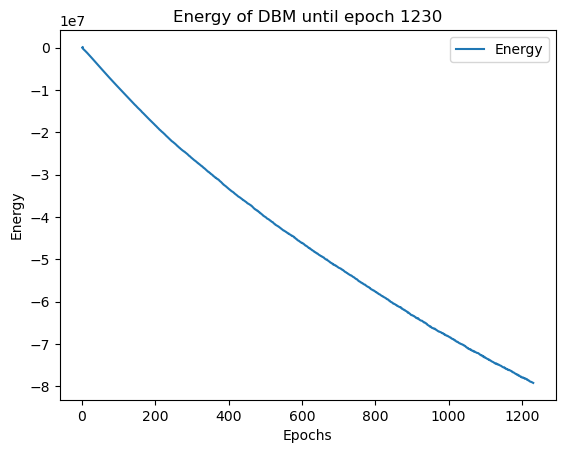

Starting...:  62%|████████████▉        | 1232/2000 [15:41:17<9:42:54, 45.54s/it]

Time taken for DBM epoch 1231 is 45.58436918258667


Starting...:  62%|████████████▉        | 1233/2000 [15:42:02<9:41:39, 45.50s/it]

Time taken for DBM epoch 1232 is 45.40852236747742


Starting...:  62%|████████████▉        | 1234/2000 [15:42:47<9:39:32, 45.39s/it]

Time taken for DBM epoch 1233 is 45.145874977111816


Starting...:  62%|████████████▉        | 1235/2000 [15:43:33<9:37:50, 45.32s/it]

Time taken for DBM epoch 1234 is 45.148016691207886


Starting...:  62%|████████████▉        | 1236/2000 [15:44:18<9:36:52, 45.30s/it]

Time taken for DBM epoch 1235 is 45.26367735862732


Starting...:  62%|████████████▉        | 1237/2000 [15:45:03<9:35:47, 45.28s/it]

Time taken for DBM epoch 1236 is 45.22131562232971


Starting...:  62%|████████████▉        | 1238/2000 [15:45:48<9:34:48, 45.26s/it]

Time taken for DBM epoch 1237 is 45.21525430679321


Starting...:  62%|█████████████        | 1239/2000 [15:46:34<9:34:41, 45.31s/it]

Time taken for DBM epoch 1238 is 45.429466247558594


Starting...:  62%|█████████████        | 1240/2000 [15:47:19<9:33:13, 45.25s/it]

Time taken for DBM epoch 1239 is 45.120853424072266


Starting...:  62%|█████████████        | 1240/2000 [15:48:04<9:33:13, 45.25s/it]

Time taken for DBM epoch 1240 is 45.060237646102905


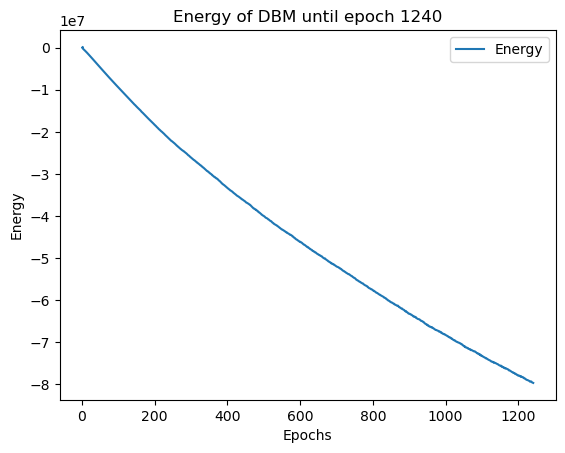

Starting...:  62%|█████████████        | 1242/2000 [15:48:49<9:30:22, 45.15s/it]

Time taken for DBM epoch 1241 is 44.94823479652405


Starting...:  62%|█████████████        | 1243/2000 [15:49:34<9:29:39, 45.15s/it]

Time taken for DBM epoch 1242 is 45.15866184234619


Starting...:  62%|█████████████        | 1244/2000 [15:50:19<9:28:31, 45.12s/it]

Time taken for DBM epoch 1243 is 45.04644989967346


Starting...:  62%|█████████████        | 1245/2000 [15:51:04<9:27:24, 45.09s/it]

Time taken for DBM epoch 1244 is 45.02737641334534


Starting...:  62%|█████████████        | 1246/2000 [15:51:49<9:26:29, 45.08s/it]

Time taken for DBM epoch 1245 is 45.044960737228394


Starting...:  62%|█████████████        | 1247/2000 [15:52:34<9:25:21, 45.05s/it]

Time taken for DBM epoch 1246 is 44.97830057144165


Starting...:  62%|█████████████        | 1248/2000 [15:53:19<9:24:07, 45.01s/it]

Time taken for DBM epoch 1247 is 44.91778874397278


Starting...:  62%|█████████████        | 1249/2000 [15:54:04<9:23:56, 45.06s/it]

Time taken for DBM epoch 1248 is 45.16253590583801


Starting...:  62%|█████████████▏       | 1250/2000 [15:54:49<9:23:26, 45.07s/it]

Time taken for DBM epoch 1249 is 45.11853551864624


Starting...:  62%|█████████████▏       | 1250/2000 [15:55:35<9:23:26, 45.07s/it]

Time taken for DBM epoch 1250 is 45.02717137336731


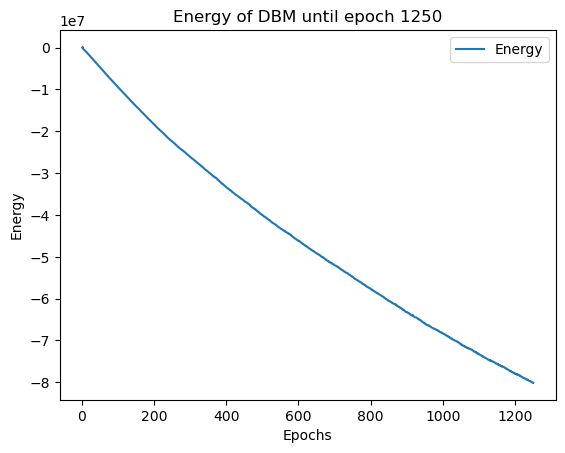

Starting...:  63%|█████████████▏       | 1252/2000 [15:56:20<9:22:01, 45.08s/it]

Time taken for DBM epoch 1251 is 45.04778480529785


Starting...:  63%|█████████████▏       | 1253/2000 [15:57:05<9:22:17, 45.16s/it]

Time taken for DBM epoch 1252 is 45.35243463516235


Starting...:  63%|█████████████▏       | 1254/2000 [15:57:50<9:20:51, 45.11s/it]

Time taken for DBM epoch 1253 is 44.98156023025513


Starting...:  63%|█████████████▏       | 1255/2000 [15:58:35<9:19:25, 45.05s/it]

Time taken for DBM epoch 1254 is 44.92439818382263


Starting...:  63%|█████████████▏       | 1256/2000 [15:59:20<9:18:52, 45.07s/it]

Time taken for DBM epoch 1255 is 45.106863021850586


Starting...:  63%|█████████████▏       | 1257/2000 [16:00:05<9:18:13, 45.08s/it]

Time taken for DBM epoch 1256 is 45.09626746177673


Starting...:  63%|█████████████▏       | 1258/2000 [16:00:50<9:18:17, 45.14s/it]

Time taken for DBM epoch 1257 is 45.29854416847229


Starting...:  63%|█████████████▏       | 1259/2000 [16:01:36<9:17:14, 45.12s/it]

Time taken for DBM epoch 1258 is 45.06519532203674


Starting...:  63%|█████████████▏       | 1260/2000 [16:02:21<9:16:49, 45.15s/it]

Time taken for DBM epoch 1259 is 45.21261739730835


Starting...:  63%|█████████████▏       | 1260/2000 [16:03:06<9:16:49, 45.15s/it]

Time taken for DBM epoch 1260 is 45.13736367225647


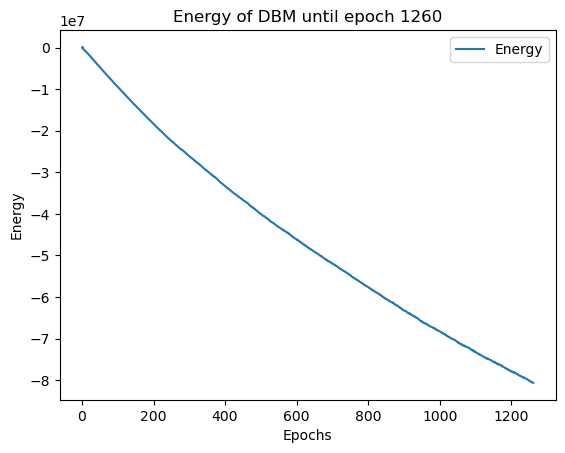

Starting...:  63%|█████████████▎       | 1262/2000 [16:03:51<9:16:10, 45.22s/it]

Time taken for DBM epoch 1261 is 45.29963254928589


Starting...:  63%|█████████████▎       | 1263/2000 [16:04:36<9:14:49, 45.17s/it]

Time taken for DBM epoch 1262 is 45.05690026283264


Starting...:  63%|█████████████▎       | 1264/2000 [16:05:22<9:14:16, 45.19s/it]

Time taken for DBM epoch 1263 is 45.222084522247314


Starting...:  63%|█████████████▎       | 1265/2000 [16:06:06<9:12:25, 45.10s/it]

Time taken for DBM epoch 1264 is 44.88475775718689


Starting...:  63%|█████████████▎       | 1266/2000 [16:06:52<9:11:29, 45.08s/it]

Time taken for DBM epoch 1265 is 45.04667115211487


Starting...:  63%|█████████████▎       | 1267/2000 [16:07:37<9:10:29, 45.06s/it]

Time taken for DBM epoch 1266 is 45.01122450828552


Starting...:  63%|█████████████▎       | 1268/2000 [16:08:22<9:10:04, 45.09s/it]

Time taken for DBM epoch 1267 is 45.154072999954224


Starting...:  63%|█████████████▎       | 1269/2000 [16:09:07<9:08:57, 45.06s/it]

Time taken for DBM epoch 1268 is 44.98523259162903


Starting...:  64%|█████████████▎       | 1270/2000 [16:09:52<9:08:40, 45.10s/it]

Time taken for DBM epoch 1269 is 45.187195777893066


Starting...:  64%|█████████████▎       | 1270/2000 [16:10:37<9:08:40, 45.10s/it]

Time taken for DBM epoch 1270 is 44.914185762405396


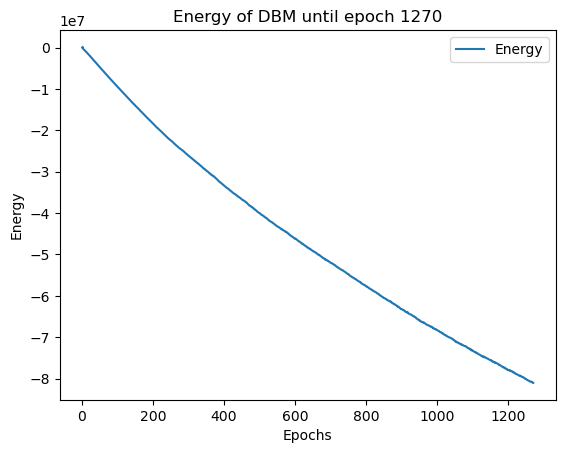

Starting...:  64%|█████████████▎       | 1272/2000 [16:11:22<9:06:32, 45.05s/it]

Time taken for DBM epoch 1271 is 44.96692442893982


Starting...:  64%|█████████████▎       | 1273/2000 [16:12:07<9:05:22, 45.01s/it]

Time taken for DBM epoch 1272 is 44.93033266067505


Starting...:  64%|█████████████▍       | 1274/2000 [16:12:52<9:04:29, 45.00s/it]

Time taken for DBM epoch 1273 is 44.97241139411926


Starting...:  64%|█████████████▍       | 1275/2000 [16:13:37<9:03:18, 44.96s/it]

Time taken for DBM epoch 1274 is 44.88018870353699


Starting...:  64%|█████████████▍       | 1276/2000 [16:14:22<9:02:18, 44.94s/it]

Time taken for DBM epoch 1275 is 44.89091992378235


Starting...:  64%|█████████████▍       | 1277/2000 [16:15:06<9:01:30, 44.94s/it]

Time taken for DBM epoch 1276 is 44.92681169509888


Starting...:  64%|█████████████▍       | 1278/2000 [16:15:52<9:01:14, 44.98s/it]

Time taken for DBM epoch 1277 is 45.072869300842285


Starting...:  64%|█████████████▍       | 1279/2000 [16:16:37<9:00:57, 45.02s/it]

Time taken for DBM epoch 1278 is 45.10509181022644


Starting...:  64%|█████████████▍       | 1280/2000 [16:17:22<9:00:32, 45.05s/it]

Time taken for DBM epoch 1279 is 45.110851764678955


Starting...:  64%|█████████████▍       | 1280/2000 [16:18:07<9:00:32, 45.05s/it]

Time taken for DBM epoch 1280 is 45.32830452919006


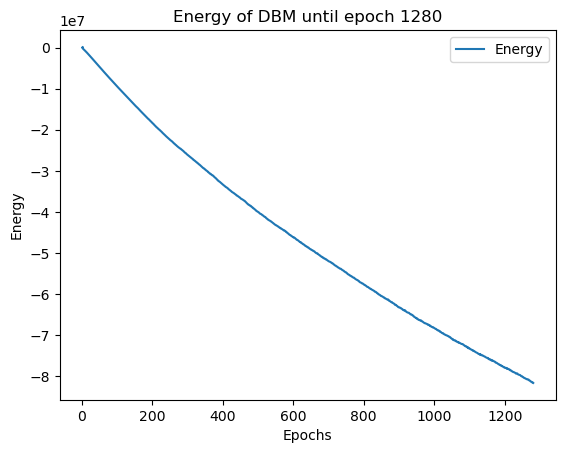

Starting...:  64%|█████████████▍       | 1282/2000 [16:18:53<9:01:32, 45.25s/it]

Time taken for DBM epoch 1281 is 45.247475385665894


Starting...:  64%|█████████████▍       | 1283/2000 [16:19:38<9:00:29, 45.23s/it]

Time taken for DBM epoch 1282 is 45.16878008842468


Starting...:  64%|█████████████▍       | 1284/2000 [16:20:23<9:00:38, 45.31s/it]

Time taken for DBM epoch 1283 is 45.4834246635437


Starting...:  64%|█████████████▍       | 1285/2000 [16:21:09<9:00:52, 45.39s/it]

Time taken for DBM epoch 1284 is 45.57910895347595


Starting...:  64%|█████████████▌       | 1286/2000 [16:21:55<9:00:53, 45.45s/it]

Time taken for DBM epoch 1285 is 45.6033570766449


Starting...:  64%|█████████████▌       | 1287/2000 [16:22:40<9:01:07, 45.54s/it]

Time taken for DBM epoch 1286 is 45.732847452163696


Starting...:  64%|█████████████▌       | 1288/2000 [16:23:26<9:01:30, 45.63s/it]

Time taken for DBM epoch 1287 is 45.85587477684021


Starting...:  64%|█████████████▌       | 1289/2000 [16:24:12<9:01:38, 45.71s/it]

Time taken for DBM epoch 1288 is 45.88251805305481


Starting...:  64%|█████████████▌       | 1290/2000 [16:24:58<9:01:06, 45.73s/it]

Time taken for DBM epoch 1289 is 45.773398637771606


Starting...:  64%|█████████████▌       | 1290/2000 [16:25:43<9:01:06, 45.73s/it]

Time taken for DBM epoch 1290 is 45.62503910064697


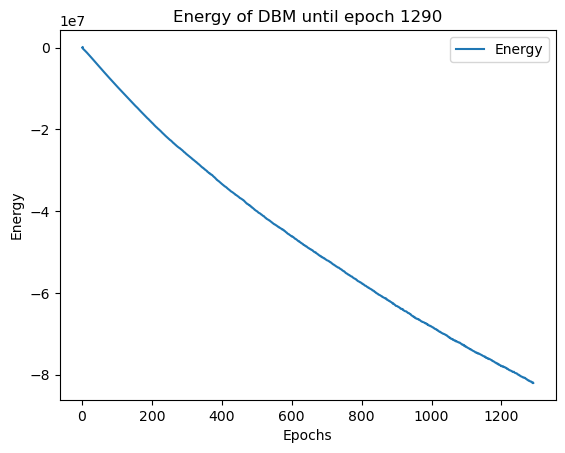

Starting...:  65%|█████████████▌       | 1292/2000 [16:26:29<8:59:08, 45.69s/it]

Time taken for DBM epoch 1291 is 45.583245277404785


Starting...:  65%|█████████████▌       | 1293/2000 [16:27:15<8:57:50, 45.64s/it]

Time taken for DBM epoch 1292 is 45.538729667663574


Starting...:  65%|█████████████▌       | 1294/2000 [16:28:00<8:57:09, 45.65s/it]

Time taken for DBM epoch 1293 is 45.66634821891785


Starting...:  65%|█████████████▌       | 1295/2000 [16:28:46<8:55:14, 45.55s/it]

Time taken for DBM epoch 1294 is 45.32116341590881


Starting...:  65%|█████████████▌       | 1296/2000 [16:29:31<8:53:22, 45.46s/it]

Time taken for DBM epoch 1295 is 45.23596978187561


Starting...:  65%|█████████████▌       | 1297/2000 [16:30:16<8:51:21, 45.35s/it]

Time taken for DBM epoch 1296 is 45.10142230987549


Starting...:  65%|█████████████▋       | 1298/2000 [16:31:02<8:51:01, 45.39s/it]

Time taken for DBM epoch 1297 is 45.46786618232727


Starting...:  65%|█████████████▋       | 1299/2000 [16:31:47<8:49:48, 45.35s/it]

Time taken for DBM epoch 1298 is 45.25419545173645


Starting...:  65%|█████████████▋       | 1300/2000 [16:32:32<8:48:27, 45.30s/it]

Time taken for DBM epoch 1299 is 45.18008852005005


Starting...:  65%|█████████████▋       | 1300/2000 [16:33:17<8:48:27, 45.30s/it]

Time taken for DBM epoch 1300 is 45.309734582901


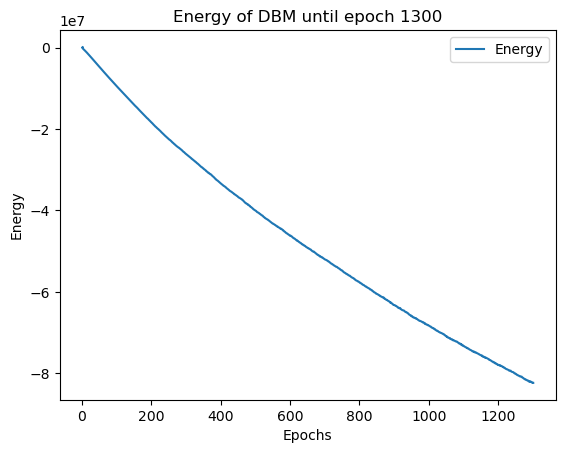

Starting...:  65%|█████████████▋       | 1302/2000 [16:34:03<8:47:14, 45.32s/it]

Time taken for DBM epoch 1301 is 45.269144773483276


Starting...:  65%|█████████████▋       | 1303/2000 [16:34:48<8:47:06, 45.37s/it]

Time taken for DBM epoch 1302 is 45.49810194969177


Starting...:  65%|█████████████▋       | 1304/2000 [16:35:34<8:46:27, 45.38s/it]

Time taken for DBM epoch 1303 is 45.4077787399292


Starting...:  65%|█████████████▋       | 1305/2000 [16:36:19<8:46:07, 45.42s/it]

Time taken for DBM epoch 1304 is 45.506733655929565


Starting...:  65%|█████████████▋       | 1306/2000 [16:37:05<8:46:12, 45.49s/it]

Time taken for DBM epoch 1305 is 45.6588180065155


Starting...:  65%|█████████████▋       | 1307/2000 [16:37:51<8:46:24, 45.58s/it]

Time taken for DBM epoch 1306 is 45.76965570449829


Starting...:  65%|█████████████▋       | 1308/2000 [16:38:36<8:46:43, 45.67s/it]

Time taken for DBM epoch 1307 is 45.88912558555603


Starting...:  65%|█████████████▋       | 1309/2000 [16:39:22<8:46:52, 45.75s/it]

Time taken for DBM epoch 1308 is 45.932554483413696


Starting...:  66%|█████████████▊       | 1310/2000 [16:40:08<8:46:47, 45.81s/it]

Time taken for DBM epoch 1309 is 45.94278001785278


Starting...:  66%|█████████████▊       | 1310/2000 [16:40:54<8:46:47, 45.81s/it]

Time taken for DBM epoch 1310 is 45.70098662376404


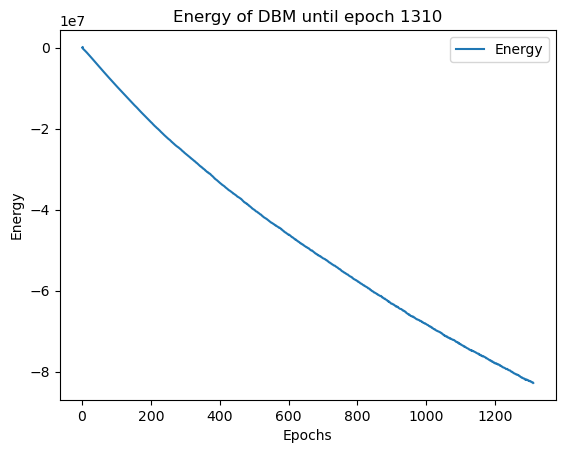

Starting...:  66%|█████████████▊       | 1312/2000 [16:41:40<8:45:41, 45.85s/it]

Time taken for DBM epoch 1311 is 45.93490195274353


Starting...:  66%|█████████████▊       | 1313/2000 [16:42:26<8:45:10, 45.87s/it]

Time taken for DBM epoch 1312 is 45.91466999053955


Starting...:  66%|█████████████▊       | 1314/2000 [16:43:12<8:44:52, 45.91s/it]

Time taken for DBM epoch 1313 is 46.001230001449585


Starting...:  66%|█████████████▊       | 1315/2000 [16:43:58<8:44:20, 45.93s/it]

Time taken for DBM epoch 1314 is 45.97403931617737


Starting...:  66%|█████████████▊       | 1316/2000 [16:44:44<8:43:23, 45.91s/it]

Time taken for DBM epoch 1315 is 45.87223148345947


Starting...:  66%|█████████████▊       | 1317/2000 [16:45:30<8:42:21, 45.89s/it]

Time taken for DBM epoch 1316 is 45.83402991294861


Starting...:  66%|█████████████▊       | 1318/2000 [16:46:16<8:41:37, 45.89s/it]

Time taken for DBM epoch 1317 is 45.89450669288635


Starting...:  66%|█████████████▊       | 1319/2000 [16:47:01<8:40:59, 45.90s/it]

Time taken for DBM epoch 1318 is 45.93292164802551


Starting...:  66%|█████████████▊       | 1320/2000 [16:47:47<8:39:59, 45.88s/it]

Time taken for DBM epoch 1319 is 45.831517696380615


Starting...:  66%|█████████████▊       | 1320/2000 [16:48:33<8:39:59, 45.88s/it]

Time taken for DBM epoch 1320 is 45.71868634223938


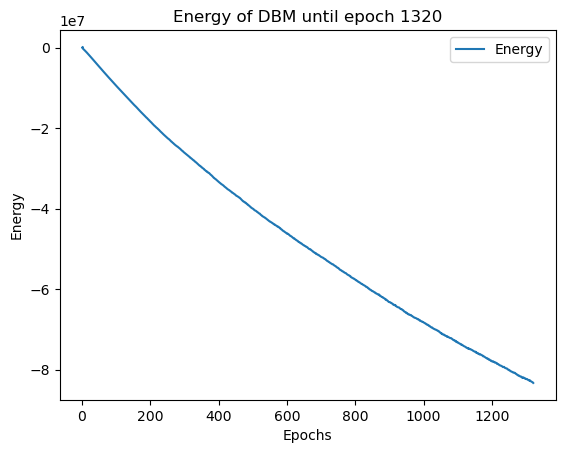

Starting...:  66%|█████████████▉       | 1322/2000 [16:49:19<8:38:04, 45.85s/it]

Time taken for DBM epoch 1321 is 45.803319454193115


Starting...:  66%|█████████████▉       | 1323/2000 [16:50:05<8:37:18, 45.85s/it]

Time taken for DBM epoch 1322 is 45.846961975097656


Starting...:  66%|█████████████▉       | 1324/2000 [16:50:50<8:35:58, 45.80s/it]

Time taken for DBM epoch 1323 is 45.68058967590332


Starting...:  66%|█████████████▉       | 1325/2000 [16:51:36<8:35:13, 45.80s/it]

Time taken for DBM epoch 1324 is 45.798420906066895


Starting...:  66%|█████████████▉       | 1326/2000 [16:52:22<8:34:38, 45.81s/it]

Time taken for DBM epoch 1325 is 45.85318350791931


Starting...:  66%|█████████████▉       | 1327/2000 [16:53:08<8:34:22, 45.86s/it]

Time taken for DBM epoch 1326 is 45.96008276939392


Starting...:  66%|█████████████▉       | 1328/2000 [16:53:54<8:34:04, 45.90s/it]

Time taken for DBM epoch 1327 is 45.995070695877075


Starting...:  66%|█████████████▉       | 1329/2000 [16:54:40<8:33:46, 45.94s/it]

Time taken for DBM epoch 1328 is 46.039719343185425


Starting...:  66%|█████████████▉       | 1330/2000 [16:55:26<8:33:07, 45.95s/it]

Time taken for DBM epoch 1329 is 45.975438594818115


Starting...:  66%|█████████████▉       | 1330/2000 [16:56:12<8:33:07, 45.95s/it]

Time taken for DBM epoch 1330 is 46.12256169319153


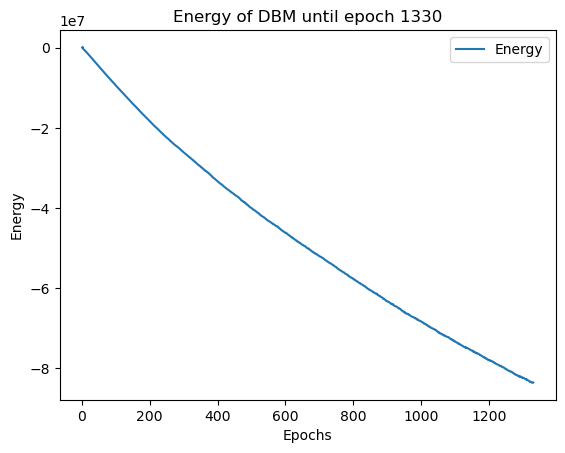

Starting...:  67%|█████████████▉       | 1332/2000 [16:56:58<8:32:30, 46.03s/it]

Time taken for DBM epoch 1331 is 46.02812361717224


Starting...:  67%|█████████████▉       | 1333/2000 [16:57:44<8:32:06, 46.07s/it]

Time taken for DBM epoch 1332 is 46.14384984970093


Starting...:  67%|██████████████       | 1334/2000 [16:58:31<8:31:20, 46.07s/it]

Time taken for DBM epoch 1333 is 46.063589334487915


Starting...:  67%|██████████████       | 1335/2000 [16:59:16<8:30:05, 46.02s/it]

Time taken for DBM epoch 1334 is 45.92396426200867


Starting...:  67%|██████████████       | 1336/2000 [17:00:02<8:29:00, 46.00s/it]

Time taken for DBM epoch 1335 is 45.92790365219116


Starting...:  67%|██████████████       | 1337/2000 [17:00:48<8:28:09, 45.99s/it]

Time taken for DBM epoch 1336 is 45.970587730407715


Starting...:  67%|██████████████       | 1338/2000 [17:01:34<8:27:31, 46.00s/it]

Time taken for DBM epoch 1337 is 46.026999950408936


Starting...:  67%|██████████████       | 1339/2000 [17:02:20<8:26:36, 45.99s/it]

Time taken for DBM epoch 1338 is 45.95102643966675


Starting...:  67%|██████████████       | 1340/2000 [17:03:06<8:25:47, 45.98s/it]

Time taken for DBM epoch 1339 is 45.97239398956299


Starting...:  67%|██████████████       | 1340/2000 [17:03:52<8:25:47, 45.98s/it]

Time taken for DBM epoch 1340 is 45.86155557632446


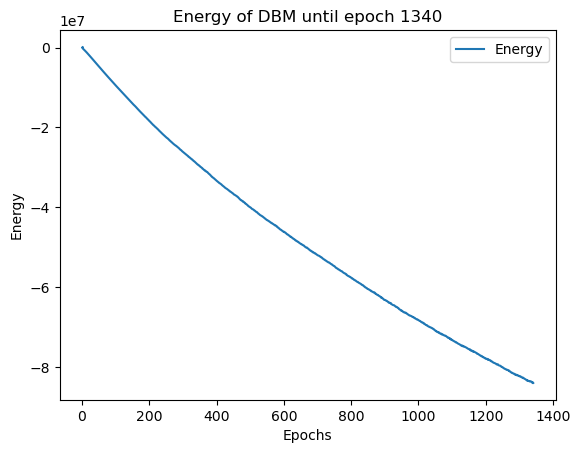

Starting...:  67%|██████████████       | 1342/2000 [17:04:38<8:24:03, 45.96s/it]

Time taken for DBM epoch 1341 is 45.92473864555359


Starting...:  67%|██████████████       | 1343/2000 [17:05:24<8:22:17, 45.87s/it]

Time taken for DBM epoch 1342 is 45.659504890441895


Starting...:  67%|██████████████       | 1344/2000 [17:06:10<8:21:37, 45.88s/it]

Time taken for DBM epoch 1343 is 45.89989686012268


Starting...:  67%|██████████████       | 1345/2000 [17:06:56<8:21:11, 45.91s/it]

Time taken for DBM epoch 1344 is 45.98028540611267


Starting...:  67%|██████████████▏      | 1346/2000 [17:07:42<8:20:54, 45.95s/it]

Time taken for DBM epoch 1345 is 46.05498957633972


Starting...:  67%|██████████████▏      | 1347/2000 [17:08:28<8:20:29, 45.99s/it]

Time taken for DBM epoch 1346 is 46.06118845939636


Starting...:  67%|██████████████▏      | 1348/2000 [17:09:14<8:20:14, 46.04s/it]

Time taken for DBM epoch 1347 is 46.148194551467896


Starting...:  67%|██████████████▏      | 1349/2000 [17:10:00<8:18:59, 45.99s/it]

Time taken for DBM epoch 1348 is 45.88439631462097


Starting...:  68%|██████████████▏      | 1350/2000 [17:10:46<8:17:16, 45.90s/it]

Time taken for DBM epoch 1349 is 45.698832750320435


Starting...:  68%|██████████████▏      | 1350/2000 [17:11:31<8:17:16, 45.90s/it]

Time taken for DBM epoch 1350 is 45.79492974281311


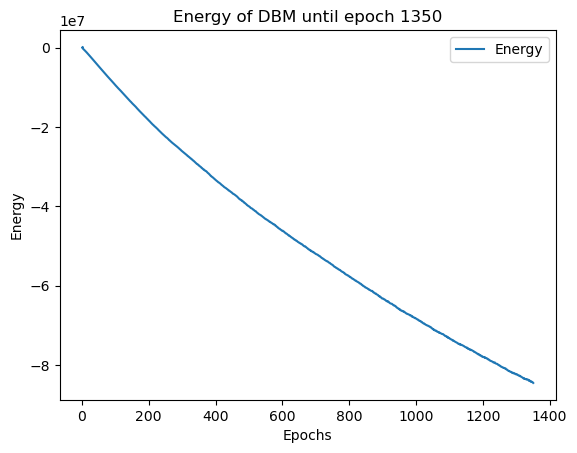

Starting...:  68%|██████████████▏      | 1352/2000 [17:12:17<8:16:00, 45.93s/it]

Time taken for DBM epoch 1351 is 45.97742462158203


Starting...:  68%|██████████████▏      | 1353/2000 [17:13:03<8:14:57, 45.90s/it]

Time taken for DBM epoch 1352 is 45.84094786643982


Starting...:  68%|██████████████▏      | 1354/2000 [17:13:49<8:13:16, 45.82s/it]

Time taken for DBM epoch 1353 is 45.61591815948486


Starting...:  68%|██████████████▏      | 1355/2000 [17:14:35<8:12:53, 45.85s/it]

Time taken for DBM epoch 1354 is 45.93188738822937


Starting...:  68%|██████████████▏      | 1356/2000 [17:15:21<8:12:46, 45.91s/it]

Time taken for DBM epoch 1355 is 46.050803899765015


Starting...:  68%|██████████████▏      | 1357/2000 [17:16:07<8:12:14, 45.93s/it]

Time taken for DBM epoch 1356 is 45.980833768844604


Starting...:  68%|██████████████▎      | 1358/2000 [17:16:53<8:11:52, 45.97s/it]

Time taken for DBM epoch 1357 is 46.05825853347778


Starting...:  68%|██████████████▎      | 1359/2000 [17:17:39<8:11:31, 46.01s/it]

Time taken for DBM epoch 1358 is 46.09627556800842


Starting...:  68%|██████████████▎      | 1360/2000 [17:18:25<8:11:07, 46.04s/it]

Time taken for DBM epoch 1359 is 46.12623953819275


Starting...:  68%|██████████████▎      | 1360/2000 [17:19:11<8:11:07, 46.04s/it]

Time taken for DBM epoch 1360 is 46.141621828079224


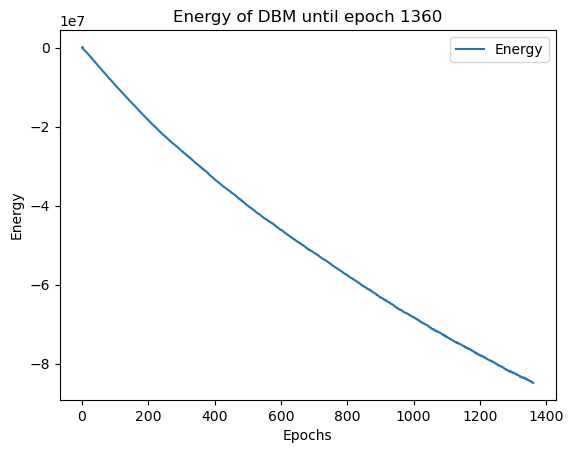

Starting...:  68%|██████████████▎      | 1362/2000 [17:19:58<8:10:27, 46.13s/it]

Time taken for DBM epoch 1361 is 46.16992425918579


Starting...:  68%|██████████████▎      | 1363/2000 [17:20:44<8:09:35, 46.11s/it]

Time taken for DBM epoch 1362 is 46.08936619758606


Starting...:  68%|██████████████▎      | 1364/2000 [17:21:30<8:08:06, 46.05s/it]

Time taken for DBM epoch 1363 is 45.89381146430969


Starting...:  68%|██████████████▎      | 1365/2000 [17:22:16<8:07:17, 46.04s/it]

Time taken for DBM epoch 1364 is 46.03224849700928


Starting...:  68%|██████████████▎      | 1366/2000 [17:23:02<8:06:30, 46.04s/it]

Time taken for DBM epoch 1365 is 46.03863596916199


Starting...:  68%|██████████████▎      | 1367/2000 [17:23:48<8:06:02, 46.07s/it]

Time taken for DBM epoch 1366 is 46.134538650512695


Starting...:  68%|██████████████▎      | 1368/2000 [17:24:34<8:04:50, 46.03s/it]

Time taken for DBM epoch 1367 is 45.93233346939087


Starting...:  68%|██████████████▎      | 1369/2000 [17:25:20<8:04:04, 46.03s/it]

Time taken for DBM epoch 1368 is 46.03164792060852


Starting...:  68%|██████████████▍      | 1370/2000 [17:26:06<8:03:26, 46.04s/it]

Time taken for DBM epoch 1369 is 46.07074737548828


Starting...:  68%|██████████████▍      | 1370/2000 [17:26:52<8:03:26, 46.04s/it]

Time taken for DBM epoch 1370 is 46.09395098686218


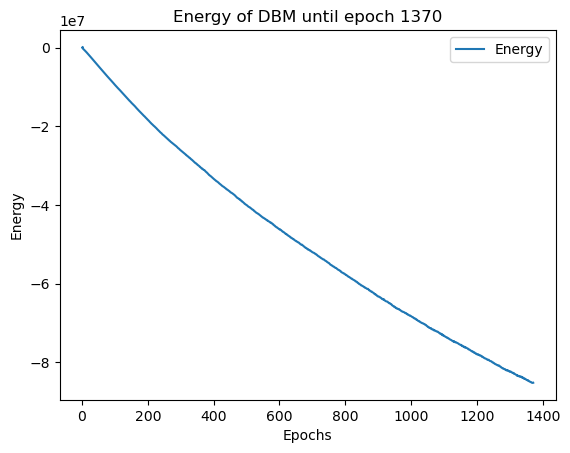

Starting...:  69%|██████████████▍      | 1372/2000 [17:27:38<8:02:19, 46.08s/it]

Time taken for DBM epoch 1371 is 46.06018877029419


Starting...:  69%|██████████████▍      | 1373/2000 [17:28:24<8:01:40, 46.09s/it]

Time taken for DBM epoch 1372 is 46.11932063102722


Starting...:  69%|██████████████▍      | 1374/2000 [17:29:10<8:00:47, 46.08s/it]

Time taken for DBM epoch 1373 is 46.05790829658508


Starting...:  69%|██████████████▍      | 1375/2000 [17:29:56<8:00:21, 46.11s/it]

Time taken for DBM epoch 1374 is 46.18680500984192


Starting...:  69%|██████████████▍      | 1376/2000 [17:30:43<7:59:55, 46.15s/it]

Time taken for DBM epoch 1375 is 46.22137951850891


Starting...:  69%|██████████████▍      | 1377/2000 [17:31:29<7:59:18, 46.16s/it]

Time taken for DBM epoch 1376 is 46.1965651512146


Starting...:  69%|██████████████▍      | 1378/2000 [17:32:15<7:58:41, 46.18s/it]

Time taken for DBM epoch 1377 is 46.210113286972046


Starting...:  69%|██████████████▍      | 1379/2000 [17:33:01<7:57:34, 46.14s/it]

Time taken for DBM epoch 1378 is 46.06042194366455


Starting...:  69%|██████████████▍      | 1380/2000 [17:33:47<7:56:59, 46.16s/it]

Time taken for DBM epoch 1379 is 46.20599150657654


Starting...:  69%|██████████████▍      | 1380/2000 [17:34:33<7:56:59, 46.16s/it]

Time taken for DBM epoch 1380 is 46.13538908958435


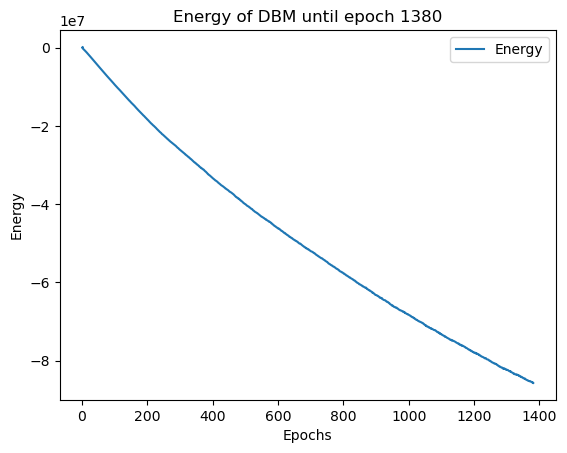

Starting...:  69%|██████████████▌      | 1382/2000 [17:35:20<7:55:38, 46.18s/it]

Time taken for DBM epoch 1381 is 46.16178798675537


Starting...:  69%|██████████████▌      | 1383/2000 [17:36:06<7:54:43, 46.16s/it]

Time taken for DBM epoch 1382 is 46.12970304489136


Starting...:  69%|██████████████▌      | 1384/2000 [17:36:52<7:53:43, 46.14s/it]

Time taken for DBM epoch 1383 is 46.09146690368652


Starting...:  69%|██████████████▌      | 1385/2000 [17:37:38<7:53:04, 46.15s/it]

Time taken for DBM epoch 1384 is 46.1783721446991


Starting...:  69%|██████████████▌      | 1386/2000 [17:38:24<7:52:05, 46.13s/it]

Time taken for DBM epoch 1385 is 46.08109712600708


Starting...:  69%|██████████████▌      | 1387/2000 [17:39:11<7:51:43, 46.17s/it]

Time taken for DBM epoch 1386 is 46.26511478424072


Starting...:  69%|██████████████▌      | 1388/2000 [17:39:57<7:50:55, 46.17s/it]

Time taken for DBM epoch 1387 is 46.16318130493164


Starting...:  69%|██████████████▌      | 1389/2000 [17:40:43<7:50:29, 46.20s/it]

Time taken for DBM epoch 1388 is 46.279966592788696


Starting...:  70%|██████████████▌      | 1390/2000 [17:41:29<7:49:54, 46.22s/it]

Time taken for DBM epoch 1389 is 46.26105999946594


Starting...:  70%|██████████████▌      | 1390/2000 [17:42:15<7:49:54, 46.22s/it]

Time taken for DBM epoch 1390 is 46.15419936180115


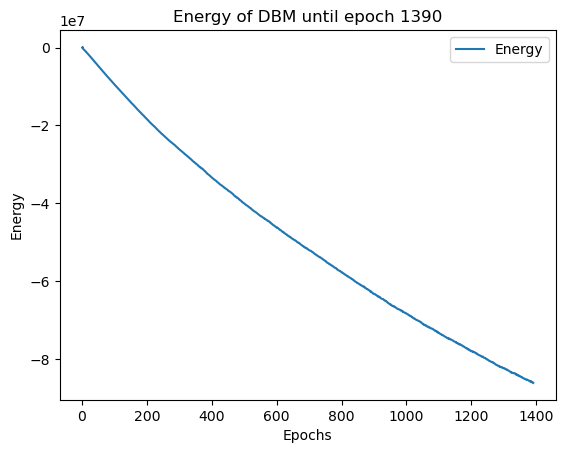

Starting...:  70%|██████████████▌      | 1392/2000 [17:43:02<7:48:22, 46.22s/it]

Time taken for DBM epoch 1391 is 46.19478154182434


Starting...:  70%|██████████████▋      | 1393/2000 [17:43:48<7:47:23, 46.20s/it]

Time taken for DBM epoch 1392 is 46.14956307411194


Starting...:  70%|██████████████▋      | 1394/2000 [17:44:34<7:46:33, 46.19s/it]

Time taken for DBM epoch 1393 is 46.17685794830322


Starting...:  70%|██████████████▋      | 1395/2000 [17:45:20<7:45:31, 46.17s/it]

Time taken for DBM epoch 1394 is 46.10786986351013


Starting...:  70%|██████████████▋      | 1396/2000 [17:46:06<7:44:48, 46.17s/it]

Time taken for DBM epoch 1395 is 46.18261504173279


Starting...:  70%|██████████████▋      | 1397/2000 [17:46:52<7:43:48, 46.15s/it]

Time taken for DBM epoch 1396 is 46.0970401763916


Starting...:  70%|██████████████▋      | 1398/2000 [17:47:39<7:43:21, 46.18s/it]

Time taken for DBM epoch 1397 is 46.25754523277283


Starting...:  70%|██████████████▋      | 1399/2000 [17:48:25<7:42:33, 46.18s/it]

Time taken for DBM epoch 1398 is 46.17258048057556


Starting...:  70%|██████████████▋      | 1400/2000 [17:49:11<7:41:58, 46.20s/it]

Time taken for DBM epoch 1399 is 46.238263845443726


Starting...:  70%|██████████████▋      | 1400/2000 [17:49:57<7:41:58, 46.20s/it]

Time taken for DBM epoch 1400 is 46.25899648666382


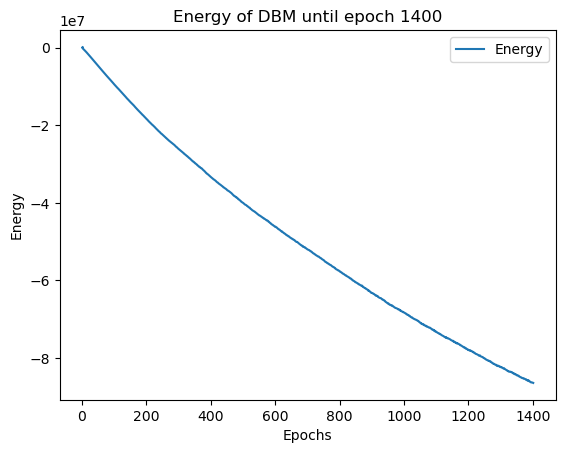

Starting...:  70%|██████████████▋      | 1402/2000 [17:50:44<7:40:43, 46.23s/it]

Time taken for DBM epoch 1401 is 46.174649238586426


Starting...:  70%|██████████████▋      | 1403/2000 [17:51:30<7:40:08, 46.24s/it]

Time taken for DBM epoch 1402 is 46.284483194351196


Starting...:  70%|██████████████▋      | 1404/2000 [17:52:16<7:39:24, 46.25s/it]

Time taken for DBM epoch 1403 is 46.258896589279175


Starting...:  70%|██████████████▊      | 1405/2000 [17:53:02<7:38:49, 46.27s/it]

Time taken for DBM epoch 1404 is 46.31265711784363


Starting...:  70%|██████████████▊      | 1406/2000 [17:53:49<7:37:54, 46.25s/it]

Time taken for DBM epoch 1405 is 46.219292879104614


Starting...:  70%|██████████████▊      | 1407/2000 [17:54:35<7:36:51, 46.22s/it]

Time taken for DBM epoch 1406 is 46.156020641326904


Starting...:  70%|██████████████▊      | 1408/2000 [17:55:21<7:35:51, 46.20s/it]

Time taken for DBM epoch 1407 is 46.14590859413147


Starting...:  70%|██████████████▊      | 1409/2000 [17:56:07<7:34:58, 46.19s/it]

Time taken for DBM epoch 1408 is 46.16699004173279


Starting...:  70%|██████████████▊      | 1410/2000 [17:56:53<7:33:59, 46.17s/it]

Time taken for DBM epoch 1409 is 46.1131010055542


Starting...:  70%|██████████████▊      | 1410/2000 [17:57:39<7:33:59, 46.17s/it]

Time taken for DBM epoch 1410 is 46.1833815574646


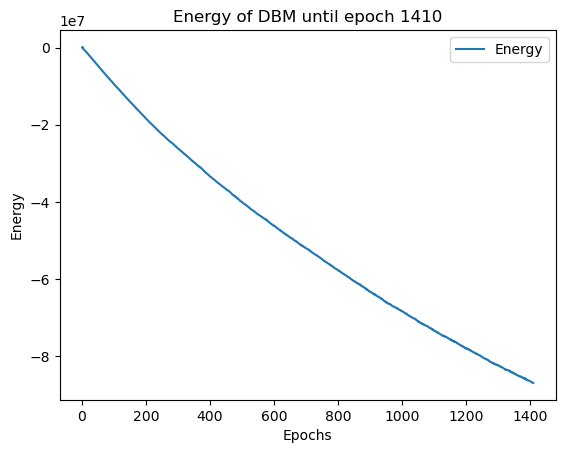

Starting...:  71%|██████████████▊      | 1412/2000 [17:58:26<7:32:50, 46.21s/it]

Time taken for DBM epoch 1411 is 46.212756395339966


Starting...:  71%|██████████████▊      | 1413/2000 [17:59:12<7:32:10, 46.22s/it]

Time taken for DBM epoch 1412 is 46.24254560470581


Starting...:  71%|██████████████▊      | 1414/2000 [17:59:58<7:31:31, 46.23s/it]

Time taken for DBM epoch 1413 is 46.2626953125


Starting...:  71%|██████████████▊      | 1415/2000 [18:00:45<7:30:48, 46.24s/it]

Time taken for DBM epoch 1414 is 46.24647760391235


Starting...:  71%|██████████████▊      | 1416/2000 [18:01:31<7:30:09, 46.25s/it]

Time taken for DBM epoch 1415 is 46.27826523780823


Starting...:  71%|██████████████▉      | 1417/2000 [18:02:17<7:29:30, 46.26s/it]

Time taken for DBM epoch 1416 is 46.28743863105774


Starting...:  71%|██████████████▉      | 1418/2000 [18:03:03<7:28:46, 46.27s/it]

Time taken for DBM epoch 1417 is 46.275880575180054


Starting...:  71%|██████████████▉      | 1419/2000 [18:03:50<7:27:41, 46.23s/it]

Time taken for DBM epoch 1418 is 46.15885901451111


Starting...:  71%|██████████████▉      | 1420/2000 [18:04:36<7:27:01, 46.24s/it]

Time taken for DBM epoch 1419 is 46.266870975494385


Starting...:  71%|██████████████▉      | 1420/2000 [18:05:22<7:27:01, 46.24s/it]

Time taken for DBM epoch 1420 is 46.25410032272339


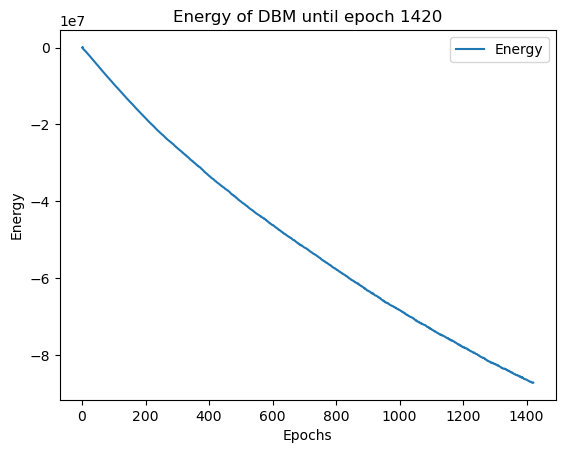

Starting...:  71%|██████████████▉      | 1422/2000 [18:06:08<7:25:45, 46.27s/it]

Time taken for DBM epoch 1421 is 46.25510334968567


Starting...:  71%|██████████████▉      | 1423/2000 [18:06:55<7:25:01, 46.28s/it]

Time taken for DBM epoch 1422 is 46.28348350524902


Starting...:  71%|██████████████▉      | 1424/2000 [18:07:41<7:24:27, 46.30s/it]

Time taken for DBM epoch 1423 is 46.34672164916992


Starting...:  71%|██████████████▉      | 1425/2000 [18:08:27<7:23:30, 46.28s/it]

Time taken for DBM epoch 1424 is 46.23775029182434


Starting...:  71%|██████████████▉      | 1426/2000 [18:09:14<7:22:45, 46.28s/it]

Time taken for DBM epoch 1425 is 46.28765511512756


Starting...:  71%|██████████████▉      | 1427/2000 [18:10:00<7:21:55, 46.27s/it]

Time taken for DBM epoch 1426 is 46.25558662414551


Starting...:  71%|██████████████▉      | 1428/2000 [18:10:46<7:21:18, 46.29s/it]

Time taken for DBM epoch 1427 is 46.32727670669556


Starting...:  71%|███████████████      | 1429/2000 [18:11:33<7:20:51, 46.32s/it]

Time taken for DBM epoch 1428 is 46.401782274246216


Starting...:  72%|███████████████      | 1430/2000 [18:12:19<7:20:03, 46.32s/it]

Time taken for DBM epoch 1429 is 46.3164598941803


Starting...:  72%|███████████████      | 1430/2000 [18:13:05<7:20:03, 46.32s/it]

Time taken for DBM epoch 1430 is 46.36978244781494


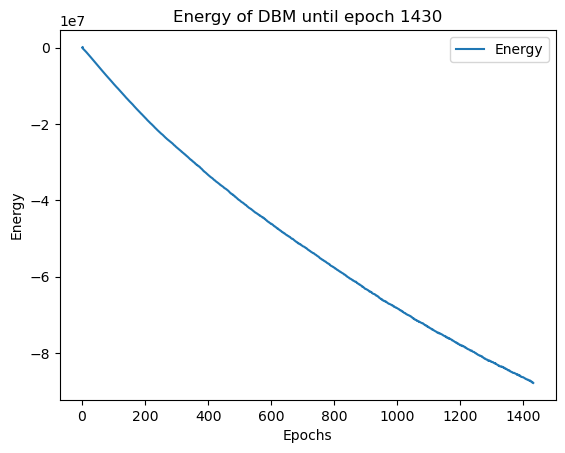

Starting...:  72%|███████████████      | 1432/2000 [18:13:52<7:18:36, 46.33s/it]

Time taken for DBM epoch 1431 is 46.24484062194824


Starting...:  72%|███████████████      | 1433/2000 [18:14:38<7:17:41, 46.32s/it]

Time taken for DBM epoch 1432 is 46.27752327919006


Starting...:  72%|███████████████      | 1434/2000 [18:15:24<7:16:26, 46.27s/it]

Time taken for DBM epoch 1433 is 46.146151065826416


Starting...:  72%|███████████████      | 1435/2000 [18:16:10<7:15:47, 46.28s/it]

Time taken for DBM epoch 1434 is 46.30835771560669


Starting...:  72%|███████████████      | 1436/2000 [18:16:57<7:14:59, 46.28s/it]

Time taken for DBM epoch 1435 is 46.27072787284851


Starting...:  72%|███████████████      | 1437/2000 [18:17:43<7:14:00, 46.25s/it]

Time taken for DBM epoch 1436 is 46.197052001953125


Starting...:  72%|███████████████      | 1438/2000 [18:18:29<7:13:20, 46.26s/it]

Time taken for DBM epoch 1437 is 46.29070472717285


Starting...:  72%|███████████████      | 1439/2000 [18:19:15<7:12:33, 46.26s/it]

Time taken for DBM epoch 1438 is 46.257508754730225


Starting...:  72%|███████████████      | 1440/2000 [18:20:02<7:11:50, 46.27s/it]

Time taken for DBM epoch 1439 is 46.2807731628418


Starting...:  72%|███████████████      | 1440/2000 [18:20:48<7:11:50, 46.27s/it]

Time taken for DBM epoch 1440 is 46.26685976982117


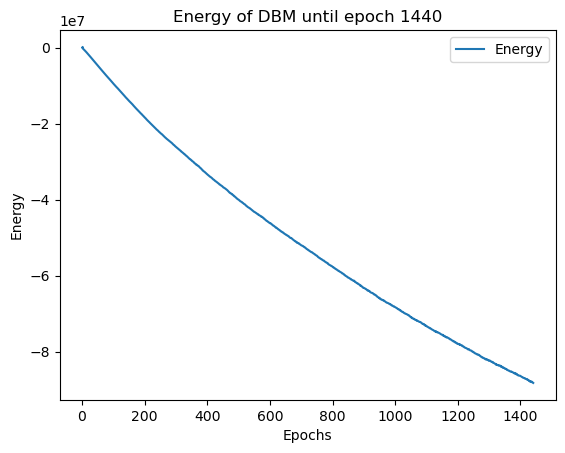

Starting...:  72%|███████████████▏     | 1442/2000 [18:21:34<7:10:35, 46.30s/it]

Time taken for DBM epoch 1441 is 46.29807090759277


Starting...:  72%|███████████████▏     | 1443/2000 [18:22:21<7:09:44, 46.29s/it]

Time taken for DBM epoch 1442 is 46.272528409957886


Starting...:  72%|███████████████▏     | 1444/2000 [18:23:07<7:08:58, 46.29s/it]

Time taken for DBM epoch 1443 is 46.29365611076355


Starting...:  72%|███████████████▏     | 1445/2000 [18:23:53<7:07:31, 46.22s/it]

Time taken for DBM epoch 1444 is 46.04703116416931


Starting...:  72%|███████████████▏     | 1446/2000 [18:24:39<7:06:16, 46.17s/it]

Time taken for DBM epoch 1445 is 46.04421424865723


Starting...:  72%|███████████████▏     | 1447/2000 [18:25:25<7:05:33, 46.17s/it]

Time taken for DBM epoch 1446 is 46.18746328353882


Starting...:  72%|███████████████▏     | 1448/2000 [18:26:11<7:04:15, 46.11s/it]

Time taken for DBM epoch 1447 is 45.97669005393982


Starting...:  72%|███████████████▏     | 1449/2000 [18:26:57<7:03:59, 46.17s/it]

Time taken for DBM epoch 1448 is 46.298834562301636


Starting...:  72%|███████████████▏     | 1450/2000 [18:27:43<7:02:52, 46.13s/it]

Time taken for DBM epoch 1449 is 46.03943347930908


Starting...:  72%|███████████████▏     | 1450/2000 [18:28:29<7:02:52, 46.13s/it]

Time taken for DBM epoch 1450 is 45.88476848602295


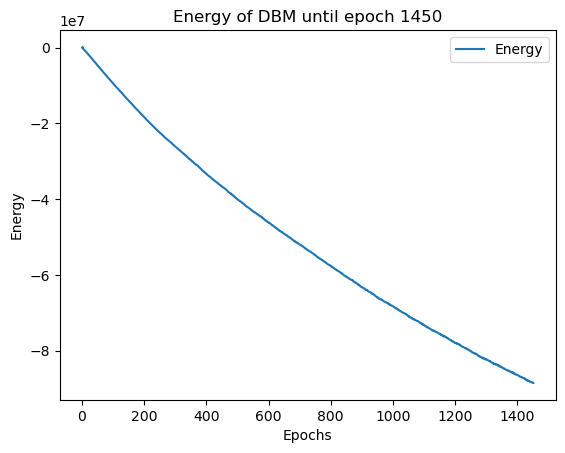

Starting...:  73%|███████████████▏     | 1452/2000 [18:29:15<7:00:34, 46.05s/it]

Time taken for DBM epoch 1451 is 45.950218200683594


Starting...:  73%|███████████████▎     | 1453/2000 [18:30:02<7:00:05, 46.08s/it]

Time taken for DBM epoch 1452 is 46.15266013145447


Starting...:  73%|███████████████▎     | 1454/2000 [18:30:48<6:59:33, 46.11s/it]

Time taken for DBM epoch 1453 is 46.16762924194336


Starting...:  73%|███████████████▎     | 1455/2000 [18:31:34<6:59:08, 46.14s/it]

Time taken for DBM epoch 1454 is 46.22878384590149


Starting...:  73%|███████████████▎     | 1456/2000 [18:32:20<6:58:42, 46.18s/it]

Time taken for DBM epoch 1455 is 46.27179312705994


Starting...:  73%|███████████████▎     | 1457/2000 [18:33:07<6:58:18, 46.22s/it]

Time taken for DBM epoch 1456 is 46.314372301101685


Starting...:  73%|███████████████▎     | 1458/2000 [18:33:53<6:57:59, 46.27s/it]

Time taken for DBM epoch 1457 is 46.38985896110535


Starting...:  73%|███████████████▎     | 1459/2000 [18:34:39<6:57:13, 46.27s/it]

Time taken for DBM epoch 1458 is 46.27075481414795


Starting...:  73%|███████████████▎     | 1460/2000 [18:35:26<6:56:48, 46.31s/it]

Time taken for DBM epoch 1459 is 46.406864643096924


Starting...:  73%|███████████████▎     | 1460/2000 [18:36:12<6:56:48, 46.31s/it]

Time taken for DBM epoch 1460 is 46.35721039772034


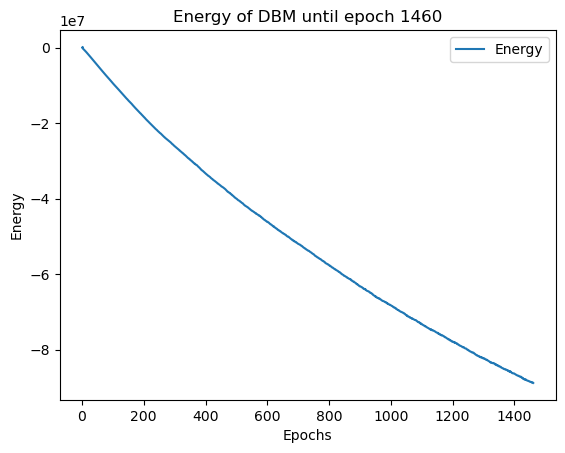

Starting...:  73%|███████████████▎     | 1462/2000 [18:36:58<6:55:47, 46.37s/it]

Time taken for DBM epoch 1461 is 46.40155911445618


Starting...:  73%|███████████████▎     | 1463/2000 [18:37:45<6:54:51, 46.35s/it]

Time taken for DBM epoch 1462 is 46.31048941612244


Starting...:  73%|███████████████▎     | 1464/2000 [18:38:31<6:54:04, 46.35s/it]

Time taken for DBM epoch 1463 is 46.35092616081238


Starting...:  73%|███████████████▍     | 1465/2000 [18:39:17<6:52:52, 46.30s/it]

Time taken for DBM epoch 1464 is 46.19178795814514


Starting...:  73%|███████████████▍     | 1466/2000 [18:40:04<6:52:02, 46.30s/it]

Time taken for DBM epoch 1465 is 46.27525591850281


Starting...:  73%|███████████████▍     | 1467/2000 [18:40:50<6:51:18, 46.30s/it]

Time taken for DBM epoch 1466 is 46.31420159339905


Starting...:  73%|███████████████▍     | 1468/2000 [18:41:36<6:50:30, 46.30s/it]

Time taken for DBM epoch 1467 is 46.28978705406189


Starting...:  73%|███████████████▍     | 1469/2000 [18:42:23<6:49:42, 46.29s/it]

Time taken for DBM epoch 1468 is 46.28433656692505


Starting...:  74%|███████████████▍     | 1470/2000 [18:43:09<6:48:50, 46.28s/it]

Time taken for DBM epoch 1469 is 46.26045227050781


Starting...:  74%|███████████████▍     | 1470/2000 [18:43:55<6:48:50, 46.28s/it]

Time taken for DBM epoch 1470 is 46.334656715393066


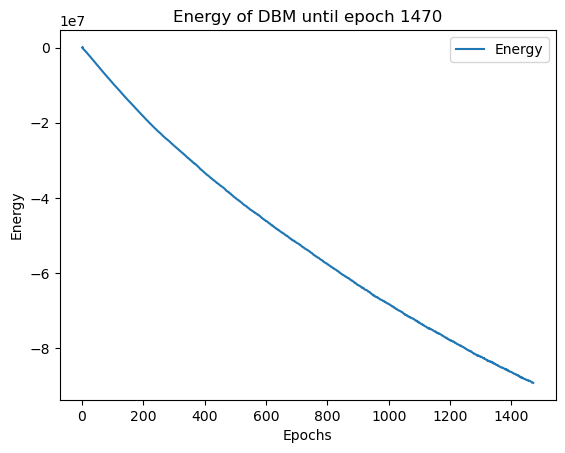

Starting...:  74%|███████████████▍     | 1472/2000 [18:44:42<6:47:44, 46.34s/it]

Time taken for DBM epoch 1471 is 46.328845500946045


Starting...:  74%|███████████████▍     | 1473/2000 [18:45:28<6:47:03, 46.34s/it]

Time taken for DBM epoch 1472 is 46.36590075492859


Starting...:  74%|███████████████▍     | 1474/2000 [18:46:14<6:46:37, 46.38s/it]

Time taken for DBM epoch 1473 is 46.47058939933777


Starting...:  74%|███████████████▍     | 1475/2000 [18:47:01<6:46:18, 46.44s/it]

Time taken for DBM epoch 1474 is 46.55781555175781


Starting...:  74%|███████████████▍     | 1476/2000 [18:47:47<6:45:46, 46.46s/it]

Time taken for DBM epoch 1475 is 46.52533411979675


Starting...:  74%|███████████████▌     | 1477/2000 [18:48:34<6:45:28, 46.52s/it]

Time taken for DBM epoch 1476 is 46.644930839538574


Starting...:  74%|███████████████▌     | 1478/2000 [18:49:20<6:43:35, 46.39s/it]

Time taken for DBM epoch 1477 is 46.0903422832489


Starting...:  74%|███████████████▌     | 1479/2000 [18:50:06<6:41:39, 46.26s/it]

Time taken for DBM epoch 1478 is 45.94284272193909


Starting...:  74%|███████████████▌     | 1480/2000 [18:50:52<6:40:06, 46.17s/it]

Time taken for DBM epoch 1479 is 45.95974254608154


Starting...:  74%|███████████████▌     | 1480/2000 [18:51:39<6:40:06, 46.17s/it]

Time taken for DBM epoch 1480 is 46.3739812374115


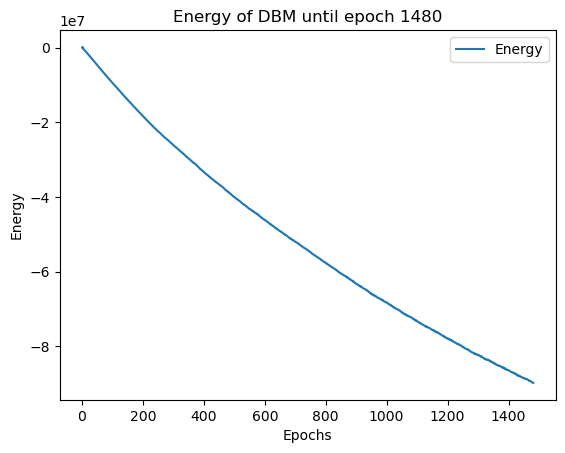

Starting...:  74%|███████████████▌     | 1482/2000 [18:52:25<6:40:03, 46.34s/it]

Time taken for DBM epoch 1481 is 46.5154869556427


Starting...:  74%|███████████████▌     | 1483/2000 [18:53:12<6:40:02, 46.43s/it]

Time taken for DBM epoch 1482 is 46.63309860229492


Starting...:  74%|███████████████▌     | 1484/2000 [18:53:59<6:40:04, 46.52s/it]

Time taken for DBM epoch 1483 is 46.738192319869995


Starting...:  74%|███████████████▌     | 1485/2000 [18:54:45<6:39:33, 46.55s/it]

Time taken for DBM epoch 1484 is 46.618685483932495


Starting...:  74%|███████████████▌     | 1486/2000 [18:55:31<6:37:55, 46.45s/it]

Time taken for DBM epoch 1485 is 46.218029260635376


Starting...:  74%|███████████████▌     | 1487/2000 [18:56:18<6:36:33, 46.38s/it]

Time taken for DBM epoch 1486 is 46.21562123298645


Starting...:  74%|███████████████▌     | 1488/2000 [18:57:04<6:36:13, 46.43s/it]

Time taken for DBM epoch 1487 is 46.556623458862305


Starting...:  74%|███████████████▋     | 1489/2000 [18:57:51<6:36:04, 46.51s/it]

Time taken for DBM epoch 1488 is 46.67485785484314


Starting...:  74%|███████████████▋     | 1490/2000 [18:58:37<6:35:09, 46.49s/it]

Time taken for DBM epoch 1489 is 46.45065903663635


Starting...:  74%|███████████████▋     | 1490/2000 [18:59:23<6:35:09, 46.49s/it]

Time taken for DBM epoch 1490 is 46.104877948760986


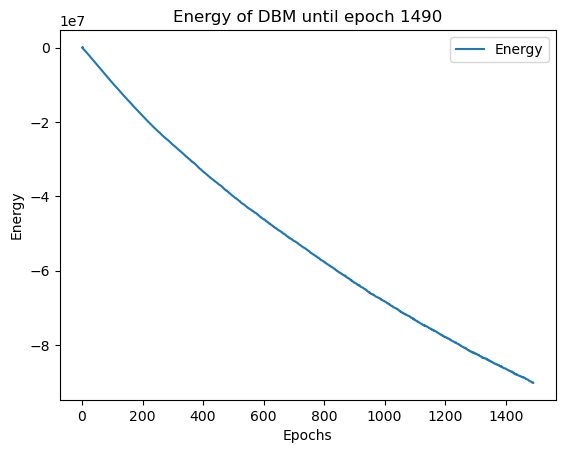

Starting...:  75%|███████████████▋     | 1492/2000 [19:00:10<6:32:54, 46.41s/it]

Time taken for DBM epoch 1491 is 46.404847383499146


Starting...:  75%|███████████████▋     | 1493/2000 [19:00:56<6:32:23, 46.44s/it]

Time taken for DBM epoch 1492 is 46.506288290023804


Starting...:  75%|███████████████▋     | 1494/2000 [19:01:43<6:31:59, 46.48s/it]

Time taken for DBM epoch 1493 is 46.58334541320801


Starting...:  75%|███████████████▋     | 1495/2000 [19:02:29<6:31:21, 46.50s/it]

Time taken for DBM epoch 1494 is 46.539555072784424


Starting...:  75%|███████████████▋     | 1496/2000 [19:03:16<6:30:11, 46.45s/it]

Time taken for DBM epoch 1495 is 46.33751916885376


Starting...:  75%|███████████████▋     | 1497/2000 [19:04:02<6:29:34, 46.47s/it]

Time taken for DBM epoch 1496 is 46.51439332962036


Starting...:  75%|███████████████▋     | 1498/2000 [19:04:49<6:29:27, 46.55s/it]

Time taken for DBM epoch 1497 is 46.73211336135864


Starting...:  75%|███████████████▋     | 1499/2000 [19:05:36<6:28:48, 46.56s/it]

Time taken for DBM epoch 1498 is 46.60097694396973


Starting...:  75%|███████████████▊     | 1500/2000 [19:06:22<6:27:17, 46.47s/it]

Time taken for DBM epoch 1499 is 46.26296544075012


Starting...:  75%|███████████████▊     | 1500/2000 [19:07:08<6:27:17, 46.47s/it]

Time taken for DBM epoch 1500 is 46.48602843284607


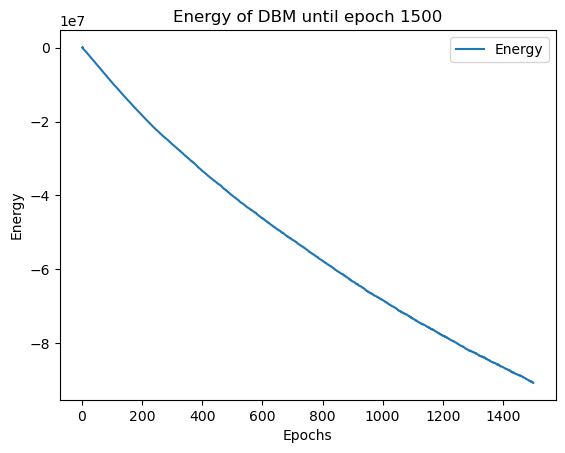

Starting...:  75%|███████████████▊     | 1502/2000 [19:07:55<6:25:21, 46.43s/it]

Time taken for DBM epoch 1501 is 46.23551082611084


Starting...:  75%|███████████████▊     | 1503/2000 [19:08:41<6:23:57, 46.35s/it]

Time taken for DBM epoch 1502 is 46.17297840118408


Starting...:  75%|███████████████▊     | 1504/2000 [19:09:27<6:23:09, 46.35s/it]

Time taken for DBM epoch 1503 is 46.341734409332275


Starting...:  75%|███████████████▊     | 1505/2000 [19:10:14<6:22:57, 46.42s/it]

Time taken for DBM epoch 1504 is 46.57862186431885


Starting...:  75%|███████████████▊     | 1506/2000 [19:11:00<6:22:40, 46.48s/it]

Time taken for DBM epoch 1505 is 46.62049746513367


Starting...:  75%|███████████████▊     | 1507/2000 [19:11:47<6:22:08, 46.51s/it]

Time taken for DBM epoch 1506 is 46.577168226242065


Starting...:  75%|███████████████▊     | 1508/2000 [19:12:34<6:21:44, 46.55s/it]

Time taken for DBM epoch 1507 is 46.656299114227295


Starting...:  75%|███████████████▊     | 1509/2000 [19:13:20<6:21:06, 46.57s/it]

Time taken for DBM epoch 1508 is 46.61184120178223


Starting...:  76%|███████████████▊     | 1510/2000 [19:14:07<6:20:12, 46.56s/it]

Time taken for DBM epoch 1509 is 46.52208948135376


Starting...:  76%|███████████████▊     | 1510/2000 [19:14:53<6:20:12, 46.56s/it]

Time taken for DBM epoch 1510 is 46.52934503555298


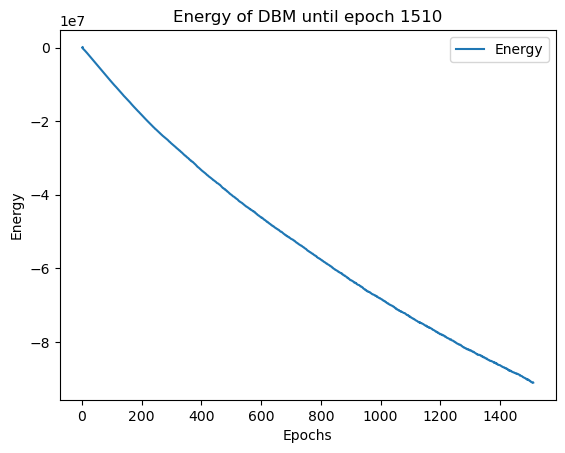

Starting...:  76%|███████████████▉     | 1512/2000 [19:15:40<6:18:44, 46.57s/it]

Time taken for DBM epoch 1511 is 46.53490853309631


Starting...:  76%|███████████████▉     | 1513/2000 [19:16:27<6:17:57, 46.57s/it]

Time taken for DBM epoch 1512 is 46.56370568275452


Starting...:  76%|███████████████▉     | 1514/2000 [19:17:13<6:17:17, 46.58s/it]

Time taken for DBM epoch 1513 is 46.60745191574097


Starting...:  76%|███████████████▉     | 1515/2000 [19:18:00<6:16:33, 46.58s/it]

Time taken for DBM epoch 1514 is 46.59825921058655


Starting...:  76%|███████████████▉     | 1516/2000 [19:18:46<6:15:53, 46.60s/it]

Time taken for DBM epoch 1515 is 46.626402616500854


Starting...:  76%|███████████████▉     | 1517/2000 [19:19:33<6:15:08, 46.60s/it]

Time taken for DBM epoch 1516 is 46.606868505477905


Starting...:  76%|███████████████▉     | 1518/2000 [19:20:20<6:14:24, 46.61s/it]

Time taken for DBM epoch 1517 is 46.623486280441284


Starting...:  76%|███████████████▉     | 1519/2000 [19:21:06<6:13:40, 46.61s/it]

Time taken for DBM epoch 1518 is 46.62248086929321


Starting...:  76%|███████████████▉     | 1520/2000 [19:21:53<6:12:52, 46.61s/it]

Time taken for DBM epoch 1519 is 46.60093092918396


Starting...:  76%|███████████████▉     | 1520/2000 [19:22:39<6:12:52, 46.61s/it]

Time taken for DBM epoch 1520 is 46.555102586746216


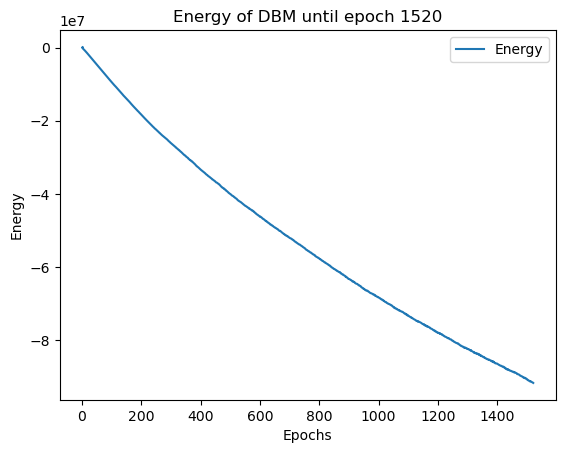

Starting...:  76%|███████████████▉     | 1522/2000 [19:23:26<6:11:13, 46.60s/it]

Time taken for DBM epoch 1521 is 46.52946424484253


Starting...:  76%|███████████████▉     | 1523/2000 [19:24:13<6:10:56, 46.66s/it]

Time taken for DBM epoch 1522 is 46.80495524406433


Starting...:  76%|████████████████     | 1524/2000 [19:25:00<6:10:21, 46.68s/it]

Time taken for DBM epoch 1523 is 46.74066758155823


Starting...:  76%|████████████████     | 1525/2000 [19:25:46<6:09:44, 46.70s/it]

Time taken for DBM epoch 1524 is 46.749354124069214


Starting...:  76%|████████████████     | 1526/2000 [19:26:33<6:09:00, 46.71s/it]

Time taken for DBM epoch 1525 is 46.721027851104736


Starting...:  76%|████████████████     | 1527/2000 [19:27:20<6:08:09, 46.70s/it]

Time taken for DBM epoch 1526 is 46.67856168746948


Starting...:  76%|████████████████     | 1528/2000 [19:28:06<6:07:11, 46.68s/it]

Time taken for DBM epoch 1527 is 46.62047266960144


Starting...:  76%|████████████████     | 1529/2000 [19:28:53<6:05:57, 46.62s/it]

Time taken for DBM epoch 1528 is 46.48571276664734


Starting...:  76%|████████████████     | 1530/2000 [19:29:40<6:05:13, 46.62s/it]

Time taken for DBM epoch 1529 is 46.632588386535645


Starting...:  76%|████████████████     | 1530/2000 [19:30:26<6:05:13, 46.62s/it]

Time taken for DBM epoch 1530 is 46.616713523864746


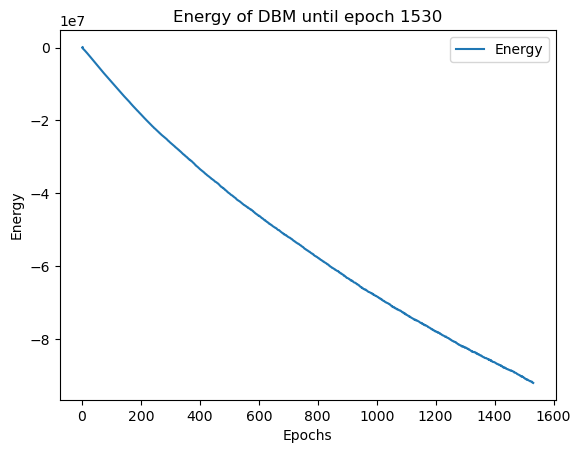

Starting...:  77%|████████████████     | 1532/2000 [19:31:13<6:03:52, 46.65s/it]

Time taken for DBM epoch 1531 is 46.63850665092468


Starting...:  77%|████████████████     | 1533/2000 [19:31:59<6:02:47, 46.61s/it]

Time taken for DBM epoch 1532 is 46.51463317871094


Starting...:  77%|████████████████     | 1534/2000 [19:32:46<6:01:13, 46.51s/it]

Time taken for DBM epoch 1533 is 46.271738052368164


Starting...:  77%|████████████████     | 1535/2000 [19:33:32<5:59:21, 46.37s/it]

Time taken for DBM epoch 1534 is 46.04186797142029


Starting...:  77%|████████████████▏    | 1536/2000 [19:34:18<5:57:33, 46.24s/it]

Time taken for DBM epoch 1535 is 45.925710678100586


Starting...:  77%|████████████████▏    | 1537/2000 [19:35:04<5:56:50, 46.24s/it]

Time taken for DBM epoch 1536 is 46.26074957847595


Starting...:  77%|████████████████▏    | 1538/2000 [19:35:50<5:56:08, 46.25s/it]

Time taken for DBM epoch 1537 is 46.27357292175293


Starting...:  77%|████████████████▏    | 1539/2000 [19:36:37<5:55:42, 46.30s/it]

Time taken for DBM epoch 1538 is 46.39677953720093


Starting...:  77%|████████████████▏    | 1540/2000 [19:37:23<5:54:49, 46.28s/it]

Time taken for DBM epoch 1539 is 46.24921917915344


Starting...:  77%|████████████████▏    | 1540/2000 [19:38:09<5:54:49, 46.28s/it]

Time taken for DBM epoch 1540 is 46.40411949157715


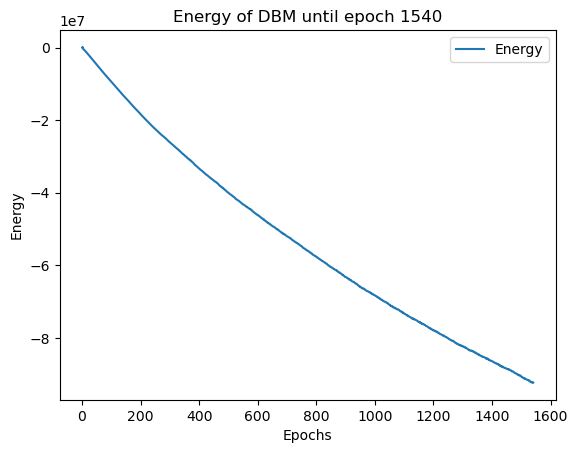

Starting...:  77%|████████████████▏    | 1542/2000 [19:38:56<5:53:36, 46.33s/it]

Time taken for DBM epoch 1541 is 46.24544405937195


Starting...:  77%|████████████████▏    | 1543/2000 [19:39:42<5:53:10, 46.37s/it]

Time taken for DBM epoch 1542 is 46.469369411468506


Starting...:  77%|████████████████▏    | 1544/2000 [19:40:29<5:53:00, 46.45s/it]

Time taken for DBM epoch 1543 is 46.636027812957764


Starting...:  77%|████████████████▏    | 1545/2000 [19:41:15<5:52:21, 46.47s/it]

Time taken for DBM epoch 1544 is 46.50441074371338


Starting...:  77%|████████████████▏    | 1546/2000 [19:42:01<5:51:01, 46.39s/it]

Time taken for DBM epoch 1545 is 46.21365213394165


Starting...:  77%|████████████████▏    | 1547/2000 [19:42:48<5:49:38, 46.31s/it]

Time taken for DBM epoch 1546 is 46.12301778793335


Starting...:  77%|████████████████▎    | 1548/2000 [19:43:34<5:49:12, 46.36s/it]

Time taken for DBM epoch 1547 is 46.45845818519592


Starting...:  77%|████████████████▎    | 1549/2000 [19:44:20<5:48:25, 46.35s/it]

Time taken for DBM epoch 1548 is 46.35179853439331


Starting...:  78%|████████████████▎    | 1550/2000 [19:45:07<5:47:26, 46.33s/it]

Time taken for DBM epoch 1549 is 46.257086515426636


Starting...:  78%|████████████████▎    | 1550/2000 [19:45:53<5:47:26, 46.33s/it]

Time taken for DBM epoch 1550 is 46.23595452308655


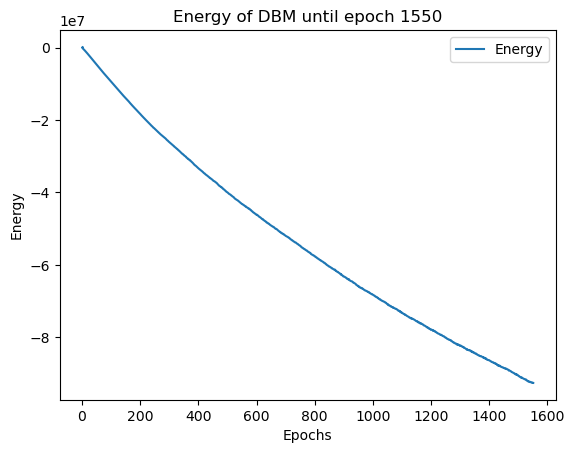

Starting...:  78%|████████████████▎    | 1552/2000 [19:46:39<5:45:41, 46.30s/it]

Time taken for DBM epoch 1551 is 46.21707034111023


Starting...:  78%|████████████████▎    | 1553/2000 [19:47:26<5:45:19, 46.35s/it]

Time taken for DBM epoch 1552 is 46.479323625564575


Starting...:  78%|████████████████▎    | 1554/2000 [19:48:12<5:44:45, 46.38s/it]

Time taken for DBM epoch 1553 is 46.44029140472412


Starting...:  78%|████████████████▎    | 1555/2000 [19:48:59<5:44:05, 46.39s/it]

Time taken for DBM epoch 1554 is 46.42980742454529


Starting...:  78%|████████████████▎    | 1556/2000 [19:49:45<5:43:53, 46.47s/it]

Time taken for DBM epoch 1555 is 46.649007081985474


Starting...:  78%|████████████████▎    | 1557/2000 [19:50:32<5:43:36, 46.54s/it]

Time taken for DBM epoch 1556 is 46.693522691726685


Starting...:  78%|████████████████▎    | 1558/2000 [19:51:19<5:43:07, 46.58s/it]

Time taken for DBM epoch 1557 is 46.66775703430176


Starting...:  78%|████████████████▎    | 1559/2000 [19:52:05<5:42:22, 46.58s/it]

Time taken for DBM epoch 1558 is 46.594831228256226


Starting...:  78%|████████████████▍    | 1560/2000 [19:52:52<5:41:15, 46.54s/it]

Time taken for DBM epoch 1559 is 46.4274206161499


Starting...:  78%|████████████████▍    | 1560/2000 [19:53:38<5:41:15, 46.54s/it]

Time taken for DBM epoch 1560 is 46.27673053741455


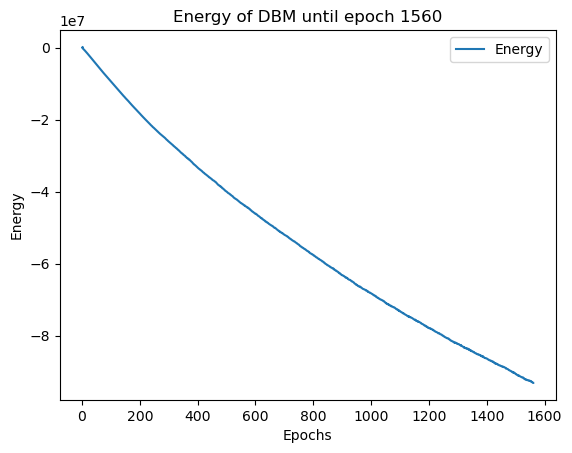

Starting...:  78%|████████████████▍    | 1562/2000 [19:54:24<5:37:57, 46.30s/it]

Time taken for DBM epoch 1561 is 45.83432650566101


Starting...:  78%|████████████████▍    | 1563/2000 [19:55:10<5:36:19, 46.18s/it]

Time taken for DBM epoch 1562 is 45.901564836502075


Starting...:  78%|████████████████▍    | 1564/2000 [19:55:56<5:34:46, 46.07s/it]

Time taken for DBM epoch 1563 is 45.820993185043335


Starting...:  78%|████████████████▍    | 1565/2000 [19:56:41<5:32:56, 45.92s/it]

Time taken for DBM epoch 1564 is 45.5760223865509


Starting...:  78%|████████████████▍    | 1566/2000 [19:57:27<5:31:36, 45.84s/it]

Time taken for DBM epoch 1565 is 45.658867835998535


Starting...:  78%|████████████████▍    | 1567/2000 [19:58:12<5:30:19, 45.77s/it]

Time taken for DBM epoch 1566 is 45.60264587402344


Starting...:  78%|████████████████▍    | 1568/2000 [19:58:58<5:28:57, 45.69s/it]

Time taken for DBM epoch 1567 is 45.496771812438965


Starting...:  78%|████████████████▍    | 1569/2000 [19:59:43<5:28:01, 45.67s/it]

Time taken for DBM epoch 1568 is 45.610718965530396


Starting...:  78%|████████████████▍    | 1570/2000 [20:00:29<5:27:00, 45.63s/it]

Time taken for DBM epoch 1569 is 45.540847301483154


Starting...:  78%|████████████████▍    | 1570/2000 [20:01:15<5:27:00, 45.63s/it]

Time taken for DBM epoch 1570 is 45.51707673072815


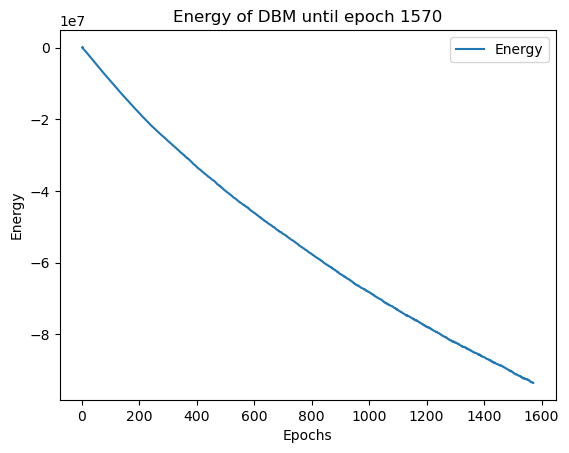

Starting...:  79%|████████████████▌    | 1572/2000 [20:02:00<5:25:27, 45.62s/it]

Time taken for DBM epoch 1571 is 45.609723806381226


Starting...:  79%|████████████████▌    | 1573/2000 [20:02:46<5:24:30, 45.60s/it]

Time taken for DBM epoch 1572 is 45.537872314453125


Starting...:  79%|████████████████▌    | 1574/2000 [20:03:32<5:24:03, 45.64s/it]

Time taken for DBM epoch 1573 is 45.739360094070435


Starting...:  79%|████████████████▌    | 1575/2000 [20:04:17<5:23:18, 45.64s/it]

Time taken for DBM epoch 1574 is 45.648993253707886


Starting...:  79%|████████████████▌    | 1576/2000 [20:05:03<5:22:50, 45.69s/it]

Time taken for DBM epoch 1575 is 45.783689975738525


Starting...:  79%|████████████████▌    | 1577/2000 [20:05:49<5:22:42, 45.77s/it]

Time taken for DBM epoch 1576 is 45.97864007949829


Starting...:  79%|████████████████▌    | 1578/2000 [20:06:35<5:22:17, 45.82s/it]

Time taken for DBM epoch 1577 is 45.940956592559814


Starting...:  79%|████████████████▌    | 1579/2000 [20:07:21<5:21:46, 45.86s/it]

Time taken for DBM epoch 1578 is 45.939181089401245


Starting...:  79%|████████████████▌    | 1580/2000 [20:08:07<5:21:01, 45.86s/it]

Time taken for DBM epoch 1579 is 45.86573767662048


Starting...:  79%|████████████████▌    | 1580/2000 [20:08:53<5:21:01, 45.86s/it]

Time taken for DBM epoch 1580 is 46.23215317726135


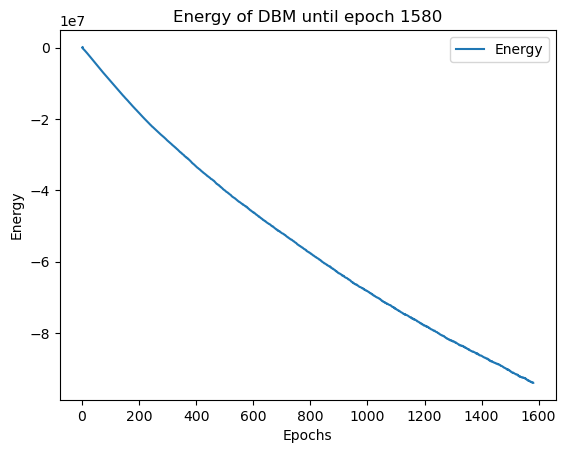

Starting...:  79%|████████████████▌    | 1582/2000 [20:09:40<5:21:32, 46.15s/it]

Time taken for DBM epoch 1581 is 46.49394464492798


Starting...:  79%|████████████████▌    | 1583/2000 [20:10:26<5:22:02, 46.34s/it]

Time taken for DBM epoch 1582 is 46.766462326049805


Starting...:  79%|████████████████▋    | 1584/2000 [20:11:13<5:21:13, 46.33s/it]

Time taken for DBM epoch 1583 is 46.311442613601685


Starting...:  79%|████████████████▋    | 1585/2000 [20:11:59<5:20:25, 46.33s/it]

Time taken for DBM epoch 1584 is 46.31856083869934


Starting...:  79%|████████████████▋    | 1586/2000 [20:12:45<5:19:43, 46.34s/it]

Time taken for DBM epoch 1585 is 46.35669708251953


Starting...:  79%|████████████████▋    | 1587/2000 [20:13:32<5:19:04, 46.36s/it]

Time taken for DBM epoch 1586 is 46.401819467544556


Starting...:  79%|████████████████▋    | 1588/2000 [20:14:18<5:18:23, 46.37s/it]

Time taken for DBM epoch 1587 is 46.398465394973755


Starting...:  79%|████████████████▋    | 1589/2000 [20:15:05<5:17:47, 46.39s/it]

Time taken for DBM epoch 1588 is 46.450318336486816


Starting...:  80%|████████████████▋    | 1590/2000 [20:15:51<5:16:58, 46.39s/it]

Time taken for DBM epoch 1589 is 46.366897106170654


Starting...:  80%|████████████████▋    | 1590/2000 [20:16:37<5:16:58, 46.39s/it]

Time taken for DBM epoch 1590 is 46.351523876190186


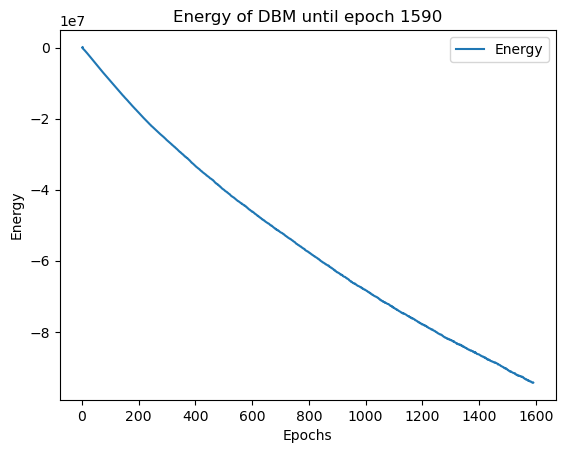

Starting...:  80%|████████████████▋    | 1592/2000 [20:17:24<5:15:40, 46.42s/it]

Time taken for DBM epoch 1591 is 46.451331615448


Starting...:  80%|████████████████▋    | 1593/2000 [20:18:10<5:15:11, 46.46s/it]

Time taken for DBM epoch 1592 is 46.56166458129883


Starting...:  80%|████████████████▋    | 1594/2000 [20:18:57<5:14:08, 46.42s/it]

Time taken for DBM epoch 1593 is 46.33165621757507


Starting...:  80%|████████████████▋    | 1595/2000 [20:19:43<5:13:45, 46.48s/it]

Time taken for DBM epoch 1594 is 46.618391036987305


Starting...:  80%|████████████████▊    | 1596/2000 [20:20:30<5:13:15, 46.52s/it]

Time taken for DBM epoch 1595 is 46.6160523891449


Starting...:  80%|████████████████▊    | 1597/2000 [20:21:17<5:12:41, 46.55s/it]

Time taken for DBM epoch 1596 is 46.625502586364746


Starting...:  80%|████████████████▊    | 1598/2000 [20:22:03<5:11:23, 46.48s/it]

Time taken for DBM epoch 1597 is 46.29278755187988


Starting...:  80%|████████████████▊    | 1599/2000 [20:22:49<5:09:43, 46.34s/it]

Time taken for DBM epoch 1598 is 46.031882524490356


Starting...:  80%|████████████████▊    | 1600/2000 [20:23:35<5:09:00, 46.35s/it]

Time taken for DBM epoch 1599 is 46.369096517562866


Starting...:  80%|████████████████▊    | 1600/2000 [20:24:22<5:09:00, 46.35s/it]

Time taken for DBM epoch 1600 is 46.62335729598999


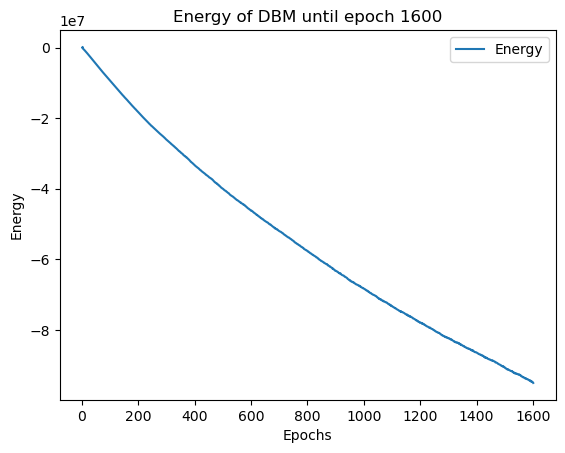

Starting...:  80%|████████████████▊    | 1602/2000 [20:25:09<5:08:31, 46.51s/it]

Time taken for DBM epoch 1601 is 46.61526918411255


Starting...:  80%|████████████████▊    | 1603/2000 [20:25:55<5:07:07, 46.42s/it]

Time taken for DBM epoch 1602 is 46.189709424972534


Starting...:  80%|████████████████▊    | 1604/2000 [20:26:41<5:05:39, 46.31s/it]

Time taken for DBM epoch 1603 is 46.07255816459656


Starting...:  80%|████████████████▊    | 1605/2000 [20:27:27<5:04:37, 46.27s/it]

Time taken for DBM epoch 1604 is 46.17906832695007


Starting...:  80%|████████████████▊    | 1606/2000 [20:28:14<5:04:14, 46.33s/it]

Time taken for DBM epoch 1605 is 46.4682891368866


Starting...:  80%|████████████████▊    | 1607/2000 [20:29:00<5:03:48, 46.38s/it]

Time taken for DBM epoch 1606 is 46.50424146652222


Starting...:  80%|████████████████▉    | 1608/2000 [20:29:47<5:03:25, 46.44s/it]

Time taken for DBM epoch 1607 is 46.580604791641235


Starting...:  80%|████████████████▉    | 1609/2000 [20:30:33<5:02:52, 46.48s/it]

Time taken for DBM epoch 1608 is 46.5531861782074


Starting...:  80%|████████████████▉    | 1610/2000 [20:31:20<5:02:19, 46.51s/it]

Time taken for DBM epoch 1609 is 46.589693784713745


Starting...:  80%|████████████████▉    | 1610/2000 [20:32:06<5:02:19, 46.51s/it]

Time taken for DBM epoch 1610 is 46.58753204345703


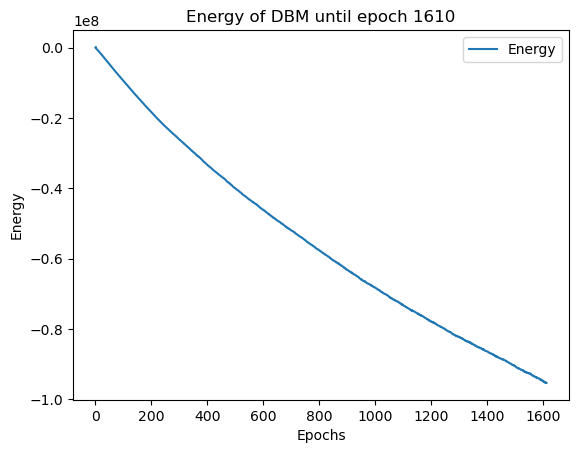

Starting...:  81%|████████████████▉    | 1612/2000 [20:32:53<5:01:10, 46.57s/it]

Time taken for DBM epoch 1611 is 46.575583934783936


Starting...:  81%|████████████████▉    | 1613/2000 [20:33:39<4:59:58, 46.51s/it]

Time taken for DBM epoch 1612 is 46.356542110443115


Starting...:  81%|████████████████▉    | 1614/2000 [20:34:26<4:58:48, 46.45s/it]

Time taken for DBM epoch 1613 is 46.30836844444275


Starting...:  81%|████████████████▉    | 1615/2000 [20:35:12<4:58:13, 46.48s/it]

Time taken for DBM epoch 1614 is 46.54109048843384


Starting...:  81%|████████████████▉    | 1616/2000 [20:35:59<4:57:58, 46.56s/it]

Time taken for DBM epoch 1615 is 46.75262117385864


Starting...:  81%|████████████████▉    | 1617/2000 [20:36:45<4:56:56, 46.52s/it]

Time taken for DBM epoch 1616 is 46.424274921417236


Starting...:  81%|████████████████▉    | 1618/2000 [20:37:32<4:56:33, 46.58s/it]

Time taken for DBM epoch 1617 is 46.7232940196991


Starting...:  81%|████████████████▉    | 1619/2000 [20:38:19<4:56:06, 46.63s/it]

Time taken for DBM epoch 1618 is 46.74831438064575


Starting...:  81%|█████████████████    | 1620/2000 [20:39:06<4:55:39, 46.68s/it]

Time taken for DBM epoch 1619 is 46.803070068359375


Starting...:  81%|█████████████████    | 1620/2000 [20:39:52<4:55:39, 46.68s/it]

Time taken for DBM epoch 1620 is 46.48795509338379


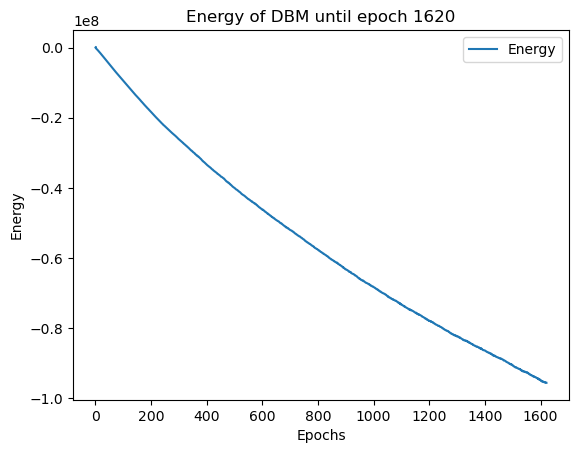

Starting...:  81%|█████████████████    | 1622/2000 [20:40:39<4:53:16, 46.55s/it]

Time taken for DBM epoch 1621 is 46.28956341743469


Starting...:  81%|█████████████████    | 1623/2000 [20:41:25<4:51:51, 46.45s/it]

Time taken for DBM epoch 1622 is 46.21789026260376


Starting...:  81%|█████████████████    | 1624/2000 [20:42:11<4:51:01, 46.44s/it]

Time taken for DBM epoch 1623 is 46.4105863571167


Starting...:  81%|█████████████████    | 1625/2000 [20:42:58<4:49:58, 46.40s/it]

Time taken for DBM epoch 1624 is 46.29360890388489


Starting...:  81%|█████████████████    | 1626/2000 [20:43:44<4:49:07, 46.38s/it]

Time taken for DBM epoch 1625 is 46.358683586120605


Starting...:  81%|█████████████████    | 1627/2000 [20:44:30<4:48:22, 46.39s/it]

Time taken for DBM epoch 1626 is 46.39778971672058


Starting...:  81%|█████████████████    | 1628/2000 [20:45:17<4:48:01, 46.46s/it]

Time taken for DBM epoch 1627 is 46.61471438407898


Starting...:  81%|█████████████████    | 1629/2000 [20:46:04<4:47:34, 46.51s/it]

Time taken for DBM epoch 1628 is 46.63062763214111


Starting...:  82%|█████████████████    | 1630/2000 [20:46:50<4:47:13, 46.58s/it]

Time taken for DBM epoch 1629 is 46.73331356048584


Starting...:  82%|█████████████████    | 1630/2000 [20:47:37<4:47:13, 46.58s/it]

Time taken for DBM epoch 1630 is 46.65421915054321


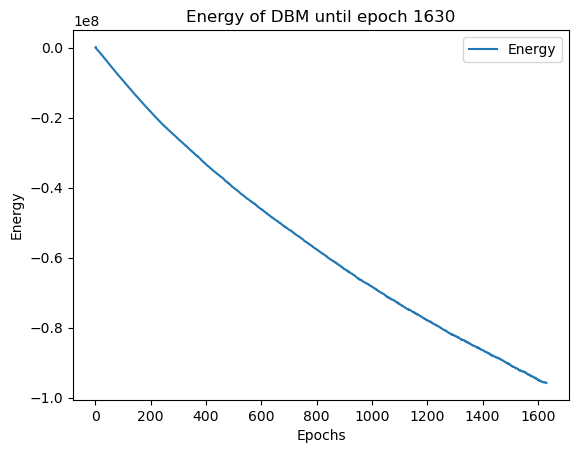

Starting...:  82%|█████████████████▏   | 1632/2000 [20:48:24<4:46:20, 46.69s/it]

Time taken for DBM epoch 1631 is 46.801963329315186


Starting...:  82%|█████████████████▏   | 1633/2000 [20:49:11<4:45:30, 46.68s/it]

Time taken for DBM epoch 1632 is 46.65950036048889


Starting...:  82%|█████████████████▏   | 1634/2000 [20:49:57<4:44:33, 46.65s/it]

Time taken for DBM epoch 1633 is 46.57699465751648


Starting...:  82%|█████████████████▏   | 1635/2000 [20:50:44<4:43:45, 46.64s/it]

Time taken for DBM epoch 1634 is 46.636008977890015


Starting...:  82%|█████████████████▏   | 1636/2000 [20:51:30<4:43:04, 46.66s/it]

Time taken for DBM epoch 1635 is 46.700692653656006


Starting...:  82%|█████████████████▏   | 1637/2000 [20:52:17<4:42:13, 46.65s/it]

Time taken for DBM epoch 1636 is 46.61707162857056


Starting...:  82%|█████████████████▏   | 1638/2000 [20:53:04<4:41:19, 46.63s/it]

Time taken for DBM epoch 1637 is 46.58018636703491


Starting...:  82%|█████████████████▏   | 1639/2000 [20:53:50<4:40:21, 46.60s/it]

Time taken for DBM epoch 1638 is 46.520063638687134


Starting...:  82%|█████████████████▏   | 1640/2000 [20:54:37<4:39:14, 46.54s/it]

Time taken for DBM epoch 1639 is 46.406630992889404


Starting...:  82%|█████████████████▏   | 1640/2000 [20:55:23<4:39:14, 46.54s/it]

Time taken for DBM epoch 1640 is 46.58188438415527


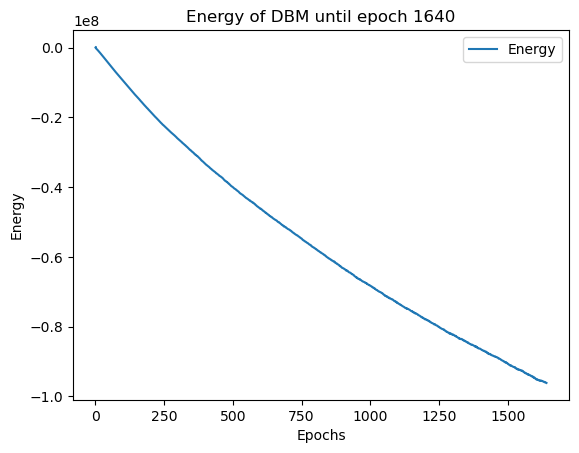

Starting...:  82%|█████████████████▏   | 1642/2000 [20:56:10<4:37:50, 46.57s/it]

Time taken for DBM epoch 1641 is 46.5190532207489


Starting...:  82%|█████████████████▎   | 1643/2000 [20:56:56<4:37:03, 46.56s/it]

Time taken for DBM epoch 1642 is 46.55832481384277


Starting...:  82%|█████████████████▎   | 1644/2000 [20:57:43<4:36:16, 46.56s/it]

Time taken for DBM epoch 1643 is 46.556621074676514


Starting...:  82%|█████████████████▎   | 1645/2000 [20:58:30<4:35:33, 46.57s/it]

Time taken for DBM epoch 1644 is 46.5984308719635


Starting...:  82%|█████████████████▎   | 1646/2000 [20:59:16<4:34:45, 46.57s/it]

Time taken for DBM epoch 1645 is 46.56043720245361


Starting...:  82%|█████████████████▎   | 1647/2000 [21:00:03<4:33:50, 46.55s/it]

Time taken for DBM epoch 1646 is 46.48810148239136


Starting...:  82%|█████████████████▎   | 1648/2000 [21:00:49<4:33:05, 46.55s/it]

Time taken for DBM epoch 1647 is 46.55679154396057


Starting...:  82%|█████████████████▎   | 1649/2000 [21:01:36<4:32:04, 46.51s/it]

Time taken for DBM epoch 1648 is 46.41417622566223


Starting...:  82%|█████████████████▎   | 1650/2000 [21:02:22<4:30:46, 46.42s/it]

Time taken for DBM epoch 1649 is 46.204551696777344


Starting...:  82%|█████████████████▎   | 1650/2000 [21:03:08<4:30:46, 46.42s/it]

Time taken for DBM epoch 1650 is 45.928690671920776


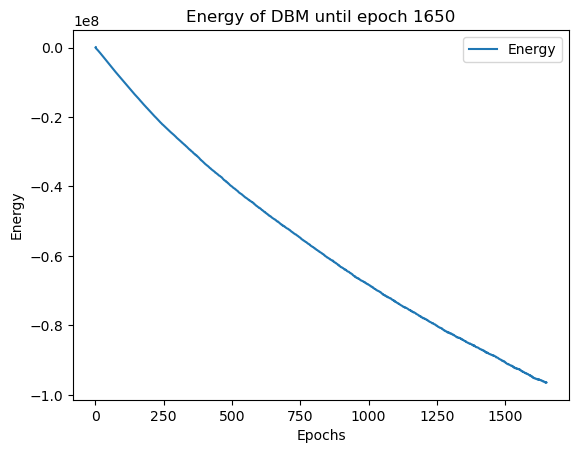

Starting...:  83%|█████████████████▎   | 1652/2000 [21:03:54<4:27:50, 46.18s/it]

Time taken for DBM epoch 1651 is 45.88531422615051


Starting...:  83%|█████████████████▎   | 1653/2000 [21:04:40<4:26:35, 46.10s/it]

Time taken for DBM epoch 1652 is 45.903061866760254


Starting...:  83%|█████████████████▎   | 1654/2000 [21:05:25<4:25:23, 46.02s/it]

Time taken for DBM epoch 1653 is 45.84872364997864


Starting...:  83%|█████████████████▍   | 1655/2000 [21:06:11<4:23:55, 45.90s/it]

Time taken for DBM epoch 1654 is 45.61460638046265


Starting...:  83%|█████████████████▍   | 1656/2000 [21:06:57<4:23:06, 45.89s/it]

Time taken for DBM epoch 1655 is 45.86995053291321


Starting...:  83%|█████████████████▍   | 1657/2000 [21:07:43<4:22:23, 45.90s/it]

Time taken for DBM epoch 1656 is 45.92175221443176


Starting...:  83%|█████████████████▍   | 1658/2000 [21:08:29<4:21:14, 45.83s/it]

Time taken for DBM epoch 1657 is 45.66996932029724


Starting...:  83%|█████████████████▍   | 1659/2000 [21:09:14<4:20:15, 45.79s/it]

Time taken for DBM epoch 1658 is 45.70697569847107


Starting...:  83%|█████████████████▍   | 1660/2000 [21:10:00<4:19:16, 45.75s/it]

Time taken for DBM epoch 1659 is 45.66159009933472


Starting...:  83%|█████████████████▍   | 1660/2000 [21:10:45<4:19:16, 45.75s/it]

Time taken for DBM epoch 1660 is 45.58122205734253


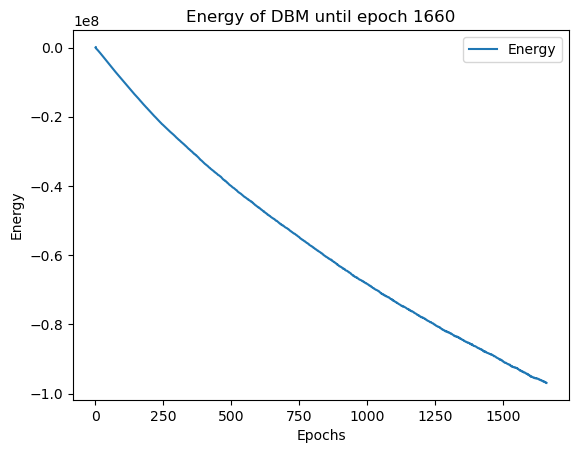

Starting...:  83%|█████████████████▍   | 1662/2000 [21:11:31<4:17:41, 45.75s/it]

Time taken for DBM epoch 1661 is 45.76453518867493


Starting...:  83%|█████████████████▍   | 1663/2000 [21:12:17<4:17:06, 45.78s/it]

Time taken for DBM epoch 1662 is 45.8498957157135


Starting...:  83%|█████████████████▍   | 1664/2000 [21:13:03<4:16:17, 45.77s/it]

Time taken for DBM epoch 1663 is 45.73848748207092


Starting...:  83%|█████████████████▍   | 1665/2000 [21:13:49<4:15:35, 45.78s/it]

Time taken for DBM epoch 1664 is 45.801374673843384


Starting...:  83%|█████████████████▍   | 1666/2000 [21:14:34<4:14:37, 45.74s/it]

Time taken for DBM epoch 1665 is 45.65891361236572


Starting...:  83%|█████████████████▌   | 1667/2000 [21:15:20<4:13:28, 45.67s/it]

Time taken for DBM epoch 1666 is 45.51076078414917


Starting...:  83%|█████████████████▌   | 1668/2000 [21:16:05<4:12:30, 45.63s/it]

Time taken for DBM epoch 1667 is 45.541274309158325


Starting...:  83%|█████████████████▌   | 1669/2000 [21:16:51<4:11:32, 45.60s/it]

Time taken for DBM epoch 1668 is 45.514694929122925


Starting...:  84%|█████████████████▌   | 1670/2000 [21:17:37<4:10:48, 45.60s/it]

Time taken for DBM epoch 1669 is 45.60777997970581


Starting...:  84%|█████████████████▌   | 1670/2000 [21:18:22<4:10:48, 45.60s/it]

Time taken for DBM epoch 1670 is 45.68747425079346


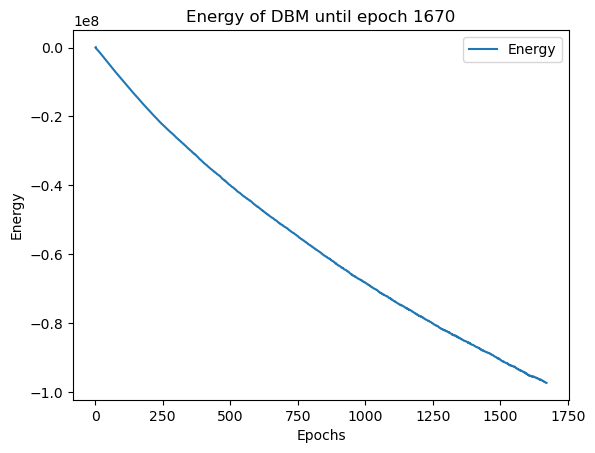

Starting...:  84%|█████████████████▌   | 1672/2000 [21:19:08<4:09:51, 45.71s/it]

Time taken for DBM epoch 1671 is 45.81015372276306


Starting...:  84%|█████████████████▌   | 1673/2000 [21:19:54<4:09:42, 45.82s/it]

Time taken for DBM epoch 1672 is 46.07722592353821


Starting...:  84%|█████████████████▌   | 1674/2000 [21:20:40<4:09:16, 45.88s/it]

Time taken for DBM epoch 1673 is 46.018948793411255


Starting...:  84%|█████████████████▌   | 1675/2000 [21:21:26<4:08:08, 45.81s/it]

Time taken for DBM epoch 1674 is 45.64871549606323


Starting...:  84%|█████████████████▌   | 1676/2000 [21:22:12<4:07:30, 45.83s/it]

Time taken for DBM epoch 1675 is 45.89048767089844


Starting...:  84%|█████████████████▌   | 1677/2000 [21:22:58<4:07:19, 45.94s/it]

Time taken for DBM epoch 1676 is 46.20042967796326


Starting...:  84%|█████████████████▌   | 1678/2000 [21:23:44<4:07:01, 46.03s/it]

Time taken for DBM epoch 1677 is 46.23310828208923


Starting...:  84%|█████████████████▋   | 1679/2000 [21:24:31<4:06:46, 46.13s/it]

Time taken for DBM epoch 1678 is 46.344820976257324


Starting...:  84%|█████████████████▋   | 1680/2000 [21:25:17<4:06:46, 46.27s/it]

Time taken for DBM epoch 1679 is 46.612059354782104


Starting...:  84%|█████████████████▋   | 1680/2000 [21:26:04<4:06:46, 46.27s/it]

Time taken for DBM epoch 1680 is 46.72843313217163


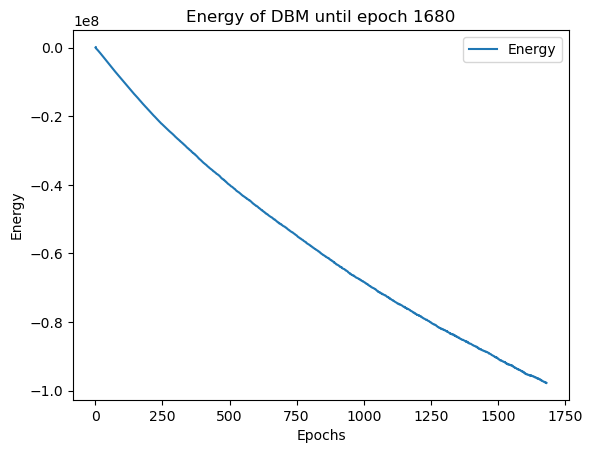

Starting...:  84%|█████████████████▋   | 1682/2000 [21:26:51<4:06:35, 46.53s/it]

Time taken for DBM epoch 1681 is 46.72064423561096


Starting...:  84%|█████████████████▋   | 1683/2000 [21:27:38<4:06:08, 46.59s/it]

Time taken for DBM epoch 1682 is 46.72540640830994


Starting...:  84%|█████████████████▋   | 1684/2000 [21:28:24<4:05:38, 46.64s/it]

Time taken for DBM epoch 1683 is 46.759668827056885


Starting...:  84%|█████████████████▋   | 1685/2000 [21:29:11<4:05:02, 46.68s/it]

Time taken for DBM epoch 1684 is 46.75843000411987


Starting...:  84%|█████████████████▋   | 1686/2000 [21:29:58<4:04:25, 46.71s/it]

Time taken for DBM epoch 1685 is 46.77810454368591


Starting...:  84%|█████████████████▋   | 1687/2000 [21:30:45<4:03:51, 46.75s/it]

Time taken for DBM epoch 1686 is 46.84076738357544


Starting...:  84%|█████████████████▋   | 1688/2000 [21:31:31<4:03:11, 46.77s/it]

Time taken for DBM epoch 1687 is 46.81597709655762


Starting...:  84%|█████████████████▋   | 1689/2000 [21:32:18<4:02:23, 46.76s/it]

Time taken for DBM epoch 1688 is 46.751938343048096


Starting...:  84%|█████████████████▋   | 1690/2000 [21:33:05<4:01:10, 46.68s/it]

Time taken for DBM epoch 1689 is 46.483089447021484


Starting...:  84%|█████████████████▋   | 1690/2000 [21:33:51<4:01:10, 46.68s/it]

Time taken for DBM epoch 1690 is 46.510475635528564


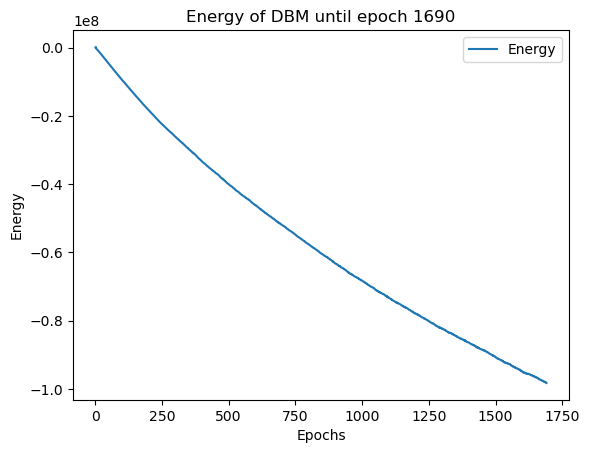

Starting...:  85%|█████████████████▊   | 1692/2000 [21:34:38<3:59:33, 46.67s/it]

Time taken for DBM epoch 1691 is 46.668192625045776


Starting...:  85%|█████████████████▊   | 1693/2000 [21:35:25<3:58:54, 46.69s/it]

Time taken for DBM epoch 1692 is 46.75066542625427


Starting...:  85%|█████████████████▊   | 1694/2000 [21:36:12<3:58:28, 46.76s/it]

Time taken for DBM epoch 1693 is 46.918893575668335


Starting...:  85%|█████████████████▊   | 1695/2000 [21:36:59<3:57:46, 46.77s/it]

Time taken for DBM epoch 1694 is 46.807682037353516


Starting...:  85%|█████████████████▊   | 1696/2000 [21:37:45<3:57:03, 46.79s/it]

Time taken for DBM epoch 1695 is 46.81685495376587


Starting...:  85%|█████████████████▊   | 1697/2000 [21:38:32<3:56:22, 46.81s/it]

Time taken for DBM epoch 1696 is 46.85232496261597


Starting...:  85%|█████████████████▊   | 1698/2000 [21:39:19<3:55:39, 46.82s/it]

Time taken for DBM epoch 1697 is 46.85309720039368


Starting...:  85%|█████████████████▊   | 1699/2000 [21:40:06<3:54:56, 46.83s/it]

Time taken for DBM epoch 1698 is 46.85866451263428


Starting...:  85%|█████████████████▊   | 1700/2000 [21:40:52<3:53:41, 46.74s/it]

Time taken for DBM epoch 1699 is 46.51884627342224


Starting...:  85%|█████████████████▊   | 1700/2000 [21:41:39<3:53:41, 46.74s/it]

Time taken for DBM epoch 1700 is 46.75435471534729


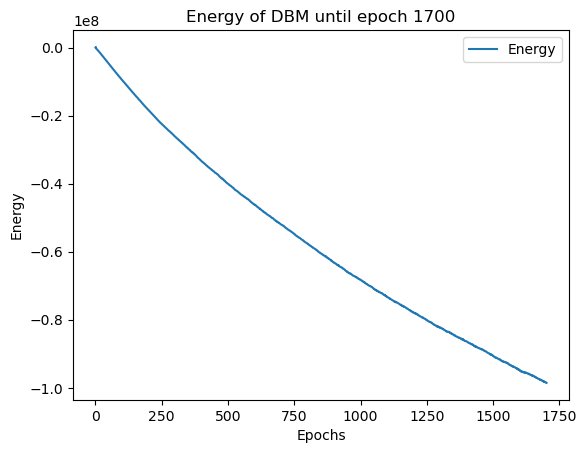

Starting...:  85%|█████████████████▊   | 1702/2000 [21:42:26<3:52:18, 46.78s/it]

Time taken for DBM epoch 1701 is 46.76553130149841


Starting...:  85%|█████████████████▉   | 1703/2000 [21:43:13<3:51:37, 46.79s/it]

Time taken for DBM epoch 1702 is 46.82929229736328


Starting...:  85%|█████████████████▉   | 1704/2000 [21:44:00<3:50:54, 46.80s/it]

Time taken for DBM epoch 1703 is 46.83270764350891


Starting...:  85%|█████████████████▉   | 1705/2000 [21:44:46<3:49:33, 46.69s/it]

Time taken for DBM epoch 1704 is 46.42544174194336


Starting...:  85%|█████████████████▉   | 1706/2000 [21:45:33<3:48:19, 46.60s/it]

Time taken for DBM epoch 1705 is 46.37992477416992


Starting...:  85%|█████████████████▉   | 1707/2000 [21:46:19<3:47:31, 46.59s/it]

Time taken for DBM epoch 1706 is 46.583759784698486


Starting...:  85%|█████████████████▉   | 1708/2000 [21:47:06<3:46:49, 46.61s/it]

Time taken for DBM epoch 1707 is 46.63595986366272


Starting...:  85%|█████████████████▉   | 1709/2000 [21:47:52<3:45:59, 46.59s/it]

Time taken for DBM epoch 1708 is 46.566954374313354


Starting...:  86%|█████████████████▉   | 1710/2000 [21:48:39<3:45:17, 46.61s/it]

Time taken for DBM epoch 1709 is 46.650745153427124


Starting...:  86%|█████████████████▉   | 1710/2000 [21:49:25<3:45:17, 46.61s/it]

Time taken for DBM epoch 1710 is 46.505021810531616


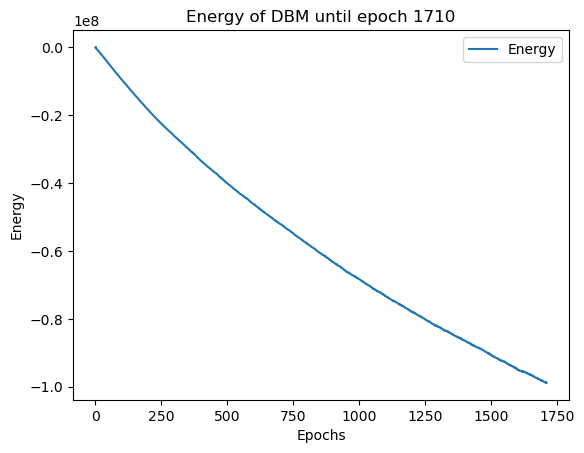

Starting...:  86%|█████████████████▉   | 1712/2000 [21:50:12<3:43:33, 46.57s/it]

Time taken for DBM epoch 1711 is 46.48153591156006


Starting...:  86%|█████████████████▉   | 1713/2000 [21:50:59<3:42:39, 46.55s/it]

Time taken for DBM epoch 1712 is 46.486191511154175


Starting...:  86%|█████████████████▉   | 1714/2000 [21:51:45<3:41:40, 46.50s/it]

Time taken for DBM epoch 1713 is 46.402405738830566


Starting...:  86%|██████████████████   | 1715/2000 [21:52:31<3:40:45, 46.48s/it]

Time taken for DBM epoch 1714 is 46.40715312957764


Starting...:  86%|██████████████████   | 1716/2000 [21:53:18<3:39:51, 46.45s/it]

Time taken for DBM epoch 1715 is 46.38489532470703


Starting...:  86%|██████████████████   | 1717/2000 [21:54:04<3:39:04, 46.45s/it]

Time taken for DBM epoch 1716 is 46.43823051452637


Starting...:  86%|██████████████████   | 1718/2000 [21:54:51<3:38:13, 46.43s/it]

Time taken for DBM epoch 1717 is 46.39325547218323


Starting...:  86%|██████████████████   | 1719/2000 [21:55:37<3:37:22, 46.41s/it]

Time taken for DBM epoch 1718 is 46.37881135940552


Starting...:  86%|██████████████████   | 1720/2000 [21:56:23<3:36:26, 46.38s/it]

Time taken for DBM epoch 1719 is 46.297749757766724


Starting...:  86%|██████████████████   | 1720/2000 [21:57:10<3:36:26, 46.38s/it]

Time taken for DBM epoch 1720 is 46.37615394592285


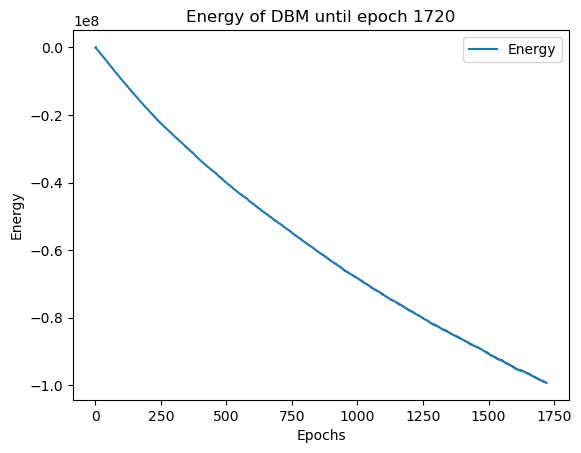

Starting...:  86%|██████████████████   | 1722/2000 [21:57:56<3:35:00, 46.41s/it]

Time taken for DBM epoch 1721 is 46.38653826713562


Starting...:  86%|██████████████████   | 1723/2000 [21:58:43<3:34:30, 46.46s/it]

Time taken for DBM epoch 1722 is 46.6034996509552


Starting...:  86%|██████████████████   | 1724/2000 [21:59:29<3:33:51, 46.49s/it]

Time taken for DBM epoch 1723 is 46.54814028739929


Starting...:  86%|██████████████████   | 1725/2000 [22:00:16<3:33:12, 46.52s/it]

Time taken for DBM epoch 1724 is 46.585147857666016


Starting...:  86%|██████████████████   | 1726/2000 [22:01:02<3:32:31, 46.54s/it]

Time taken for DBM epoch 1725 is 46.58330225944519


Starting...:  86%|██████████████████▏  | 1727/2000 [22:01:49<3:31:50, 46.56s/it]

Time taken for DBM epoch 1726 is 46.60490298271179


Starting...:  86%|██████████████████▏  | 1728/2000 [22:02:36<3:31:10, 46.58s/it]

Time taken for DBM epoch 1727 is 46.63510322570801


Starting...:  86%|██████████████████▏  | 1729/2000 [22:03:22<3:30:23, 46.58s/it]

Time taken for DBM epoch 1728 is 46.58473777770996


Starting...:  86%|██████████████████▏  | 1730/2000 [22:04:09<3:29:35, 46.58s/it]

Time taken for DBM epoch 1729 is 46.561543703079224


Starting...:  86%|██████████████████▏  | 1730/2000 [22:04:55<3:29:35, 46.58s/it]

Time taken for DBM epoch 1730 is 46.46464991569519


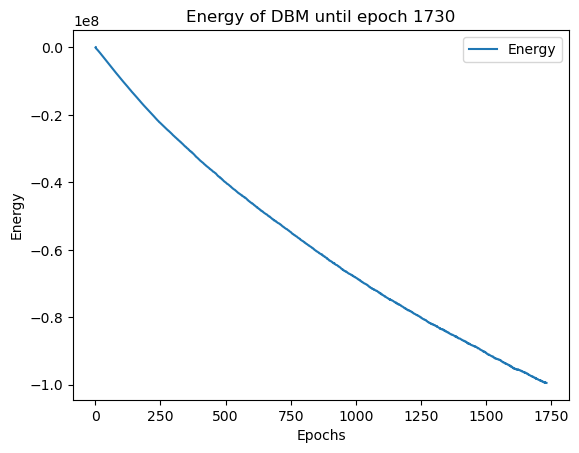

Starting...:  87%|██████████████████▏  | 1732/2000 [22:05:42<3:27:49, 46.53s/it]

Time taken for DBM epoch 1731 is 46.417869091033936


Starting...:  87%|██████████████████▏  | 1733/2000 [22:06:28<3:27:01, 46.52s/it]

Time taken for DBM epoch 1732 is 46.510162115097046


Starting...:  87%|██████████████████▏  | 1734/2000 [22:07:15<3:26:23, 46.55s/it]

Time taken for DBM epoch 1733 is 46.622079610824585


Starting...:  87%|██████████████████▏  | 1735/2000 [22:08:02<3:25:47, 46.60s/it]

Time taken for DBM epoch 1734 is 46.692715883255005


Starting...:  87%|██████████████████▏  | 1736/2000 [22:08:48<3:24:51, 46.56s/it]

Time taken for DBM epoch 1735 is 46.47265291213989


Starting...:  87%|██████████████████▏  | 1737/2000 [22:09:35<3:24:06, 46.57s/it]

Time taken for DBM epoch 1736 is 46.5808265209198


Starting...:  87%|██████████████████▏  | 1738/2000 [22:10:21<3:23:24, 46.58s/it]

Time taken for DBM epoch 1737 is 46.61788892745972


Starting...:  87%|██████████████████▎  | 1739/2000 [22:11:08<3:22:38, 46.58s/it]

Time taken for DBM epoch 1738 is 46.5914306640625


Starting...:  87%|██████████████████▎  | 1740/2000 [22:11:54<3:21:49, 46.57s/it]

Time taken for DBM epoch 1739 is 46.54890465736389


Starting...:  87%|██████████████████▎  | 1740/2000 [22:12:41<3:21:49, 46.57s/it]

Time taken for DBM epoch 1740 is 46.62600350379944


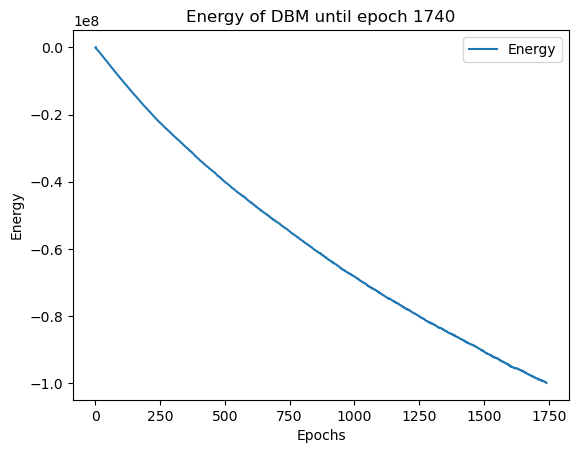

Starting...:  87%|██████████████████▎  | 1742/2000 [22:13:28<3:20:21, 46.59s/it]

Time taken for DBM epoch 1741 is 46.522390842437744


Starting...:  87%|██████████████████▎  | 1743/2000 [22:14:14<3:19:33, 46.59s/it]

Time taken for DBM epoch 1742 is 46.58417057991028


Starting...:  87%|██████████████████▎  | 1744/2000 [22:15:01<3:18:40, 46.56s/it]

Time taken for DBM epoch 1743 is 46.501319885253906


Starting...:  87%|██████████████████▎  | 1745/2000 [22:15:47<3:17:53, 46.56s/it]

Time taken for DBM epoch 1744 is 46.55668807029724


Starting...:  87%|██████████████████▎  | 1746/2000 [22:16:34<3:17:04, 46.55s/it]

Time taken for DBM epoch 1745 is 46.526851177215576


Starting...:  87%|██████████████████▎  | 1747/2000 [22:17:20<3:16:10, 46.52s/it]

Time taken for DBM epoch 1746 is 46.456801652908325


Starting...:  87%|██████████████████▎  | 1748/2000 [22:18:07<3:15:24, 46.53s/it]

Time taken for DBM epoch 1747 is 46.52826929092407


Starting...:  87%|██████████████████▎  | 1749/2000 [22:18:53<3:14:40, 46.53s/it]

Time taken for DBM epoch 1748 is 46.55431008338928


Starting...:  88%|██████████████████▍  | 1750/2000 [22:19:40<3:14:01, 46.57s/it]

Time taken for DBM epoch 1749 is 46.642390966415405


Starting...:  88%|██████████████████▍  | 1750/2000 [22:20:27<3:14:01, 46.57s/it]

Time taken for DBM epoch 1750 is 46.65448880195618


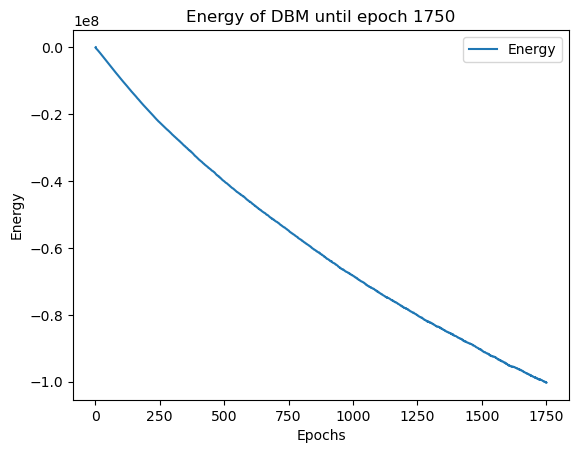

Starting...:  88%|██████████████████▍  | 1752/2000 [22:21:14<3:12:52, 46.66s/it]

Time taken for DBM epoch 1751 is 46.746880531311035


Starting...:  88%|██████████████████▍  | 1753/2000 [22:22:00<3:12:04, 46.66s/it]

Time taken for DBM epoch 1752 is 46.636287450790405


Starting...:  88%|██████████████████▍  | 1754/2000 [22:22:47<3:11:20, 46.67s/it]

Time taken for DBM epoch 1753 is 46.69656825065613


Starting...:  88%|██████████████████▍  | 1755/2000 [22:23:33<3:09:56, 46.52s/it]

Time taken for DBM epoch 1754 is 46.15660881996155


Starting...:  88%|██████████████████▍  | 1756/2000 [22:24:19<3:08:27, 46.34s/it]

Time taken for DBM epoch 1755 is 45.94123935699463


Starting...:  88%|██████████████████▍  | 1757/2000 [22:25:05<3:06:54, 46.15s/it]

Time taken for DBM epoch 1756 is 45.706188917160034


Starting...:  88%|██████████████████▍  | 1758/2000 [22:25:51<3:05:48, 46.07s/it]

Time taken for DBM epoch 1757 is 45.871631145477295


Starting...:  88%|██████████████████▍  | 1759/2000 [22:26:36<3:04:46, 46.00s/it]

Time taken for DBM epoch 1758 is 45.851178884506226


Starting...:  88%|██████████████████▍  | 1760/2000 [22:27:22<3:03:36, 45.90s/it]

Time taken for DBM epoch 1759 is 45.6701602935791


Starting...:  88%|██████████████████▍  | 1760/2000 [22:28:08<3:03:36, 45.90s/it]

Time taken for DBM epoch 1760 is 45.649712562561035


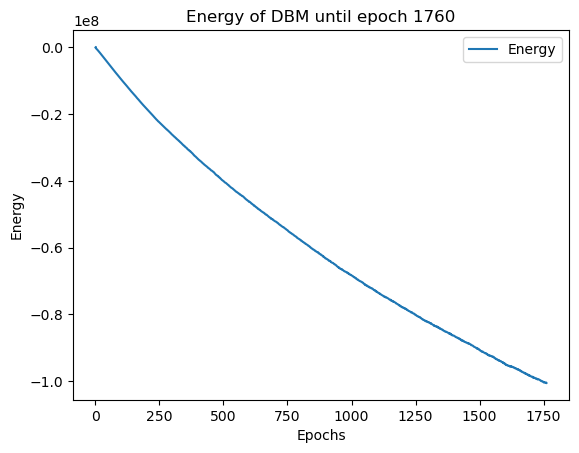

Starting...:  88%|██████████████████▌  | 1762/2000 [22:28:54<3:01:45, 45.82s/it]

Time taken for DBM epoch 1761 is 45.71986532211304


Starting...:  88%|██████████████████▌  | 1763/2000 [22:29:39<3:00:47, 45.77s/it]

Time taken for DBM epoch 1762 is 45.653489112854004


Starting...:  88%|██████████████████▌  | 1764/2000 [22:30:25<2:59:52, 45.73s/it]

Time taken for DBM epoch 1763 is 45.638601541519165


Starting...:  88%|██████████████████▌  | 1765/2000 [22:31:11<2:59:06, 45.73s/it]

Time taken for DBM epoch 1764 is 45.722036838531494


Starting...:  88%|██████████████████▌  | 1766/2000 [22:31:56<2:58:21, 45.73s/it]

Time taken for DBM epoch 1765 is 45.74036526679993


Starting...:  88%|██████████████████▌  | 1767/2000 [22:32:43<2:58:04, 45.86s/it]

Time taken for DBM epoch 1766 is 46.14283514022827


Starting...:  88%|██████████████████▌  | 1768/2000 [22:33:29<2:57:52, 46.00s/it]

Time taken for DBM epoch 1767 is 46.3486692905426


Starting...:  88%|██████████████████▌  | 1769/2000 [22:34:15<2:57:39, 46.15s/it]

Time taken for DBM epoch 1768 is 46.47700834274292


Starting...:  88%|██████████████████▌  | 1770/2000 [22:35:02<2:57:11, 46.22s/it]

Time taken for DBM epoch 1769 is 46.4011344909668


Starting...:  88%|██████████████████▌  | 1770/2000 [22:35:48<2:57:11, 46.22s/it]

Time taken for DBM epoch 1770 is 46.47565174102783


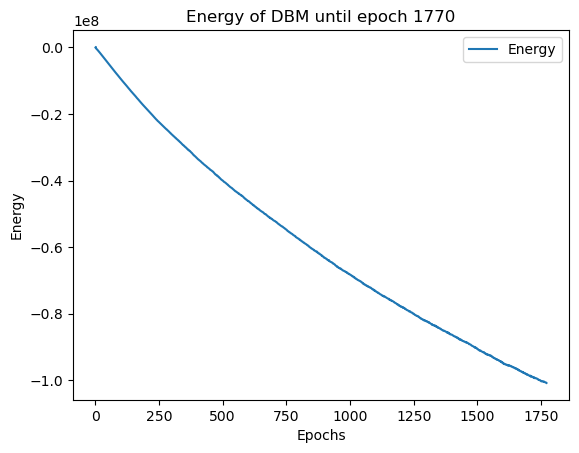

Starting...:  89%|██████████████████▌  | 1772/2000 [22:36:35<2:56:13, 46.38s/it]

Time taken for DBM epoch 1771 is 46.47334885597229


Starting...:  89%|██████████████████▌  | 1773/2000 [22:37:21<2:55:33, 46.40s/it]

Time taken for DBM epoch 1772 is 46.469598054885864


Starting...:  89%|██████████████████▋  | 1774/2000 [22:38:08<2:54:58, 46.45s/it]

Time taken for DBM epoch 1773 is 46.56443977355957


Starting...:  89%|██████████████████▋  | 1775/2000 [22:38:54<2:54:16, 46.47s/it]

Time taken for DBM epoch 1774 is 46.52027916908264


Starting...:  89%|██████████████████▋  | 1776/2000 [22:39:41<2:53:29, 46.47s/it]

Time taken for DBM epoch 1775 is 46.468639850616455


Starting...:  89%|██████████████████▋  | 1777/2000 [22:40:27<2:52:44, 46.48s/it]

Time taken for DBM epoch 1776 is 46.49427771568298


Starting...:  89%|██████████████████▋  | 1778/2000 [22:41:14<2:51:55, 46.47s/it]

Time taken for DBM epoch 1777 is 46.436169147491455


Starting...:  89%|██████████████████▋  | 1779/2000 [22:42:00<2:51:12, 46.48s/it]

Time taken for DBM epoch 1778 is 46.52441716194153


Starting...:  89%|██████████████████▋  | 1780/2000 [22:42:47<2:50:23, 46.47s/it]

Time taken for DBM epoch 1779 is 46.4390127658844


Starting...:  89%|██████████████████▋  | 1780/2000 [22:43:33<2:50:23, 46.47s/it]

Time taken for DBM epoch 1780 is 46.41910529136658


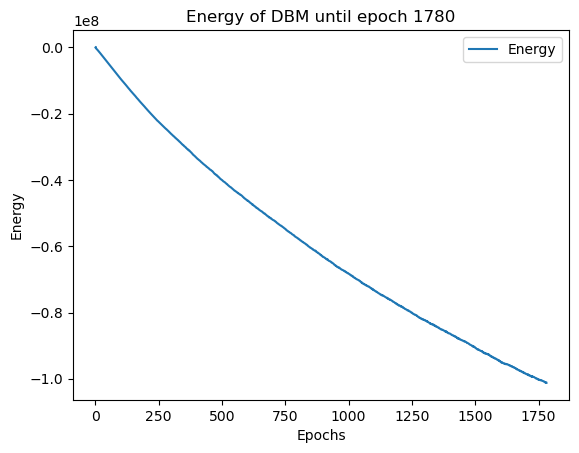

Starting...:  89%|██████████████████▋  | 1782/2000 [22:44:20<2:48:37, 46.41s/it]

Time taken for DBM epoch 1781 is 46.22619128227234


Starting...:  89%|██████████████████▋  | 1783/2000 [22:45:06<2:47:43, 46.38s/it]

Time taken for DBM epoch 1782 is 46.29461073875427


Starting...:  89%|██████████████████▋  | 1784/2000 [22:45:52<2:47:07, 46.42s/it]

Time taken for DBM epoch 1783 is 46.53195834159851


Starting...:  89%|██████████████████▋  | 1785/2000 [22:46:39<2:46:26, 46.45s/it]

Time taken for DBM epoch 1784 is 46.51344537734985


Starting...:  89%|██████████████████▊  | 1786/2000 [22:47:25<2:45:14, 46.33s/it]

Time taken for DBM epoch 1785 is 46.053569078445435


Starting...:  89%|██████████████████▊  | 1787/2000 [22:48:11<2:44:13, 46.26s/it]

Time taken for DBM epoch 1786 is 46.08814859390259


Starting...:  89%|██████████████████▊  | 1788/2000 [22:48:57<2:43:27, 46.26s/it]

Time taken for DBM epoch 1787 is 46.261972188949585


Starting...:  89%|██████████████████▊  | 1789/2000 [22:49:44<2:42:41, 46.26s/it]

Time taken for DBM epoch 1788 is 46.269266843795776


Starting...:  90%|██████████████████▊  | 1790/2000 [22:50:30<2:41:54, 46.26s/it]

Time taken for DBM epoch 1789 is 46.25479221343994


Starting...:  90%|██████████████████▊  | 1790/2000 [22:51:16<2:41:54, 46.26s/it]

Time taken for DBM epoch 1790 is 46.23081588745117


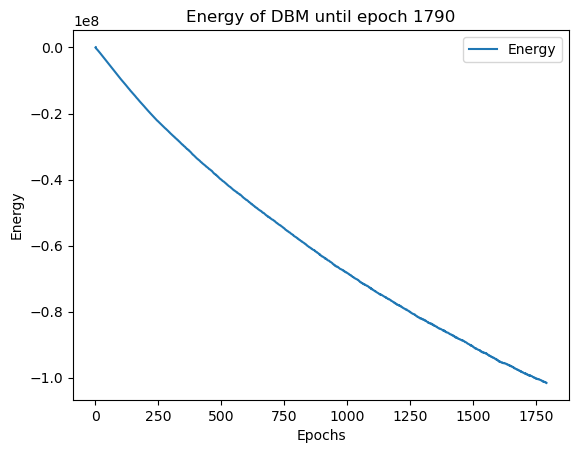

Starting...:  90%|██████████████████▊  | 1792/2000 [22:52:02<2:40:25, 46.27s/it]

Time taken for DBM epoch 1791 is 46.24634647369385


Starting...:  90%|██████████████████▊  | 1793/2000 [22:52:49<2:39:38, 46.27s/it]

Time taken for DBM epoch 1792 is 46.26195764541626


Starting...:  90%|██████████████████▊  | 1794/2000 [22:53:35<2:38:47, 46.25s/it]

Time taken for DBM epoch 1793 is 46.20525908470154


Starting...:  90%|██████████████████▊  | 1795/2000 [22:54:21<2:37:52, 46.21s/it]

Time taken for DBM epoch 1794 is 46.10830354690552


Starting...:  90%|██████████████████▊  | 1796/2000 [22:55:07<2:37:02, 46.19s/it]

Time taken for DBM epoch 1795 is 46.13969445228577


Starting...:  90%|██████████████████▊  | 1797/2000 [22:55:53<2:36:16, 46.19s/it]

Time taken for DBM epoch 1796 is 46.19751501083374


Starting...:  90%|██████████████████▉  | 1798/2000 [22:56:40<2:35:32, 46.20s/it]

Time taken for DBM epoch 1797 is 46.22222328186035


Starting...:  90%|██████████████████▉  | 1799/2000 [22:57:26<2:34:49, 46.22s/it]

Time taken for DBM epoch 1798 is 46.26071119308472


Starting...:  90%|██████████████████▉  | 1800/2000 [22:58:12<2:34:07, 46.24s/it]

Time taken for DBM epoch 1799 is 46.27636742591858


Starting...:  90%|██████████████████▉  | 1800/2000 [22:58:58<2:34:07, 46.24s/it]

Time taken for DBM epoch 1800 is 46.266175985336304


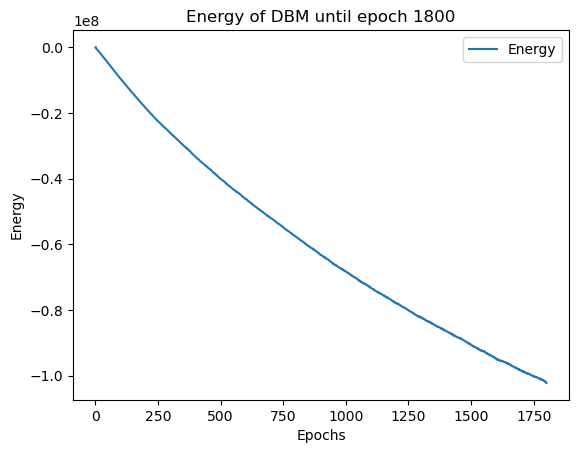

Starting...:  90%|██████████████████▉  | 1802/2000 [22:59:45<2:32:38, 46.26s/it]

Time taken for DBM epoch 1801 is 46.20272874832153


Starting...:  90%|██████████████████▉  | 1803/2000 [23:00:31<2:31:46, 46.23s/it]

Time taken for DBM epoch 1802 is 46.15634036064148


Starting...:  90%|██████████████████▉  | 1804/2000 [23:01:17<2:30:52, 46.19s/it]

Time taken for DBM epoch 1803 is 46.08904528617859


Starting...:  90%|██████████████████▉  | 1805/2000 [23:02:03<2:30:01, 46.16s/it]

Time taken for DBM epoch 1804 is 46.100106954574585


Starting...:  90%|██████████████████▉  | 1806/2000 [23:02:49<2:29:11, 46.14s/it]

Time taken for DBM epoch 1805 is 46.09951043128967


Starting...:  90%|██████████████████▉  | 1807/2000 [23:03:35<2:28:18, 46.11s/it]

Time taken for DBM epoch 1806 is 46.02462148666382


Starting...:  90%|██████████████████▉  | 1808/2000 [23:04:21<2:27:35, 46.12s/it]

Time taken for DBM epoch 1807 is 46.15317916870117


Starting...:  90%|██████████████████▉  | 1809/2000 [23:05:07<2:26:36, 46.05s/it]

Time taken for DBM epoch 1808 is 45.89599943161011


Starting...:  90%|███████████████████  | 1810/2000 [23:05:53<2:25:48, 46.04s/it]

Time taken for DBM epoch 1809 is 46.02195382118225


Starting...:  90%|███████████████████  | 1810/2000 [23:06:39<2:25:48, 46.04s/it]

Time taken for DBM epoch 1810 is 46.02605628967285


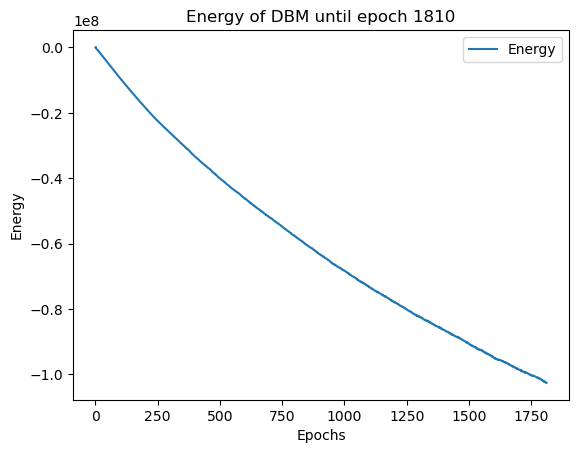

Starting...:  91%|███████████████████  | 1812/2000 [23:07:25<2:24:03, 45.97s/it]

Time taken for DBM epoch 1811 is 45.71982502937317


Starting...:  91%|███████████████████  | 1813/2000 [23:08:11<2:23:12, 45.95s/it]

Time taken for DBM epoch 1812 is 45.888144969940186


Starting...:  91%|███████████████████  | 1814/2000 [23:08:57<2:22:19, 45.91s/it]

Time taken for DBM epoch 1813 is 45.81603455543518


Starting...:  91%|███████████████████  | 1815/2000 [23:09:43<2:21:25, 45.87s/it]

Time taken for DBM epoch 1814 is 45.775551080703735


Starting...:  91%|███████████████████  | 1816/2000 [23:10:28<2:20:42, 45.88s/it]

Time taken for DBM epoch 1815 is 45.908440828323364


Starting...:  91%|███████████████████  | 1817/2000 [23:11:15<2:20:03, 45.92s/it]

Time taken for DBM epoch 1816 is 46.020363092422485


Starting...:  91%|███████████████████  | 1818/2000 [23:12:00<2:19:19, 45.93s/it]

Time taken for DBM epoch 1817 is 45.94385623931885


Starting...:  91%|███████████████████  | 1819/2000 [23:12:46<2:18:30, 45.91s/it]

Time taken for DBM epoch 1818 is 45.878262519836426


Starting...:  91%|███████████████████  | 1820/2000 [23:13:32<2:17:43, 45.91s/it]

Time taken for DBM epoch 1819 is 45.88800573348999


Starting...:  91%|███████████████████  | 1820/2000 [23:14:18<2:17:43, 45.91s/it]

Time taken for DBM epoch 1820 is 45.955286741256714


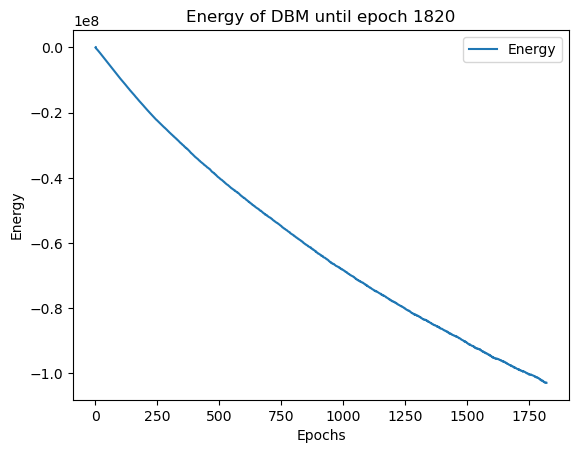

Starting...:  91%|███████████████████▏ | 1822/2000 [23:15:04<2:16:21, 45.96s/it]

Time taken for DBM epoch 1821 is 45.97084188461304


Starting...:  91%|███████████████████▏ | 1823/2000 [23:15:50<2:15:32, 45.94s/it]

Time taken for DBM epoch 1822 is 45.90456199645996


Starting...:  91%|███████████████████▏ | 1824/2000 [23:16:36<2:14:45, 45.94s/it]

Time taken for DBM epoch 1823 is 45.9349627494812


Starting...:  91%|███████████████████▏ | 1825/2000 [23:17:22<2:13:59, 45.94s/it]

Time taken for DBM epoch 1824 is 45.93184852600098


Starting...:  91%|███████████████████▏ | 1826/2000 [23:18:08<2:13:11, 45.93s/it]

Time taken for DBM epoch 1825 is 45.899752616882324


Starting...:  91%|███████████████████▏ | 1827/2000 [23:18:54<2:12:26, 45.94s/it]

Time taken for DBM epoch 1826 is 45.95589327812195


Starting...:  91%|███████████████████▏ | 1828/2000 [23:19:40<2:11:41, 45.94s/it]

Time taken for DBM epoch 1827 is 45.93799304962158


Starting...:  91%|███████████████████▏ | 1829/2000 [23:20:26<2:10:54, 45.93s/it]

Time taken for DBM epoch 1828 is 45.913357734680176


Starting...:  92%|███████████████████▏ | 1830/2000 [23:21:12<2:10:05, 45.91s/it]

Time taken for DBM epoch 1829 is 45.86895155906677


Starting...:  92%|███████████████████▏ | 1830/2000 [23:21:57<2:10:05, 45.91s/it]

Time taken for DBM epoch 1830 is 45.863786458969116


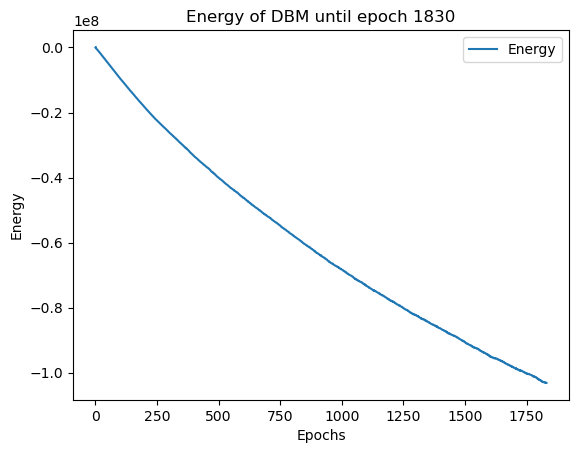

Starting...:  92%|███████████████████▏ | 1832/2000 [23:22:43<2:08:27, 45.88s/it]

Time taken for DBM epoch 1831 is 45.75305366516113


Starting...:  92%|███████████████████▏ | 1833/2000 [23:23:29<2:07:35, 45.84s/it]

Time taken for DBM epoch 1832 is 45.749786376953125


Starting...:  92%|███████████████████▎ | 1834/2000 [23:24:15<2:06:41, 45.79s/it]

Time taken for DBM epoch 1833 is 45.68732666969299


Starting...:  92%|███████████████████▎ | 1835/2000 [23:25:00<2:05:48, 45.75s/it]

Time taken for DBM epoch 1834 is 45.64601683616638


Starting...:  92%|███████████████████▎ | 1836/2000 [23:25:46<2:05:03, 45.76s/it]

Time taken for DBM epoch 1835 is 45.76722741127014


Starting...:  92%|███████████████████▎ | 1837/2000 [23:26:32<2:04:23, 45.79s/it]

Time taken for DBM epoch 1836 is 45.8603880405426


Starting...:  92%|███████████████████▎ | 1838/2000 [23:27:18<2:03:42, 45.82s/it]

Time taken for DBM epoch 1837 is 45.898669958114624


Starting...:  92%|███████████████████▎ | 1839/2000 [23:28:04<2:02:57, 45.82s/it]

Time taken for DBM epoch 1838 is 45.82944631576538


Starting...:  92%|███████████████████▎ | 1840/2000 [23:28:49<2:01:56, 45.73s/it]

Time taken for DBM epoch 1839 is 45.505879640579224


Starting...:  92%|███████████████████▎ | 1840/2000 [23:29:35<2:01:56, 45.73s/it]

Time taken for DBM epoch 1840 is 45.491140842437744


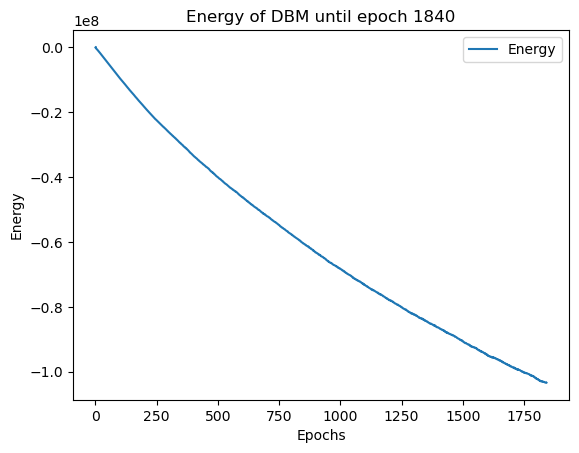

Starting...:  92%|███████████████████▎ | 1842/2000 [23:30:21<2:00:16, 45.67s/it]

Time taken for DBM epoch 1841 is 45.63004183769226


Starting...:  92%|███████████████████▎ | 1843/2000 [23:31:06<1:59:35, 45.70s/it]

Time taken for DBM epoch 1842 is 45.762460708618164


Starting...:  92%|███████████████████▎ | 1844/2000 [23:31:52<1:58:56, 45.75s/it]

Time taken for DBM epoch 1843 is 45.85926580429077


Starting...:  92%|███████████████████▎ | 1845/2000 [23:32:38<1:58:12, 45.76s/it]

Time taken for DBM epoch 1844 is 45.77894139289856


Starting...:  92%|███████████████████▍ | 1846/2000 [23:33:23<1:57:14, 45.68s/it]

Time taken for DBM epoch 1845 is 45.4827024936676


Starting...:  92%|███████████████████▍ | 1847/2000 [23:34:09<1:56:22, 45.63s/it]

Time taken for DBM epoch 1846 is 45.538681507110596


Starting...:  92%|███████████████████▍ | 1848/2000 [23:34:54<1:55:30, 45.59s/it]

Time taken for DBM epoch 1847 is 45.4938690662384


Starting...:  92%|███████████████████▍ | 1849/2000 [23:35:40<1:54:40, 45.57s/it]

Time taken for DBM epoch 1848 is 45.51116871833801


Starting...:  92%|███████████████████▍ | 1850/2000 [23:36:26<1:53:56, 45.57s/it]

Time taken for DBM epoch 1849 is 45.586504220962524


Starting...:  92%|███████████████████▍ | 1850/2000 [23:37:11<1:53:56, 45.57s/it]

Time taken for DBM epoch 1850 is 45.73667502403259


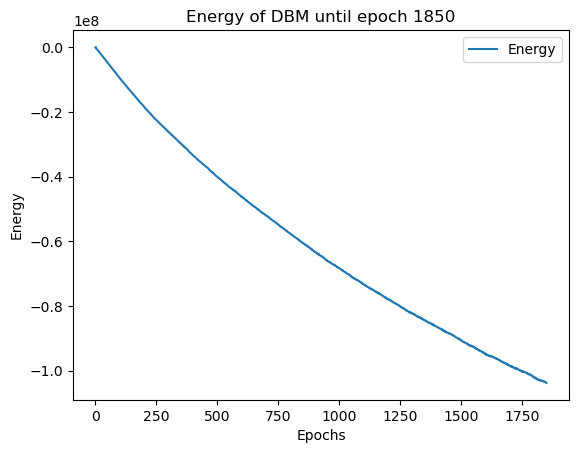

Starting...:  93%|███████████████████▍ | 1852/2000 [23:37:57<1:52:41, 45.68s/it]

Time taken for DBM epoch 1851 is 45.74322557449341


Starting...:  93%|███████████████████▍ | 1853/2000 [23:38:43<1:51:58, 45.70s/it]

Time taken for DBM epoch 1852 is 45.741663694381714


Starting...:  93%|███████████████████▍ | 1854/2000 [23:39:29<1:51:16, 45.73s/it]

Time taken for DBM epoch 1853 is 45.79094386100769


Starting...:  93%|███████████████████▍ | 1855/2000 [23:40:14<1:50:33, 45.75s/it]

Time taken for DBM epoch 1854 is 45.80336809158325


Starting...:  93%|███████████████████▍ | 1856/2000 [23:41:00<1:49:49, 45.76s/it]

Time taken for DBM epoch 1855 is 45.78925347328186


Starting...:  93%|███████████████████▍ | 1857/2000 [23:41:46<1:49:04, 45.77s/it]

Time taken for DBM epoch 1856 is 45.776249170303345


Starting...:  93%|███████████████████▌ | 1858/2000 [23:42:32<1:48:18, 45.77s/it]

Time taken for DBM epoch 1857 is 45.763203144073486


Starting...:  93%|███████████████████▌ | 1859/2000 [23:43:17<1:47:21, 45.68s/it]

Time taken for DBM epoch 1858 is 45.49017000198364


Starting...:  93%|███████████████████▌ | 1860/2000 [23:44:03<1:46:29, 45.64s/it]

Time taken for DBM epoch 1859 is 45.541906118392944


Starting...:  93%|███████████████████▌ | 1860/2000 [23:44:48<1:46:29, 45.64s/it]

Time taken for DBM epoch 1860 is 45.6372766494751


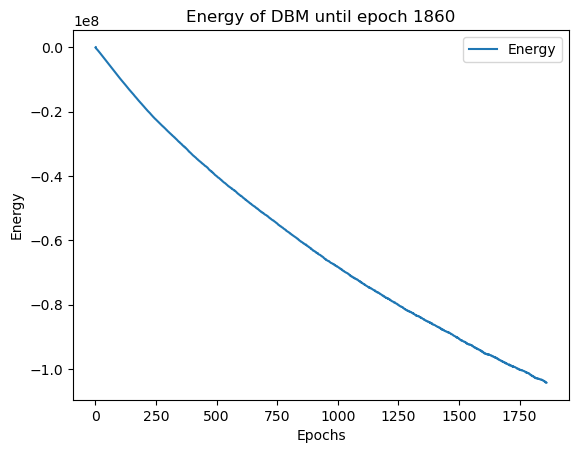

Starting...:  93%|███████████████████▌ | 1862/2000 [23:45:34<1:44:55, 45.62s/it]

Time taken for DBM epoch 1861 is 45.47673225402832


Starting...:  93%|███████████████████▌ | 1863/2000 [23:46:20<1:44:10, 45.62s/it]

Time taken for DBM epoch 1862 is 45.641531229019165


Starting...:  93%|███████████████████▌ | 1864/2000 [23:47:05<1:43:28, 45.65s/it]

Time taken for DBM epoch 1863 is 45.70074987411499


Starting...:  93%|███████████████████▌ | 1865/2000 [23:47:51<1:42:49, 45.70s/it]

Time taken for DBM epoch 1864 is 45.823227882385254


Starting...:  93%|███████████████████▌ | 1866/2000 [23:48:37<1:42:03, 45.69s/it]

Time taken for DBM epoch 1865 is 45.6813690662384


Starting...:  93%|███████████████████▌ | 1867/2000 [23:49:23<1:41:15, 45.68s/it]

Time taken for DBM epoch 1866 is 45.64946794509888


Starting...:  93%|███████████████████▌ | 1868/2000 [23:50:08<1:40:28, 45.67s/it]

Time taken for DBM epoch 1867 is 45.652005672454834


Starting...:  93%|███████████████████▌ | 1869/2000 [23:50:54<1:39:38, 45.64s/it]

Time taken for DBM epoch 1868 is 45.55119490623474


Starting...:  94%|███████████████████▋ | 1870/2000 [23:51:39<1:38:47, 45.60s/it]

Time taken for DBM epoch 1869 is 45.50415539741516


Starting...:  94%|███████████████████▋ | 1870/2000 [23:52:25<1:38:47, 45.60s/it]

Time taken for DBM epoch 1870 is 45.6367621421814


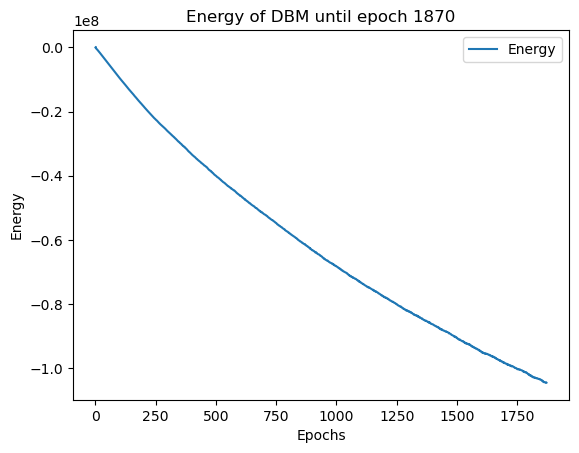

Starting...:  94%|███████████████████▋ | 1872/2000 [23:53:11<1:37:20, 45.63s/it]

Time taken for DBM epoch 1871 is 45.56835103034973


Starting...:  94%|███████████████████▋ | 1873/2000 [23:53:56<1:36:27, 45.57s/it]

Time taken for DBM epoch 1872 is 45.44274377822876


Starting...:  94%|███████████████████▋ | 1874/2000 [23:54:42<1:35:39, 45.55s/it]

Time taken for DBM epoch 1873 is 45.50567579269409


Starting...:  94%|███████████████████▋ | 1875/2000 [23:55:27<1:34:45, 45.48s/it]

Time taken for DBM epoch 1874 is 45.32433772087097


Starting...:  94%|███████████████████▋ | 1876/2000 [23:56:12<1:33:52, 45.43s/it]

Time taken for DBM epoch 1875 is 45.28842067718506


Starting...:  94%|███████████████████▋ | 1877/2000 [23:56:58<1:33:06, 45.42s/it]

Time taken for DBM epoch 1876 is 45.413602352142334


Starting...:  94%|███████████████████▋ | 1878/2000 [23:57:43<1:32:18, 45.40s/it]

Time taken for DBM epoch 1877 is 45.33517384529114


Starting...:  94%|███████████████████▋ | 1879/2000 [23:58:28<1:31:36, 45.43s/it]

Time taken for DBM epoch 1878 is 45.502543449401855


Starting...:  94%|███████████████████▋ | 1880/2000 [23:59:14<1:30:48, 45.41s/it]

Time taken for DBM epoch 1879 is 45.35787606239319


Starting...:  94%|███████████████████▋ | 1880/2000 [23:59:59<1:30:48, 45.41s/it]

Time taken for DBM epoch 1880 is 45.25700879096985


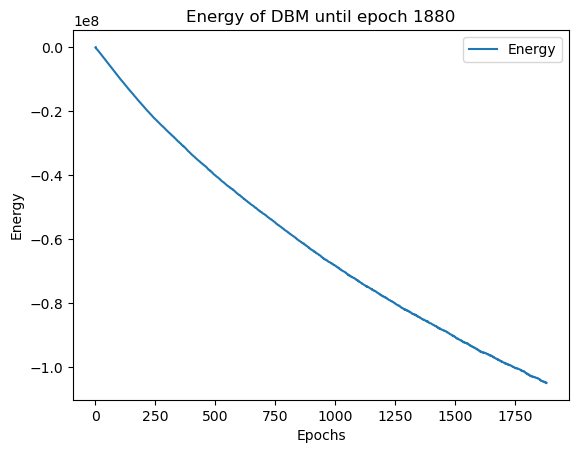

Starting...:  94%|███████████████████▊ | 1882/2000 [24:00:45<1:29:21, 45.43s/it]

Time taken for DBM epoch 1881 is 45.51924514770508


Starting...:  94%|███████████████████▊ | 1883/2000 [24:01:30<1:28:40, 45.48s/it]

Time taken for DBM epoch 1882 is 45.57469940185547


Starting...:  94%|███████████████████▊ | 1884/2000 [24:02:16<1:27:58, 45.51s/it]

Time taken for DBM epoch 1883 is 45.58104109764099


Starting...:  94%|███████████████████▊ | 1885/2000 [24:03:01<1:27:16, 45.53s/it]

Time taken for DBM epoch 1884 is 45.58574986457825


Starting...:  94%|███████████████████▊ | 1886/2000 [24:03:47<1:26:32, 45.55s/it]

Time taken for DBM epoch 1885 is 45.590453147888184


Starting...:  94%|███████████████████▊ | 1887/2000 [24:04:33<1:25:47, 45.56s/it]

Time taken for DBM epoch 1886 is 45.574262380599976


Starting...:  94%|███████████████████▊ | 1888/2000 [24:05:18<1:25:03, 45.56s/it]

Time taken for DBM epoch 1887 is 45.58093190193176


Starting...:  94%|███████████████████▊ | 1889/2000 [24:06:04<1:24:18, 45.58s/it]

Time taken for DBM epoch 1888 is 45.6015100479126


Starting...:  94%|███████████████████▊ | 1890/2000 [24:06:50<1:23:39, 45.63s/it]

Time taken for DBM epoch 1889 is 45.758206844329834


Starting...:  94%|███████████████████▊ | 1890/2000 [24:07:35<1:23:39, 45.63s/it]

Time taken for DBM epoch 1890 is 45.5954270362854


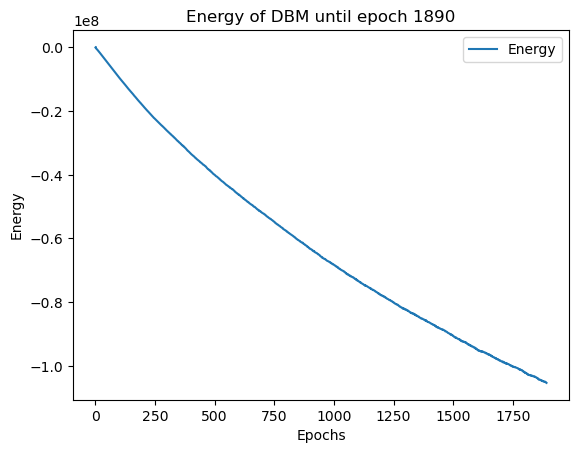

Starting...:  95%|███████████████████▊ | 1892/2000 [24:08:21<1:22:06, 45.62s/it]

Time taken for DBM epoch 1891 is 45.51936650276184


Starting...:  95%|███████████████████▉ | 1893/2000 [24:09:06<1:21:20, 45.61s/it]

Time taken for DBM epoch 1892 is 45.60716438293457


Starting...:  95%|███████████████████▉ | 1894/2000 [24:09:52<1:20:28, 45.55s/it]

Time taken for DBM epoch 1893 is 45.41480231285095


Starting...:  95%|███████████████████▉ | 1895/2000 [24:10:37<1:19:40, 45.53s/it]

Time taken for DBM epoch 1894 is 45.479281187057495


Starting...:  95%|███████████████████▉ | 1896/2000 [24:11:23<1:18:49, 45.47s/it]

Time taken for DBM epoch 1895 is 45.334654092788696


Starting...:  95%|███████████████████▉ | 1897/2000 [24:12:08<1:17:59, 45.43s/it]

Time taken for DBM epoch 1896 is 45.33982443809509


Starting...:  95%|███████████████████▉ | 1898/2000 [24:12:53<1:17:14, 45.44s/it]

Time taken for DBM epoch 1897 is 45.44883632659912


Starting...:  95%|███████████████████▉ | 1899/2000 [24:13:39<1:16:33, 45.48s/it]

Time taken for DBM epoch 1898 is 45.593026876449585


Starting...:  95%|███████████████████▉ | 1900/2000 [24:14:25<1:15:52, 45.52s/it]

Time taken for DBM epoch 1899 is 45.60272765159607


Starting...:  95%|███████████████████▉ | 1900/2000 [24:15:10<1:15:52, 45.52s/it]

Time taken for DBM epoch 1900 is 45.58886694908142


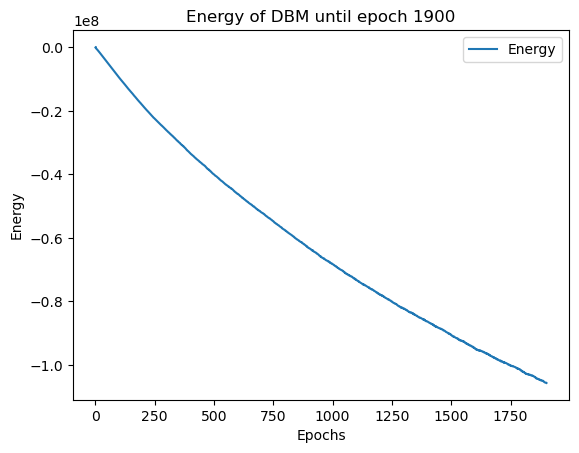

Starting...:  95%|███████████████████▉ | 1902/2000 [24:15:56<1:14:26, 45.57s/it]

Time taken for DBM epoch 1901 is 45.56142067909241


Starting...:  95%|███████████████████▉ | 1903/2000 [24:16:41<1:13:39, 45.56s/it]

Time taken for DBM epoch 1902 is 45.537357330322266


Starting...:  95%|███████████████████▉ | 1904/2000 [24:17:27<1:12:44, 45.47s/it]

Time taken for DBM epoch 1903 is 45.23921275138855


Starting...:  95%|████████████████████ | 1905/2000 [24:18:12<1:11:53, 45.41s/it]

Time taken for DBM epoch 1904 is 45.2809853553772


Starting...:  95%|████████████████████ | 1906/2000 [24:18:57<1:11:07, 45.40s/it]

Time taken for DBM epoch 1905 is 45.37503671646118


Starting...:  95%|████████████████████ | 1907/2000 [24:19:43<1:10:20, 45.38s/it]

Time taken for DBM epoch 1906 is 45.326990604400635


Starting...:  95%|████████████████████ | 1908/2000 [24:20:28<1:09:37, 45.41s/it]

Time taken for DBM epoch 1907 is 45.49016809463501


Starting...:  95%|████████████████████ | 1909/2000 [24:21:13<1:08:49, 45.37s/it]

Time taken for DBM epoch 1908 is 45.28553819656372


Starting...:  96%|████████████████████ | 1910/2000 [24:21:59<1:07:56, 45.29s/it]

Time taken for DBM epoch 1909 is 45.094181060791016


Starting...:  96%|████████████████████ | 1910/2000 [24:22:44<1:07:56, 45.29s/it]

Time taken for DBM epoch 1910 is 45.11296844482422


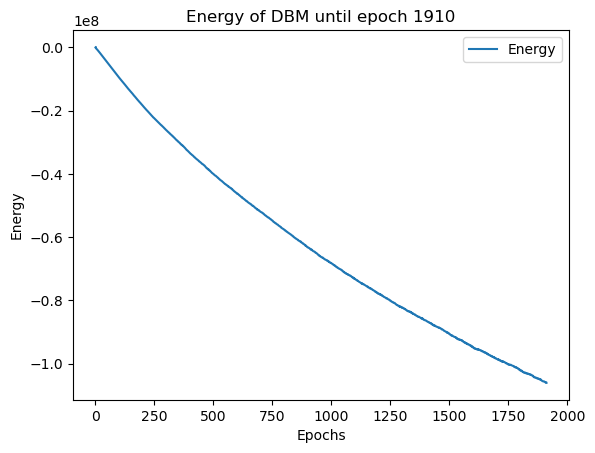

Starting...:  96%|████████████████████ | 1912/2000 [24:23:29<1:06:22, 45.26s/it]

Time taken for DBM epoch 1911 is 45.213672399520874


Starting...:  96%|████████████████████ | 1913/2000 [24:24:14<1:05:32, 45.20s/it]

Time taken for DBM epoch 1912 is 45.06392526626587


Starting...:  96%|████████████████████ | 1914/2000 [24:24:59<1:04:46, 45.19s/it]

Time taken for DBM epoch 1913 is 45.16021680831909


Starting...:  96%|████████████████████ | 1915/2000 [24:25:44<1:03:52, 45.09s/it]

Time taken for DBM epoch 1914 is 44.861544132232666


Starting...:  96%|████████████████████ | 1916/2000 [24:26:29<1:03:06, 45.07s/it]

Time taken for DBM epoch 1915 is 45.03301548957825


Starting...:  96%|████████████████████▏| 1917/2000 [24:27:14<1:02:21, 45.08s/it]

Time taken for DBM epoch 1916 is 45.079864740371704


Starting...:  96%|████████████████████▏| 1918/2000 [24:27:59<1:01:35, 45.06s/it]

Time taken for DBM epoch 1917 is 45.03370904922485


Starting...:  96%|████████████████████▏| 1919/2000 [24:28:44<1:00:50, 45.07s/it]

Time taken for DBM epoch 1918 is 45.06933856010437


Starting...:  96%|████████████████████▏| 1920/2000 [24:29:29<1:00:03, 45.04s/it]

Time taken for DBM epoch 1919 is 44.973670959472656


Starting...:  96%|████████████████████▏| 1920/2000 [24:30:14<1:00:03, 45.04s/it]

Time taken for DBM epoch 1920 is 44.93779730796814


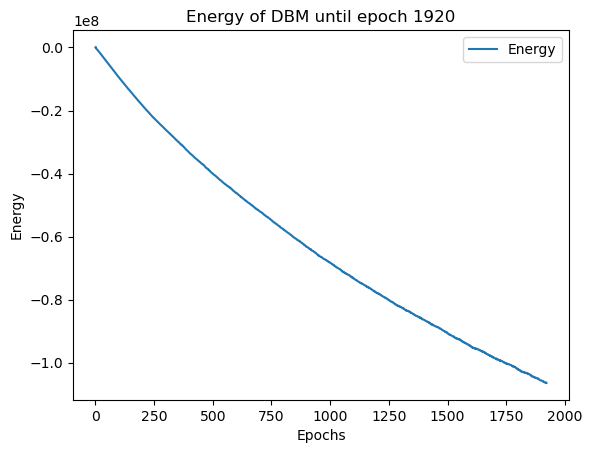

Starting...:  96%|██████████████████████ | 1922/2000 [24:30:59<58:33, 45.05s/it]

Time taken for DBM epoch 1921 is 45.04189205169678


Starting...:  96%|██████████████████████ | 1923/2000 [24:31:44<57:47, 45.03s/it]

Time taken for DBM epoch 1922 is 44.988569259643555


Starting...:  96%|██████████████████████▏| 1924/2000 [24:32:29<57:04, 45.05s/it]

Time taken for DBM epoch 1923 is 45.11598300933838


Starting...:  96%|██████████████████████▏| 1925/2000 [24:33:15<56:20, 45.08s/it]

Time taken for DBM epoch 1924 is 45.12483549118042


Starting...:  96%|██████████████████████▏| 1926/2000 [24:34:00<55:41, 45.16s/it]

Time taken for DBM epoch 1925 is 45.35353231430054


Starting...:  96%|██████████████████████▏| 1927/2000 [24:34:45<55:01, 45.23s/it]

Time taken for DBM epoch 1926 is 45.38974070549011


Starting...:  96%|██████████████████████▏| 1928/2000 [24:35:31<54:20, 45.29s/it]

Time taken for DBM epoch 1927 is 45.43509888648987


Starting...:  96%|██████████████████████▏| 1929/2000 [24:36:16<53:39, 45.35s/it]

Time taken for DBM epoch 1928 is 45.48411965370178


Starting...:  96%|██████████████████████▏| 1930/2000 [24:37:02<52:53, 45.33s/it]

Time taken for DBM epoch 1929 is 45.29585075378418


Starting...:  96%|██████████████████████▏| 1930/2000 [24:37:47<52:53, 45.33s/it]

Time taken for DBM epoch 1930 is 45.10383582115173


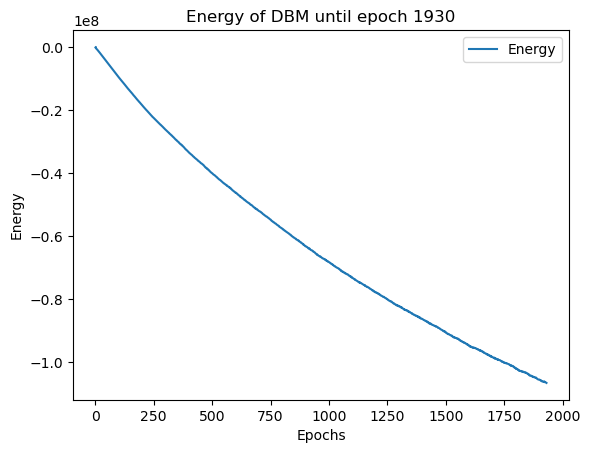

Starting...:  97%|██████████████████████▏| 1932/2000 [24:38:32<51:13, 45.19s/it]

Time taken for DBM epoch 1931 is 44.93629598617554


Starting...:  97%|██████████████████████▏| 1933/2000 [24:39:17<50:23, 45.12s/it]

Time taken for DBM epoch 1932 is 44.958802223205566


Starting...:  97%|██████████████████████▏| 1934/2000 [24:40:02<49:35, 45.09s/it]

Time taken for DBM epoch 1933 is 44.99801182746887


Starting...:  97%|██████████████████████▎| 1935/2000 [24:40:47<48:52, 45.12s/it]

Time taken for DBM epoch 1934 is 45.19820713996887


Starting...:  97%|██████████████████████▎| 1936/2000 [24:41:32<48:08, 45.13s/it]

Time taken for DBM epoch 1935 is 45.16576099395752


Starting...:  97%|██████████████████████▎| 1937/2000 [24:42:17<47:24, 45.15s/it]

Time taken for DBM epoch 1936 is 45.17820167541504


Starting...:  97%|██████████████████████▎| 1938/2000 [24:43:03<46:43, 45.21s/it]

Time taken for DBM epoch 1937 is 45.357579469680786


Starting...:  97%|██████████████████████▎| 1939/2000 [24:43:48<46:01, 45.27s/it]

Time taken for DBM epoch 1938 is 45.42160248756409


Starting...:  97%|██████████████████████▎| 1940/2000 [24:44:33<45:19, 45.32s/it]

Time taken for DBM epoch 1939 is 45.423911333084106


Starting...:  97%|██████████████████████▎| 1940/2000 [24:45:19<45:19, 45.32s/it]

Time taken for DBM epoch 1940 is 45.53134727478027


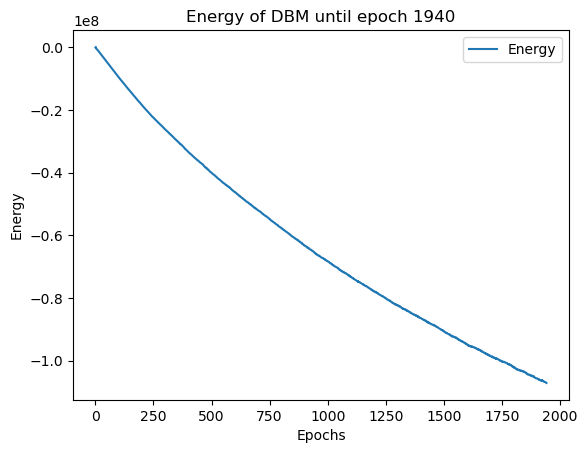

Starting...:  97%|██████████████████████▎| 1942/2000 [24:46:05<43:54, 45.42s/it]

Time taken for DBM epoch 1941 is 45.433719635009766


Starting...:  97%|██████████████████████▎| 1943/2000 [24:46:50<43:10, 45.45s/it]

Time taken for DBM epoch 1942 is 45.509586334228516


Starting...:  97%|██████████████████████▎| 1944/2000 [24:47:36<42:25, 45.46s/it]

Time taken for DBM epoch 1943 is 45.46912097930908


Starting...:  97%|██████████████████████▎| 1945/2000 [24:48:21<41:41, 45.48s/it]

Time taken for DBM epoch 1944 is 45.52027630805969


Starting...:  97%|██████████████████████▍| 1946/2000 [24:49:06<40:53, 45.44s/it]

Time taken for DBM epoch 1945 is 45.34962272644043


Starting...:  97%|██████████████████████▍| 1947/2000 [24:49:52<40:04, 45.36s/it]

Time taken for DBM epoch 1946 is 45.17935609817505


Starting...:  97%|██████████████████████▍| 1948/2000 [24:50:37<39:16, 45.31s/it]

Time taken for DBM epoch 1947 is 45.19699573516846


Starting...:  97%|██████████████████████▍| 1949/2000 [24:51:22<38:30, 45.31s/it]

Time taken for DBM epoch 1948 is 45.29299807548523


Starting...:  98%|██████████████████████▍| 1950/2000 [24:52:07<37:45, 45.30s/it]

Time taken for DBM epoch 1949 is 45.29283404350281


Starting...:  98%|██████████████████████▍| 1950/2000 [24:52:53<37:45, 45.30s/it]

Time taken for DBM epoch 1950 is 45.42869853973389


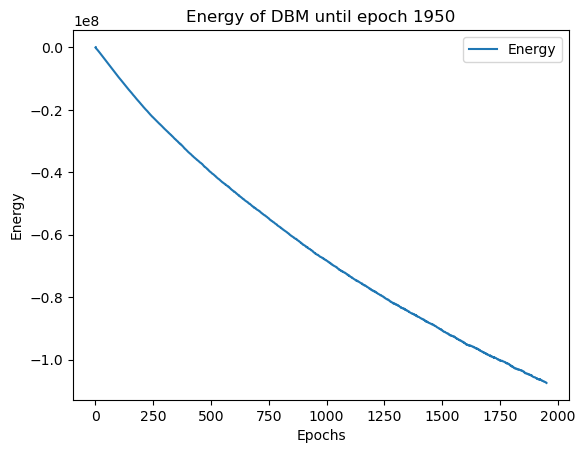

Starting...:  98%|██████████████████████▍| 1952/2000 [24:53:38<36:18, 45.38s/it]

Time taken for DBM epoch 1951 is 45.40098738670349


Starting...:  98%|██████████████████████▍| 1953/2000 [24:54:24<35:32, 45.37s/it]

Time taken for DBM epoch 1952 is 45.34264540672302


Starting...:  98%|██████████████████████▍| 1954/2000 [24:55:09<34:45, 45.33s/it]

Time taken for DBM epoch 1953 is 45.23923063278198


Starting...:  98%|██████████████████████▍| 1955/2000 [24:55:54<33:59, 45.33s/it]

Time taken for DBM epoch 1954 is 45.327269554138184


Starting...:  98%|██████████████████████▍| 1956/2000 [24:56:40<33:15, 45.35s/it]

Time taken for DBM epoch 1955 is 45.398845195770264


Starting...:  98%|██████████████████████▌| 1957/2000 [24:57:25<32:31, 45.38s/it]

Time taken for DBM epoch 1956 is 45.45462512969971


Starting...:  98%|██████████████████████▌| 1958/2000 [24:58:10<31:45, 45.37s/it]

Time taken for DBM epoch 1957 is 45.33069133758545


Starting...:  98%|██████████████████████▌| 1959/2000 [24:58:56<30:59, 45.36s/it]

Time taken for DBM epoch 1958 is 45.32763695716858


Starting...:  98%|██████████████████████▌| 1960/2000 [24:59:41<30:13, 45.34s/it]

Time taken for DBM epoch 1959 is 45.30121350288391


Starting...:  98%|██████████████████████▌| 1960/2000 [25:00:26<30:13, 45.34s/it]

Time taken for DBM epoch 1960 is 45.36144781112671


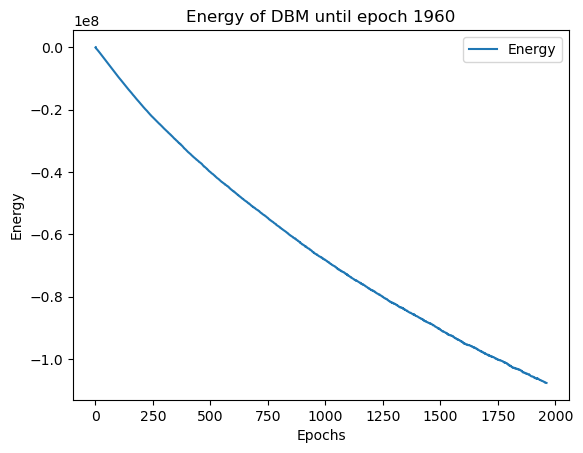

Starting...:  98%|██████████████████████▌| 1962/2000 [25:01:12<28:44, 45.38s/it]

Time taken for DBM epoch 1961 is 45.38133263587952


Starting...:  98%|██████████████████████▌| 1963/2000 [25:01:57<27:59, 45.38s/it]

Time taken for DBM epoch 1962 is 45.390735149383545


Starting...:  98%|██████████████████████▌| 1964/2000 [25:02:43<27:15, 45.42s/it]

Time taken for DBM epoch 1963 is 45.4934344291687


Starting...:  98%|██████████████████████▌| 1965/2000 [25:03:28<26:30, 45.43s/it]

Time taken for DBM epoch 1964 is 45.46016216278076


Starting...:  98%|██████████████████████▌| 1966/2000 [25:04:14<25:44, 45.44s/it]

Time taken for DBM epoch 1965 is 45.45015573501587


Starting...:  98%|██████████████████████▌| 1967/2000 [25:04:59<24:58, 45.41s/it]

Time taken for DBM epoch 1966 is 45.33468317985535


Starting...:  98%|██████████████████████▋| 1968/2000 [25:05:44<24:13, 45.41s/it]

Time taken for DBM epoch 1967 is 45.4145884513855


Starting...:  98%|██████████████████████▋| 1969/2000 [25:06:30<23:27, 45.39s/it]

Time taken for DBM epoch 1968 is 45.35866856575012


Starting...:  98%|██████████████████████▋| 1970/2000 [25:07:15<22:42, 45.40s/it]

Time taken for DBM epoch 1969 is 45.425323247909546


Starting...:  98%|██████████████████████▋| 1970/2000 [25:08:01<22:42, 45.40s/it]

Time taken for DBM epoch 1970 is 45.37497162818909


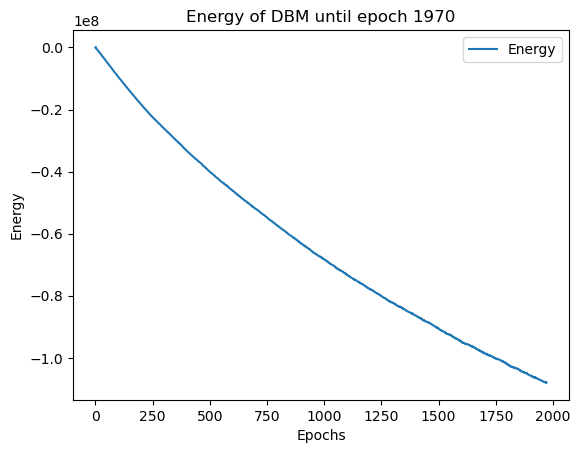

Starting...:  99%|██████████████████████▋| 1972/2000 [25:08:46<21:10, 45.39s/it]

Time taken for DBM epoch 1971 is 45.29280066490173


Starting...:  99%|██████████████████████▋| 1973/2000 [25:09:31<20:25, 45.40s/it]

Time taken for DBM epoch 1972 is 45.43186640739441


Starting...:  99%|██████████████████████▋| 1974/2000 [25:10:17<19:40, 45.42s/it]

Time taken for DBM epoch 1973 is 45.44552159309387


Starting...:  99%|██████████████████████▋| 1975/2000 [25:11:02<18:55, 45.43s/it]

Time taken for DBM epoch 1974 is 45.459134578704834


Starting...:  99%|██████████████████████▋| 1976/2000 [25:11:48<18:10, 45.44s/it]

Time taken for DBM epoch 1975 is 45.467204093933105


Starting...:  99%|██████████████████████▋| 1977/2000 [25:12:33<17:25, 45.44s/it]

Time taken for DBM epoch 1976 is 45.44972777366638


Starting...:  99%|██████████████████████▋| 1978/2000 [25:13:19<16:39, 45.42s/it]

Time taken for DBM epoch 1977 is 45.37871956825256


Starting...:  99%|██████████████████████▊| 1979/2000 [25:14:04<15:54, 45.44s/it]

Time taken for DBM epoch 1978 is 45.46168327331543


Starting...:  99%|██████████████████████▊| 1980/2000 [25:14:50<15:08, 45.43s/it]

Time taken for DBM epoch 1979 is 45.40653467178345


Starting...:  99%|██████████████████████▊| 1980/2000 [25:15:35<15:08, 45.43s/it]

Time taken for DBM epoch 1980 is 45.276981592178345


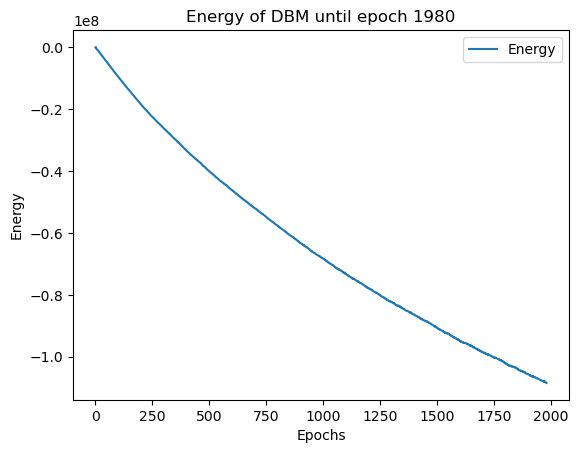

Starting...:  99%|██████████████████████▊| 1982/2000 [25:16:20<13:34, 45.26s/it]

Time taken for DBM epoch 1981 is 44.89462161064148


Starting...:  99%|██████████████████████▊| 1983/2000 [25:17:05<12:47, 45.13s/it]

Time taken for DBM epoch 1982 is 44.82511377334595


Starting...:  99%|██████████████████████▊| 1984/2000 [25:17:50<12:01, 45.07s/it]

Time taken for DBM epoch 1983 is 44.93182611465454


Starting...:  99%|██████████████████████▊| 1985/2000 [25:18:35<11:16, 45.08s/it]

Time taken for DBM epoch 1984 is 45.10745692253113


Starting...:  99%|██████████████████████▊| 1986/2000 [25:19:20<10:31, 45.13s/it]

Time taken for DBM epoch 1985 is 45.22874617576599


Starting...:  99%|██████████████████████▊| 1987/2000 [25:20:05<09:47, 45.19s/it]

Time taken for DBM epoch 1986 is 45.336920738220215


Starting...:  99%|██████████████████████▊| 1988/2000 [25:20:51<09:02, 45.23s/it]

Time taken for DBM epoch 1987 is 45.33837819099426


Starting...:  99%|██████████████████████▊| 1989/2000 [25:21:36<08:18, 45.29s/it]

Time taken for DBM epoch 1988 is 45.417383909225464


Starting...: 100%|██████████████████████▉| 1990/2000 [25:22:21<07:33, 45.35s/it]

Time taken for DBM epoch 1989 is 45.48522114753723


Starting...: 100%|██████████████████████▉| 1990/2000 [25:23:07<07:33, 45.35s/it]

Time taken for DBM epoch 1990 is 45.43769836425781


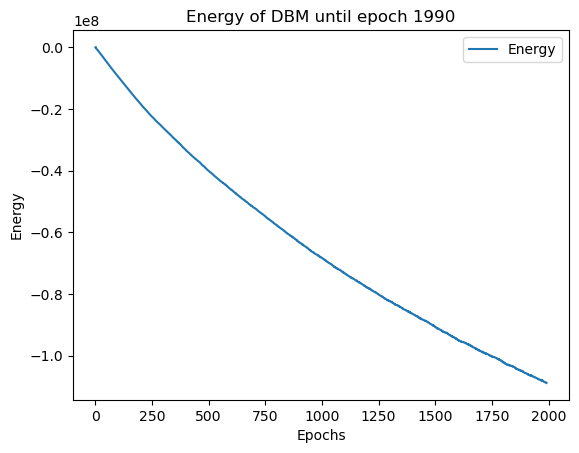

Starting...: 100%|██████████████████████▉| 1992/2000 [25:23:52<06:03, 45.40s/it]

Time taken for DBM epoch 1991 is 45.35957431793213


Starting...: 100%|██████████████████████▉| 1993/2000 [25:24:38<05:17, 45.38s/it]

Time taken for DBM epoch 1992 is 45.319501876831055


Starting...: 100%|██████████████████████▉| 1994/2000 [25:25:23<04:32, 45.33s/it]

Time taken for DBM epoch 1993 is 45.23670148849487


Starting...: 100%|██████████████████████▉| 1995/2000 [25:26:08<03:46, 45.32s/it]

Time taken for DBM epoch 1994 is 45.27864933013916


Starting...: 100%|██████████████████████▉| 1996/2000 [25:26:53<03:01, 45.26s/it]

Time taken for DBM epoch 1995 is 45.13374853134155


Starting...: 100%|██████████████████████▉| 1997/2000 [25:27:39<02:15, 45.24s/it]

Time taken for DBM epoch 1996 is 45.198548316955566


Starting...: 100%|██████████████████████▉| 1998/2000 [25:28:24<01:30, 45.15s/it]

Time taken for DBM epoch 1997 is 44.93136787414551


Starting...: 100%|██████████████████████▉| 1999/2000 [25:29:09<00:45, 45.14s/it]

Time taken for DBM epoch 1998 is 45.11585068702698


Starting...: 100%|███████████████████████| 2000/2000 [25:29:54<00:00, 45.90s/it]

Time taken for DBM epoch 1999 is 45.28412318229675
The last layer will not be activated. The rest are activated using the Sigmoid function.


In [71]:
def load_dbn_to_dbm(dbn: DBN, dbm: DBM):
    count = 2.
    dbm_parameters = []
    for param in dbn.layer_parameters:
        dbm_param = {"W":None, "hb":None, "tW":None, "tb":None}
        dbm_param["W"] = param["W"]/count
        dbm_param["hb"] = param["hb"]/count
        dbm_param["tW"] = param["tW"]
        dbm_param["tb"] = param["tb"]
        dbm_parameters.append(dbm_param)
    dbm.layer_parameters = dbm_parameters
    dbm.top_parameters = dbn.top_parameters
    dbm.visible_bias = dbn.visible_bias/2.             

load_dbn_to_dbm(dbn_g2, dbm)
dbm.train(dataloader = data_loader, directory = ".", gibbs_iterations = 50, 
          mf_maximum_steps = 30, mf_threshold=0.1, 
          convergence_consecutive_hits=3, display=True)

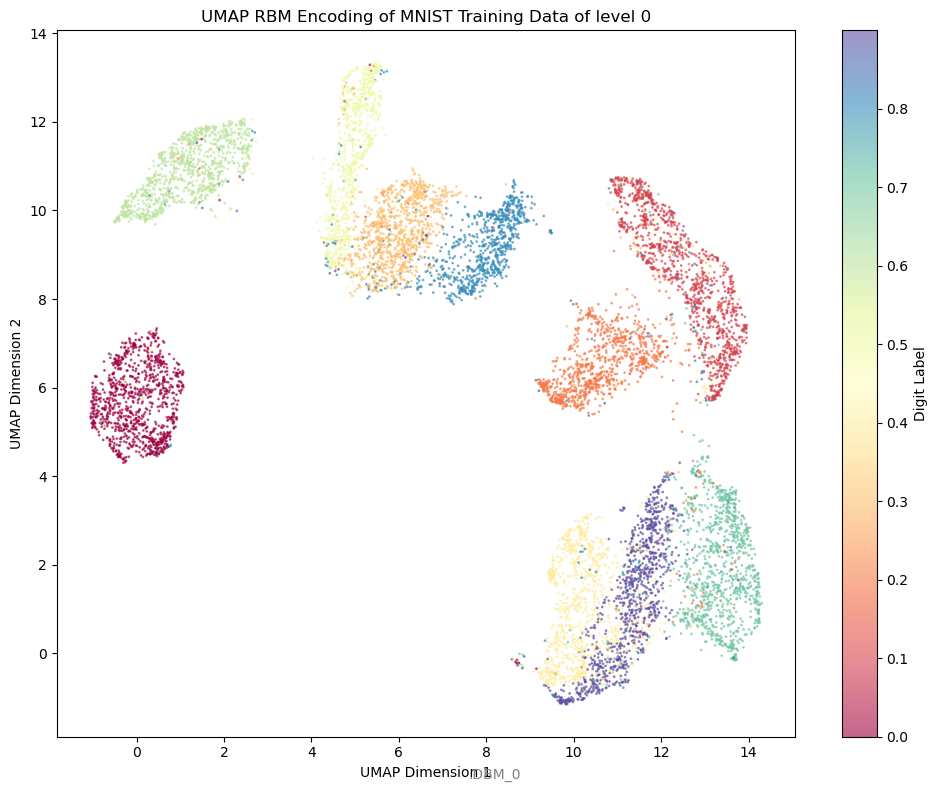

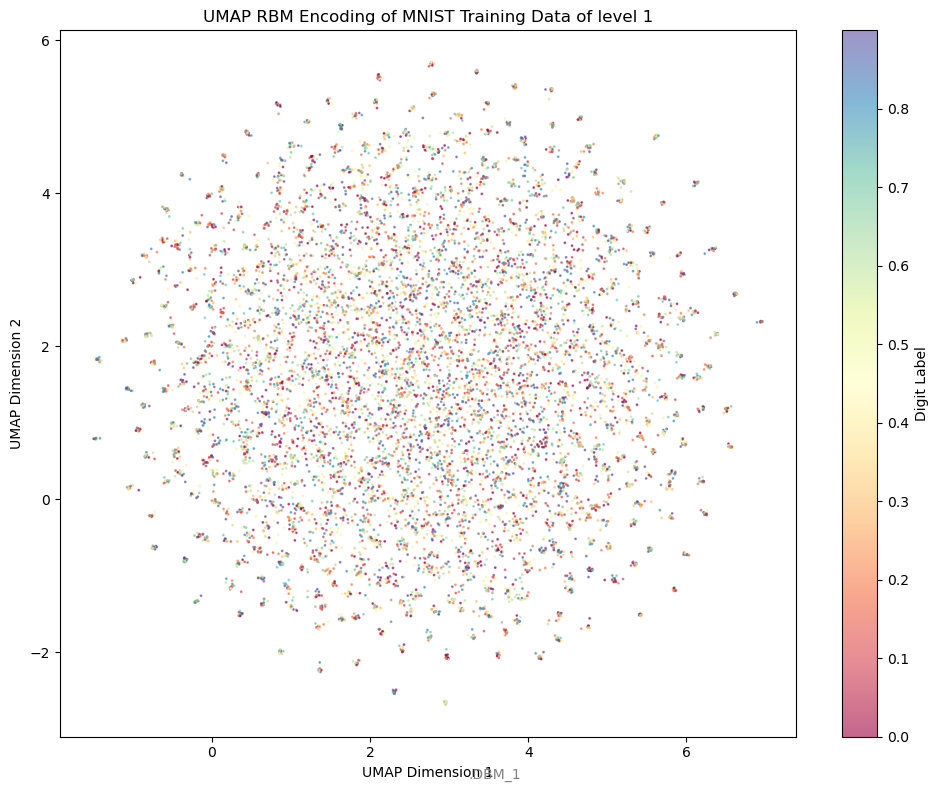

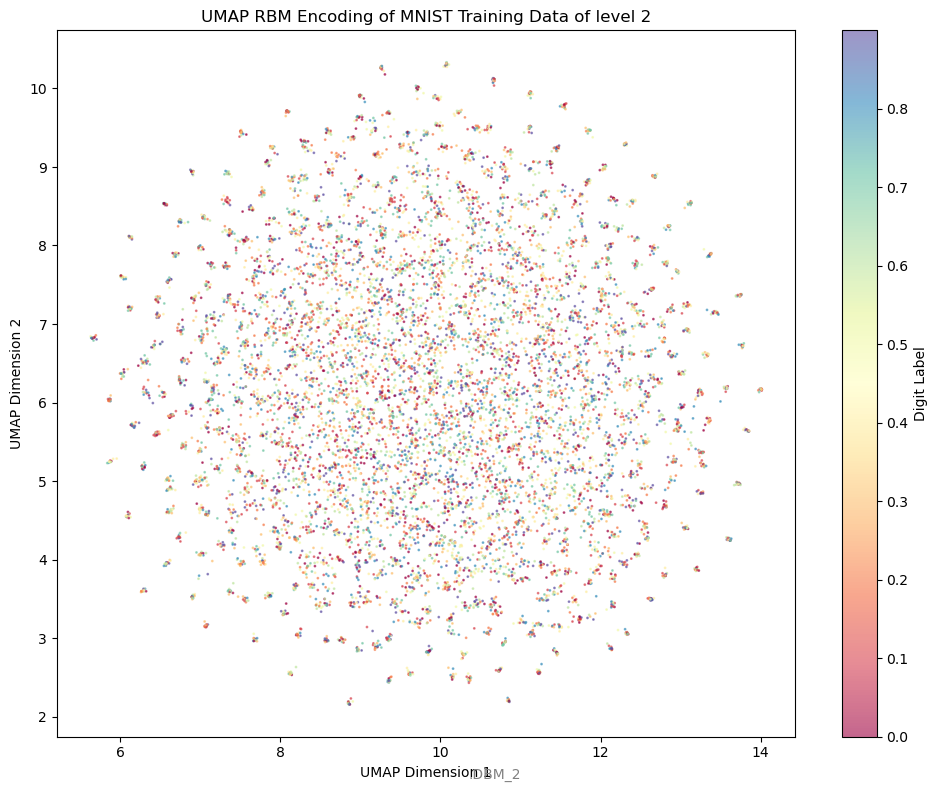

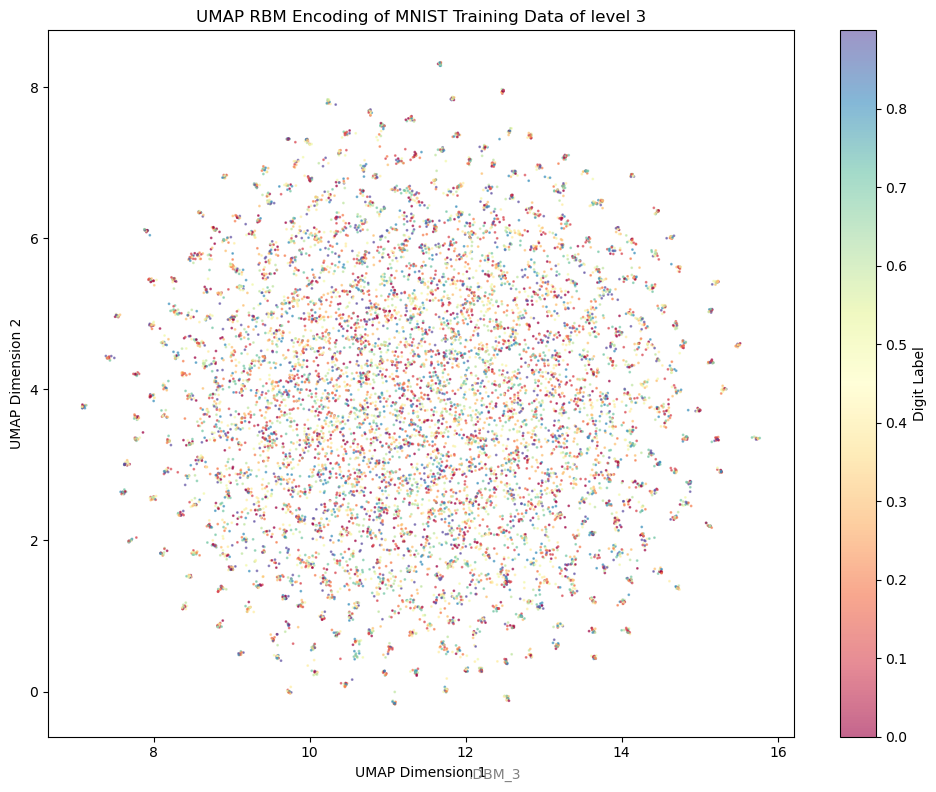

In [76]:
def evaluate_dbm(dbm:DBM, dataloader: DataLoader, directory: str, gibbs_iterations: int=10000) -> None:
    '''
    Evaluate the DBM
    '''
    if (not os.path.exists(directory)):
        os.makedirs(directory)        

    if (dbm.gaussian_top):
        variable_size = len(dbm.layers)+2
    else:
        variable_size = len(dbm.layers)+1
    variables = [[] for _ in range(variable_size)]
    for data, label in dataloader:
        for index in range(variable_size):
            if (index == 0):
                variables[index].append(data)
            elif (index == len(dbm.layers)+1):
                variables[index].append(label.to(torch.float64).unsqueeze(1))
            else:
                variables[index].append(dbm.generate_latent_sample_for_layer(index, data))
    
    tensor_variables = []
    for variable in variables:
        tensor_variables.append(torch.cat(variable))
    mcmc_loader = DataLoader(TensorDataset(*tensor_variables), batch_size=dbm.batch_size, shuffle=False)
    mcmc_loader, _ = dbm.gibbs_update_dataloader(mcmc_loader, gibbs_iterations)

    variables = mcmc_loader.dataset.tensors
    _, labels = dataloader.dataset.tensors
    visualize_data(dataloader, 0, directory+"DBM_0", showplot=True)
    for index in range(len(dbm.layers)):
        hidden_vars = variables[index+1]
        hidden_loader = DataLoader(TensorDataset(hidden_vars, labels), batch_size=dbm.batch_size, shuffle=False)
        savefig = directory + "DBM_{}".format(index+1)
        visualize_data(hidden_loader, index+1, savefig, showplot=True)
evaluate_dbm(dbm, data_loader, ".")